In [1]:
setwd('~/Downloads/proj/')

library(data.table)
library(edgeR)
library(EDASeq)
library(RUVSeq)
library(affycoretools)
library(ggplot2)
library(DESeq2)
library(pheatmap)
library(ggpubr)
library(fgsea)
library(clusterProfiler)
library(org.Hs.eg.db)
require(dplyr)
require(stringr)

# project directories, and libraries loaded and saving total number of patients

MM_cell_line = data.frame(fread("HMCL66_HTSeq_GENE_Counts_v3.txt"))
MM_patients = data.frame(fread("MMRF_CoMMpass_IA13a_E74GTF_HtSeq_Gene_Counts.txt"))

num_pat_tot = length(MM_patients[2,])
num_cell_line_tot = length(MM_cell_line[2,])

# checking total number of patients and cell lines and output head

head(MM_cell_line)
head(MM_patients)
print(num_pat_tot)
print(num_cell_line_tot)

Loading required package: limma
Loading required package: Biobase
Loading required package: BiocGenerics
Loading required package: parallel

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following object is masked from ‘package:limma’:

    plotMA

The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colMeans,
    colnames, colSums, dirname, do.call, duplicated, eval, evalq,
    Filter, Find, get, grep, grepl, intersect, is.unsorted, lapply,
    lengths, Map, mapply, match, mget, order, paste, pmax, pmax.int,
    pmin, pmin.int, Position, rank, rbind, Reduce, rowMeans, rownames,
    rowSums, sapply, setdiff, sort, tab

Sample,GENE_NAME,ALMC1,ALMC2,AMO1,ANBL6,COLO677,Delta47,DP6,EJM,⋯,RPMI8226,SKMM1,SKMM2,U266,UTMC2,VP6,XG1,XG2,XG6,XG7
<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,TSPAN6,2,0,100,2,0,0,2,88,⋯,2,0,0,0,0,0,0,0,2,114
ENSG00000000005,TNMD,1,0,0,0,1,0,0,0,⋯,0,1,0,0,0,0,0,0,0,0
ENSG00000000419,DPM1,3949,4134,4795,8278,2262,2587,3607,2450,⋯,2694,1247,3263,3044,3108,4538,7336,4430,9279,13828
ENSG00000000457,SCYL3,1597,1513,2412,1988,1530,926,1415,573,⋯,665,994,497,1611,1603,1375,1426,893,1540,1660
ENSG00000000460,C1orf112,3072,1488,2193,4091,3208,1170,3614,1618,⋯,1472,1517,1346,2068,3128,1850,2522,2320,793,689
ENSG00000000938,FGR,0,22,701,5,2,4,89,4,⋯,0,125,777,50,1890,2315,1514,5,3776,847


GENE_ID,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2531_2_PB,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2089_2_BM,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,17,999,85,9,801,20,12,16,4,⋯,2,186,102,347,128,17,11,3,18,6
ENSG00000000005,1,0,0,2,3,0,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0
ENSG00000000419,1495,3271,2303,1234,1896,4400,2013,1745,1698,⋯,2459,1269,337,3347,1049,2545,1625,1253,1905,683
ENSG00000000457,231,809,203,1208,425,2793,710,922,853,⋯,734,771,327,392,90,406,857,548,808,393
ENSG00000000460,87,319,31,183,85,929,174,292,837,⋯,267,104,114,126,17,67,196,141,199,55
ENSG00000000938,318,105,119,190,2064,2952,12,351,498,⋯,46,14,303,2007,58,77,1037,11,174,22


[1] 893
[1] 68


In [2]:
# finding genes in common and creating character vector of Ensembl Gene IDs

ensembl_intersect = intersect(MM_cell_line$Sample, MM_patients$GENE_ID)

length(ensembl_intersect)

# assigning rownames as ensembl gene IDs so as to be able to parse by ensembl Gene IDs

rownames(MM_cell_line) = MM_cell_line$Sample
rownames(MM_patients) = MM_patients$GENE_ID

# removing gene ID and gene name columns 
# and saving them in a separate place 
# note only those available in MM_cell_line
# also filtering out genes in common
# and fusing them into a single dataframe
# and filtering for only newly diagnosed patients
# to be kept in a separate data frame

ensembl_ids = MM_cell_line[,1]
MM_cell_line = MM_cell_line[, -1]
gene_names = MM_cell_line[,1]
gene_info = cbind(ensembl_ids, gene_names)

MM_cell_line = MM_cell_line[,-1]
MM_cell_line = MM_cell_line[ensembl_intersect, ]
MM_patients = MM_patients[ensembl_intersect, -1]

MM_patient_ids = data.frame(colnames(MM_patients))
MM_patients_new = filter(MM_patient_ids, str_extract(MM_patient_ids[,1], "_[0-9]_") == "_1_")
keepc = colnames(MM_patients) %in% MM_patients_new[,1]
MM_patients_nd = MM_patients[,keepc]

MM_combined = cbind(MM_cell_line, MM_patients)

# checking output head to confirm removal

head(MM_cell_line)
head(MM_patients)
head(MM_combined)
head(gene_info)

# saving number of newly diagnosed patients and printing out percentage

num_new_pat = length(MM_patients_nd[2,])
print(num_new_pat)
print((num_new_pat/num_pat_tot)*100)

[1] 48637

,ALMC1,ALMC2,AMO1,ANBL6,COLO677,Delta47,DP6,EJM,FLAM76,FR4,⋯,RPMI8226,SKMM1,SKMM2,U266,UTMC2,VP6,XG1,XG2,XG6,XG7
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,2,0,100,2,0,0,2,88,4,0,⋯,2,0,0,0,0,0,0,0,2,114
ENSG00000000005,1,0,0,0,1,0,0,0,0,0,⋯,0,1,0,0,0,0,0,0,0,0
ENSG00000000419,3949,4134,4795,8278,2262,2587,3607,2450,1388,3308,⋯,2694,1247,3263,3044,3108,4538,7336,4430,9279,13828
ENSG00000000457,1597,1513,2412,1988,1530,926,1415,573,1013,1232,⋯,665,994,497,1611,1603,1375,1426,893,1540,1660
ENSG00000000460,3072,1488,2193,4091,3208,1170,3614,1618,1507,1491,⋯,1472,1517,1346,2068,3128,1850,2522,2320,793,689
ENSG00000000938,0,22,701,5,2,4,89,4,2,2271,⋯,0,125,777,50,1890,2315,1514,5,3776,847


,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2531_2_PB,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2089_2_BM,MMRF_2341_1_BM,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,17,999,85,9,801,20,12,16,4,43,⋯,2,186,102,347,128,17,11,3,18,6
ENSG00000000005,1,0,0,2,3,0,0,0,0,1,⋯,0,0,0,0,0,0,1,0,0,0
ENSG00000000419,1495,3271,2303,1234,1896,4400,2013,1745,1698,2403,⋯,2459,1269,337,3347,1049,2545,1625,1253,1905,683
ENSG00000000457,231,809,203,1208,425,2793,710,922,853,1203,⋯,734,771,327,392,90,406,857,548,808,393
ENSG00000000460,87,319,31,183,85,929,174,292,837,478,⋯,267,104,114,126,17,67,196,141,199,55
ENSG00000000938,318,105,119,190,2064,2952,12,351,498,555,⋯,46,14,303,2007,58,77,1037,11,174,22


,ALMC1,ALMC2,AMO1,ANBL6,COLO677,Delta47,DP6,EJM,FLAM76,FR4,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,2,0,100,2,0,0,2,88,4,0,⋯,2,186,102,347,128,17,11,3,18,6
ENSG00000000005,1,0,0,0,1,0,0,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0
ENSG00000000419,3949,4134,4795,8278,2262,2587,3607,2450,1388,3308,⋯,2459,1269,337,3347,1049,2545,1625,1253,1905,683
ENSG00000000457,1597,1513,2412,1988,1530,926,1415,573,1013,1232,⋯,734,771,327,392,90,406,857,548,808,393
ENSG00000000460,3072,1488,2193,4091,3208,1170,3614,1618,1507,1491,⋯,267,104,114,126,17,67,196,141,199,55
ENSG00000000938,0,22,701,5,2,4,89,4,2,2271,⋯,46,14,303,2007,58,77,1037,11,174,22


ensembl_ids,gene_names
ENSG00000000003,TSPAN6
ENSG00000000005,TNMD
ENSG00000000419,DPM1
ENSG00000000457,SCYL3
ENSG00000000460,C1orf112
ENSG00000000938,FGR


[1] 779
[1] 87.23404


In [3]:
# transforming counts of cell_line, patients, and combined 
# to account for sequencing depth
# and creating boolean vector of those genes that
# holds TRUE for genes that account for greater than a millionth
# of total mapped reads in 2 or more samples
# then filtering MM_combined based on this vector
# aka filtering out low count genes

MM_combined_cpm = cpm(MM_combined)
keep = rowSums(MM_combined_cpm > 1) > 2
MM_combined.filtered = MM_combined[keep, ]
MM_patients = MM_patients[keep, ]
MM_cell_line = MM_cell_line[keep, ]

# checking output head and number of low count genes remaining after filtering

head(keep)
head(MM_combined.filtered)
sum(keep)

ENSG00000000003 ENSG00000000005 ENSG00000000419 ENSG00000000457 ENSG00000000460 
           TRUE           FALSE            TRUE            TRUE            TRUE 
ENSG00000000938 
           TRUE

,ALMC1,ALMC2,AMO1,ANBL6,COLO677,Delta47,DP6,EJM,FLAM76,FR4,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,2,0,100,2,0,0,2,88,4,0,⋯,2,186,102,347,128,17,11,3,18,6
ENSG00000000419,3949,4134,4795,8278,2262,2587,3607,2450,1388,3308,⋯,2459,1269,337,3347,1049,2545,1625,1253,1905,683
ENSG00000000457,1597,1513,2412,1988,1530,926,1415,573,1013,1232,⋯,734,771,327,392,90,406,857,548,808,393
ENSG00000000460,3072,1488,2193,4091,3208,1170,3614,1618,1507,1491,⋯,267,104,114,126,17,67,196,141,199,55
ENSG00000000938,0,22,701,5,2,4,89,4,2,2271,⋯,46,14,303,2007,58,77,1037,11,174,22
ENSG00000000971,11,207,24,21,18,8,685,12,28,2,⋯,13,5,28,118,30,18,1865,1680,56,10


[1] 22677

In [4]:
# normalizing combined data frames with vst

norm_combined = vst(as.matrix(MM_combined.filtered))

# checking output head

head(norm_combined)

,ALMC1,ALMC2,AMO1,ANBL6,COLO677,Delta47,DP6,EJM,FLAM76,FR4,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ENSG00000000003,4.631856,4.277689,6.557266,4.591941,4.277689,4.277689,4.633535,6.757867,4.854794,4.277689,⋯,4.724323,7.872087,7.279442,8.892504,8.268661,5.786579,5.238299,4.906192,5.573125,5.539938
ENSG00000000419,11.203503,11.074854,11.494757,11.915436,10.309063,10.999754,11.088513,11.014313,10.141935,11.745230,⋯,11.193842,10.433799,8.751681,12.055311,11.140925,11.779415,10.405654,10.644307,10.820096,10.844967
ENSG00000000457,9.931440,9.668281,10.522303,9.902041,9.765565,9.564948,9.777196,9.002211,9.705423,10.347211,⋯,9.503770,9.740347,8.712015,9.055347,7.830135,9.211329,9.518367,9.494629,9.623449,10.069578
ENSG00000000460,10.847890,9.645371,10.388723,10.913249,10.800240,9.887231,11.091261,10.429430,10.256753,10.615107,⋯,8.168128,7.194023,7.405635,7.612022,6.115524,6.992802,7.613518,7.733282,7.793913,7.505658
ENSG00000000938,4.277689,5.352556,8.827179,4.773110,4.618533,4.851261,6.447215,4.869862,4.687115,11.209973,⋯,6.266877,5.502307,8.612095,11.326184,7.314219,7.142771,9.780425,5.457562,7.633019,6.535104
ENSG00000000971,5.099227,7.152011,5.479271,5.277847,5.282185,5.083673,8.794912,5.289701,5.750034,4.744915,⋯,5.392960,5.023380,6.038515,7.534880,6.621261,5.826595,10.599142,11.058560,6.433822,5.876621


In [5]:
# separating out patient and cell line columns from norm_combined

norm_pat = norm_combined[,colnames(MM_patients)]
norm_cell = norm_combined[,colnames(MM_cell_line)]
norm_pat_nd = norm_combined[,colnames(MM_patients_nd)]

# checking output head

head(norm_pat)
head(norm_cell)
head(norm_pat_nd)

,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2531_2_PB,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2089_2_BM,MMRF_2341_1_BM,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ENSG00000000003,5.763143,9.537185,7.395753,5.308595,9.830803,5.274120,5.550078,5.500219,4.872554,5.880590,⋯,4.724323,7.872087,7.279442,8.892504,8.268661,5.786579,5.238299,4.906192,5.573125,5.539938
ENSG00000000419,10.974725,11.195989,11.818120,10.507028,11.038501,11.074396,11.418836,10.688833,10.510092,10.569849,⋯,11.193842,10.433799,8.751681,12.055311,11.140925,11.779415,10.405654,10.644307,10.820096,10.844967
ENSG00000000457,8.420720,9.249930,8.461872,10.477123,8.968302,10.433395,9.951931,9.797906,9.553685,9.607254,⋯,9.503770,9.740347,8.712015,9.055347,7.830135,9.211329,9.518367,9.494629,9.623449,10.069578
ENSG00000000460,7.240012,8.035522,6.362907,7.950493,7.004830,8.922297,8.080643,8.263642,9.527754,8.376546,⋯,8.168128,7.194023,7.405635,7.612022,6.115524,6.992802,7.613518,7.733282,7.793913,7.505658
ENSG00000000938,8.838641,6.773748,7.792299,7.996890,11.158836,10.511120,5.550078,8.499929,8.827716,8.569701,⋯,6.266877,5.502307,8.612095,11.326184,7.314219,7.142771,9.780425,5.457562,7.633019,6.535104
ENSG00000000971,8.954700,9.660588,9.272141,7.626551,8.452307,12.823135,5.732564,8.006766,9.272567,5.736415,⋯,5.392960,5.023380,6.038515,7.534880,6.621261,5.826595,10.599142,11.058560,6.433822,5.876621


,ALMC1,ALMC2,AMO1,ANBL6,COLO677,Delta47,DP6,EJM,FLAM76,FR4,⋯,RPMI8226,SKMM1,SKMM2,U266,UTMC2,VP6,XG1,XG2,XG6,XG7
ENSG00000000003,4.631856,4.277689,6.557266,4.591941,4.277689,4.277689,4.633535,6.757867,4.854794,4.277689,⋯,4.707500,4.277689,4.277689,4.277689,4.277689,4.277689,4.277689,4.277689,4.628974,6.456153
ENSG00000000419,11.203503,11.074854,11.494757,11.915436,10.309063,10.999754,11.088513,11.014313,10.141935,11.745230,⋯,11.213561,10.093941,11.352302,10.930239,10.590877,11.140197,11.955852,11.043716,12.398838,12.666907
ENSG00000000457,9.931440,9.668281,10.522303,9.902041,9.765565,9.564948,9.777196,9.002211,9.705423,10.347211,⋯,9.264065,9.779521,8.749033,10.037164,9.668741,9.472541,9.649261,8.832004,9.858348,9.669506
ENSG00000000460,10.847890,9.645371,10.388723,10.913249,10.800240,9.887231,11.091261,10.429430,10.256753,10.615107,⋯,10.360803,10.367704,10.104580,10.385818,10.599902,9.880745,10.441824,10.134136,8.954919,8.491219
ENSG00000000938,4.277689,5.352556,8.827179,4.773110,4.618533,4.851261,6.447215,4.869862,4.687115,11.209973,⋯,4.277689,7.148103,9.347799,6.008208,9.896101,10.192478,9.731689,4.776205,11.116661,8.761160
ENSG00000000971,5.099227,7.152011,5.479271,5.277847,5.282185,5.083673,8.794912,5.289701,5.750034,4.744915,⋯,7.084740,5.339650,6.334592,4.643934,6.922797,5.655105,6.618223,8.390881,7.857338,7.031385


,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2341_1_BM,MMRF_2501_1_BM,MMRF_1383_1_BM,⋯,MMRF_1731_1_BM,MMRF_2799_1_BM,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ENSG00000000003,5.763143,9.537185,7.395753,5.308595,9.830803,5.550078,5.500219,5.880590,8.990467,10.083930,⋯,4.645601,6.735236,4.724323,7.872087,7.279442,8.268661,5.786579,4.906192,5.573125,5.539938
ENSG00000000419,10.974725,11.195989,11.818120,10.507028,11.038501,11.418836,10.688833,10.569849,10.552441,10.558826,⋯,11.141672,11.864629,11.193842,10.433799,8.751681,11.140925,11.779415,10.644307,10.820096,10.844967
ENSG00000000457,8.420720,9.249930,8.461872,10.477123,8.968302,9.951931,9.797906,9.607254,9.902931,9.853540,⋯,9.373885,8.482865,9.503770,9.740347,8.712015,7.830135,9.211329,9.494629,9.623449,10.069578
ENSG00000000460,7.240012,8.035522,6.362907,7.950493,7.004830,8.080643,8.263642,8.376546,7.712189,7.633277,⋯,7.396229,6.755457,8.168128,7.194023,7.405635,6.115524,6.992802,7.733282,7.793913,7.505658
ENSG00000000938,8.838641,6.773748,7.792299,7.996890,11.158836,5.550078,8.499929,8.569701,5.955129,6.015730,⋯,11.938327,6.672686,6.266877,5.502307,8.612095,7.314219,7.142771,5.457562,7.633019,6.535104
ENSG00000000971,8.954700,9.660588,9.272141,7.626551,8.452307,5.732564,8.006766,5.736415,6.367379,5.769675,⋯,11.685182,6.187998,5.392960,5.023380,6.038515,6.621261,5.826595,11.058560,6.433822,5.876621


In [6]:
# utilizing IQR to get vector of top 5000 and top 10000 genes
# for all and newly diagnosed separately

keepi = apply(norm_pat, 1, IQR)
keepis = sort(keepi, decreasing = TRUE)
keepi5000 = keepi %in% keepis[1:5000]
keepi10000 = keepi %in% keepis[1:10000]

In [7]:
# making function for doing correlation analysis and generating violin plots

makeplots = function(corset, pnames, clnames, titl) {
    
    MM.cor.v = cor(corset, method = "s")

    #clnames = colnames(MM_cell_line)
    tumor_cell_all = data.frame()

    for(patients in pnames){
        cell_line_tumor_cor = MM.cor.v[patients, clnames]
        cell_line_tumor_cor = data.frame(patient = patients, 
                                         sample = names(cell_line_tumor_cor), cor = cell_line_tumor_cor)
        tumor_cell_all = rbind(tumor_cell_all, cell_line_tumor_cor)
    }

    cell_line_order <- aggregate(cor ~ sample, tumor_cell_all, median)
    cell_line_ordered <- cell_line_order$sample[order(cell_line_order$cor, decreasing=T)]
    tumor_cell_all$sample = factor(tumor_cell_all$sample, levels = cell_line_ordered)

      p <- ggplot(tumor_cell_all, aes(sample, cor))
      print(p + geom_violin()  +  ylab("correlation") + geom_boxplot(width=0.2) + ylab('R') +
              xlab("") + labs(title = titl) +
              stat_summary(geom = "crossbar", width=0.2, fatten=2, color="red", 
                           fun.data = function(x){ return(c(y=median(x), ymin=median(x), ymax=median(x))) }) +  
            theme(panel.background = element_rect(color = 'white'), 
                  axis.text.x = element_text(angle = 70, hjust = 1, size=8))# + stat_compare_means()
      )
   # return(cell_line_order)
}

In [8]:
# subsetting top 5000 / 10000 genes for all patients,

norm_combined_5 = norm_combined[keepi5000,]
norm_combined_10 = norm_combined[keepi10000,]

# checking output head

head(norm_combined_5)
head(norm_combined_10)

,ALMC1,ALMC2,AMO1,ANBL6,COLO677,Delta47,DP6,EJM,FLAM76,FR4,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ENSG00000000003,4.631856,4.277689,6.557266,4.591941,4.277689,4.277689,4.633535,6.757867,4.854794,4.277689,⋯,4.724323,7.872087,7.279442,8.892504,8.268661,5.786579,5.238299,4.906192,5.573125,5.539938
ENSG00000000460,10.847890,9.645371,10.388723,10.913249,10.800240,9.887231,11.091261,10.429430,10.256753,10.615107,⋯,8.168128,7.194023,7.405635,7.612022,6.115524,6.992802,7.613518,7.733282,7.793913,7.505658
ENSG00000000938,4.277689,5.352556,8.827179,4.773110,4.618533,4.851261,6.447215,4.869862,4.687115,11.209973,⋯,6.266877,5.502307,8.612095,11.326184,7.314219,7.142771,9.780425,5.457562,7.633019,6.535104
ENSG00000000971,5.099227,7.152011,5.479271,5.277847,5.282185,5.083673,8.794912,5.289701,5.750034,4.744915,⋯,5.392960,5.023380,6.038515,7.534880,6.621261,5.826595,10.599142,11.058560,6.433822,5.876621
ENSG00000001561,11.299764,11.117408,10.699169,9.186855,8.748253,10.206546,11.290563,9.731783,10.226765,9.290325,⋯,12.204722,9.798182,7.611145,10.935838,8.829046,10.531100,10.341254,10.757729,10.380698,10.913626
ENSG00000002586,9.380980,6.053948,7.358972,5.070450,10.986954,4.565888,6.487835,4.791415,11.911219,4.744915,⋯,6.041618,6.413483,7.000104,9.279818,8.572020,14.222973,7.211198,6.001932,6.240530,8.344365


,ALMC1,ALMC2,AMO1,ANBL6,COLO677,Delta47,DP6,EJM,FLAM76,FR4,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ENSG00000000003,4.631856,4.277689,6.557266,4.591941,4.277689,4.277689,4.633535,6.757867,4.854794,4.277689,⋯,4.724323,7.872087,7.279442,8.892504,8.268661,5.786579,5.238299,4.906192,5.573125,5.539938
ENSG00000000460,10.847890,9.645371,10.388723,10.913249,10.800240,9.887231,11.091261,10.429430,10.256753,10.615107,⋯,8.168128,7.194023,7.405635,7.612022,6.115524,6.992802,7.613518,7.733282,7.793913,7.505658
ENSG00000000938,4.277689,5.352556,8.827179,4.773110,4.618533,4.851261,6.447215,4.869862,4.687115,11.209973,⋯,6.266877,5.502307,8.612095,11.326184,7.314219,7.142771,9.780425,5.457562,7.633019,6.535104
ENSG00000000971,5.099227,7.152011,5.479271,5.277847,5.282185,5.083673,8.794912,5.289701,5.750034,4.744915,⋯,5.392960,5.023380,6.038515,7.534880,6.621261,5.826595,10.599142,11.058560,6.433822,5.876621
ENSG00000001036,7.000852,10.211069,11.720964,11.135435,11.981179,10.888896,12.285082,11.033829,10.532772,11.783527,⋯,12.260334,9.971185,9.404070,11.306221,11.451127,12.650701,10.817835,10.819745,9.417302,10.881722
ENSG00000001460,6.375282,7.362978,8.140026,6.693884,6.926282,8.792218,7.409434,8.374054,7.762386,8.781882,⋯,7.110550,8.295360,6.986582,7.937612,6.653137,7.514923,7.170436,7.250312,7.388043,7.060976


In [9]:
head(norm_combined_5)

,ALMC1,ALMC2,AMO1,ANBL6,COLO677,Delta47,DP6,EJM,FLAM76,FR4,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ENSG00000000003,4.631856,4.277689,6.557266,4.591941,4.277689,4.277689,4.633535,6.757867,4.854794,4.277689,⋯,4.724323,7.872087,7.279442,8.892504,8.268661,5.786579,5.238299,4.906192,5.573125,5.539938
ENSG00000000460,10.847890,9.645371,10.388723,10.913249,10.800240,9.887231,11.091261,10.429430,10.256753,10.615107,⋯,8.168128,7.194023,7.405635,7.612022,6.115524,6.992802,7.613518,7.733282,7.793913,7.505658
ENSG00000000938,4.277689,5.352556,8.827179,4.773110,4.618533,4.851261,6.447215,4.869862,4.687115,11.209973,⋯,6.266877,5.502307,8.612095,11.326184,7.314219,7.142771,9.780425,5.457562,7.633019,6.535104
ENSG00000000971,5.099227,7.152011,5.479271,5.277847,5.282185,5.083673,8.794912,5.289701,5.750034,4.744915,⋯,5.392960,5.023380,6.038515,7.534880,6.621261,5.826595,10.599142,11.058560,6.433822,5.876621
ENSG00000001561,11.299764,11.117408,10.699169,9.186855,8.748253,10.206546,11.290563,9.731783,10.226765,9.290325,⋯,12.204722,9.798182,7.611145,10.935838,8.829046,10.531100,10.341254,10.757729,10.380698,10.913626
ENSG00000002586,9.380980,6.053948,7.358972,5.070450,10.986954,4.565888,6.487835,4.791415,11.911219,4.744915,⋯,6.041618,6.413483,7.000104,9.279818,8.572020,14.222973,7.211198,6.001932,6.240530,8.344365


In [10]:
write.csv(rownames(norm_combined_5), '~/Downloads/proj/fivekgenes.csv')

In [11]:
# saving correlation tables for all patients,for top 5000 and 10000 most variable genes

MM.cor.keats_5 = cor(norm_combined_5, method = "s")
MM.cor.keats_5 = MM.cor.keats_5[colnames(MM_patients), colnames(MM_cell_line)]

MM.cor.keats_10 = cor(norm_combined_10, method = "s")
MM.cor.keats_10 = MM.cor.keats_10[colnames(MM_patients), colnames(MM_cell_line)]

# checking output head

head(MM.cor.keats_5)

,ALMC1,ALMC2,AMO1,ANBL6,COLO677,Delta47,DP6,EJM,FLAM76,FR4,⋯,RPMI8226,SKMM1,SKMM2,U266,UTMC2,VP6,XG1,XG2,XG6,XG7
MMRF_2801_1_BM,0.4517749,0.4349749,0.4286582,0.4822847,0.4359017,0.3972648,0.3971391,0.4149805,0.4233515,0.3452179,⋯,0.4516974,0.3766863,0.4153700,0.3859249,0.3398826,0.4064589,0.3891746,0.3850782,0.3819718,0.3817107
MMRF_2718_1_BM,0.4581244,0.4431644,0.4038416,0.4653616,0.3949765,0.3453951,0.3860945,0.4110975,0.4140186,0.3285472,⋯,0.4205938,0.3508619,0.3986400,0.3644461,0.3750175,0.3829601,0.3748100,0.3510870,0.3648719,0.3567384
MMRF_2815_1_BM,0.4868771,0.4787737,0.4393861,0.4982120,0.4016501,0.3848549,0.4512338,0.4185613,0.4220763,0.3497691,⋯,0.4289724,0.3936808,0.4322049,0.3792175,0.4420574,0.4152898,0.4072691,0.3801919,0.4053549,0.4719518
MMRF_1656_1_BM,0.5550829,0.5661903,0.5050889,0.5649782,0.4854856,0.4713307,0.5534437,0.4912024,0.5269389,0.4215398,⋯,0.4850777,0.4525768,0.5089535,0.4544614,0.4610639,0.5070892,0.4952512,0.5039261,0.5325579,0.5265956
MMRF_2461_1_BM,0.4130272,0.4097795,0.3883913,0.4387081,0.3858632,0.3390691,0.3917873,0.3618470,0.3893378,0.2929299,⋯,0.3805764,0.2939174,0.3382522,0.3363116,0.2933794,0.3530543,0.3509824,0.3355592,0.3888328,0.3784962
MMRF_2531_2_PB,0.5867580,0.6231016,0.5915989,0.6099328,0.5379066,0.4859530,0.6272871,0.5618400,0.5438244,0.4738110,⋯,0.5375639,0.5169209,0.5658505,0.5283888,0.5861316,0.5713569,0.5726294,0.5650216,0.5306605,0.6052676


In [12]:
head(MM.cor.keats_5)

MM.cor_iqr = apply(MM.cor.keats_5, 2, IQR)
MM.cor_means = apply(MM.cor.keats_5, 2, mean)
MM.cor_quantile = apply(MM.cor.keats_5, 2, quantile)
MM.cor_range = apply(MM.cor.keats_5, 2, range)
MM.cor_range = (MM.cor_range[2,]-MM.cor_range[1,])
head(MM.cor_iqr)
head(MM.cor_means)
head(t(MM.cor_quantile))
head(MM.cor_range)

MM.cor_st = cbind(t(MM.cor_quantile), MM.cor_range)
MM.cor_st = cbind(MM.cor_st, MM.cor_iqr)
MM.cor_st = cbind(MM.cor_st, MM.cor_means)
colnames(MM.cor_st) = c('Least', 'First Quartile', 'Median', 'Third Quartile', 'Greatest', 'Range', 'IQR', 'Means')
head(MM.cor_st)
write.csv(MM.cor_st, '~/Downloads/proj/MM.cor_st.csv')

,ALMC1,ALMC2,AMO1,ANBL6,COLO677,Delta47,DP6,EJM,FLAM76,FR4,⋯,RPMI8226,SKMM1,SKMM2,U266,UTMC2,VP6,XG1,XG2,XG6,XG7
MMRF_2801_1_BM,0.4517749,0.4349749,0.4286582,0.4822847,0.4359017,0.3972648,0.3971391,0.4149805,0.4233515,0.3452179,⋯,0.4516974,0.3766863,0.4153700,0.3859249,0.3398826,0.4064589,0.3891746,0.3850782,0.3819718,0.3817107
MMRF_2718_1_BM,0.4581244,0.4431644,0.4038416,0.4653616,0.3949765,0.3453951,0.3860945,0.4110975,0.4140186,0.3285472,⋯,0.4205938,0.3508619,0.3986400,0.3644461,0.3750175,0.3829601,0.3748100,0.3510870,0.3648719,0.3567384
MMRF_2815_1_BM,0.4868771,0.4787737,0.4393861,0.4982120,0.4016501,0.3848549,0.4512338,0.4185613,0.4220763,0.3497691,⋯,0.4289724,0.3936808,0.4322049,0.3792175,0.4420574,0.4152898,0.4072691,0.3801919,0.4053549,0.4719518
MMRF_1656_1_BM,0.5550829,0.5661903,0.5050889,0.5649782,0.4854856,0.4713307,0.5534437,0.4912024,0.5269389,0.4215398,⋯,0.4850777,0.4525768,0.5089535,0.4544614,0.4610639,0.5070892,0.4952512,0.5039261,0.5325579,0.5265956
MMRF_2461_1_BM,0.4130272,0.4097795,0.3883913,0.4387081,0.3858632,0.3390691,0.3917873,0.3618470,0.3893378,0.2929299,⋯,0.3805764,0.2939174,0.3382522,0.3363116,0.2933794,0.3530543,0.3509824,0.3355592,0.3888328,0.3784962
MMRF_2531_2_PB,0.5867580,0.6231016,0.5915989,0.6099328,0.5379066,0.4859530,0.6272871,0.5618400,0.5438244,0.4738110,⋯,0.5375639,0.5169209,0.5658505,0.5283888,0.5861316,0.5713569,0.5726294,0.5650216,0.5306605,0.6052676


ALMC1      ALMC2       AMO1      ANBL6    COLO677    Delta47 
0.07556281 0.07774014 0.06325633 0.06520955 0.06609675 0.07069887

ALMC1     ALMC2      AMO1     ANBL6   COLO677   Delta47 
0.5069344 0.4984176 0.4620404 0.5382740 0.4395895 0.4176338

,0%,25%,50%,75%,100%
ALMC1,0.3124092,0.4679888,0.5069705,0.5435516,0.6687289
ALMC2,0.3150660,0.4579313,0.4960372,0.5356715,0.6782572
AMO1,0.2972202,0.4284578,0.4610821,0.4917141,0.6270198
ANBL6,0.3461867,0.5044753,0.5383342,0.5696848,0.7428391
COLO677,0.3080433,0.4015279,0.4369714,0.4676246,0.6294232
Delta47,0.2636111,0.3811383,0.4160010,0.4518372,0.6395860


ALMC1     ALMC2      AMO1     ANBL6   COLO677   Delta47 
0.3563197 0.3631912 0.3297996 0.3966525 0.3213799 0.3759749

,Least,First Quartile,Median,Third Quartile,Greatest,Range,IQR,Means
ALMC1,0.3124092,0.4679888,0.5069705,0.5435516,0.6687289,0.3563197,0.07556281,0.5069344
ALMC2,0.3150660,0.4579313,0.4960372,0.5356715,0.6782572,0.3631912,0.07774014,0.4984176
AMO1,0.2972202,0.4284578,0.4610821,0.4917141,0.6270198,0.3297996,0.06325633,0.4620404
ANBL6,0.3461867,0.5044753,0.5383342,0.5696848,0.7428391,0.3966525,0.06520955,0.5382740
COLO677,0.3080433,0.4015279,0.4369714,0.4676246,0.6294232,0.3213799,0.06609675,0.4395895
Delta47,0.2636111,0.3811383,0.4160010,0.4518372,0.6395860,0.3759749,0.07069887,0.4176338


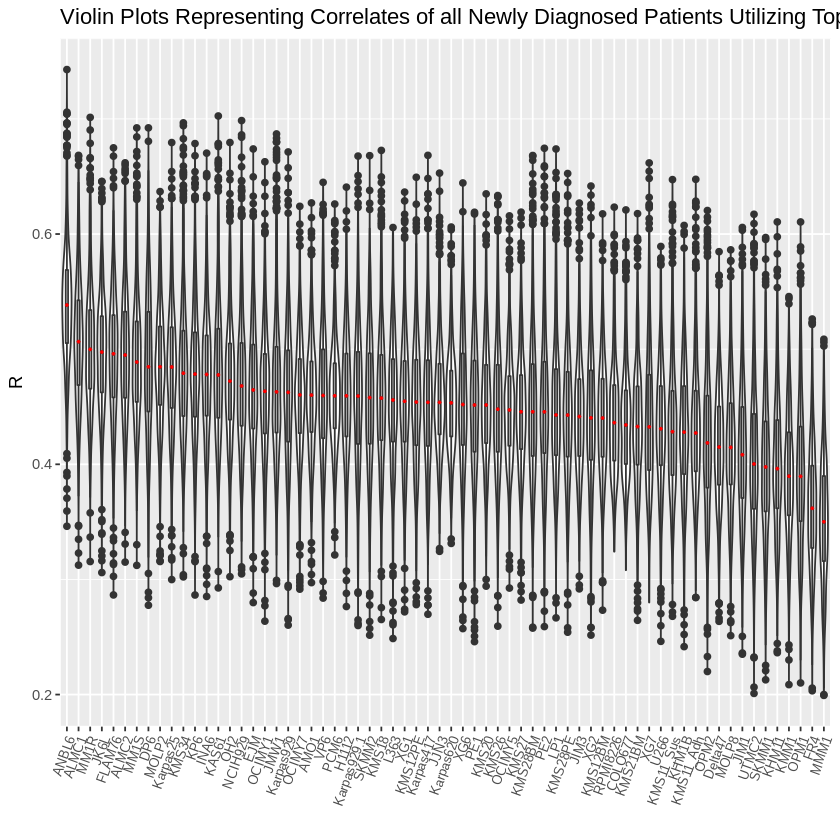

In [13]:
# subsetting for newly diagnosed patients 

norm_combined_5_nd = cbind(norm_combined_5[,colnames(MM_cell_line)], 
                           norm_combined_5[,colnames(MM_patients_nd)])

# plots for main analysis using top 5000 genes

# options(repr.plot.width = 12, repr.plot.height = 12)

makeplots(norm_combined_5_nd, colnames(MM_patients_nd), colnames(MM_cell_line), 'Violin Plots Representing Correlates of all Newly Diagnosed Patients Utilizing Top 5000 most variably expressed Genes as determined by IQR')

,cor,type,rank
,<dbl>,<chr>,<int>
ALMC1,0.5066608,5000 Most Variable Genes,2
ALMC2,0.4967268,5000 Most Variable Genes,4
AMO1,0.4595980,5000 Most Variable Genes,26
ANBL6,0.5379676,5000 Most Variable Genes,1
COLO677,0.4367230,5000 Most Variable Genes,50
Delta47,0.4158869,5000 Most Variable Genes,58


,cor,type,rank
,<dbl>,<chr>,<int>
ALMC1,0.6973418,10000 Most Variable Genes,2
ALMC2,0.6928485,10000 Most Variable Genes,4
AMO1,0.6586324,10000 Most Variable Genes,32
ANBL6,0.7163193,10000 Most Variable Genes,1
COLO677,0.6363937,10000 Most Variable Genes,53
Delta47,0.6265948,10000 Most Variable Genes,58


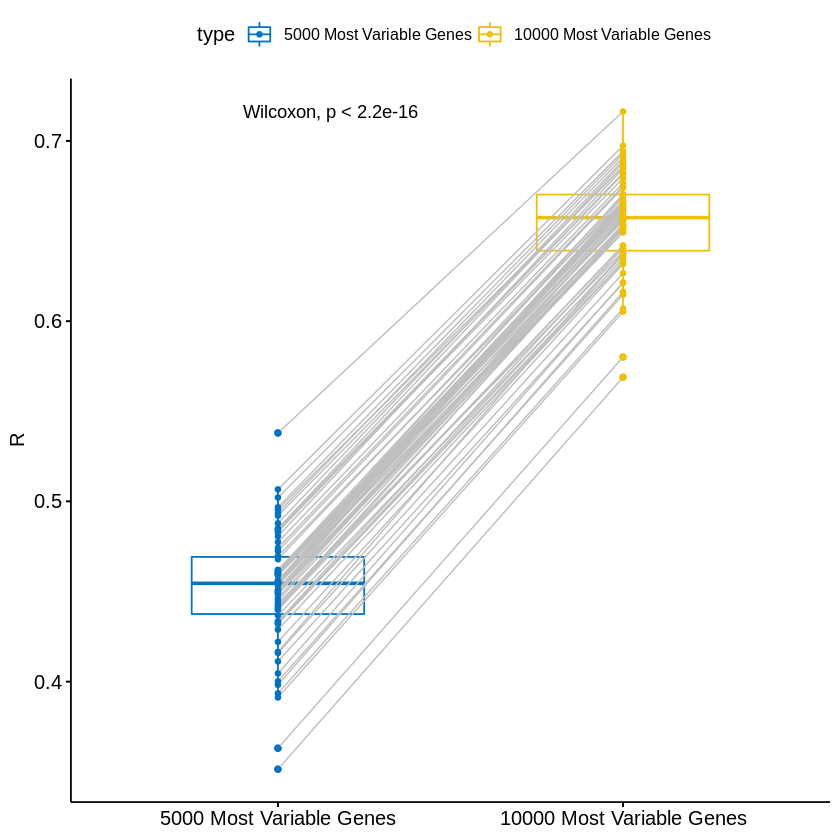

,Top 5000 Most Variable Genes,Top 10000 Most Variable Genes
,<int>,<int>
ANBL6,1,1
ALMC1,2,2
MM1R,3,3
ALMC2,4,4
JK6L,5,9
FLAM76,6,5


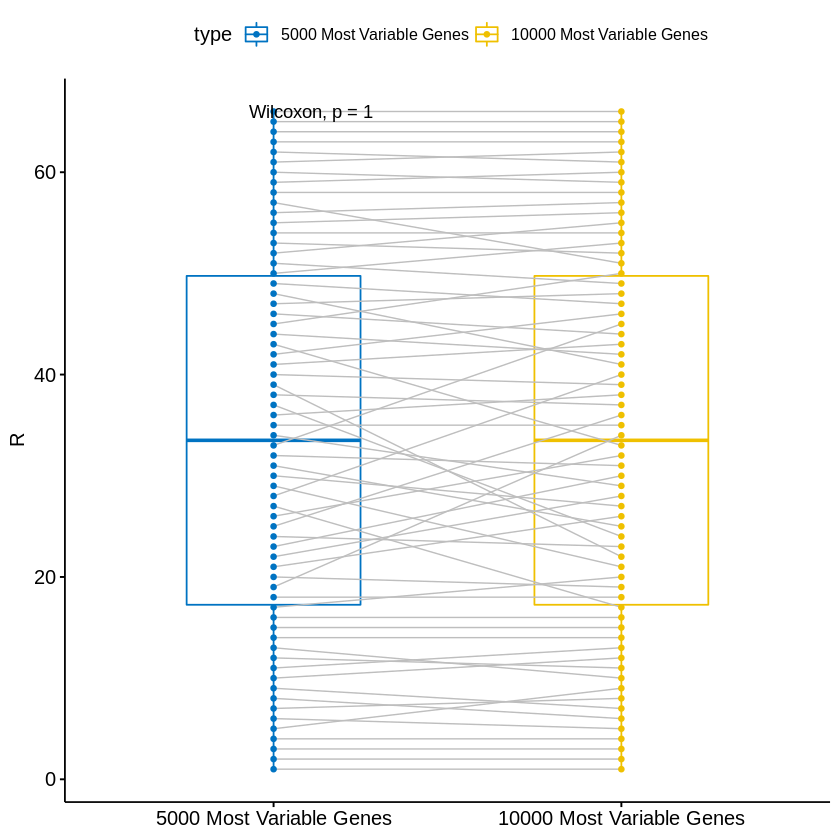

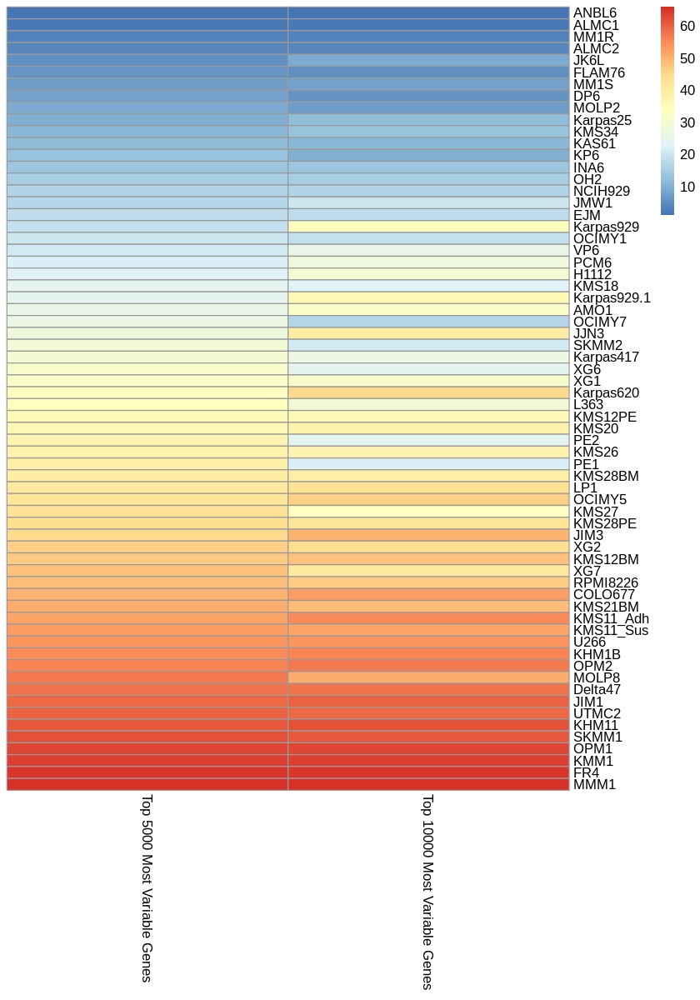

In [14]:
# creating vector of 1:number of cell lines for assigning rank

rank_gen = c(1:length(colnames(MM_cell_line)))

# getting patient correlate means for each cell lines, then assigning rank and type 
# for top 5 and 10 thousand most varuable genes

MM.cor.keats_5_nd = MM.cor.keats_5[colnames(MM_patients_nd),]
MM.cor.keats_5_nd_means = data.frame(colMeans(MM.cor.keats_5_nd))
MM.cor.keats_5_nd_means_ranks = MM.cor.keats_5_nd_means
MM.cor.keats_5_nd_means_ranks$type = '5000 Most Variable Genes'
colnames(MM.cor.keats_5_nd_means_ranks) = c('cor', 'type')
MM.cor.keats_5_nd_means_ranks = MM.cor.keats_5_nd_means_ranks[order(-MM.cor.keats_5_nd_means_ranks$cor),]
MM.cor.keats_5_nd_means_ranks$rank = rank_gen
MM.cor.keats_5_nd_means_ranks = MM.cor.keats_5_nd_means_ranks[order(rownames(MM.cor.keats_5_nd_means_ranks)),]

MM.cor.keats_10_nd = MM.cor.keats_10[colnames(MM_patients_nd),]
MM.cor.keats_10_nd_means = data.frame(colMeans(MM.cor.keats_10_nd))
MM.cor.keats_10_nd_means_ranks = MM.cor.keats_10_nd_means
MM.cor.keats_10_nd_means_ranks$type = '10000 Most Variable Genes'
colnames(MM.cor.keats_10_nd_means_ranks) = c('cor', 'type')
MM.cor.keats_10_nd_means_ranks = MM.cor.keats_10_nd_means_ranks[order(-MM.cor.keats_10_nd_means_ranks$cor),]
MM.cor.keats_10_nd_means_ranks$rank = rank_gen
MM.cor.keats_10_nd_means_ranks = MM.cor.keats_10_nd_means_ranks[order(rownames(MM.cor.keats_10_nd_means_ranks)),]

# checking output head

head(MM.cor.keats_5_nd_means_ranks)
head(MM.cor.keats_10_nd_means_ranks)

# paired boxplot comparing correlate means and ranks w/ wilcoxon rank sum test

ggpaired(rbind(MM.cor.keats_5_nd_means_ranks, MM.cor.keats_10_nd_means_ranks), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggpaired(rbind(MM.cor.keats_5_nd_means_ranks, MM.cor.keats_10_nd_means_ranks), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# prepping fused data frame of ranks (5000 v 10000 most variable genes) for heatmap

five10_bound = cbind(MM.cor.keats_5_nd_means_ranks, MM.cor.keats_10_nd_means_ranks)
five10_bound = five10_bound[-1]
five10_bound = five10_bound[-1]
five10_bound = five10_bound[-2]
five10_bound = five10_bound[-2]
colnames(five10_bound) = c('Top 5000 Most Variable Genes', 'Top 10000 Most Variable Genes')
five10_bound = five10_bound[order(five10_bound[,1]),]

# checking output head

head(five10_bound)

# making heatap of ranking differences

options(repr.plot.height = 10)

pheatmap(five10_bound, cluster_rows = FALSE, cluster_cols = FALSE)

options(repr.plot.height = 7)

,AMO1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,EJM_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,HUNS1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,JJN3_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KARPAS620_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KE97_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KHM1B_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KMM1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KMS11_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,KMS12BM_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,⋯,L363_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,LP1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,MM1S_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,MOLP2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,MOLP8_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,NCIH929_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,OPM2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,RPMI8226_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,SKMM2_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE,U266B1_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,56,642,15,17,204,13,4,7,14,24,⋯,16,30,22,26,27,26,14,29,16,31
ENSG00000000419,10884,7383,7458,5989,5646,9925,4271,5864,5662,7070,⋯,12073,9589,10297,7354,7369,42842,20907,5507,7197,3544
ENSG00000000457,2572,1482,2286,2691,1948,1876,2182,2068,2849,2044,⋯,4243,5365,3481,2653,3947,5933,3214,1439,1739,1797
ENSG00000000460,3844,2741,5379,3464,2487,2782,2757,2402,5753,4794,⋯,6044,1237,6129,1202,2375,4064,2694,2784,2183,2438
ENSG00000000938,3761,4,17,18,4547,13572,11348,42,2,9,⋯,62,5,20,397,29998,5497,3775,10,1288,369
ENSG00000000971,51,54,18,1617,36,62,11,155,27,12,⋯,18,47,44,31,1328,29,336,440,1044,41


converting counts to integer mode


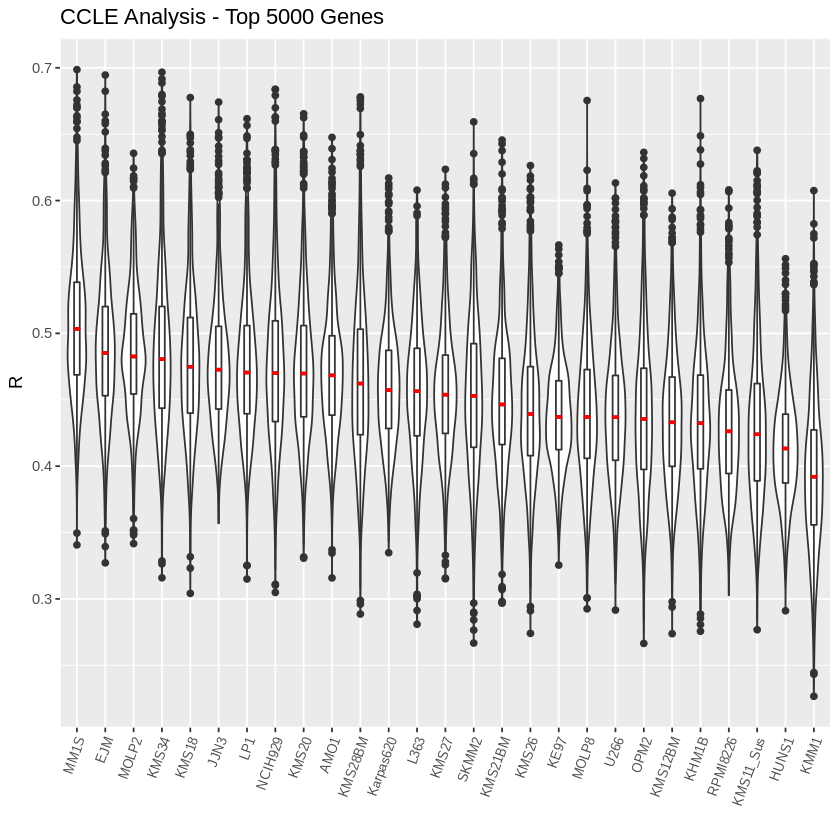

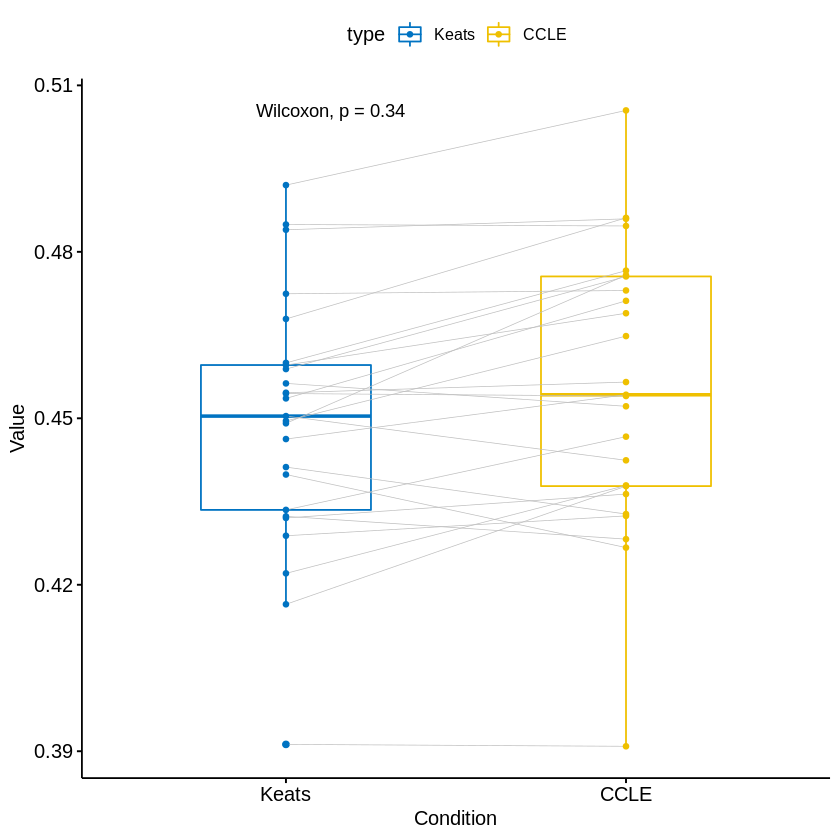

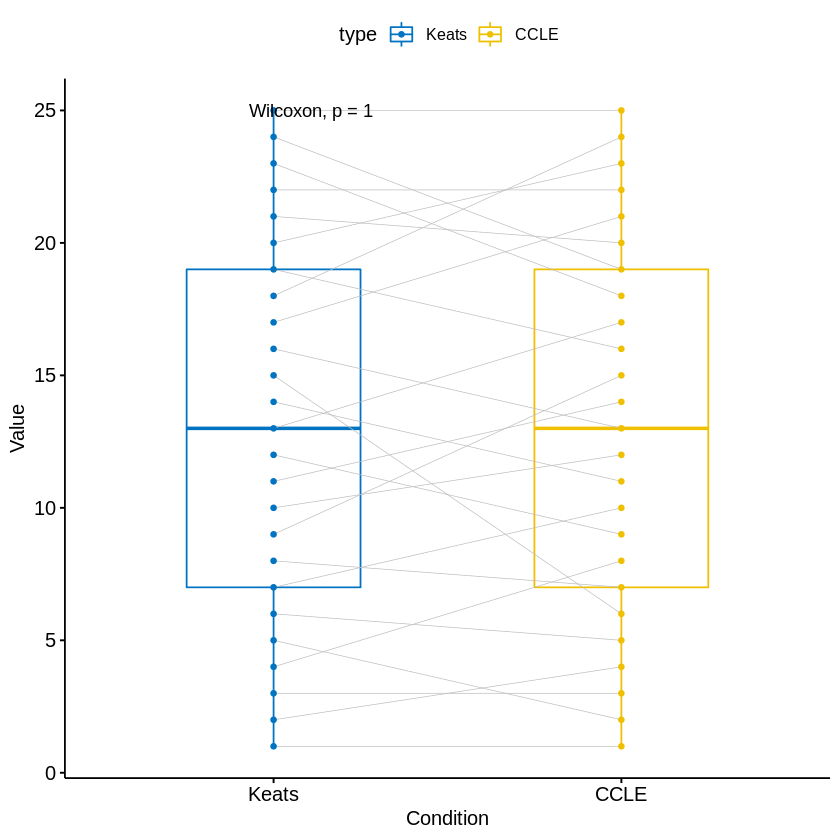

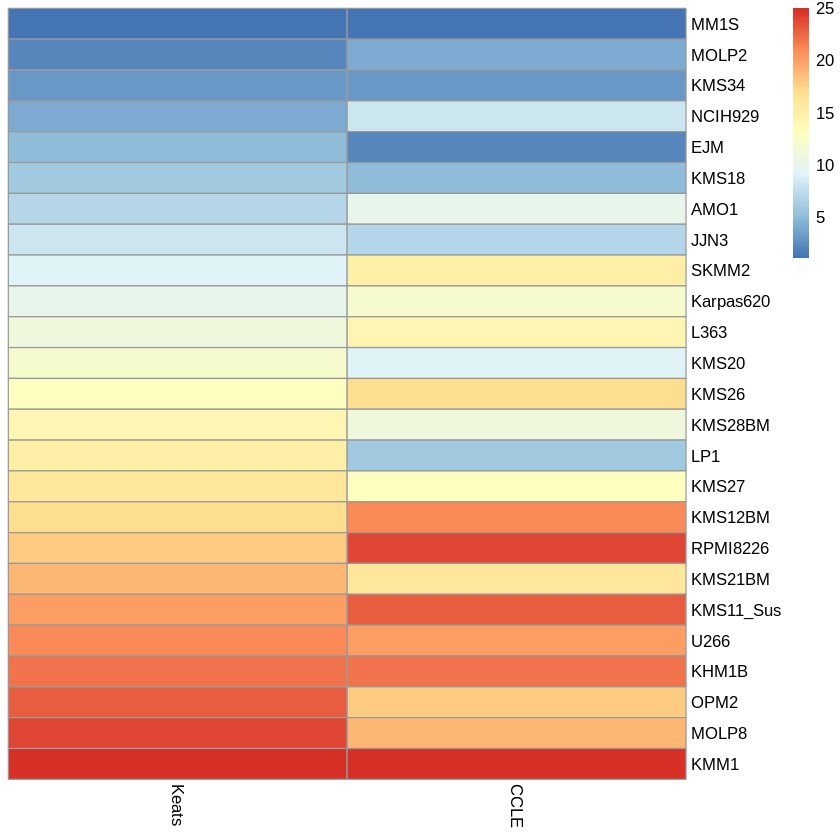

In [15]:

# reading CCLE cell line gene counts and naming rows by ensembl Gene ID

CCLE_cell_line = data.frame(fread("CCLE_RNAseq_genes_counts_20180929.gct"))
gid = CCLE_cell_line$Name
gid2 = substr(gid, 1, 15)
rownames(CCLE_cell_line) = gid2

# pruning name and gene ID columns

CCLE_cell_line = CCLE_cell_line[-1]
CCLE_cell_line = CCLE_cell_line[-1]

# subsetting for multiple myeloma cell lines

CCLE_cell_line_meta = data.frame(fread("Cell_lines_annotations_20181226.txt"))
CCLE_cell_line_meta_2 = CCLE_cell_line_meta[(CCLE_cell_line_meta$type == 'multiple_myeloma'),]
CCLE_bool2 = colnames(CCLE_cell_line) %in% CCLE_cell_line_meta_2$CCLE_ID
CCLE_cell_line = CCLE_cell_line[,CCLE_bool2]

# filtering for common genes after low count filtering

CCLE_cell_line = CCLE_cell_line[rownames(MM_combined.filtered),]

# checking output head

head(CCLE_cell_line)

# assigning more human readable cell line names

CCLE_cell_names = c('AMO1', 'EJM', 'HUNS1',
                   'JJN3', 'Karpas620', 'KE97',
                   'KHM1B', 'KMM1', 'KMS11_Sus', 'KMS12BM',
                   'KMS18', 'KMS20', 'KMS21BM', 'KMS26', 'KMS27',
                   'KMS28BM', 'KMS34', 'L363', 'LP1', 'MM1S',
                   'MOLP2', 'MOLP8', 'NCIH929', 'OPM2',
                   'RPMI8226', 'SKMM2', 'U266')
colnames(CCLE_cell_line) = CCLE_cell_names

# combining CCLE and patient counts and normalizing them

MM_combined_ccle.filtered = cbind(CCLE_cell_line, MM_patients)
MM_combined_ccle.filtered[is.na(MM_combined_ccle.filtered)] = 0
norm_CCLE_combined = vst(as.matrix(MM_combined_ccle.filtered))
norm_CCLE_combined_5 = norm_CCLE_combined[keepi5000, ]

# gathering correlates of CCLE data to patients

MM.cor.ccle_5 = cor(norm_CCLE_combined_5, method = "s")

# making violin plots

makeplots(norm_CCLE_combined_5, colnames(MM_patients), 
          colnames(CCLE_cell_line), 'CCLE Analysis - Top 5000 Genes')

# gathering correlate means for CCLE and Keats lab data, and assigning ranks

MM.cor.ccle_5_means = data.frame(colMeans((MM.cor.ccle_5[colnames(MM_patients_nd), CCLE_cell_names])))
MM.cor.ccle_5_means_ranks = MM.cor.ccle_5_means
MM.cor.ccle_5_means_ranks$type = 'CCLE'
colnames(MM.cor.ccle_5_means_ranks) = c('cor', 'type')
MM.cor.ccle_5_means_ranks = MM.cor.ccle_5_means_ranks[order(-MM.cor.ccle_5_means_ranks$cor),]
MM.cor.ccle_5_means_ranks = MM.cor.ccle_5_means_ranks[rownames(MM.cor.ccle_5_means_ranks) %in% colnames(MM_cell_line), ]
MM.cor.ccle_5_means_ranks$rank = c(1:length(MM.cor.ccle_5_means_ranks[,1]))
MM.cor.ccle_5_means_ranks = MM.cor.ccle_5_means_ranks[order(rownames(MM.cor.ccle_5_means_ranks)),]

MM.cor.keats_5_nd_means_ranks2 = MM.cor.keats_5_nd_means_ranks[rownames(MM.cor.keats_5_nd_means_ranks) %in% CCLE_cell_names,]
MM.cor.keats_5_nd_means_ranks2$type = 'Keats'
MM.cor.keats_5_nd_means_ranks2 = MM.cor.keats_5_nd_means_ranks2[order(-MM.cor.keats_5_nd_means_ranks2$cor),]
MM.cor.keats_5_nd_means_ranks2$rank = c(1:length(MM.cor.ccle_5_means_ranks[,1]))
MM.cor.keats_5_nd_means_ranks2 = MM.cor.keats_5_nd_means_ranks2[order(rownames(MM.cor.keats_5_nd_means_ranks2)),]

# boxplots comparing correlate means, and rankings

ggpaired(rbind(MM.cor.keats_5_nd_means_ranks2, MM.cor.ccle_5_means_ranks), x = "type", y = "cor",
        color = "type", line.color = "gray", line.size = 0.2,
        palette = "jco")+
 stat_compare_means()

ggpaired(rbind(MM.cor.keats_5_nd_means_ranks2, MM.cor.ccle_5_means_ranks), x = "type", y = "rank",
        color = "type", line.color = "gray", line.size = 0.2,
        palette = "jco")+
 stat_compare_means()

# fusing dataframes by column and pruning unnecessary columns for ranking heatmap

cor.ccle.bound = cbind(MM.cor.keats_5_nd_means_ranks2, MM.cor.ccle_5_means_ranks)
cor.ccle.bound = cor.ccle.bound[-1]
cor.ccle.bound = cor.ccle.bound[-1]
cor.ccle.bound = cor.ccle.bound[-2]
cor.ccle.bound = cor.ccle.bound[-2]
colnames(cor.ccle.bound) = c('Keats', 'CCLE')
cor.ccle.bound = cor.ccle.bound[order(cor.ccle.bound$Keats),]

# heatmap for rankings, keats v. ccle

pheatmap(cor.ccle.bound, cluster_rows = FALSE, cluster_cols = FALSE)

In [16]:
head(MM.cor.ccle_5[colnames(MM_patients),CCLE_cell_names])


,AMO1,EJM,HUNS1,JJN3,Karpas620,KE97,KHM1B,KMM1,KMS11_Sus,KMS12BM,⋯,L363,LP1,MM1S,MOLP2,MOLP8,NCIH929,OPM2,RPMI8226,SKMM2,U266
MMRF_2801_1_BM,0.4701297,0.4514360,0.4207143,0.4737174,0.4661155,0.4398161,0.4115181,0.3655030,0.4029253,0.4783651,⋯,0.4478657,0.4208735,0.4641394,0.4804304,0.4184880,0.4310800,0.3985521,0.4628571,0.4265263,0.4314620
MMRF_2718_1_BM,0.4270472,0.4382885,0.4024881,0.4575857,0.4482781,0.4217044,0.3789471,0.3639779,0.4220925,0.4183212,⋯,0.4179777,0.4557227,0.4527872,0.4166638,0.3902234,0.3945221,0.4028027,0.4262756,0.4066325,0.4194474
MMRF_2815_1_BM,0.4421543,0.4319448,0.3901770,0.4649402,0.4349027,0.4272845,0.3764302,0.3546661,0.4645316,0.3806150,⋯,0.4181566,0.5239200,0.5015845,0.4314358,0.4154131,0.4645183,0.4585744,0.4213932,0.4316954,0.4032347
MMRF_1656_1_BM,0.5194732,0.5024017,0.4384101,0.5296648,0.5274941,0.4833568,0.4529242,0.4507656,0.5101703,0.4522924,⋯,0.5022724,0.5279112,0.5866354,0.5193375,0.4961624,0.5539580,0.4967517,0.4655294,0.4836339,0.4555658
MMRF_2461_1_BM,0.4114018,0.4018768,0.3695031,0.4108223,0.4054243,0.4177368,0.3602452,0.2993002,0.3475291,0.3644008,⋯,0.3772422,0.4053949,0.4140150,0.4385553,0.3547847,0.3747863,0.3597299,0.3839404,0.3407802,0.3611735
MMRF_2531_2_PB,0.5835010,0.5501459,0.5400767,0.6055180,0.5786010,0.5665373,0.4958244,0.4972412,0.6099671,0.4694467,⋯,0.5527787,0.6304675,0.6386402,0.5186993,0.5402950,0.6230987,0.6020240,0.5164781,0.5477049,0.5444622


In [17]:
MM.cor.ccle_5 = MM.cor.ccle_5[colnames(MM_patients),CCLE_cell_names]


MM.cor_iqr = apply(MM.cor.ccle_5, 2, IQR)
MM.cor_means = apply(MM.cor.ccle_5, 2, mean)
MM.cor_quantile = apply(MM.cor.ccle_5, 2, quantile)
MM.cor_range = apply(MM.cor.ccle_5, 2, range)
MM.cor_range = (MM.cor_range[2,]-MM.cor_range[1,])
head(MM.cor_iqr)
head(MM.cor_means)
head(t(MM.cor_quantile))
head(MM.cor_range)

MM.cor_st = cbind(t(MM.cor_quantile), MM.cor_range)
MM.cor_st = cbind(MM.cor_st, MM.cor_iqr)
MM.cor_st = cbind(MM.cor_st, MM.cor_means)
colnames(MM.cor_st) = c('Least', 'First Quartile', 'Median', 'Third Quartile', 'Greatest', 'Range', 'IQR', 'Means')
head(MM.cor_st)
write.csv(MM.cor_st, '~/Downloads/proj/MM.cor_st_ccle.csv')

AMO1        EJM      HUNS1       JJN3  Karpas620       KE97 
0.05975816 0.06713145 0.05182527 0.06226898 0.05886950 0.05187405

AMO1       EJM     HUNS1      JJN3 Karpas620      KE97 
0.4721299 0.4882162 0.4149077 0.4785147 0.4599434 0.4391925

,0%,25%,50%,75%,100%
AMO1,0.3158128,0.4384172,0.4683809,0.4981753,0.6475997
EJM,0.3271571,0.4530653,0.4852353,0.5201968,0.6945520
HUNS1,0.2910631,0.3873082,0.4133217,0.4391335,0.5562337
JJN3,0.3569622,0.4430241,0.4726774,0.5052930,0.6741730
Karpas620,0.3347797,0.4283463,0.4572738,0.4872158,0.6170133
KE97,0.3254691,0.4124385,0.4370366,0.4643126,0.5665373


AMO1       EJM     HUNS1      JJN3 Karpas620      KE97 
0.3317868 0.3673949 0.2651706 0.3172108 0.2822336 0.2410681

,Least,First Quartile,Median,Third Quartile,Greatest,Range,IQR,Means
AMO1,0.3158128,0.4384172,0.4683809,0.4981753,0.6475997,0.3317868,0.05975816,0.4721299
EJM,0.3271571,0.4530653,0.4852353,0.5201968,0.6945520,0.3673949,0.06713145,0.4882162
HUNS1,0.2910631,0.3873082,0.4133217,0.4391335,0.5562337,0.2651706,0.05182527,0.4149077
JJN3,0.3569622,0.4430241,0.4726774,0.5052930,0.6741730,0.3172108,0.06226898,0.4785147
Karpas620,0.3347797,0.4283463,0.4572738,0.4872158,0.6170133,0.2822336,0.05886950,0.4599434
KE97,0.3254691,0.4124385,0.4370366,0.4643126,0.5665373,0.2410681,0.05187405,0.4391925


PUBLIC_ID,SPECTRUM_SEQ,VISIT,VJ_INTERVAL,VISITDY,AT_DEFINITEDEVEL,AT_WASANASSESSME,AT_RESPONSEASSES,AT_TREATMENTRESP,AT_CDRREVIEWPERI,⋯,CMMC_COMMENTS,CMMC,CMMC_REASONFORPROC,CMMC_BONE_SPECIFY2,CMMC_REASONCODE,CMMC_CRHIT,CMMC_PDHIT,CMMC_HIT,CMMC_RECDY,enr
<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,⋯,<chr>,<int>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>
MMRF_1014,,-1,Screening,-10,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
MMRF_1014,MMRF_1014_1,0,Baseline,-10,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
MMRF_1014,,1,Month 3,86,,No,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
MMRF_1014,,2,Month 6,173,,Yes,173,Stable Disease,,⋯,,NA,,,NA,NA,NA,NA,NA,1
MMRF_1014,,3,Month 9,302,,Yes,249,Stable Disease,,⋯,,NA,,,NA,NA,NA,NA,NA,1
MMRF_1014,,4,Year 1,365,,No,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1


,cor,type
,<dbl>,<chr>
ALMC1,0.5066608,Newly Diagnosed
ALMC2,0.4967268,Newly Diagnosed
AMO1,0.4595980,Newly Diagnosed
ANBL6,0.5379676,Newly Diagnosed
COLO677,0.4367230,Newly Diagnosed
Delta47,0.4158869,Newly Diagnosed


[1] 81

,cor,type
,<dbl>,<chr>
ALMC1,0.5120027,Progressive Disease
ALMC2,0.5124982,Progressive Disease
AMO1,0.4814014,Progressive Disease
ANBL6,0.5435878,Progressive Disease
COLO677,0.4614933,Progressive Disease
Delta47,0.4313882,Progressive Disease


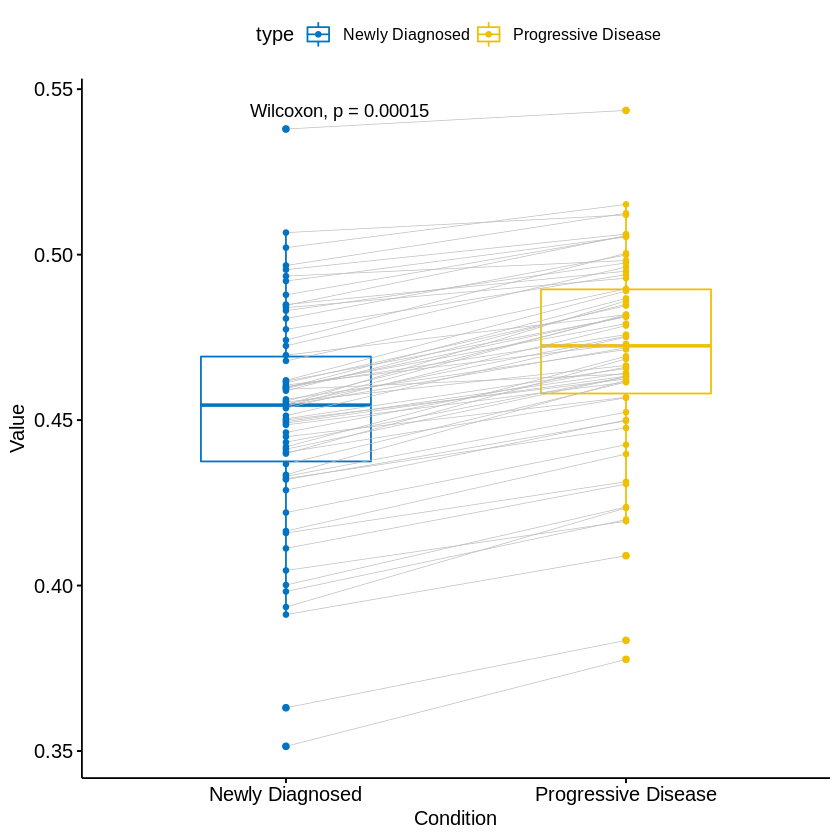

In [18]:
# reading in Per Patient Visit File for info on progressive disease and others

MM_pat_ppv = data.frame(fread("MMRF_CoMMpass_IA13_PER_PATIENT_VISIT.csv"))

# checking out head

head(MM_pat_ppv)

# getting list of patients annotated as having Progressive Disease

MM_pat_ppv_bool = MM_pat_ppv$AT_TREATMENTRESP %in% c('Progressive Disease')
MM_pat_pd = MM_pat_ppv[MM_pat_ppv_bool,]
MM_pat_pd_id = unique(MM_pat_pd$SPECTRUM_SEQ)
MM_pat_pd_id = MM_pat_pd_id[-1]
MM_pat_pd_id = paste(MM_pat_pd_id, '_BM', sep = '')

# pruning newly diagnosed data for paired wise boxplot w/ wilcoxon rank sum test

MM.cor.keats_5_nd_means2 = MM.cor.keats_5_nd_means_ranks
MM.cor.keats_5_nd_means2 = MM.cor.keats_5_nd_means2[-3]
MM.cor.keats_5_nd_means2$type = 'Newly Diagnosed'

# checking output head

head(MM.cor.keats_5_nd_means2)

# subsetting for patients with progressive disease and getting number of patients with progressive disease

MM.pd.bool = rownames(MM.cor.keats_5) %in% MM_pat_pd_id
MM.cor.keats_5_pd = MM.cor.keats_5[MM.pd.bool, ]
sum(MM.pd.bool)

# getting mean correlates for patients with progressive disease and labelling for boxplot

MM.cor.keats_5_pd = MM.cor.keats_5[MM.pd.bool, ]
MM.cor.keats_5_pd_means = data.frame(colMeans(MM.cor.keats_5_pd))
MM.cor.keats_5_pd_means$type = 'Progressive Disease'
colnames(MM.cor.keats_5_pd_means) = c('cor', 'type')
MM.cor.keats_5_pd_means = MM.cor.keats_5_pd_means[order(rownames(MM.cor.keats_5_pd_means)),]

# checking output head

head(MM.cor.keats_5_pd_means)

# fusing data frames by row for boxplot

pd_bound = rbind(MM.cor.keats_5_nd_means2, MM.cor.keats_5_pd_means)

# paired-wise boxplot comparing newly diagnosed and progressive disease patients

ggpaired(pd_bound, x = "type", y = "cor",
        color = "type", line.color = "gray", line.size = 0.2,
        palette = "jco")+
 stat_compare_means()

In [19]:

# # head(MM_pat_ppv[MM_pat_ppv_bool2eb,]
# head(MM_pat_pd)
# MM_pat_ppv_pd = (MM_pat_pd[(MM_pat_pd$SPECTRUM_SEQ != ''),])
# head(MM_pat_ppv_pd)
# test = 'MMRF_1082_2'
# head(test)
# rm(test)
# # head(test)

# # help(append)
# help()

# test = test[-11]
# test = test[-10]
# head(test)
# remove(test, 11)
# head(test)
# help(remove)
# head
# MM_patient_ids = data.frame(colnames(MM_patients))
# MM_patients_new = filter(MM_patient_ids, str_extract(MM_patient_ids[,1], "_[0-9]_") == "_1_")

PUBLIC_ID,D_PT_ic_day,D_PT_disc_com,D_PT_lastdy,D_PT_DIDPATIENTCOM,D_PT_PRIMARYREASON,D_PT_CAUSEOFDEATH,SE_SPECIFY2,D_PT_deathdy,dth_specify,⋯,DEMOG_NATIVEHAWAIIA,DEMOG_WHITE,DEMOG_OTHER,DEMOG_SPECIFY,DEMOG_ETHNICITY,DEMOG_SPECIFY2,DEMOG_DAYOFVISIT,DEMOG_DAYOFBIRTH,demog_visit,enr
<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,⋯,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>
MMRF_1014,-10,,1186,No,Patient no longer consents to participate in the study,,,NA,,⋯,NA,Checked,,,Not Hispanic or Latino,,-10,-23484,0,1
MMRF_1017,-16,,508,No,Death,Disease Progression,,508,,⋯,NA,Checked,,,Not Hispanic or Latino,,-16,-27641,0,1
MMRF_1024,-27,,NA,,,,,NA,,⋯,NA,Checked,,,Not Hispanic or Latino,,-27,-29222,0,1
MMRF_1038,-30,,1753,No,Death,Disease Progression,,1753,,⋯,NA,Checked,,,Not Hispanic or Latino,,-30,-25255,0,1
MMRF_1033,-29,,NA,,,,,NA,,⋯,NA,,,,Not Hispanic or Latino,,-29,-23692,0,1
MMRF_1007,-17,,327,No,Death,Disease Progression,,327,,⋯,NA,Checked,,,Not Hispanic or Latino,,-17,-28853,0,1


,PUBLIC_ID,D_PT_ic_day,D_PT_disc_com,D_PT_lastdy,D_PT_DIDPATIENTCOM,D_PT_PRIMARYREASON,D_PT_CAUSEOFDEATH,SE_SPECIFY2,D_PT_deathdy,dth_specify,⋯,DEMOG_NATIVEHAWAIIA,DEMOG_WHITE,DEMOG_OTHER,DEMOG_SPECIFY,DEMOG_ETHNICITY,DEMOG_SPECIFY2,DEMOG_DAYOFVISIT,DEMOG_DAYOFBIRTH,demog_visit,enr
,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,⋯,<lgl>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>
1,MMRF_1014,-10,,1186,No,Patient no longer consents to participate in the study,,,NA,,⋯,NA,Checked,,,Not Hispanic or Latino,,-10,-23484,0,1
2,MMRF_1017,-16,,508,No,Death,Disease Progression,,508,,⋯,NA,Checked,,,Not Hispanic or Latino,,-16,-27641,0,1
5,MMRF_1033,-29,,NA,,,,,NA,,⋯,NA,,,,Not Hispanic or Latino,,-29,-23692,0,1
10,MMRF_1093,-23,,NA,,,,,NA,,⋯,NA,,,,Not Hispanic or Latino,,-9,-24238,0,1
11,MMRF_1129,-5,,610,No,Death,Disease Progression,,610,,⋯,NA,Checked,,,Not Hispanic or Latino,,-5,-29630,0,1
13,MMRF_1137,-5,,1092,No,Death,Disease Progression,,1092,,⋯,NA,Checked,,,Not Hispanic or Latino,,-5,-24046,0,1


[1] 263

[1] 271

[1] 212

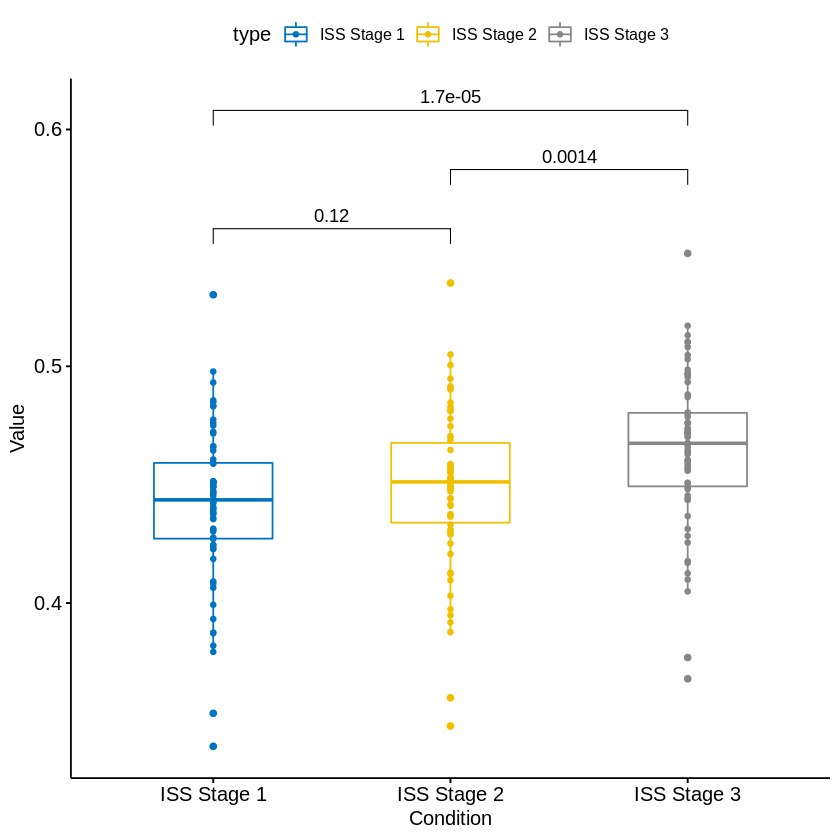

In [20]:
# reading in per patient file for data on ISS staging

MM_pat_pp = data.frame(fread("MMRF_CoMMpass_IA13_PER_PATIENT.csv"))

# checking output head

head(MM_pat_pp)

# subsetting data by ISS stage

MM_pat_pp_1_bool = (MM_pat_pp$D_PT_iss %in% c(1))
MM_pat_pp_2_bool = (MM_pat_pp$D_PT_iss %in% c(2))
MM_pat_pp_3_bool = (MM_pat_pp$D_PT_iss %in% c(3))

MM_pat_pp_1 = MM_pat_pp[MM_pat_pp_1_bool, ]
MM_pat_pp_2 = MM_pat_pp[MM_pat_pp_2_bool, ]
MM_pat_pp_3 = MM_pat_pp[MM_pat_pp_3_bool, ]

# checking output head

head(MM_pat_pp_1)

# getting patient IDs and appending _1_BM to use for searching newly diagnosed patients with RNA-Seq data available

MM_pat_pp_1.id = MM_pat_pp_1$PUBLIC_ID
MM_pat_pp_2.id = MM_pat_pp_2$PUBLIC_ID
MM_pat_pp_3.id = MM_pat_pp_3$PUBLIC_ID

MM_pat_pp_1.id = paste(MM_pat_pp_1.id, '_1_BM', sep = '')
MM_pat_pp_2.id = paste(MM_pat_pp_2.id, '_1_BM', sep = '')
MM_pat_pp_3.id = paste(MM_pat_pp_3.id, '_1_BM', sep = '')

# subsetting correlates by ISS staging and printing number of patients per stage

iss_1_bool = rownames(MM.cor.keats_5) %in% MM_pat_pp_1.id
iss_2_bool = rownames(MM.cor.keats_5) %in% MM_pat_pp_2.id
iss_3_bool = rownames(MM.cor.keats_5) %in% MM_pat_pp_3.id

sum(iss_1_bool)
sum(iss_2_bool)
sum(iss_3_bool)

iss_1 = MM.cor.keats_5[iss_1_bool,]
iss_2 = MM.cor.keats_5[iss_2_bool,]
iss_3 = MM.cor.keats_5[iss_3_bool,]

# getting correlate means, and assigning type for boxplot

iss_1_m = data.frame(colMeans(iss_1))
iss_1_m$type = 'ISS Stage 1'
colnames(iss_1_m) = c('cor', 'type')

iss_3_m = data.frame(colMeans(iss_3))
iss_3_m$type = 'ISS Stage 3'
colnames(iss_3_m) = c('cor', 'type')

iss_2_m = data.frame(colMeans(iss_2))
iss_2_m$type = 'ISS Stage 2'
colnames(iss_2_m) = c('cor', 'type')

# fusing data frames by row for boxplot

iss_bound = rbind(iss_1_m, iss_2_m)
iss_bound = rbind(iss_bound, iss_3_m)

# paired-wise boxplot for ISS staging

my_comparisons = list(c("ISS Stage 1", "ISS Stage 2"), 
                      c("ISS Stage 2", "ISS Stage 3"), c("ISS Stage 1", "ISS Stage 3"))

 ggpaired(iss_bound, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0,
         palette = "jco")+
  stat_compare_means(comparisons = my_comparisons, method = 'wilcox.test')

[1] 237

[1] 734

[1] 495

[1] 152

[1] 0.4535691

[1] 0.4513068

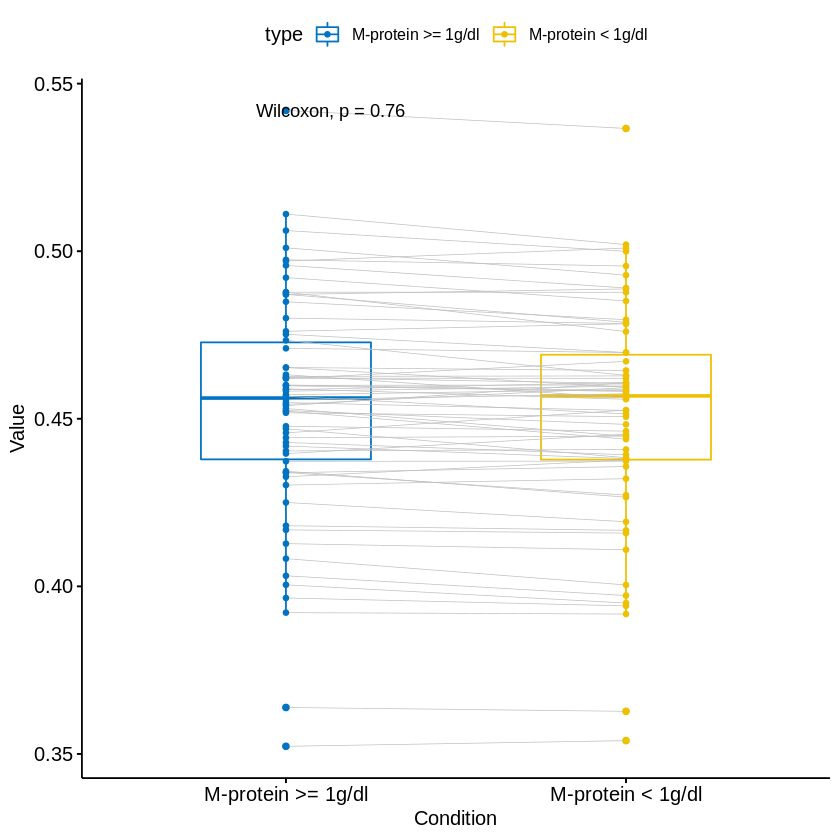

In [21]:
# subsetting for patients in per patient visit dataframe 
# with serum m-protein >= 1g/dl or not and printing how many each

MM_pat_ppv_m_bool = MM_pat_ppv$IC_SERUMMPROTEIN %in% c('No')
MM_pat_ppv_m_booly = MM_pat_ppv$IC_SERUMMPROTEIN %in% c('Yes')

sum(MM_pat_ppv_m_bool)
sum(MM_pat_ppv_m_booly)

MM_pat_ppv_mpos = MM_pat_ppv[MM_pat_ppv_m_booly,]
MM_pat_ppv_mneg = MM_pat_ppv[MM_pat_ppv_m_bool,]

# appending _1_BM to ID to search for newly diagnosed patients, with RNA-Seq available

MM_pat_ppv_m.idy = unique(MM_pat_ppv_mpos$PUBLIC_ID)
MM_pat_ppv_m.idy = paste(MM_pat_ppv_m.idy, '_1_BM', sep = '')
MM_pat_ppv_m.id = unique(MM_pat_ppv_mneg$PUBLIC_ID)
MM_pat_ppv_m.id = paste(MM_pat_ppv_m.id, '_1_BM', sep = '')

# subssetting for patient correlates with serum m protein levels and printing how many each

mpos_b = rownames(MM.cor.keats_5) %in% MM_pat_ppv_m.idy
mneg_b = rownames(MM.cor.keats_5) %in% MM_pat_ppv_m.id

mpos = MM.cor.keats_5[mpos_b,]
mneg = MM.cor.keats_5[mneg_b,]

length(mpos[,1])
length(mneg[,1])

# getting correlate means and assigning type

mpos_m = data.frame(colMeans(mpos))
mpos_m$type = 'M-protein >= 1g/dl'
colnames(mpos_m) = c('cor', 'type')

mneg_m = data.frame(colMeans(mneg))
mneg_m$type = 'M-protein < 1g/dl'
colnames(mneg_m) = c('cor', 'type')

# fusing dataframes by row for boxplot

mbound = rbind(mpos_m, mneg_m)

# paired wise boxplot for Serum M-protein levels

 ggpaired(mbound, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.2,
         palette = "jco")+
  stat_compare_means()

# printing mean M-protein level correlates

mean(mpos_m$cor)
mean(mneg_m$cor)

[1]  NA 2.2  NA 1.4 1.4  NA

[1] FALSE  TRUE FALSE  TRUE  TRUE FALSE

PUBLIC_ID,SPECTRUM_SEQ,VISIT,VJ_INTERVAL,VISITDY,AT_DEFINITEDEVEL,AT_WASANASSESSME,AT_RESPONSEASSES,AT_TREATMENTRESP,AT_CDRREVIEWPERI,⋯,CMMC_COMMENTS,CMMC,CMMC_REASONFORPROC,CMMC_BONE_SPECIFY2,CMMC_REASONCODE,CMMC_CRHIT,CMMC_PDHIT,CMMC_HIT,CMMC_RECDY,enr
<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,⋯,<chr>,<int>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>
MMRF_1014,,-1,Screening,-10,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
MMRF_1014,MMRF_1014_1,0,Baseline,-10,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
MMRF_1014,,1,Month 3,86,,No,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
MMRF_1014,,2,Month 6,173,,Yes,173,Stable Disease,,⋯,,NA,,,NA,NA,NA,NA,NA,1
MMRF_1014,,3,Month 9,302,,Yes,249,Stable Disease,,⋯,,NA,,,NA,NA,NA,NA,NA,1
MMRF_1014,,4,Year 1,365,,No,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1


,PUBLIC_ID,SPECTRUM_SEQ,VISIT,VJ_INTERVAL,VISITDY,AT_DEFINITEDEVEL,AT_WASANASSESSME,AT_RESPONSEASSES,AT_TREATMENTRESP,AT_CDRREVIEWPERI,⋯,CMMC_COMMENTS,CMMC,CMMC_REASONFORPROC,CMMC_BONE_SPECIFY2,CMMC_REASONCODE,CMMC_CRHIT,CMMC_PDHIT,CMMC_HIT,CMMC_RECDY,enr
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,⋯,<chr>,<int>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>
2,MMRF_1014,MMRF_1014_1,0,Baseline,-10,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
4,MMRF_1014,,2,Month 6,173,,Yes,173,Stable Disease,,⋯,,NA,,,NA,NA,NA,NA,NA,1
5,MMRF_1014,,3,Month 9,302,,Yes,249,Stable Disease,,⋯,,NA,,,NA,NA,NA,NA,NA,1
11,MMRF_1014,,9,Month 27,803,,Yes,781,Partial Response,,⋯,,NA,,,NA,NA,NA,NA,NA,1
15,MMRF_1014,,13,Month 39,1157,,Yes,1157,Partial Response,,⋯,,NA,,,NA,NA,NA,NA,NA,1
19,MMRF_1017,MMRF_1017_1,0,Baseline,-15,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1


[1] FALSE FALSE FALSE FALSE FALSE FALSE

[1] 1129

[1] 398

[1] FALSE FALSE FALSE FALSE FALSE FALSE

[1] 1129

[1] 110

[1] 1129

[1] 621

,PUBLIC_ID,SPECTRUM_SEQ,VISIT,VJ_INTERVAL,VISITDY,AT_DEFINITEDEVEL,AT_WASANASSESSME,AT_RESPONSEASSES,AT_TREATMENTRESP,AT_CDRREVIEWPERI,⋯,CMMC_COMMENTS,CMMC,CMMC_REASONFORPROC,CMMC_BONE_SPECIFY2,CMMC_REASONCODE,CMMC_CRHIT,CMMC_PDHIT,CMMC_HIT,CMMC_RECDY,enr
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,⋯,<chr>,<int>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>
106,MMRF_1052,MMRF_1052_1,0,Baseline,-27,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
149,MMRF_1093,MMRF_1093_1,0,Baseline,-9,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
172,MMRF_1129,MMRF_1129_1,0,Baseline,1,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
267,MMRF_1229,MMRF_1229_1,0,Baseline,-25,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
293,MMRF_1256,MMRF_1256_1,0,Baseline,-16,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
318,MMRF_1285,MMRF_1285_1,0,Baseline,-27,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1


,PUBLIC_ID,SPECTRUM_SEQ,VISIT,VJ_INTERVAL,VISITDY,AT_DEFINITEDEVEL,AT_WASANASSESSME,AT_RESPONSEASSES,AT_TREATMENTRESP,AT_CDRREVIEWPERI,⋯,CMMC_COMMENTS,CMMC,CMMC_REASONFORPROC,CMMC_BONE_SPECIFY2,CMMC_REASONCODE,CMMC_CRHIT,CMMC_PDHIT,CMMC_HIT,CMMC_RECDY,enr
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,⋯,<chr>,<int>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>
2,MMRF_1014,MMRF_1014_1,0,Baseline,-10,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
19,MMRF_1017,MMRF_1017_1,0,Baseline,-15,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
27,MMRF_1024,MMRF_1024_1,0,Baseline,-27,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
52,MMRF_1038,MMRF_1038_1,0,Baseline,-30,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
75,MMRF_1033,MMRF_1033_1,0,Baseline,-29,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
99,MMRF_1007,MMRF_1007_1,0,Baseline,-17,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1


,PUBLIC_ID,SPECTRUM_SEQ,VISIT,VJ_INTERVAL,VISITDY,AT_DEFINITEDEVEL,AT_WASANASSESSME,AT_RESPONSEASSES,AT_TREATMENTRESP,AT_CDRREVIEWPERI,⋯,CMMC_COMMENTS,CMMC,CMMC_REASONFORPROC,CMMC_BONE_SPECIFY2,CMMC_REASONCODE,CMMC_CRHIT,CMMC_PDHIT,CMMC_HIT,CMMC_RECDY,enr
,<chr>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,⋯,<chr>,<int>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>
113,MMRF_1082,MMRF_1082_1,0,Baseline,-14,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
126,MMRF_1094,MMRF_1094_1,0,Baseline,-4,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
494,MMRF_2214,MMRF_2214_1,0,Baseline,-5,,,NA,,,⋯,"JD00022870/A: Less than optimal,sample exceeds technical capability of the software. Result may be higher than reported.\Extrapolated result",20348,Baseline,,1,NA,NA,NA,-4,1
1046,MMRF_1418,MMRF_1418_1,0,Baseline,-4,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1
1201,MMRF_1478,MMRF_1478_1,0,Baseline,1,,,NA,,,⋯,Extrapolated CMMC,225,Baseline,,1,NA,NA,NA,2,1
1386,MMRF_1625,MMRF_1625_1,0,Baseline,0,,,NA,,,⋯,,NA,,,NA,NA,NA,NA,NA,1


[1] "MMRF_1052_1_BM" "MMRF_1093_1_BM" "MMRF_1129_1_BM" "MMRF_1229_1_BM"
[5] "MMRF_1256_1_BM" "MMRF_1285_1_BM"

[1] "MMRF_1014_1_BM" "MMRF_1017_1_BM" "MMRF_1024_1_BM" "MMRF_1038_1_BM"
[5] "MMRF_1033_1_BM" "MMRF_1007_1_BM"

[1] "MMRF_1082_1_BM" "MMRF_1094_1_BM" "MMRF_2214_1_BM" "MMRF_1418_1_BM"
[5] "MMRF_1478_1_BM" "MMRF_1625_1_BM"

,ALMC1,ALMC2,AMO1,ANBL6,COLO677,Delta47,DP6,EJM,FLAM76,FR4,⋯,RPMI8226,SKMM1,SKMM2,U266,UTMC2,VP6,XG1,XG2,XG6,XG7
MMRF_2801_1_BM,0.4517749,0.4349749,0.4286582,0.4822847,0.4359017,0.3972648,0.3971391,0.4149805,0.4233515,0.3452179,⋯,0.4516974,0.3766863,0.4153700,0.3859249,0.3398826,0.4064589,0.3891746,0.3850782,0.3819718,0.3817107
MMRF_2718_1_BM,0.4581244,0.4431644,0.4038416,0.4653616,0.3949765,0.3453951,0.3860945,0.4110975,0.4140186,0.3285472,⋯,0.4205938,0.3508619,0.3986400,0.3644461,0.3750175,0.3829601,0.3748100,0.3510870,0.3648719,0.3567384
MMRF_2815_1_BM,0.4868771,0.4787737,0.4393861,0.4982120,0.4016501,0.3848549,0.4512338,0.4185613,0.4220763,0.3497691,⋯,0.4289724,0.3936808,0.4322049,0.3792175,0.4420574,0.4152898,0.4072691,0.3801919,0.4053549,0.4719518
MMRF_1656_1_BM,0.5550829,0.5661903,0.5050889,0.5649782,0.4854856,0.4713307,0.5534437,0.4912024,0.5269389,0.4215398,⋯,0.4850777,0.4525768,0.5089535,0.4544614,0.4610639,0.5070892,0.4952512,0.5039261,0.5325579,0.5265956
MMRF_2461_1_BM,0.4130272,0.4097795,0.3883913,0.4387081,0.3858632,0.3390691,0.3917873,0.3618470,0.3893378,0.2929299,⋯,0.3805764,0.2939174,0.3382522,0.3363116,0.2933794,0.3530543,0.3509824,0.3355592,0.3888328,0.3784962
MMRF_2057_1_BM,0.5436614,0.5426516,0.4553192,0.5775062,0.4378019,0.4701851,0.5279019,0.4993482,0.5561542,0.3954045,⋯,0.4337368,0.4444602,0.5102732,0.4800311,0.4464399,0.4933961,0.5162781,0.4757506,0.5225110,0.4737961


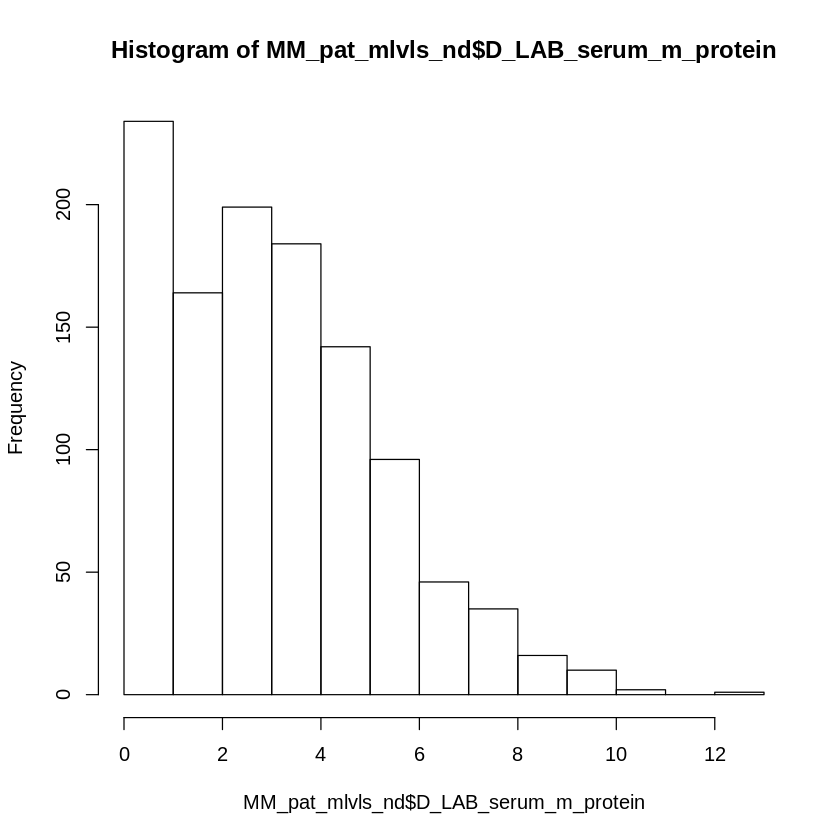

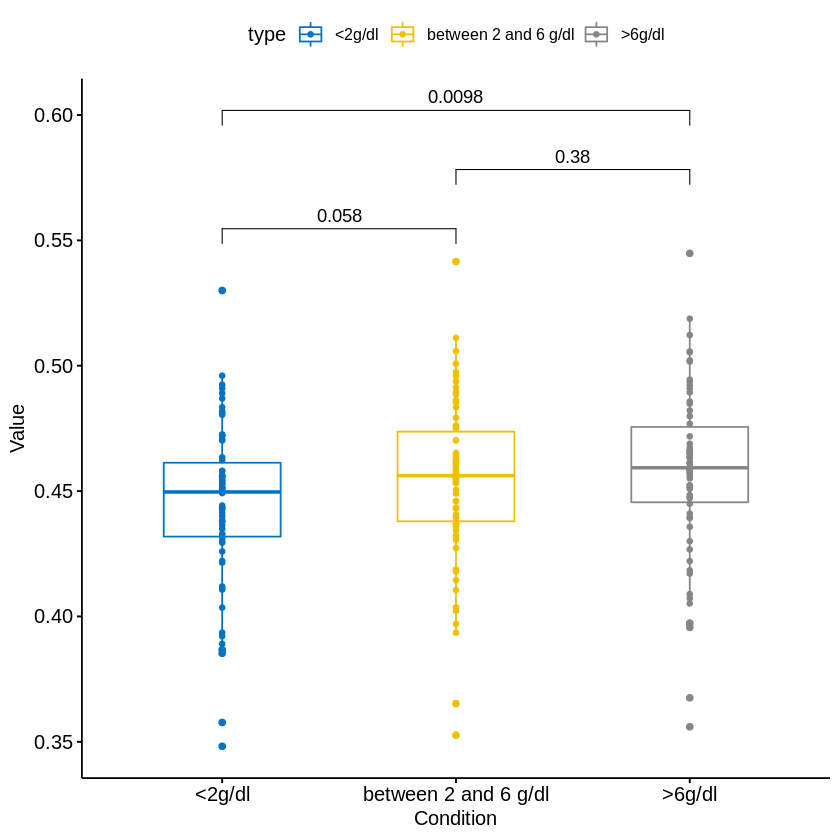

In [22]:
# head(MM_pat_ppv$D_LAB_serum_m_protein %in% NA)
head(MM_pat_ppv$D_LAB_serum_m_protein)
head(!MM_pat_ppv$D_LAB_serum_m_protein %in% NA)

head(MM_pat_ppv)

MM_pat_mlvls = MM_pat_ppv[!MM_pat_ppv$D_LAB_serum_m_protein %in% NA,]
head(MM_pat_mlvls)

MM_pat_mlvls = (MM_pat_mlvls[!MM_pat_mlvls$SPECTRUM_SEQ %in% '',])

MM_pat_mlvls_nd = (MM_pat_mlvls[MM_pat_mlvls$VISIT %in% 0,])

hist(MM_pat_mlvls_nd$D_LAB_serum_m_protein)

MM_pat_mlvls_2b = MM_pat_mlvls_nd$D_LAB_serum_m_protein <= 2

head(MM_pat_mlvls_2b)
length(MM_pat_mlvls_2b)
sum(MM_pat_mlvls_2b)

# MM_pat_mlvls_6b = MM_pat_mlvls_nd$D_LAB_serum_m_protein > 2 || MM_pat_mlvls_nd$D_LAB_serum_m_protein <= 6

# head(MM_pat_mlvls_6b)
# length(MM_pat_mlvls_6b)
# sum(MM_pat_mlvls_6b)



MM_pat_mlvls_12b = MM_pat_mlvls_nd$D_LAB_serum_m_protein > 6

head(MM_pat_mlvls_12b)
length(MM_pat_mlvls_12b)
sum(MM_pat_mlvls_12b)

# head(MM_pat_ppv[!MM_pat_ppv$D_LAB_serum_m_protein %in% NA,])
# unique(rownames(MM.cor.keats_5))

# sum(MM_pat_mlvls_2b + MM_pat_mlvls_12b)
# length(MM_pat_mlvls_2b + MM_pat_mlvls_12b)

MM_pat_mlvls_6b = !(MM_pat_mlvls_2b + MM_pat_mlvls_12b)
length(MM_pat_mlvls_6b)
sum(MM_pat_mlvls_6b)

MM_pat_mlvls_2 = MM_pat_mlvls_nd[MM_pat_mlvls_2b,]
MM_pat_mlvls_6 = MM_pat_mlvls_nd[MM_pat_mlvls_6b,]
MM_pat_mlvls_12 = MM_pat_mlvls_nd[MM_pat_mlvls_12b,]

head(MM_pat_mlvls_2)
head(MM_pat_mlvls_6)
head(MM_pat_mlvls_12)

MM_pat_mlvls_2_id = paste(MM_pat_mlvls_2$SPECTRUM_SEQ, '_BM', sep = '')
MM_pat_mlvls_6_id = paste(MM_pat_mlvls_6$SPECTRUM_SEQ, '_BM', sep = '')
MM_pat_mlvls_12_id = paste(MM_pat_mlvls_12$SPECTRUM_SEQ, '_BM', sep = '')

head(MM_pat_mlvls_2_id)
head(MM_pat_mlvls_6_id)
head(MM_pat_mlvls_12_id)

# length(rownames(MM.cor.keats_5) %in% MM_pat_mlvls_2_id)
head(MM.cor.keats_5_nd)

MM.cor.mlvls_2 = MM.cor.keats_5_nd[rownames(MM.cor.keats_5_nd) %in% MM_pat_mlvls_2_id,]
MM.cor.mlvls_6 = MM.cor.keats_5_nd[rownames(MM.cor.keats_5_nd) %in% MM_pat_mlvls_6_id,]
MM.cor.mlvls_12 = MM.cor.keats_5_nd[rownames(MM.cor.keats_5_nd) %in% MM_pat_mlvls_12_id,]


mlvls_2_m = data.frame(colMeans(MM.cor.mlvls_2))
mlvls_2_m$type = '<2g/dl'
colnames(mlvls_2_m) = c('cor', 'type')

mlvls_6_m = data.frame(colMeans(MM.cor.mlvls_6))
mlvls_6_m$type = 'between 2 and 6 g/dl'
colnames(mlvls_6_m) = c('cor', 'type')

mlvls_12_m = data.frame(colMeans(MM.cor.mlvls_12))
mlvls_12_m$type = '>6g/dl'
colnames(mlvls_12_m) = c('cor', 'type')

mlvls_b = rbind(mlvls_2_m, mlvls_6_m)
mlvls_b = rbind(mlvls_b, mlvls_12_m)

my_comparisons = list(c("<2g/dl", "between 2 and 6 g/dl"), 
                      c("between 2 and 6 g/dl", ">6g/dl"), c("<2g/dl", ">6g/dl"))

 ggpaired(mlvls_b, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0,
         palette = "jco")+
  stat_compare_means(comparisons = my_comparisons, method = 'wilcox.test')


# # getting correlate means, and assigning type for boxplot

# iss_1_m = data.frame(colMeans(iss_1))
# iss_1_m$type = 'ISS Stage 1'
# colnames(iss_1_m) = c('cor', 'type')

# iss_3_m = data.frame(colMeans(iss_3))
# iss_3_m$type = 'ISS Stage 3'
# colnames(iss_3_m) = c('cor', 'type')

# iss_2_m = data.frame(colMeans(iss_2))
# iss_2_m$type = 'ISS Stage 2'
# colnames(iss_2_m) = c('cor', 'type')

# # fusing data frames by row for boxplot

# iss_bound = rbind(iss_1_m, iss_2_m)
# iss_bound = rbind(iss_bound, iss_3_m)

# # paired-wise boxplot for ISS staging

# my_comparisons = list(c("ISS Stage 1", "ISS Stage 2"), 
#                       c("ISS Stage 2", "ISS Stage 3"), c("ISS Stage 1", "ISS Stage 3"))

#  ggpaired(iss_bound, x = "type", y = "cor",
#          color = "type", line.color = "gray", line.size = 0,
#          palette = "jco")+
#   stat_compare_means(comparisons = my_comparisons, method = 'wilcox.test')

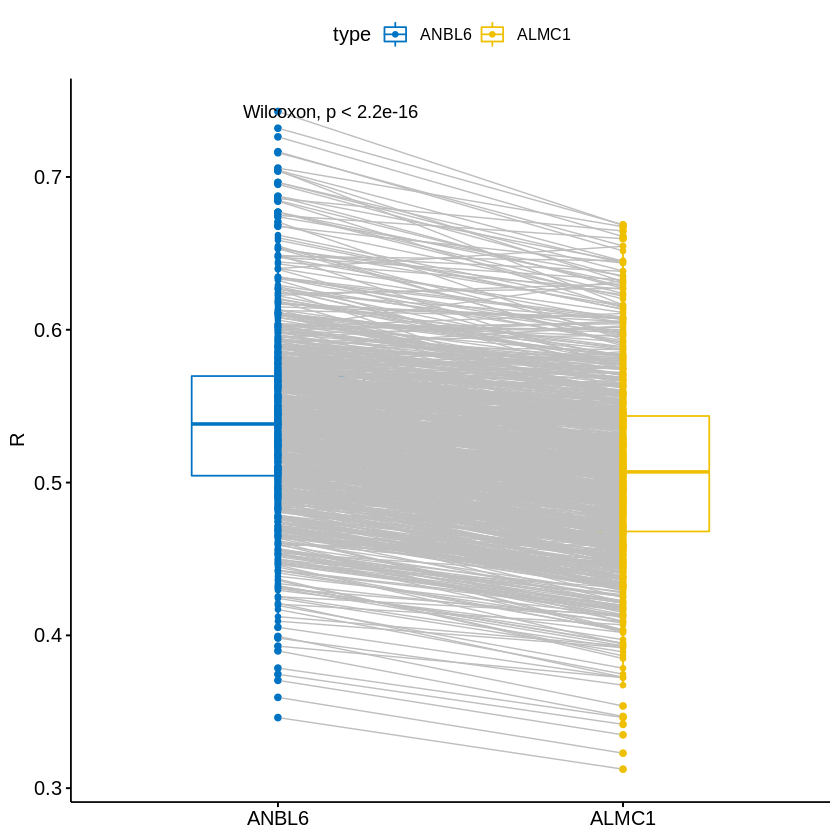

In [23]:
# subsetting for patient correlates to ANBL6 and ALMC1

cor_ANBL6 = MM.cor.keats_5[,'ANBL6']
cor_almc1 = MM.cor.keats_5[,'ALMC1']

# assigning type for figures

cor_ANBL6 = as.data.frame(cor_ANBL6)
cor_ANBL6$type = 'ANBL6'
cor_almc1 = as.data.frame(cor_almc1)
cor_almc1$type = 'ALMC1'
colnames(cor_ANBL6) = c('cor', 'type')
colnames(cor_almc1) = c('cor', 'type')

# fusing dataframes by row for boxplot

cor_anbl6_almc1 = rbind(cor_ANBL6, cor_almc1)

# paired wise boxplot comparing patient correlates of ANBL6 to ALMC1

ggpaired(cor_anbl6_almc1, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE)+
  stat_compare_means()

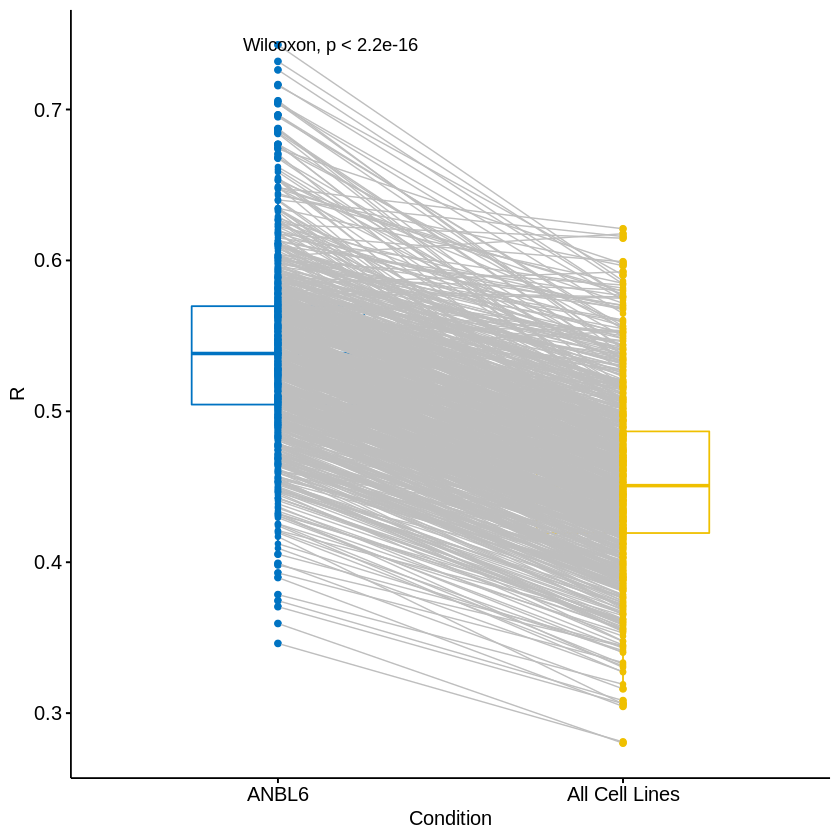

In [24]:
# gathering correlate means of all cell lines and assigning type

cor_oth = MM.cor.keats_5
cor_oth = rowMeans(cor_oth)
cor_oth = as.data.frame(cor_oth)
cor_oth$type = 'All Cell Lines'
colnames(cor_oth) = c('cor', 'type')

# fusing dataframes by row for boxplot

cor_anbl6_oth = rbind(cor_ANBL6, cor_oth)

# paired wise boxplot comparing patient correlates of ANBL6 to all other cell lines

ggpaired(cor_anbl6_oth, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', legend = 'FALSE')+
  stat_compare_means()

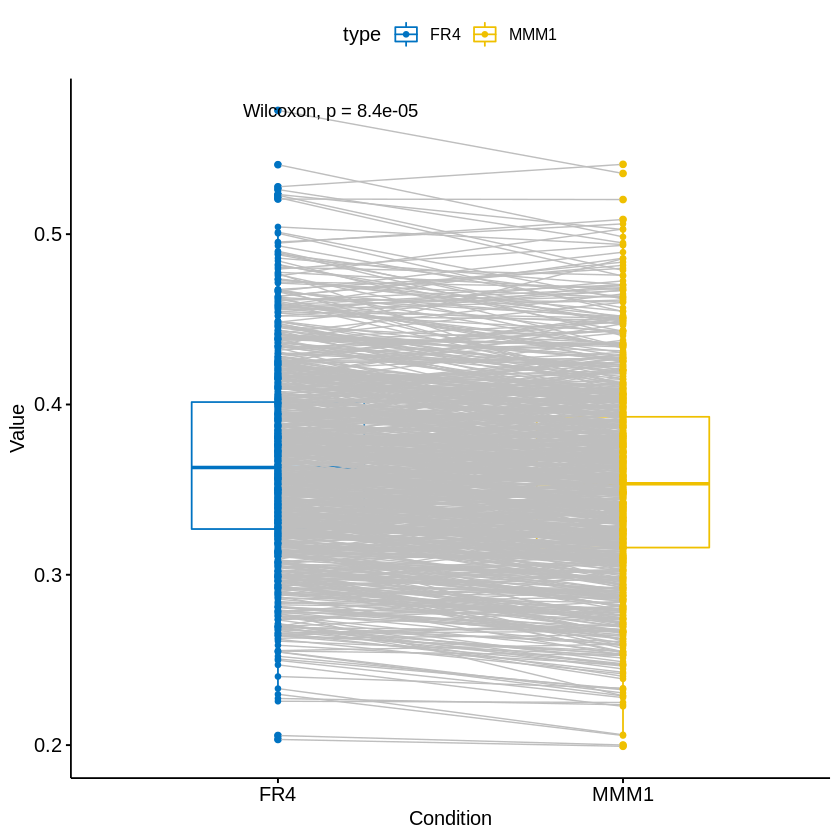

In [25]:
# subsetting for patient correlates to MMM1 and assigning type

cor_MMM1 = MM.cor.keats_5[,'MMM1']
cor_MMM1 = as.data.frame(cor_MMM1)
cor_MMM1$type = 'MMM1'
colnames(cor_MMM1) = c('cor', 'type')

# subsetting for patient correlates to FR4 and assigning type

cor_FR4 = MM.cor.keats_5[,'FR4']
cor_FR4 = as.data.frame(cor_FR4)
cor_FR4$type = 'FR4'
colnames(cor_FR4) = c('cor', 'type')

# fusing dataframes by row for boxplot

cor_worst_bound = rbind(cor_FR4, cor_MMM1)

# paired wise boxplot comparing patient correlates of MMM1 to FR4

ggpaired(cor_worst_bound, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco")+
  stat_compare_means()

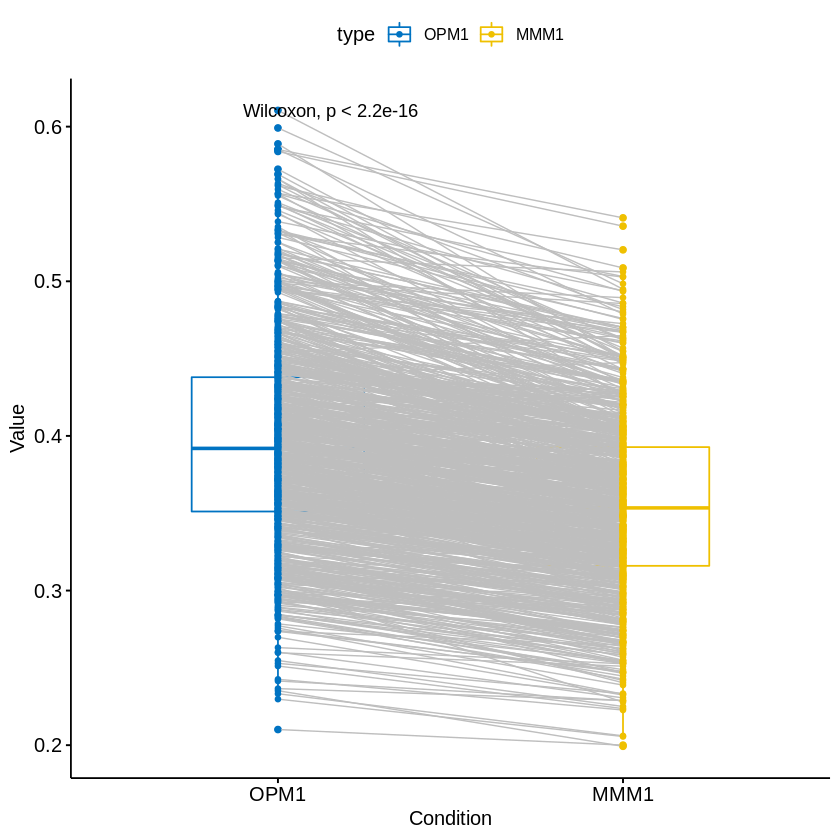

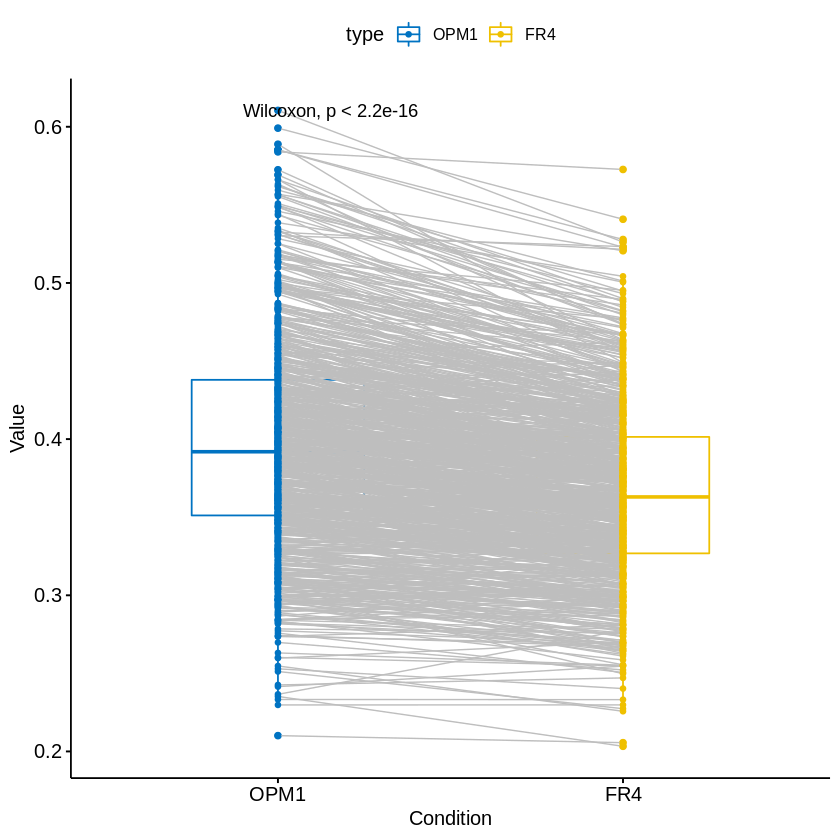

In [26]:
# subsetting for patient correlates to OPM1 and assigning type

cor_OPM1 = MM.cor.keats_5[,'OPM1']
cor_OPM1 = as.data.frame(cor_OPM1)
cor_OPM1$type = 'OPM1'
colnames(cor_OPM1) = c('cor', 'type')

# fusing data frames by row for boxplots

cor_worst_bound2 = rbind(cor_OPM1, cor_MMM1)
cor_worst_bound3 = rbind(cor_OPM1, cor_FR4)

# paired wise boxplots comparing OPM1 to MMM1 and FR4

ggpaired(cor_worst_bound2, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco")+
  stat_compare_means()

ggpaired(cor_worst_bound3, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco")+
  stat_compare_means()

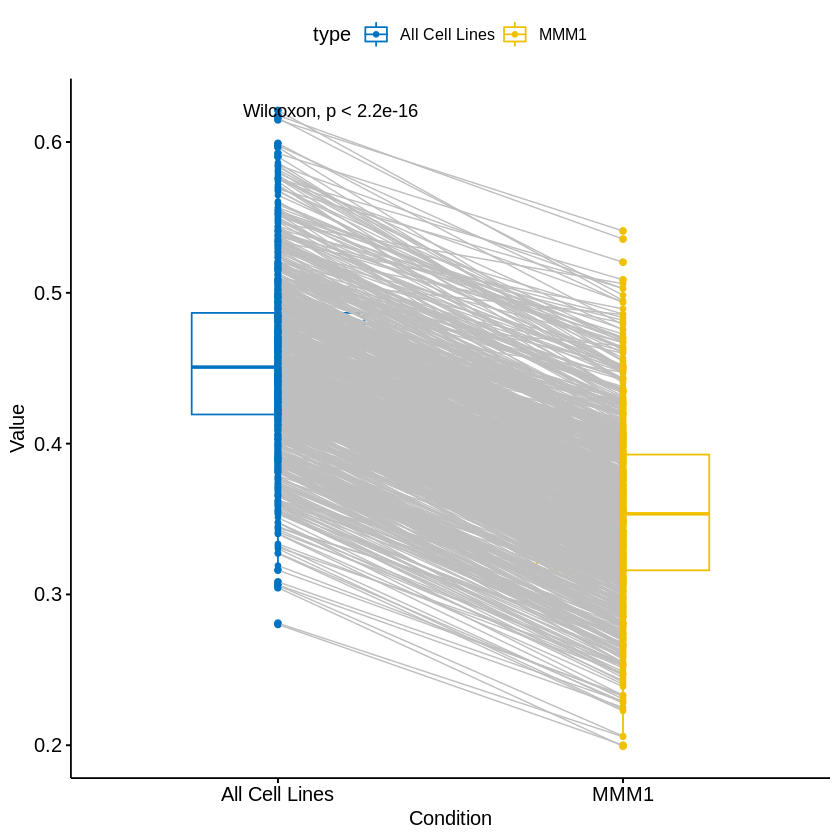

In [27]:
# fusing dataframes by row

cor_worst_all = rbind(cor_oth, cor_MMM1)

# paired wise boxplot comparing patient correlates to MMM1 to all other cell lines

ggpaired(cor_worst_all, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco")+
  stat_compare_means()

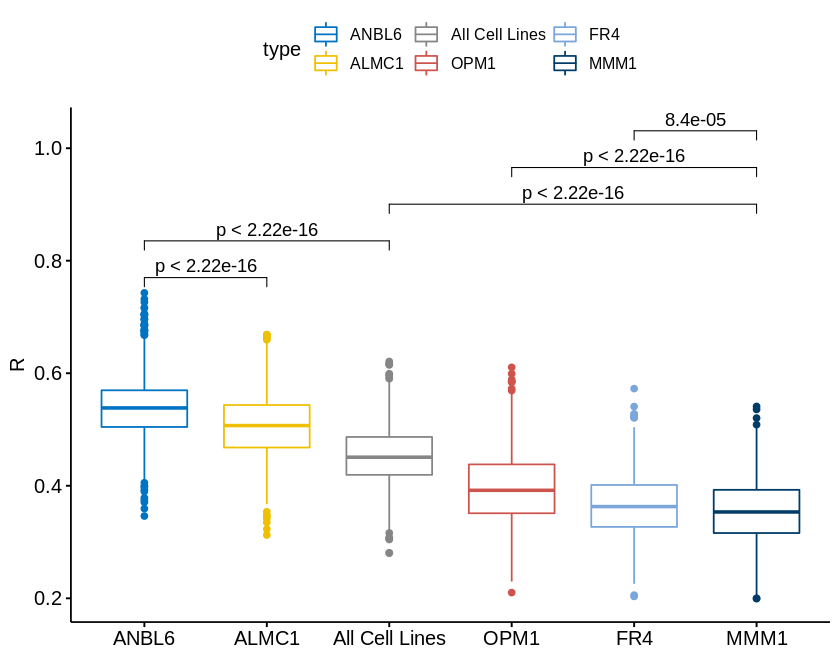

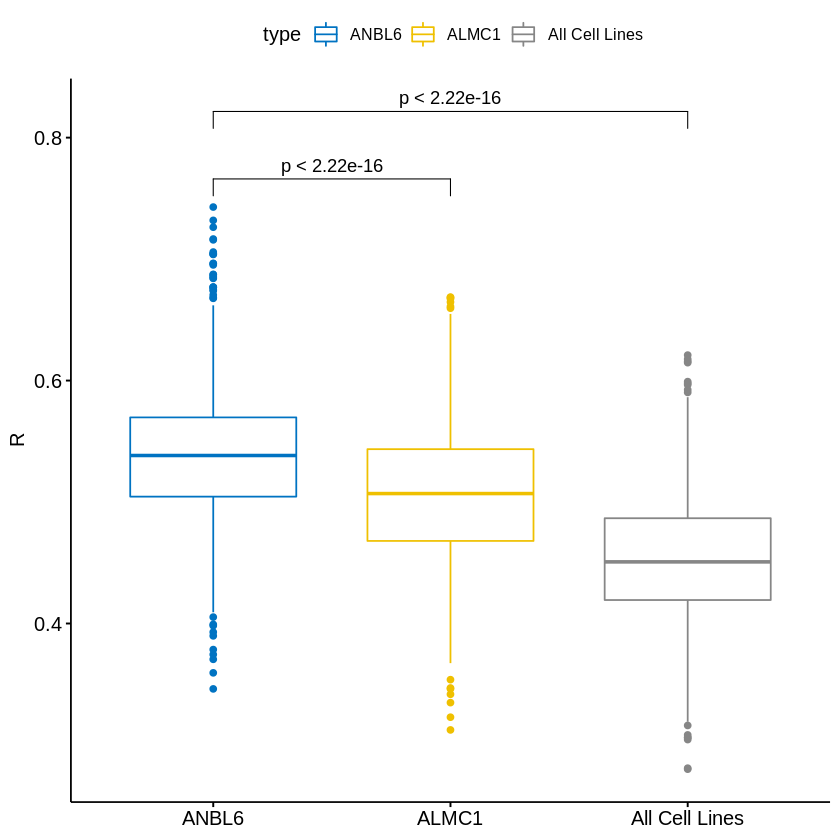

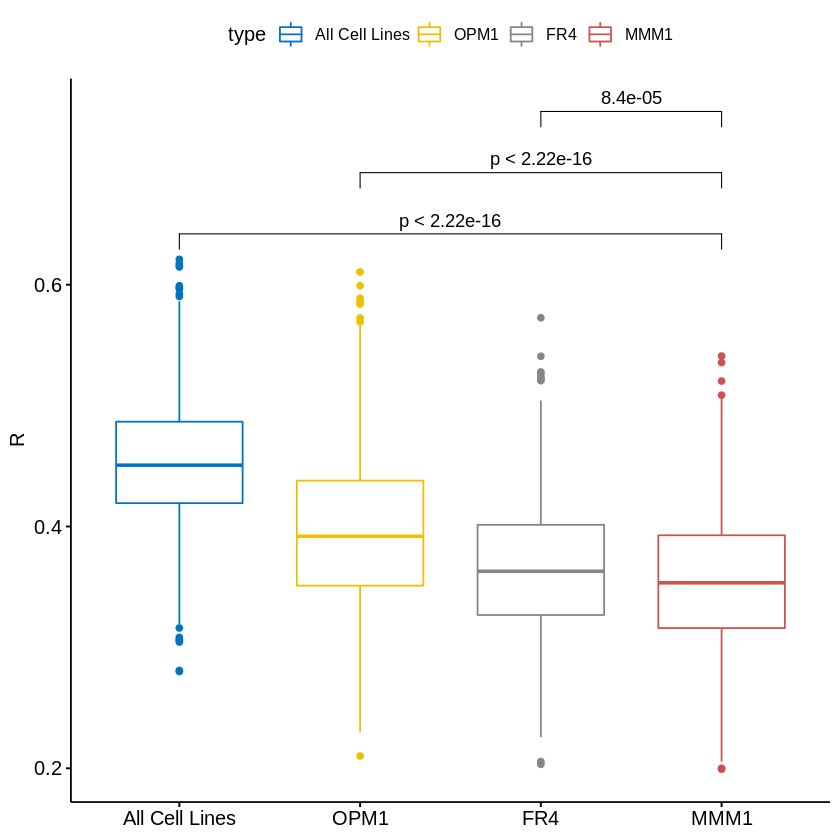

In [28]:
# fusing data frames together for final boxplot comparing best and worst cell lines to all others

cor_b_final = rbind(cor_ANBL6, cor_almc1)
cor_b_final = rbind(cor_b_final, cor_oth)
cor_b_final = rbind(cor_b_final, cor_OPM1)
cor_b_final = rbind(cor_b_final, cor_FR4)
cor_b_final = rbind(cor_b_final, cor_MMM1)

cor_b_final2 = rbind(cor_ANBL6, cor_almc1)
cor_b_final2 = rbind(cor_b_final2, cor_oth)

cor_b_final3 = rbind(cor_oth, cor_OPM1)
cor_b_final3 = rbind(cor_b_final3, cor_FR4)
cor_b_final3 = rbind(cor_b_final3, cor_MMM1)

# making vectors for which pairwise wilcoxon rank sum test p-values to present

my_comparisons = list(c("ANBL6", "ALMC1"), 
                      c("ANBL6", "All Cell Lines"), c('All Cell Lines', 'MMM1'), 
                      c('OPM1', 'MMM1'), c('FR4', 'MMM1'))

my_comparisons2 = list(c("ANBL6", "ALMC1"), 
                       c("ANBL6", "All Cell Lines"))

my_comparisons3 = list(c('All Cell Lines', 'MMM1'), 
                       c('OPM1', 'MMM1'), c('FR4', 'MMM1'))

# pairwise boxplots of best and worst cell lines to other cell lines and for best only, and for worst only

options(repr.plot.width = 7, repr.plot.height = 5.5)

ggboxplot(cor_b_final, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0,
         palette = "jco", ylab = "R", xlab = "FALSE")+
  stat_compare_means(comparisons = my_comparisons, method = 'wilcox.test')

options(repr.plot.width = 7, repr.plot.height = 7)

ggboxplot(cor_b_final2, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0,
         palette = "jco", ylab = "R", xlab = "FALSE")+
  stat_compare_means(comparisons = my_comparisons2, method = 'wilcox.test')

ggboxplot(cor_b_final3, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0,
         palette = "jco", ylab = "R", xlab = "FALSE")+
  stat_compare_means(comparisons = my_comparisons3, method = 'wilcox.test')

[1] 0.4752717

[1] 0.4451471

[1] 0.474015

[1] 0.4508353

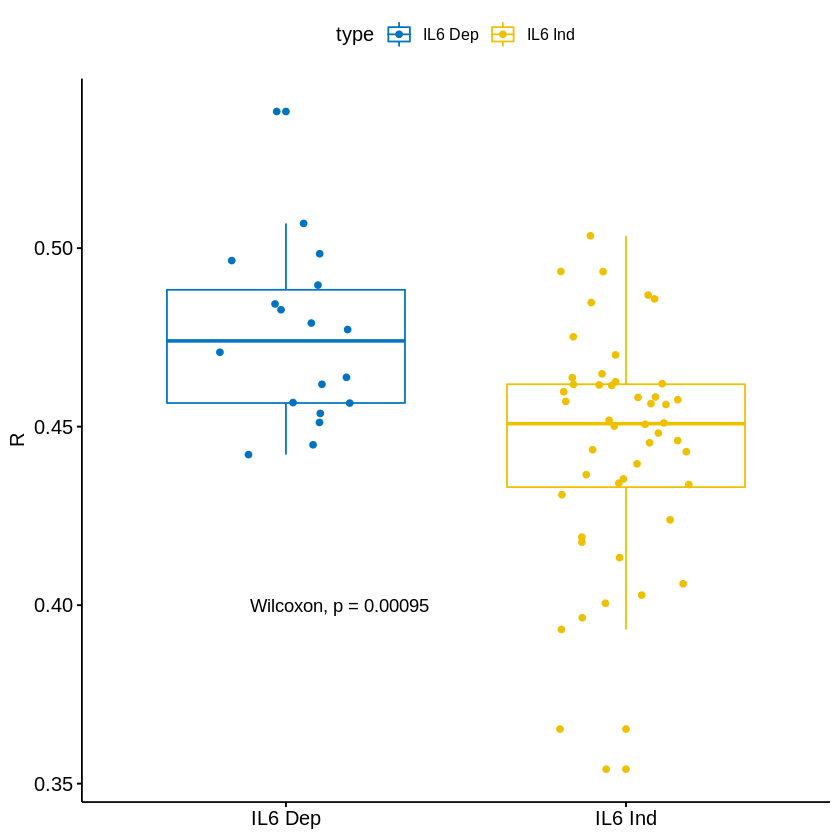

In [29]:
# subsetting for cell lines that are IL6 dependent and independent

cell_names_il6 = c('ALMC1','ALMC2','ANBL6','DP6','INA6','JK6L','JMW1','KAS61'
                   ,'KP6','OH2','PCM6','PE1','PE2','VP6','XG1','XG2','XG6','XG7')

il6_bool = colnames(MM_cell_line) %in% cell_names_il6
cor_il6_dep = MM.cor.keats_5[,cell_names_il6]
cor_il6_ndep = MM.cor.keats_5[,!il6_bool]

#gathering mean correlates for cell lines and assigning type

cor_il6_dep = colMeans(cor_il6_dep)
cor_il6_ndep = colMeans(cor_il6_ndep)
cor_il6_dep = as.data.frame(cor_il6_dep)
cor_il6_dep$type = 'IL6 Dep'
cor_il6_ndep = as.data.frame(cor_il6_ndep)
cor_il6_ndep$type = 'IL6 Ind'
colnames(cor_il6_dep) = c('cor', 'type')
colnames(cor_il6_ndep) = c('cor', 'type')

# fusing data frames by row for boxplot

cor_il6_bound = rbind(cor_il6_dep, cor_il6_ndep)

# boxplot comparing patient correlate means to Il6 dependent cell lines and non-il6 dependent cell lines

ggboxplot(cor_il6_bound, x = "type", y = "cor", fontsize = 14,
          color = "type", palette = "jco",
          add = "jitter", ylab = 'R', xlab = FALSE)+
stat_compare_means(label.y = 0.4)

mean(cor_il6_dep$cor)
mean(cor_il6_ndep$cor)

median(cor_il6_dep$cor)
median(cor_il6_ndep$cor)

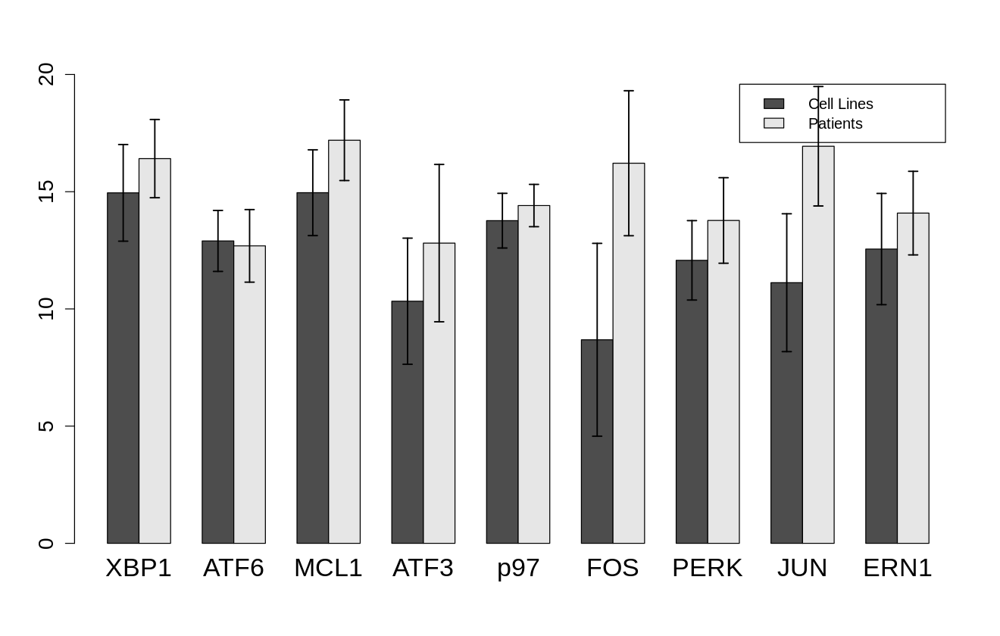

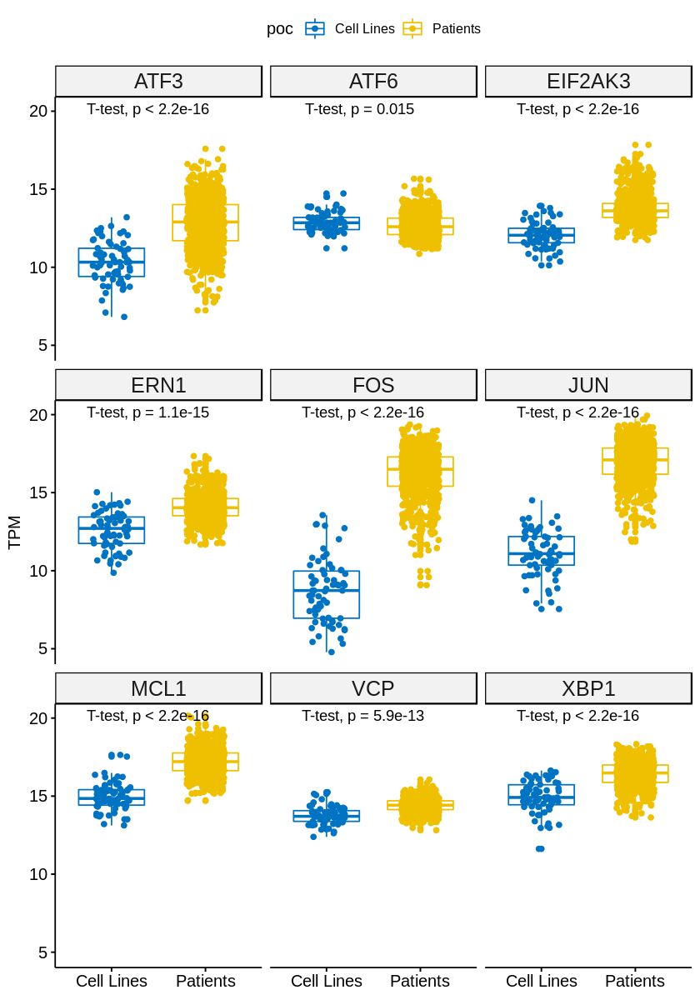

In [30]:
# subsetting for UPR/ER genes

g_chk_exp = c('ENSG00000100219', 'ENSG00000178607', 'ENSG00000118217', 
             'ENSG00000162772', 'ENSG00000172071', 'ENSG00000165280', 'ENSG00000170345', 'ENSG00000177606', 
             'ENSG00000143384')
g_chk_exp_bool = rownames(norm_combined) %in% g_chk_exp
g_chk_exp_final = norm_combined[g_chk_exp_bool,]
g_chk_exp_cell = g_chk_exp_final[,colnames(MM_cell_line)]
g_chk_exp_pat = g_chk_exp_final[,colnames(MM_patients_nd)]

# calculating mean expression levels as well as standard deviations

mean_exp_cell = rowMeans(g_chk_exp_cell)
mean_exp_pat = rowMeans(g_chk_exp_pat)

sd_exp_cell = apply(g_chk_exp_cell, 1, sd)
sd_exp_pat = apply(g_chk_exp_pat, 1, sd)
sd_all = rbind(sd_exp_cell, sd_exp_pat)

# fusing data frames by row and assigning type

bp = rbind(mean_exp_cell, mean_exp_pat)
rownames(bp) = c('Cell Lines', 'Patients')

# barplots of gene expression levels

options(repr.plot.width = 11, repr.plot.height = 7)

bplot = barplot(bp,beside = TRUE, legend = TRUE, names.arg = c('XBP1', 'ATF6',
'MCL1', 'ATF3', 'p97', 'FOS', 'PERK', 'JUN', 'ERN1'), ylim = c(0,20), cex.names = 1.7, cex.axis = 1.4)

arrows(bplot, rbind(mean_exp_cell, mean_exp_pat) - sd_all * 2, bplot,
       rbind(mean_exp_cell, mean_exp_pat) + sd_all * 2, lwd = 1.5, angle = 90,
       code = 3, length = 0.05)

options(repr.plot.width = 7, repr.plot.height = 7)

# prepping data for boxplots by fusing cell line expression levels and patient expression levels per gene

xbp1pat = as.data.frame(g_chk_exp_pat['ENSG00000100219',])
xbp1pat$poc = 'Patients'
colnames(xbp1pat) = c('TPM', 'poc')
xbp1cell = as.data.frame(g_chk_exp_cell['ENSG00000100219',])
xbp1cell$poc = 'Cell Lines'
colnames(xbp1cell) = c('TPM', 'poc')
xbp1_b = rbind(xbp1cell, xbp1pat)

atf6pat = as.data.frame(g_chk_exp_pat['ENSG00000118217',])
atf6pat$poc = 'Patients'
colnames(atf6pat) = c('TPM', 'poc')
atf6cell = as.data.frame(g_chk_exp_cell['ENSG00000118217',])
atf6cell$poc = 'Cell Lines'
colnames(atf6cell) = c('TPM', 'poc')
atf6_b = rbind(atf6cell, atf6pat)

mcl1pat = as.data.frame(g_chk_exp_pat['ENSG00000143384',])
mcl1pat$poc = 'Patients'
colnames(mcl1pat) = c('TPM', 'poc')
mcl1cell = as.data.frame(g_chk_exp_cell['ENSG00000143384',])
mcl1cell$poc = 'Cell Lines'
colnames(mcl1cell) = c('TPM', 'poc')
mcl1_b = rbind(mcl1cell, mcl1pat)

atf3pat = as.data.frame(g_chk_exp_pat['ENSG00000162772',])
atf3pat$poc = 'Patients'
colnames(atf3pat) = c('TPM', 'poc')
atf3cell = as.data.frame(g_chk_exp_cell['ENSG00000162772',])
atf3cell$poc = 'Cell Lines'
colnames(atf3cell) = c('TPM', 'poc')
atf3_b = rbind(atf3cell, atf3pat)

vcppat = as.data.frame(g_chk_exp_pat['ENSG00000165280',])
vcppat$poc = 'Patients'
colnames(vcppat) = c('TPM', 'poc')
vcpcell = as.data.frame(g_chk_exp_cell['ENSG00000165280',])
vcpcell$poc = 'Cell Lines'
colnames(vcpcell) = c('TPM', 'poc')
vcp_b = rbind(vcpcell, vcppat)

fospat = as.data.frame(g_chk_exp_pat['ENSG00000170345',])
fospat$poc = 'Patients'
colnames(fospat) = c('TPM', 'poc')
foscell = as.data.frame(g_chk_exp_cell['ENSG00000170345',])
foscell$poc = 'Cell Lines'
colnames(foscell) = c('TPM', 'poc')
fos_b = rbind(foscell, fospat)

eif2ak3pat = as.data.frame(g_chk_exp_pat['ENSG00000172071',])
eif2ak3pat$poc = 'Patients'
colnames(eif2ak3pat) = c('TPM', 'poc')
eif2ak3cell = as.data.frame(g_chk_exp_cell['ENSG00000172071',])
eif2ak3cell$poc = 'Cell Lines'
colnames(eif2ak3cell) = c('TPM', 'poc')
eif2ak3_b = rbind(eif2ak3cell, eif2ak3pat)

junpat = as.data.frame(g_chk_exp_pat['ENSG00000177606',])
junpat$poc = 'Patients'
colnames(junpat) = c('TPM', 'poc')
juncell = as.data.frame(g_chk_exp_cell['ENSG00000177606',])
juncell$poc = 'Cell Lines'
colnames(juncell) = c('TPM', 'poc')
jun_b = rbind(juncell, junpat)

ern1pat = as.data.frame(g_chk_exp_pat['ENSG00000178607',])
ern1pat$poc = 'Patients'
colnames(ern1pat) = c('TPM', 'poc')
ern1cell = as.data.frame(g_chk_exp_cell['ENSG00000178607',])
ern1cell$poc = 'Cell Lines'
colnames(ern1cell) = c('TPM', 'poc')
ern1_b = rbind(ern1cell, ern1pat)

# assigning subtype for faceted plot

xbp1_b$Subtype = 'XBP1'
atf6_b$Subtype = 'ATF6'
mcl1_b$Subtype = 'MCL1'
atf3_b$Subtype = 'ATF3'
vcp_b$Subtype = 'VCP'
fos_b$Subtype = 'FOS'
eif2ak3_b$Subtype = 'EIF2AK3'
jun_b$Subtype = 'JUN'
ern1_b$Subtype = 'ERN1'

# fusing all data frames by row

gcf = rbind(xbp1_b, atf6_b)
gcf = rbind(gcf, mcl1_b)
gcf = rbind(gcf, atf3_b)
gcf = rbind(gcf, vcp_b)
gcf = rbind(gcf, fos_b)
gcf = rbind(gcf, eif2ak3_b)
gcf = rbind(gcf, jun_b)
gcf = rbind(gcf, ern1_b)

# boxplots comparing expression levels of each gene in cell lines v patients

p <- ggboxplot(gcf, x = "poc", y = "TPM",
          color = "poc", palette = "jco",
          add = "jitter", xlab = FALSE) + stat_compare_means(method = 't.test')

options(repr.plot.height = 10, repr.plot.width = 7)

facet(p, facet.by = 'Subtype', 
     panel.labs.font = list(face = NULL,color = NULL, size = 15, angle = NULL))

options(repr.plot.height = 7, repr.plot.width = 7)

MMRF_2739_1_BM 
     0.7428391

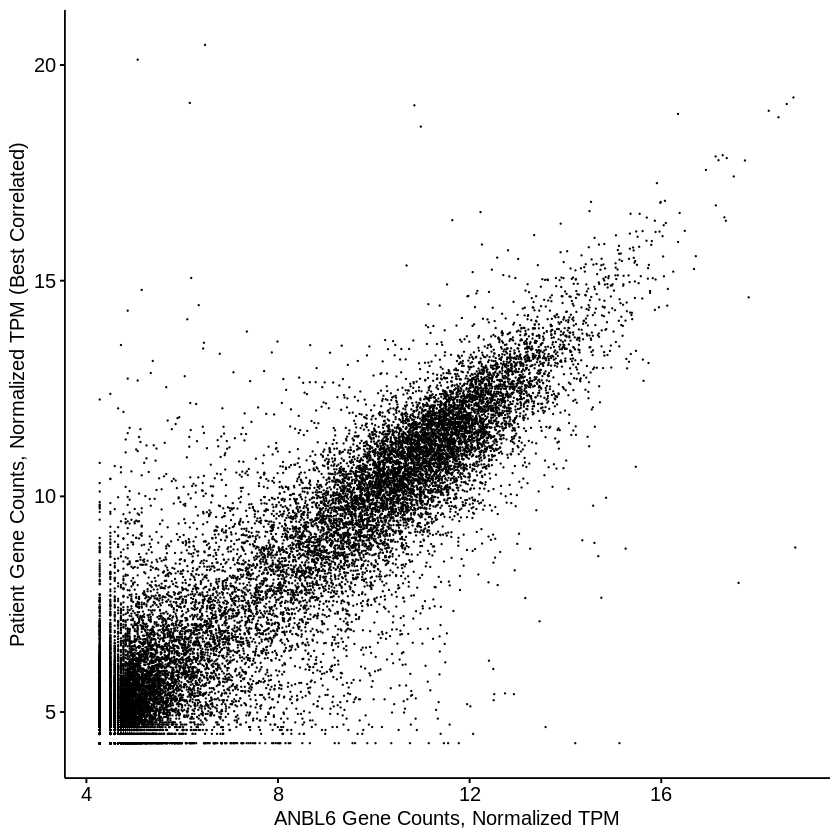

In [31]:
# printing out best patient for ANBL6

anbl.best = sort(MM.cor.keats_5[,'ANBL6'], decreasing = TRUE)
anbl.best[1]

# subsetting for best patient correlated to ANBL6 and fusing data frame with ANBL6 gene counts

best_pat_anbl_counts = norm_pat[,'MMRF_2739_1_BM']
anbl_counts = norm_cell[,'ANBL6']

best_anbl_sc = as.data.frame(anbl_counts)
best_anbl_sc$pat = best_pat_anbl_counts

# scatter plot of gene counts for best correlated patient, vs. ANBL6

ggscatter(best_anbl_sc, x = 'anbl_counts', y = 'pat', 
          xlab = 'ANBL6 Gene Counts, Normalized TPM', 
          ylab = 'Patient Gene Counts, Normalized TPM (Best Correlated)', 
          size = 0.01)

MMRF_1537_1_BM 
     0.3461867

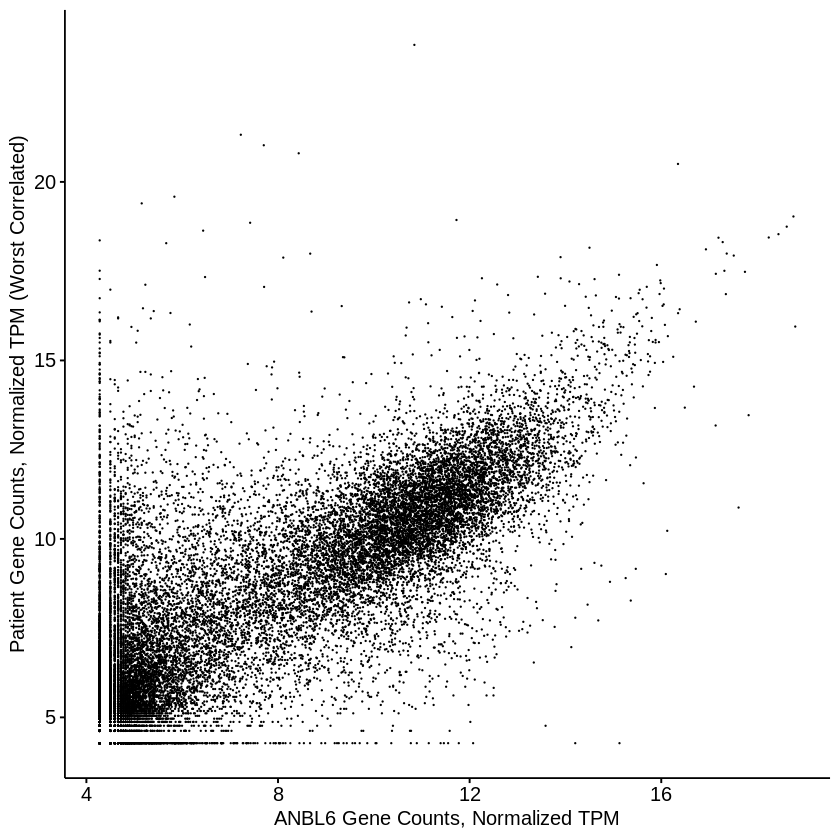

In [32]:
# printing out worst patient for ANBL6

anbl.worst = sort(MM.cor.keats_5[,'ANBL6'], decreasing = FALSE)
anbl.worst[1]

# subsetting for worst correlated patient to ANBL6 and fusing data frame with ANBL6 gene counts

worst_pat_anbl_counts = norm_pat[,'MMRF_1537_1_BM']
worst_anbl_sc = as.data.frame(anbl_counts)
worst_anbl_sc$pat = worst_pat_anbl_counts

# scatter plot of gene counts for worst correlated patient to ANBL6

ggscatter(worst_anbl_sc, x = 'anbl_counts', y = 'pat', xlab = 'ANBL6 Gene Counts, Normalized TPM', 
          ylab = 'Patient Gene Counts, Normalized TPM (Worst Correlated)',
          size = 0.01)

MMRF_1771_1_BM 
     0.5086251

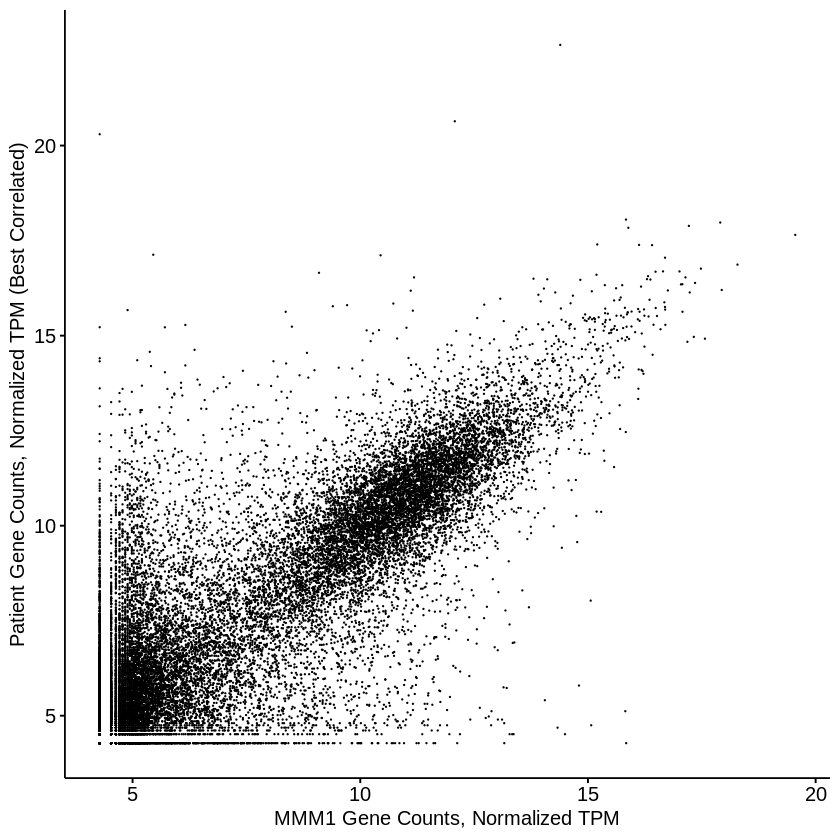

In [33]:
# printing out best correlated patient to MMM1

mmm1.best = sort(MM.cor.keats_5_nd[,'MMM1'], decreasing = TRUE)
head(mmm1.best[1])

# subsetting for gene counts of best correlated patient to MMM1 and fusing data frames

best_pat_mmm1_counts = norm_pat_nd[,'MMRF_1771_1_BM']
mmm1_counts = norm_cell[,'MMM1']

best_mmm1_sc = as.data.frame(mmm1_counts)
best_mmm1_sc$pat = best_pat_mmm1_counts

# scatter plot of best correlated patient to MMM1 

ggscatter(best_mmm1_sc, x = 'mmm1_counts', y = 'pat', xlab = 'MMM1 Gene Counts, Normalized TPM', 
          ylab = 'Patient Gene Counts, Normalized TPM (Best Correlated)', 
          size = 0.01)

MMRF_2291_1_BM 
      0.199289

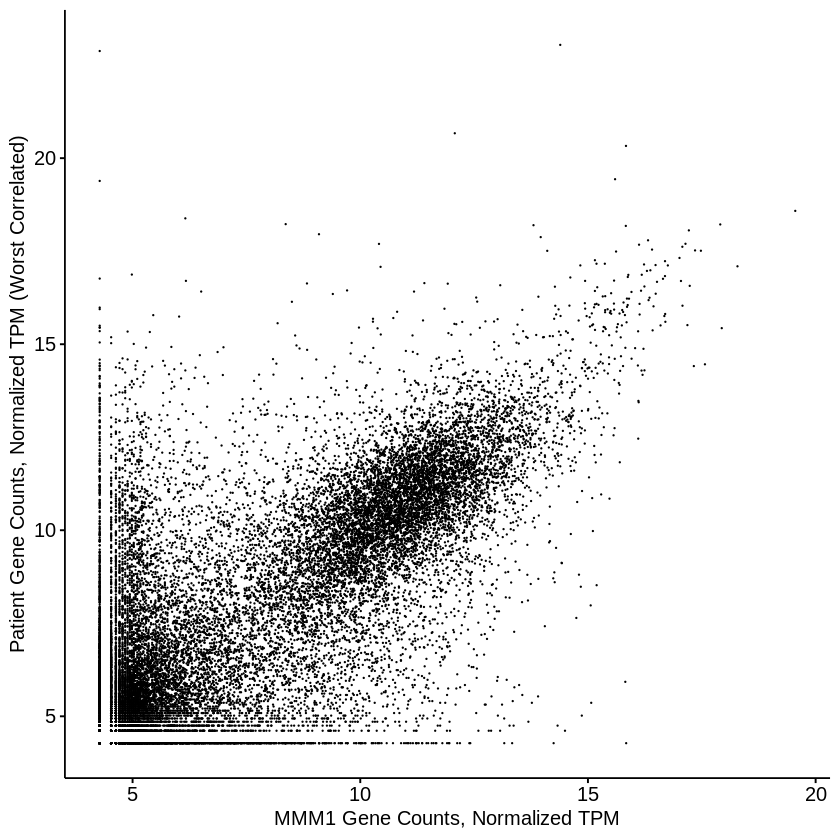

In [34]:
# printing out worst patient to MMM1

mmm1.worst = sort(MM.cor.keats_5_nd[,'MMM1'], decreasing = FALSE)
head(mmm1.worst[1])

# subsetting for worst correlated patient to MMM1 and fusing data frame with MMM1 gene counts

worst_pat_mmm1_counts = norm_pat[,'MMRF_2291_1_BM']
worst_mmm1_sc = as.data.frame(mmm1_counts)
worst_mmm1_sc$pat = worst_pat_mmm1_counts

# scatter plot of worst correlated patient to MMM1

ggscatter(worst_mmm1_sc, x = 'mmm1_counts', y = 'pat',
          xlab = 'MMM1 Gene Counts, Normalized TPM', 
          ylab  = 'Patient Gene Counts, Normalized TPM (Worst Correlated)', 
          size = 0.01)

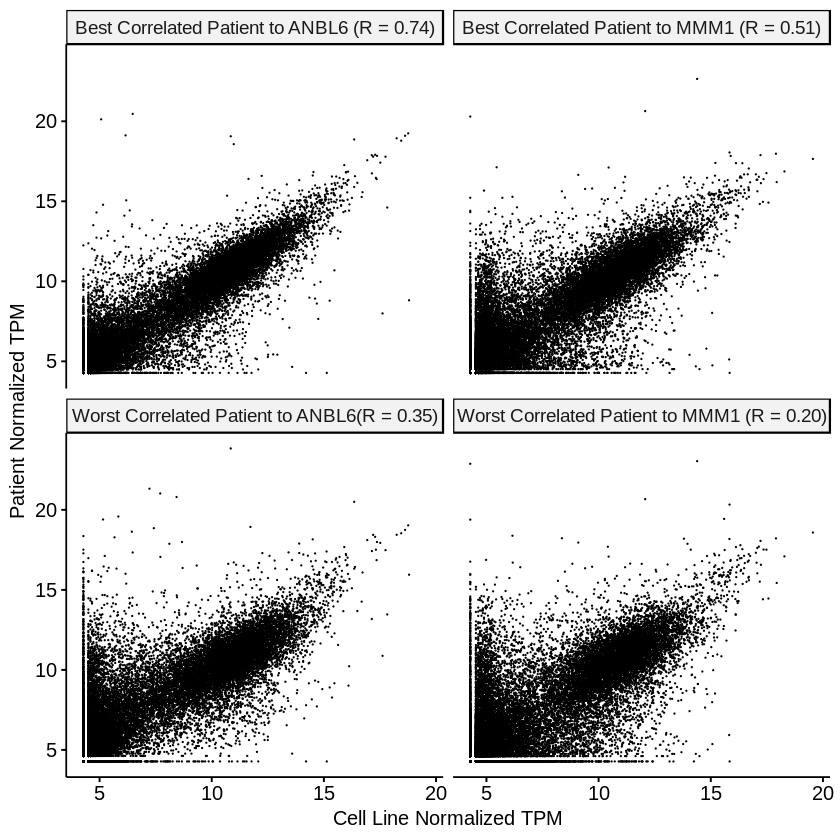

In [35]:
# assigning subtype and column names for faceted scatter plot

best_anbl_sc$Subtype = 'Best Correlated Patient to ANBL6 (R = 0.74)'
worst_anbl_sc$Subtype = 'Worst Correlated Patient to ANBL6(R = 0.35)'
best_mmm1_sc$Subtype = 'Best Correlated Patient to MMM1 (R = 0.51)'
worst_mmm1_sc$Subtype = 'Worst Correlated Patient to MMM1 (R = 0.20)'

colnames(best_anbl_sc) = c('Cell_Line_Counts', 'Patient_Counts', 'Subtype')
colnames(worst_anbl_sc) = c('Cell_Line_Counts', 'Patient_Counts', 'Subtype')
colnames(best_mmm1_sc) = c('Cell_Line_Counts', 'Patient_Counts', 'Subtype')
colnames(worst_mmm1_sc) = c('Cell_Line_Counts', 'Patient_Counts', 'Subtype')

# fusing data frames together for faceted scatter plot

cor_b_final4 = rbind(best_anbl_sc, worst_anbl_sc)
cor_b_final4 = rbind(cor_b_final4, best_mmm1_sc)
cor_b_final4 = rbind(cor_b_final4, worst_mmm1_sc)

# facetted scatter plot of best and worst correlated patients to best and worst cell lines

p = ggscatter(cor_b_final4, x = "Cell_Line_Counts", y = "Patient_Counts", xlab = 'Cell Line Normalized TPM', 
              ylab = 'Patient Normalized TPM', size = 0.001)

facet(p, facet.by = "Subtype", nrow = 2, ncol = 2, 
      panel.labs.font = list(face = NULL,color = NULL, size = 11.32, angle = NULL))

In [36]:
# reading in data for translocations

MM_patients_trans = data.frame(fread("IA13a.structural.variants.annot.translocations.clean.maxHom0.8.minMap0.2.clonality.readRange10000bp.cnvRange2000bp.common.txt"))
MM_patient_trans_ids = MM_patients_trans[,'sample']


cell_names_414 = c('JIM1', 'JIM3', 'JMW1', 'KAS61', 'KHM11', 
                  'KMS11_Adh', 'KMS11_Sus', 'KMS18', 'KMS26',
                  'KMS28BM', 'KMS28PE', 'KMS34', 'LP1',
                  'NCIH929', 'OPM1', 'OPM2', 'PE2', 'UTMC2',
                  'XG7')

cell_names_1114 = c('FLAM76', 'H1112', 'INA6', 'Karpas620', 'KMS12BM',
                   'KMS12PE', 'KMS21BM', 'KMS27', 'MMM1', 'MOLP8',
                   'OCIMY7', 'PE1', 'SKMM2', 'U266', 'XG1')

cell_names_1416 = c('ANBL6', 'JJN3', 'KMS11_Adh', 'KMS11_Sus',
                   'MM1R', 'MM1S', 'OCIMY5', 'PCM6', 'VP6')

cell_names_1420 = c('ALMC1', 'ALMC2', 'EJM', 'Karpas25', 'OH2', 'SKMM1')

write.csv(cell_names_414, '~/Downloads/proj/cell_names_414.csv')
write.csv(cell_names_1114, '~/Downloads/proj/cell_names_1114.csv')
write.csv(cell_names_1416, '~/Downloads/proj/cell_names_1416.csv')
write.csv(cell_names_1420, '~/Downloads/proj/cell_names_1420.csv')

[1] 71

[1] 708

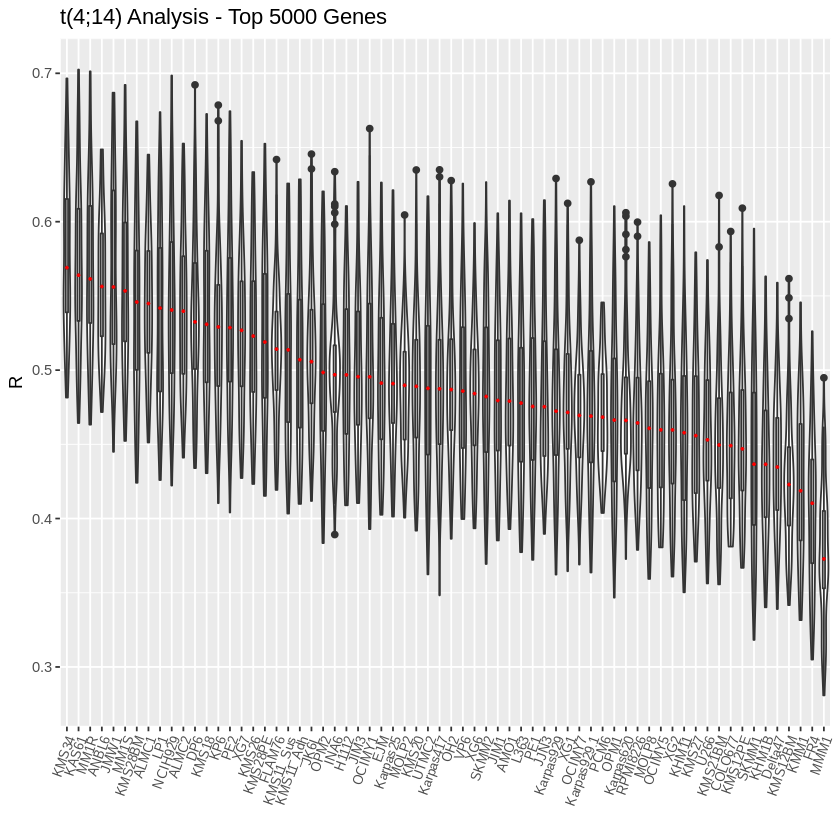

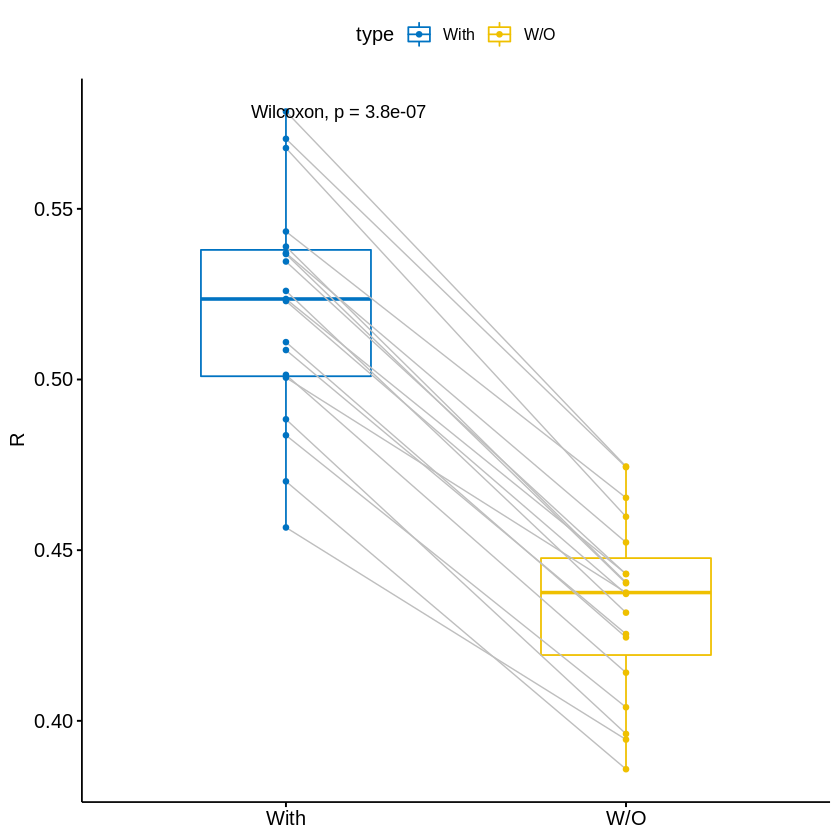

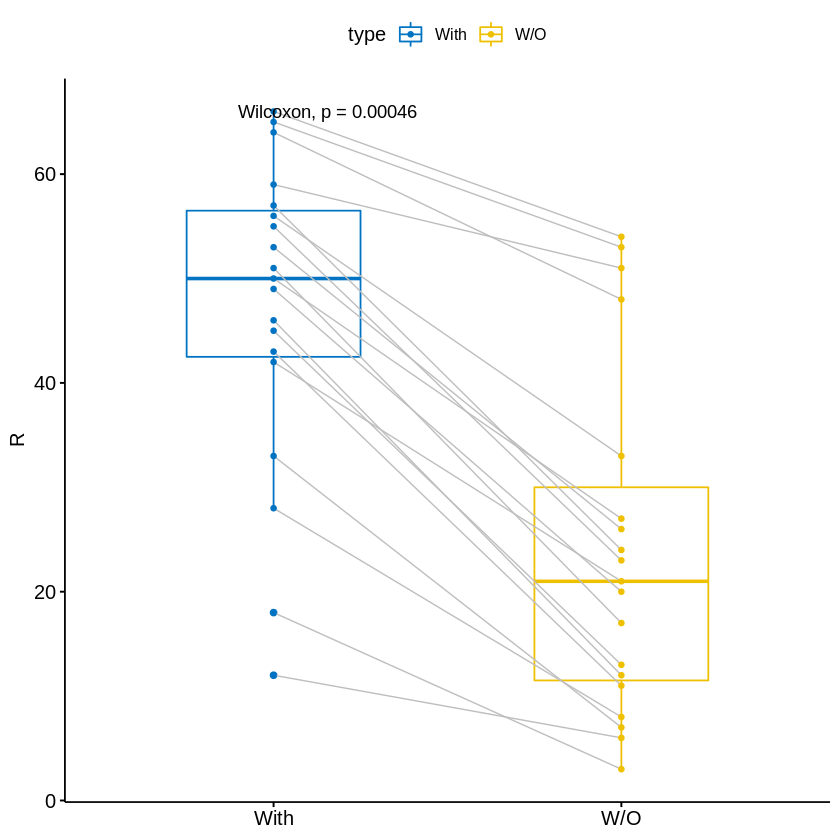

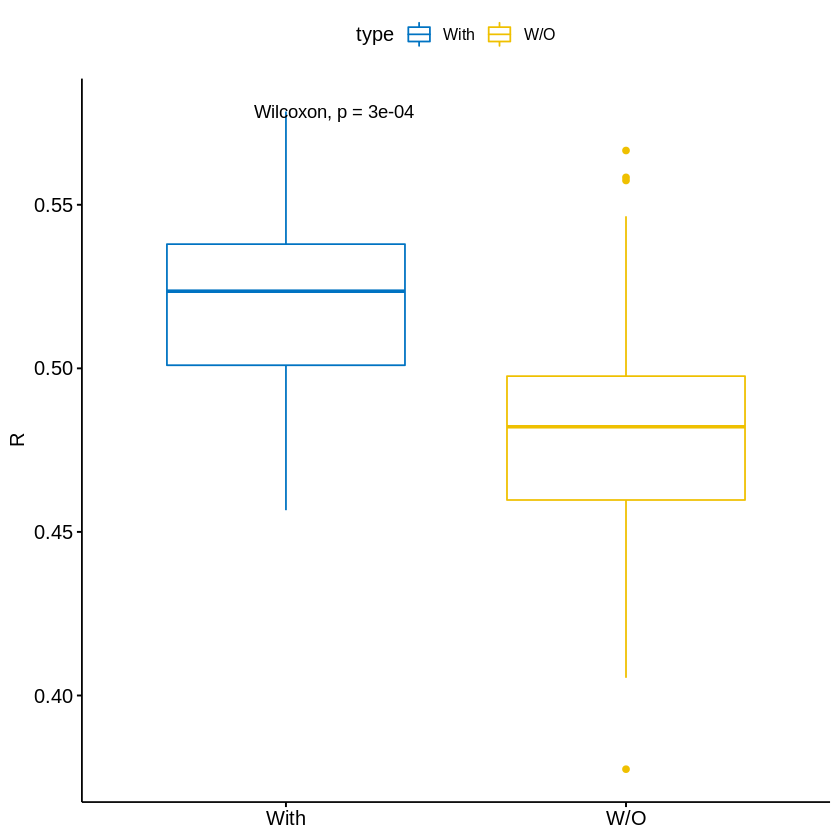

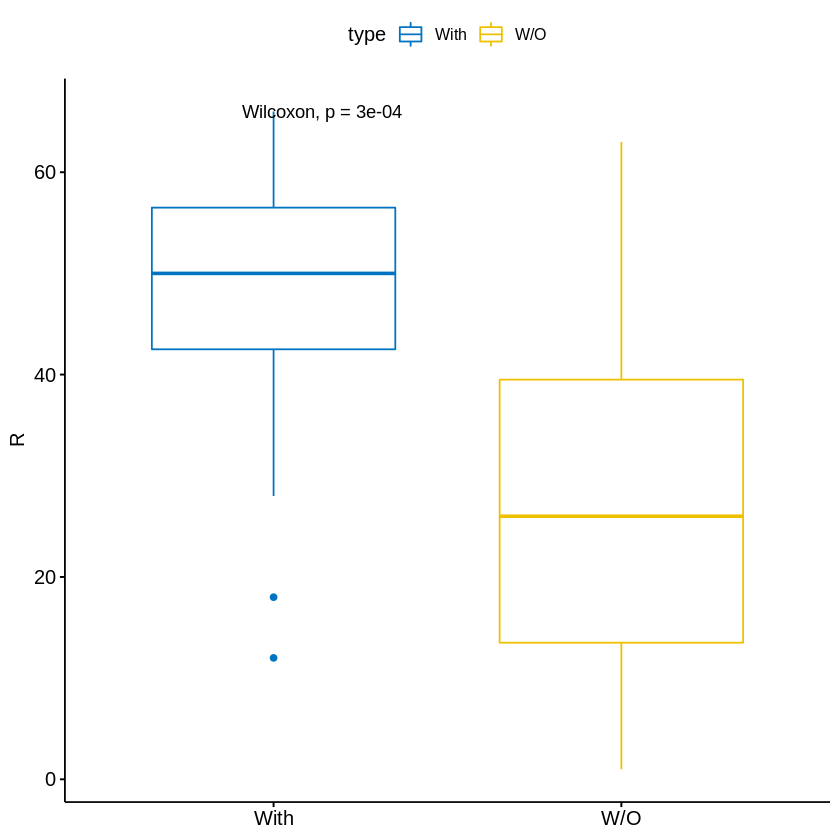

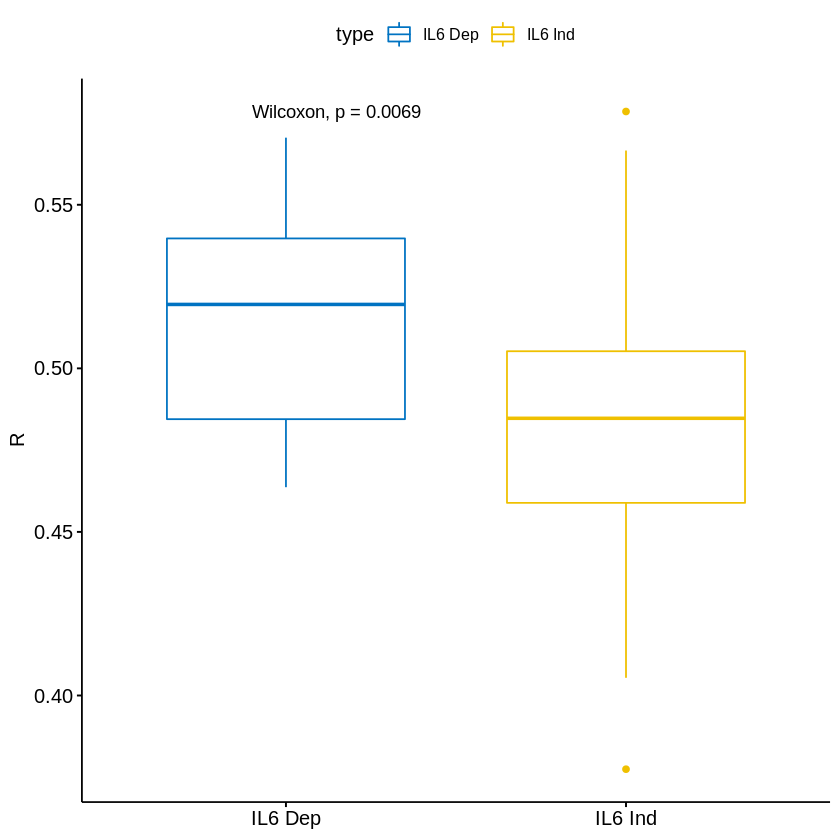

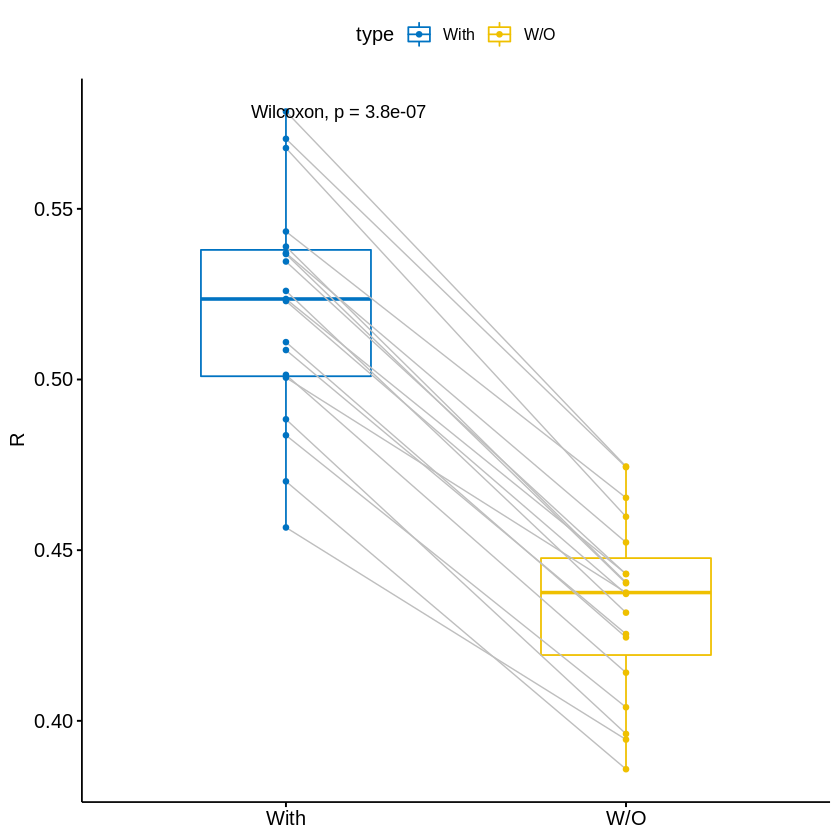

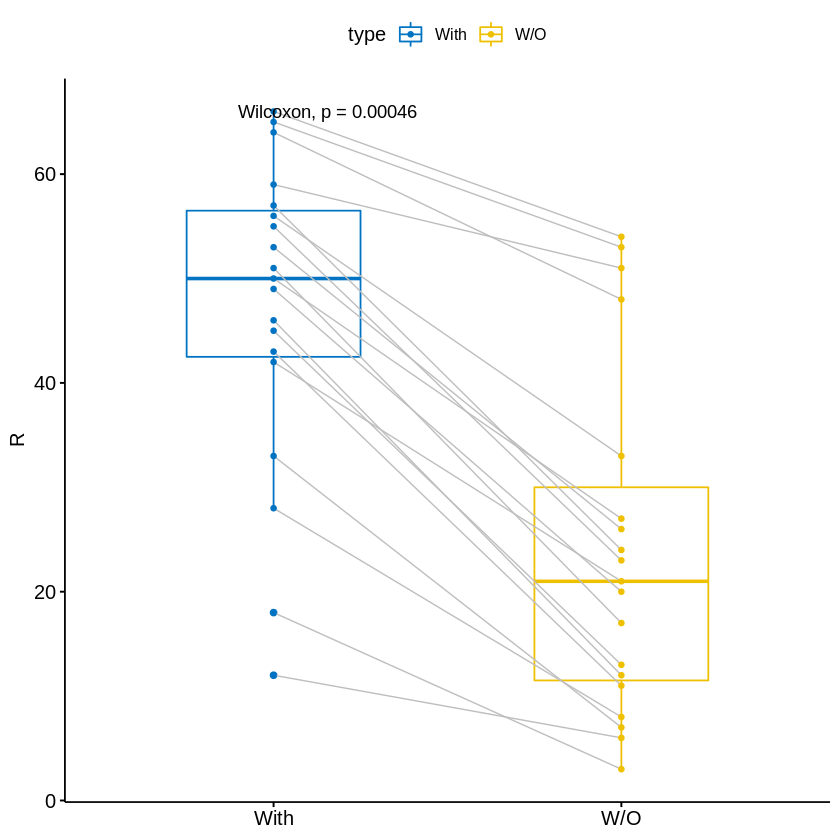

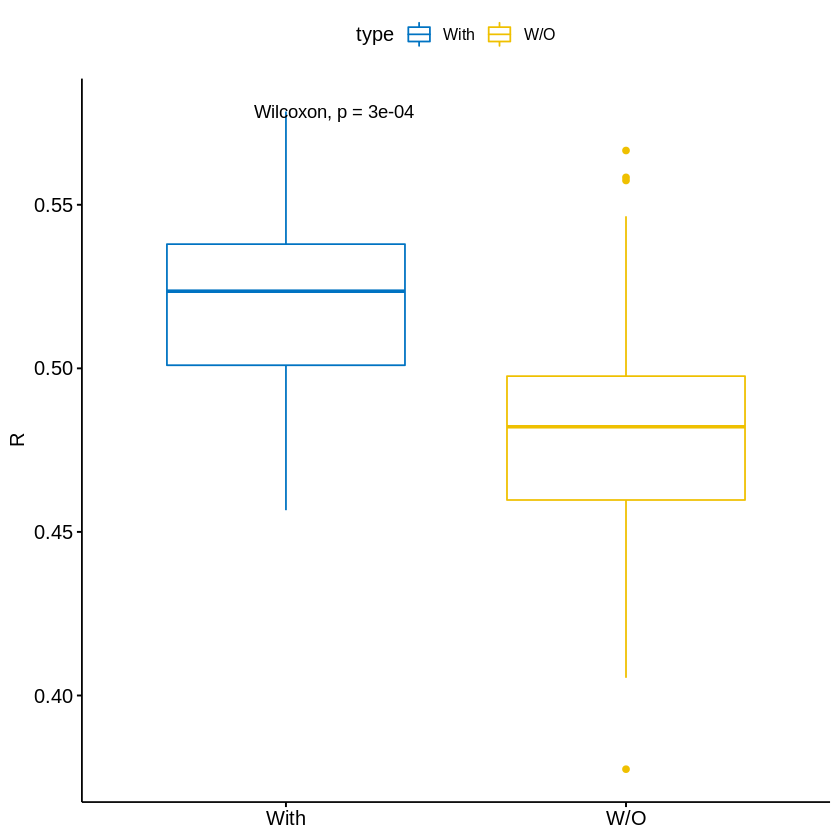

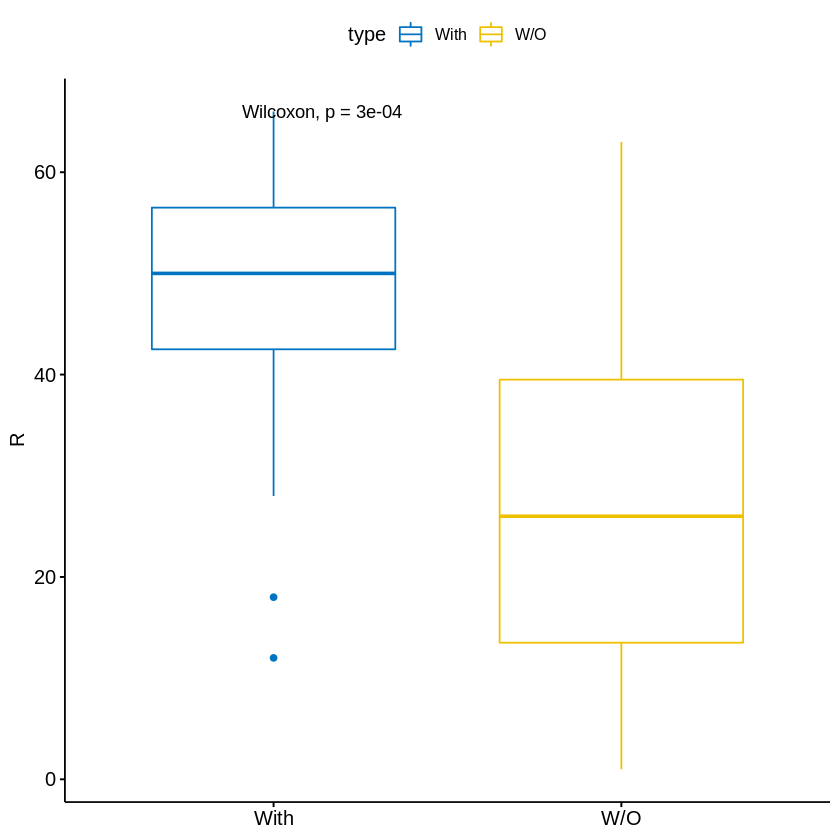

In [37]:
# extracting patients with subtype who are also newly diagnosed

keep414 = as.logical(MM_patients_trans[,'t.4.14.'])
MM_patients_trans_414 = MM_patient_trans_ids[keep414]
MM_patients_trans_414 = unique(MM_patients_trans_414)
MM_patients_new_trans_414 = filter(as.data.frame(MM_patients_trans_414),
                                   str_extract(as.data.frame(MM_patients_trans_414)[,1], "_[0-9]_") == "_1_")
keepc414 = colnames(MM_patients) %in% MM_patients_new_trans_414[,1]

# subsetting norm_pat to those patients with translocation, 
# then keeping genes prior analysed as top 5000 most variably expressed

norm_pat_414 = norm_pat[,keepc414]
norm_combined_414 = cbind(norm_cell, norm_pat_414)
norm_combined_414_5 = norm_combined_414[keepi5000, ]

# making violin plots

makeplots(norm_combined_414_5, colnames(norm_pat_414), 
          colnames(MM_cell_line), 't(4;14) Analysis - Top 5000 Genes')

# extracting correlates of subtype patients and non subtype patients

MM.cor.414 = MM.cor.keats_5[keepc414, ]
MM.cor.414.opat = MM.cor.keats_5[!keepc414, ]
MM.cor.414.opat = MM.cor.414.opat[rownames(MM.cor.414.opat) %in% colnames(MM_patients_nd), ]

# printing out number of patients each

length(MM.cor.414[,1])
length(MM.cor.414.opat[,1])

# getting mean correlates, assigning type, and rank

MM.cor.414.m = data.frame(colMeans(MM.cor.414))
MM.cor.414.m$type = 'With'
colnames(MM.cor.414.m) = c('cor', 'type')
MM.cor.414.m = (MM.cor.414.m[order(MM.cor.414.m$cor),])
MM.cor.414.m$rank = rank_gen
MM.cor.414.m = MM.cor.414.m[order(rownames(MM.cor.414.m)),]

MM.cor.414.opat.m = data.frame(colMeans(MM.cor.414.opat))
MM.cor.414.opat.m$type = 'W/O'
colnames(MM.cor.414.opat.m) = c('cor', 'type')
MM.cor.414.opat.m = MM.cor.414.opat.m[order(MM.cor.414.opat.m$cor),]
MM.cor.414.opat.m$rank = rank_gen
MM.cor.414.opat.m = MM.cor.414.opat.m[order(rownames(MM.cor.414.opat.m)),]

# subsetting for cell lines with subtype

MM.cor.414.m.c = MM.cor.414.m[rownames(MM.cor.414.m) %in% cell_names_414,]
MM.cor.414.opat.m.c = MM.cor.414.opat.m[rownames(MM.cor.414.opat.m) %in% cell_names_414,]

# paired wise boxplots for subtype versus non subtype patients, looking at subtype cell lines

ggpaired(rbind(MM.cor.414.m.c, MM.cor.414.opat.m.c), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggpaired(rbind(MM.cor.414.m.c, MM.cor.414.opat.m.c), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving bound dataframe for faceted subplot

MM.cor.414.bc = rbind(MM.cor.414.m.c, MM.cor.414.opat.m.c)

# subsetting for non subtype cell lines

MM.cor.414.m.c2 = MM.cor.414.m[(!(rownames(MM.cor.414.m) %in% cell_names_414)),]
MM.cor.414.m.c2$type = 'W/O'

# boxplots for subtype patients, looking at subtype cell lines and non subtype cell lines

ggboxplot(rbind(MM.cor.414.m.c, MM.cor.414.m.c2), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggboxplot(rbind(MM.cor.414.m.c, MM.cor.414.m.c2), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving data frame for faceted boxplots

MM.cor.414.bp = rbind(MM.cor.414.m.c, MM.cor.414.m.c2)

# subsetting for IL6 dependent and independent cell lines

MM.cor.414.il6 = rbind(MM.cor.414.m.c, MM.cor.414.m.c2)
MM.cor.414.il6d = MM.cor.414.il6[cell_names_il6, ]
MM.cor.414.il6d$type = 'IL6 Dep'
MM.cor.414.il6i = MM.cor.414.il6[!(rownames(MM.cor.414.il6) %in% cell_names_il6),]
MM.cor.414.il6i$type = 'IL6 Ind'

# boxplot comparing IL6 dependent and independent cell lines, looking at subtype patients

ggboxplot(rbind(MM.cor.414.il6d, MM.cor.414.il6i), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving data frame for faceted boxplot

MM.cor.414.il6b = rbind(MM.cor.414.il6d, MM.cor.414.il6i)

# calculating top 5000 variable genes for subtype patients and repeating same analysis as aboev

keepi_414 = apply(norm_pat_414, 1, IQR)
keepis_414 = sort(keepi, decreasing = TRUE)
keepi5000_414 = keepi %in% keepis[1:5000]
norm_combined_414_5u = norm_combined[keepi5000_414, ]

MM.cor.414.n = cor(norm_combined_414_5u, method = 's')
MM.cor.414.n = MM.cor.414.n[colnames(MM_patients), colnames(MM_cell_line)]
MM.cor.414 = MM.cor.414.n[keepc414, ]
MM.cor.414.opat = MM.cor.414.n[!keepc414, ]
MM.cor.414.opat = MM.cor.414.opat[rownames(MM.cor.414.opat) %in% colnames(MM_patients_nd), ]

MM.cor.414.m = data.frame(colMeans(MM.cor.414))
MM.cor.414.m$type = 'With'
colnames(MM.cor.414.m) = c('cor', 'type')
MM.cor.414.m = (MM.cor.414.m[order(MM.cor.414.m$cor),])
MM.cor.414.m$rank = rank_gen
MM.cor.414.m = MM.cor.414.m[order(rownames(MM.cor.414.m)),]

MM.cor.414.opat.m = data.frame(colMeans(MM.cor.414.opat))
MM.cor.414.opat.m$type = 'W/O'
colnames(MM.cor.414.opat.m) = c('cor', 'type')
MM.cor.414.opat.m = MM.cor.414.opat.m[order(MM.cor.414.opat.m$cor),]
MM.cor.414.opat.m$rank = rank_gen
MM.cor.414.opat.m = MM.cor.414.opat.m[order(rownames(MM.cor.414.opat.m)),]

MM.cor.414.m.c = MM.cor.414.m[rownames(MM.cor.414.m) %in% cell_names_414,]
MM.cor.414.opat.m.c = MM.cor.414.opat.m[rownames(MM.cor.414.opat.m) %in% cell_names_414,]

ggpaired(rbind(MM.cor.414.m.c, MM.cor.414.opat.m.c), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggpaired(rbind(MM.cor.414.m.c, MM.cor.414.opat.m.c), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

MM.cor.414.bcu = rbind(MM.cor.414.m.c, MM.cor.414.opat.m.c)

MM.cor.414.m.c2 = MM.cor.414.m[(!(rownames(MM.cor.414.m) %in% cell_names_414)),]
MM.cor.414.m.c2$type = 'W/O'

ggboxplot(rbind(MM.cor.414.m.c, MM.cor.414.m.c2), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggboxplot(rbind(MM.cor.414.m.c, MM.cor.414.m.c2), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

MM.cor.414.bpu = rbind(MM.cor.414.m.c, MM.cor.414.m.c2)

In [38]:
head(norm_pat_414)
write.csv(colnames(norm_pat_414), '~/Downloads/proj/pat_names_414.csv')

,MMRF_2815_1_BM,MMRF_2636_1_BM,MMRF_1572_1_BM,MMRF_1391_1_BM,MMRF_1785_1_BM,MMRF_2621_1_BM,MMRF_2203_1_BM,MMRF_2694_1_BM,MMRF_2238_1_BM,MMRF_1627_1_BM,⋯,MMRF_1497_1_BM,MMRF_1324_1_BM,MMRF_1216_1_BM,MMRF_1359_1_BM,MMRF_2220_1_BM,MMRF_1613_1_BM,MMRF_2272_1_BM,MMRF_2176_1_BM,MMRF_2118_1_BM,MMRF_2799_1_BM
ENSG00000000003,7.395753,9.147368,9.774809,9.604340,10.337143,4.529480,10.663486,9.891882,4.741433,8.302909,⋯,10.162589,5.063987,4.277689,4.728191,10.937326,5.240426,6.975703,4.874953,5.426375,6.735236
ENSG00000000419,11.818120,11.194608,10.724001,10.553115,11.026008,10.571447,11.273798,10.744090,10.837284,10.959636,⋯,12.032226,10.987237,10.265533,10.477407,11.007511,10.409926,10.897923,11.152262,11.313786,11.864629
ENSG00000000457,8.461872,9.452334,10.013175,9.964653,10.100753,9.990818,8.500860,9.510174,9.295649,10.089232,⋯,9.745145,10.097432,10.662086,10.530455,10.014725,10.183982,9.825180,9.470241,10.136502,8.482865
ENSG00000000460,6.362907,6.464711,8.674847,8.231038,8.861650,9.422540,7.580073,8.347429,7.356191,8.752627,⋯,7.370521,8.337435,8.922385,9.890029,7.351606,8.499452,8.877843,7.730408,8.029364,6.755457
ENSG00000000938,7.792299,6.343884,6.505165,6.033615,5.574395,8.237035,5.888110,7.195715,8.442939,7.793401,⋯,7.025960,6.625898,6.328580,5.589076,5.557494,5.068490,9.220073,5.938263,7.032936,6.672686
ENSG00000000971,9.272141,10.803128,9.588182,7.349411,6.653497,9.124541,8.027327,12.728761,11.122726,5.635081,⋯,10.276824,9.948405,8.245740,8.425102,9.866087,6.412152,8.801940,12.977912,4.952375,6.187998


[1] 27

[1] 752

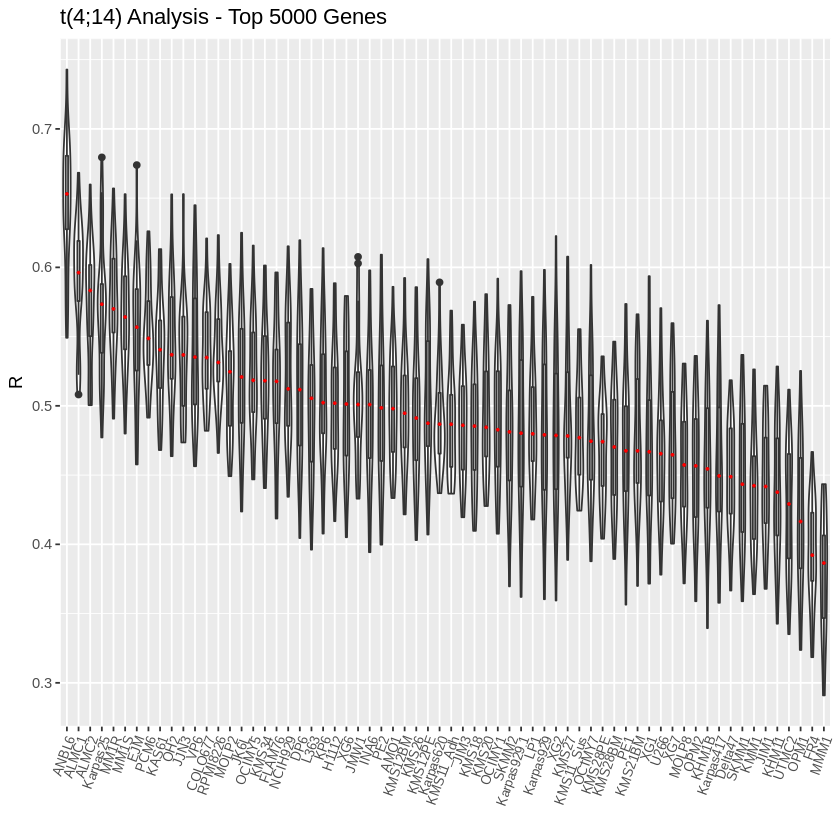

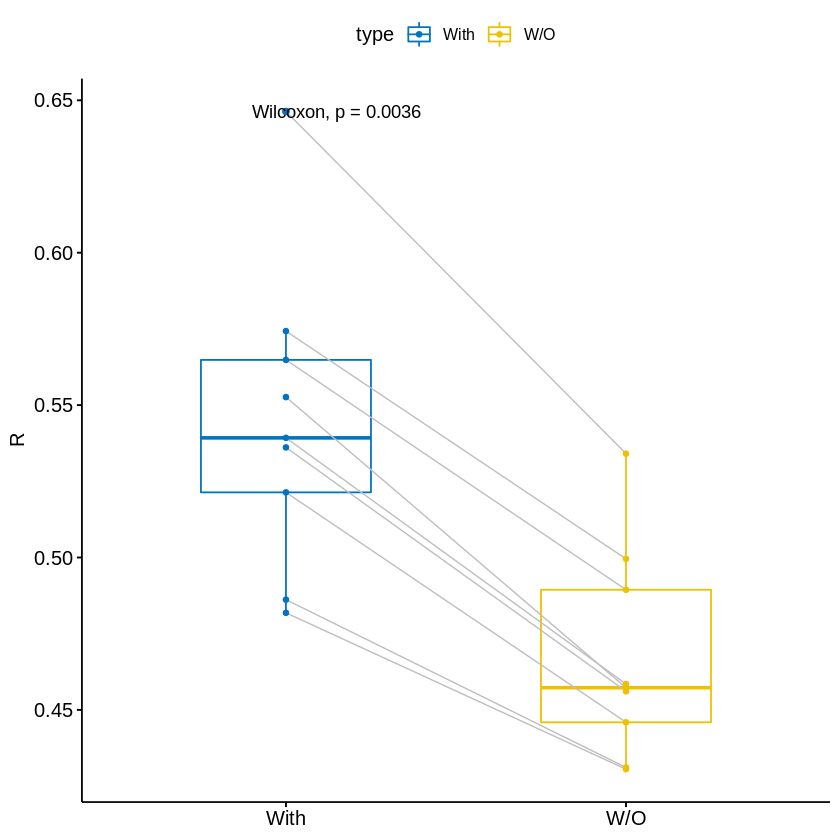

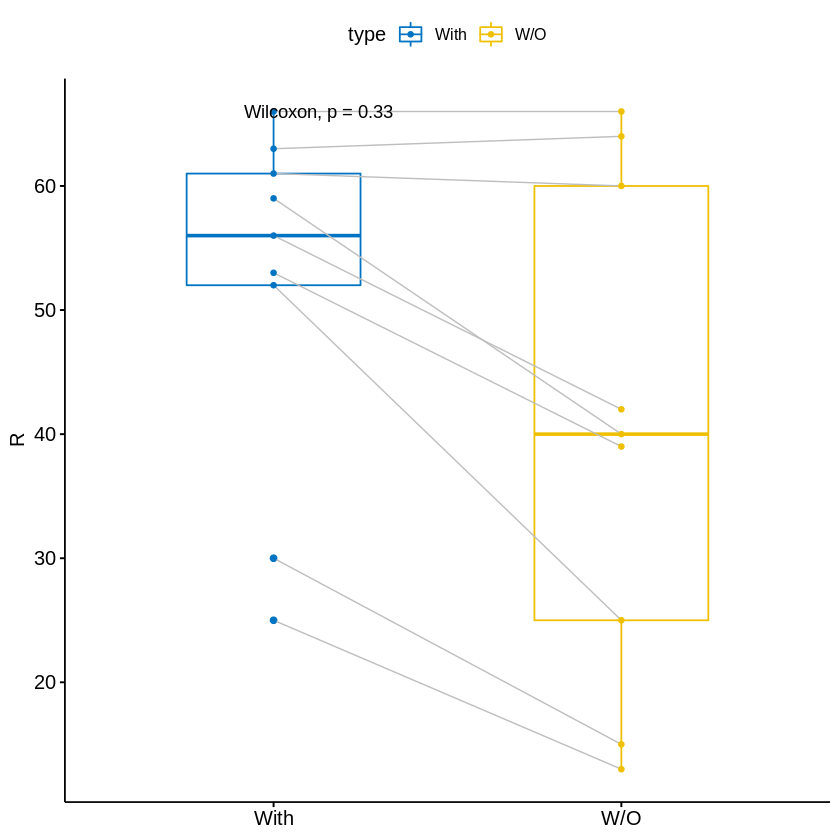

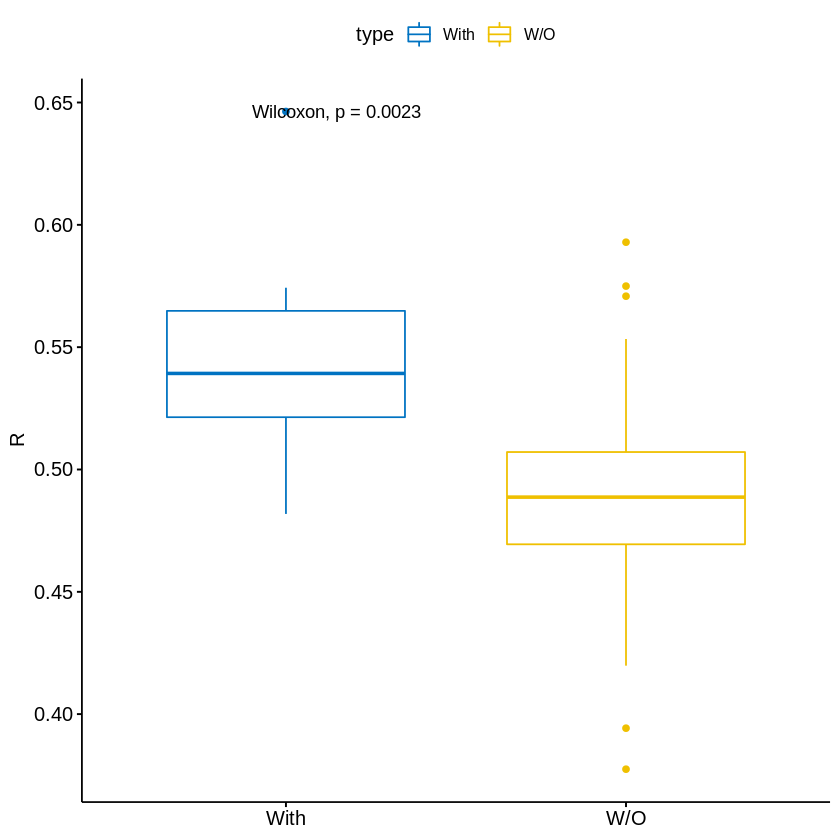

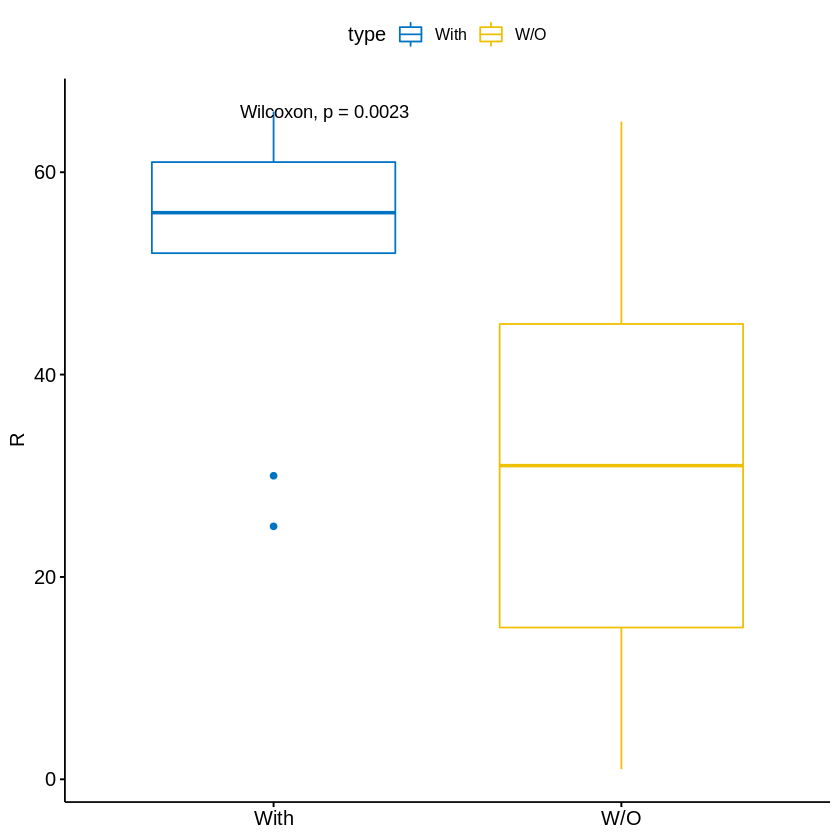

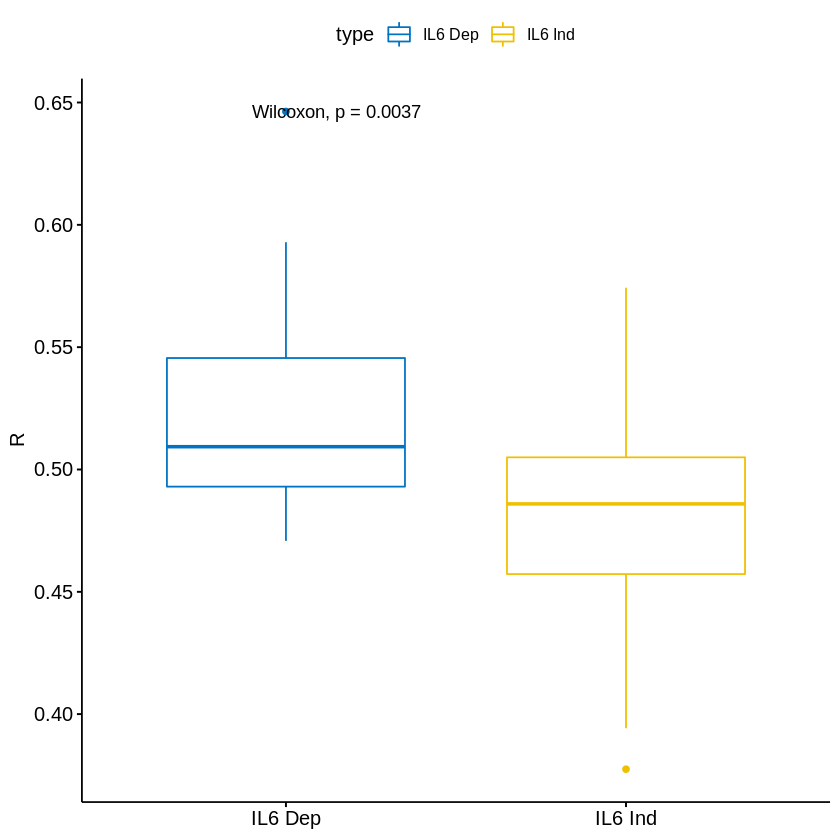

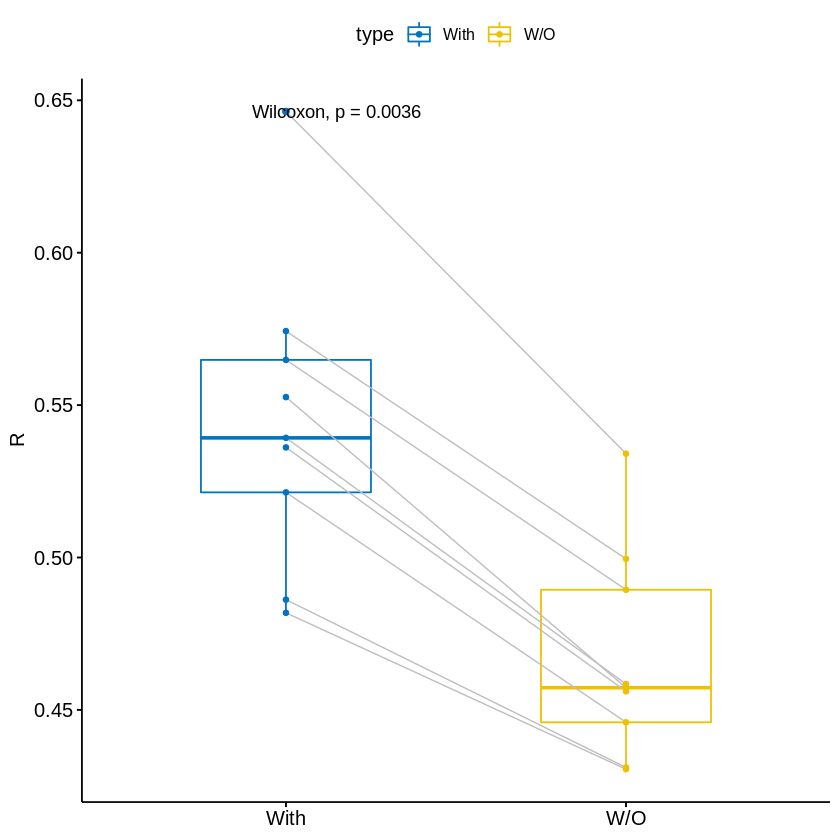

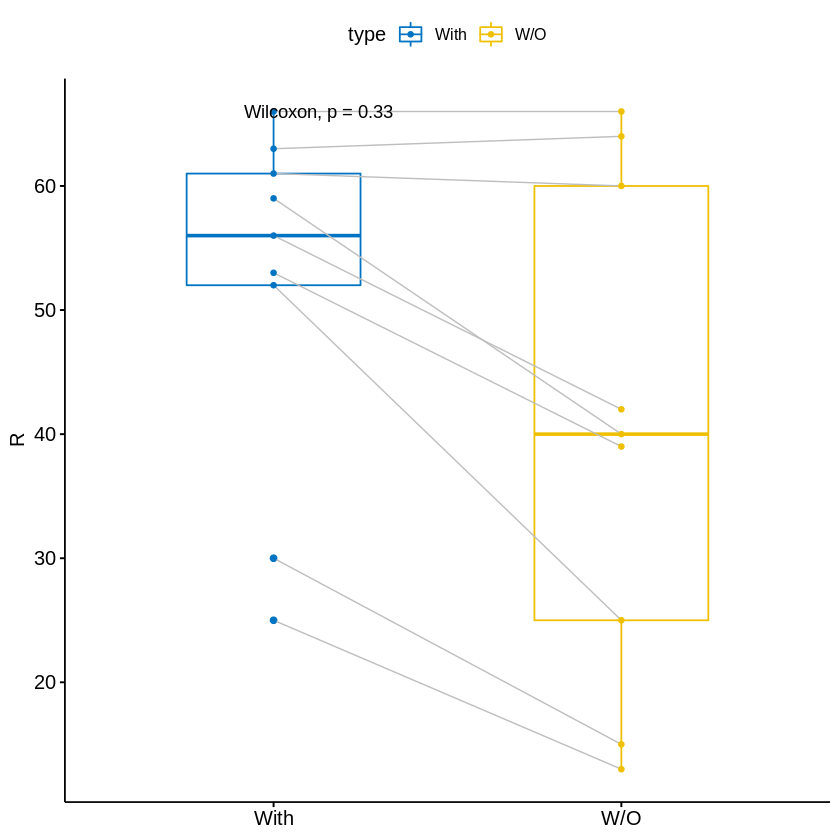

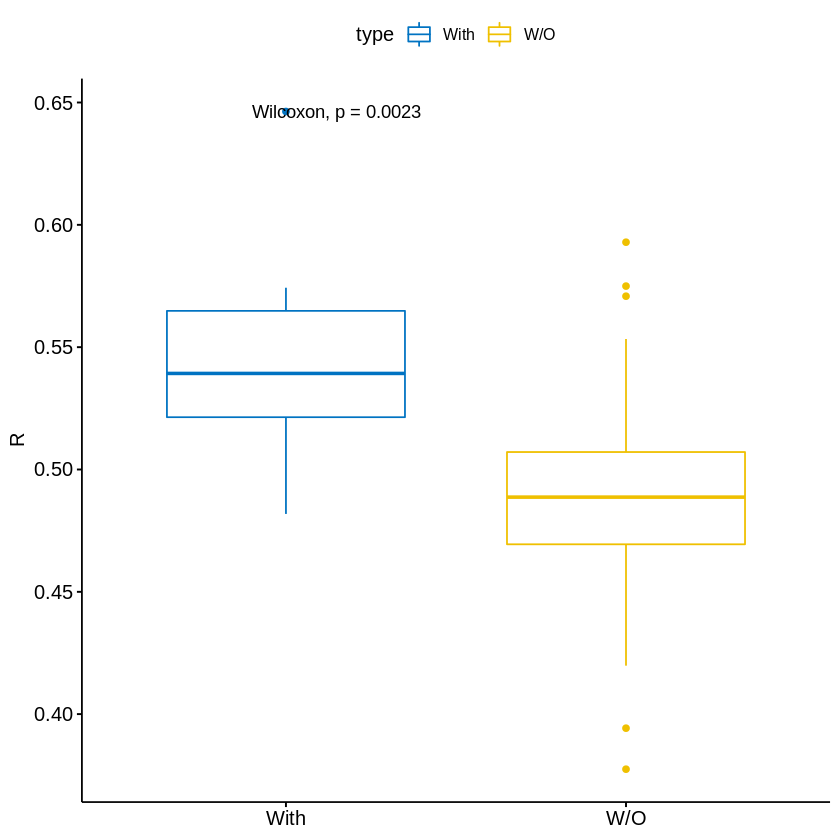

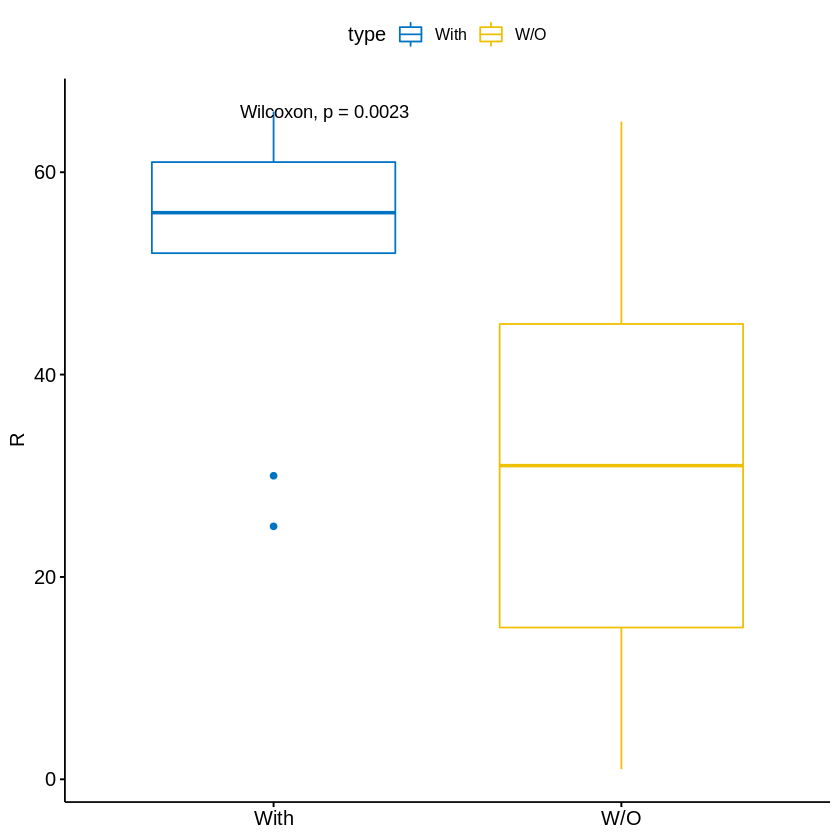

In [39]:
# extracting patients with subtype who are also newly diagnosed

keep1416 = as.logical(MM_patients_trans[,'t.14.16.'])
MM_patients_trans_1416 = MM_patient_trans_ids[keep1416]
MM_patients_trans_1416 = unique(MM_patients_trans_1416)
MM_patients_new_trans_1416 = filter(as.data.frame(MM_patients_trans_1416),
                                   str_extract(as.data.frame(MM_patients_trans_1416)[,1], "_[0-9]_") == "_1_")
keepc1416 = colnames(MM_patients) %in% MM_patients_new_trans_1416[,1]

# subsetting norm_pat to those patients with translocation, 
# then keeping genes prior analysed as top 5000 most variably expressed

norm_pat_1416 = norm_pat[,keepc1416]
norm_combined_1416 = cbind(norm_cell, norm_pat_1416)
norm_combined_1416_5 = norm_combined_1416[keepi5000, ]

# making violin plots

makeplots(norm_combined_1416_5, colnames(norm_pat_1416), 
          colnames(MM_cell_line), 't(4;14) Analysis - Top 5000 Genes')

# extracting correlates of subtype patients and non subtype patients

MM.cor.1416 = MM.cor.keats_5[keepc1416, ]
MM.cor.1416.opat = MM.cor.keats_5[!keepc1416, ]
MM.cor.1416.opat = MM.cor.1416.opat[rownames(MM.cor.1416.opat) %in% colnames(MM_patients_nd), ]

# printing out number of patients each

length(MM.cor.1416[,1])
length(MM.cor.1416.opat[,1])

# getting mean correlates, assigning type, and rank

MM.cor.1416.m = data.frame(colMeans(MM.cor.1416))
MM.cor.1416.m$type = 'With'
colnames(MM.cor.1416.m) = c('cor', 'type')
MM.cor.1416.m = (MM.cor.1416.m[order(MM.cor.1416.m$cor),])
MM.cor.1416.m$rank = rank_gen
MM.cor.1416.m = MM.cor.1416.m[order(rownames(MM.cor.1416.m)),]

MM.cor.1416.opat.m = data.frame(colMeans(MM.cor.1416.opat))
MM.cor.1416.opat.m$type = 'W/O'
colnames(MM.cor.1416.opat.m) = c('cor', 'type')
MM.cor.1416.opat.m = MM.cor.1416.opat.m[order(MM.cor.1416.opat.m$cor),]
MM.cor.1416.opat.m$rank = rank_gen
MM.cor.1416.opat.m = MM.cor.1416.opat.m[order(rownames(MM.cor.1416.opat.m)),]

# subsetting for cell lines with subtype

MM.cor.1416.m.c = MM.cor.1416.m[rownames(MM.cor.1416.m) %in% cell_names_1416,]
MM.cor.1416.opat.m.c = MM.cor.1416.opat.m[rownames(MM.cor.1416.opat.m) %in% cell_names_1416,]

# paired wise boxplots for subtype versus non subtype patients, looking at subtype cell lines

ggpaired(rbind(MM.cor.1416.m.c, MM.cor.1416.opat.m.c), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggpaired(rbind(MM.cor.1416.m.c, MM.cor.1416.opat.m.c), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving bound dataframe for faceted subplot

MM.cor.1416.bc = rbind(MM.cor.1416.m.c, MM.cor.1416.opat.m.c)

# subsetting for non subtype cell lines

MM.cor.1416.m.c2 = MM.cor.1416.m[(!(rownames(MM.cor.1416.m) %in% cell_names_1416)),]
MM.cor.1416.m.c2$type = 'W/O'

# boxplots for subtype patients, looking at subtype cell lines and non subtype cell lines

ggboxplot(rbind(MM.cor.1416.m.c, MM.cor.1416.m.c2), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggboxplot(rbind(MM.cor.1416.m.c, MM.cor.1416.m.c2), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving data frame for faceted boxplots

MM.cor.1416.bp = rbind(MM.cor.1416.m.c, MM.cor.1416.m.c2)

# subsetting for IL6 dependent and independent cell lines

MM.cor.1416.il6 = rbind(MM.cor.1416.m.c, MM.cor.1416.m.c2)
MM.cor.1416.il6d = MM.cor.1416.il6[cell_names_il6, ]
MM.cor.1416.il6d$type = 'IL6 Dep'
MM.cor.1416.il6i = MM.cor.1416.il6[!(rownames(MM.cor.1416.il6) %in% cell_names_il6),]
MM.cor.1416.il6i$type = 'IL6 Ind'

# boxplot comparing IL6 dependent and independent cell lines, looking at subtype patients

ggboxplot(rbind(MM.cor.1416.il6d, MM.cor.1416.il6i), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving data frame for faceted boxplot

MM.cor.1416.il6b = rbind(MM.cor.1416.il6d, MM.cor.1416.il6i)

# calculating top 5000 variable genes for subtype patients and repeating same analysis as aboev

keepi_1416 = apply(norm_pat_1416, 1, IQR)
keepis_1416 = sort(keepi, decreasing = TRUE)
keepi5000_1416 = keepi %in% keepis[1:5000]
norm_combined_1416_5u = norm_combined[keepi5000_1416, ]

MM.cor.1416.n = cor(norm_combined_1416_5u, method = 's')
MM.cor.1416.n = MM.cor.1416.n[colnames(MM_patients), colnames(MM_cell_line)]
MM.cor.1416 = MM.cor.1416.n[keepc1416, ]
MM.cor.1416.opat = MM.cor.1416.n[!keepc1416, ]
MM.cor.1416.opat = MM.cor.1416.opat[rownames(MM.cor.1416.opat) %in% colnames(MM_patients_nd), ]

MM.cor.1416.m = data.frame(colMeans(MM.cor.1416))
MM.cor.1416.m$type = 'With'
colnames(MM.cor.1416.m) = c('cor', 'type')
MM.cor.1416.m = (MM.cor.1416.m[order(MM.cor.1416.m$cor),])
MM.cor.1416.m$rank = rank_gen
MM.cor.1416.m = MM.cor.1416.m[order(rownames(MM.cor.1416.m)),]

MM.cor.1416.opat.m = data.frame(colMeans(MM.cor.1416.opat))
MM.cor.1416.opat.m$type = 'W/O'
colnames(MM.cor.1416.opat.m) = c('cor', 'type')
MM.cor.1416.opat.m = MM.cor.1416.opat.m[order(MM.cor.1416.opat.m$cor),]
MM.cor.1416.opat.m$rank = rank_gen
MM.cor.1416.opat.m = MM.cor.1416.opat.m[order(rownames(MM.cor.1416.opat.m)),]

MM.cor.1416.m.c = MM.cor.1416.m[rownames(MM.cor.1416.m) %in% cell_names_1416,]
MM.cor.1416.opat.m.c = MM.cor.1416.opat.m[rownames(MM.cor.1416.opat.m) %in% cell_names_1416,]

ggpaired(rbind(MM.cor.1416.m.c, MM.cor.1416.opat.m.c), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggpaired(rbind(MM.cor.1416.m.c, MM.cor.1416.opat.m.c), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

MM.cor.1416.bcu = rbind(MM.cor.1416.m.c, MM.cor.1416.opat.m.c)

MM.cor.1416.m.c2 = MM.cor.1416.m[(!(rownames(MM.cor.1416.m) %in% cell_names_1416)),]
MM.cor.1416.m.c2$type = 'W/O'

ggboxplot(rbind(MM.cor.1416.m.c, MM.cor.1416.m.c2), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggboxplot(rbind(MM.cor.1416.m.c, MM.cor.1416.m.c2), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

MM.cor.1416.bpu = rbind(MM.cor.1416.m.c, MM.cor.1416.m.c2)

In [40]:
head(norm_pat_1416)
write.csv(colnames(norm_pat_1416), '~/Downloads/proj/pat_names_1416.csv')

,MMRF_1328_1_BM,MMRF_2041_1_BM,MMRF_1912_1_PB,MMRF_1491_1_BM,MMRF_1965_1_PB,MMRF_1403_1_BM,MMRF_1965_1_BM,MMRF_1683_1_BM,MMRF_1164_1_BM,MMRF_2306_1_BM,⋯,MMRF_1290_1_BM,MMRF_1454_1_BM,MMRF_1618_1_BM,MMRF_1586_1_BM,MMRF_2695_1_BM,MMRF_1855_1_BM,MMRF_1180_1_BM,MMRF_2794_1_BM,MMRF_2269_1_BM,MMRF_1971_1_BM
ENSG00000000003,4.676640,5.196463,4.277689,5.130789,5.058853,4.277689,4.788844,9.593738,8.986314,9.253044,⋯,4.823972,4.950748,10.487626,4.572745,6.931632,9.691410,4.907204,4.632755,4.644294,4.865951
ENSG00000000419,10.859091,11.271448,11.297243,11.795440,10.532988,10.915777,10.795448,10.563394,10.898575,11.540109,⋯,10.315159,10.678681,10.773022,10.545133,11.831588,10.713165,11.302742,12.804090,11.816689,10.961383
ENSG00000000457,10.486023,9.639662,10.018863,9.522988,10.536766,9.936666,10.293190,10.589059,9.684815,9.359353,⋯,10.366820,9.867187,9.858911,10.188379,9.176734,10.084263,9.588587,8.283213,8.641114,10.196074
ENSG00000000460,8.937547,8.636129,8.017768,8.220101,8.732648,7.607730,8.794131,8.858620,8.479702,6.907740,⋯,8.451678,7.867190,8.452449,8.682081,7.007085,8.478838,6.625942,6.390619,8.163912,8.688573
ENSG00000000938,6.437906,5.478768,9.827862,6.840967,7.479540,6.207014,5.981462,6.075842,10.725595,6.040771,⋯,5.996818,7.656128,5.643655,6.449648,6.380661,5.484050,7.412811,7.572265,5.807323,10.291024
ENSG00000000971,5.827763,6.771493,10.298490,7.224390,8.208689,4.908401,7.418660,6.473623,6.305990,7.096271,⋯,4.665116,7.166305,5.485400,5.050424,5.373057,5.689957,7.380255,6.625630,8.138230,6.610601


[1] 109

[1] 670

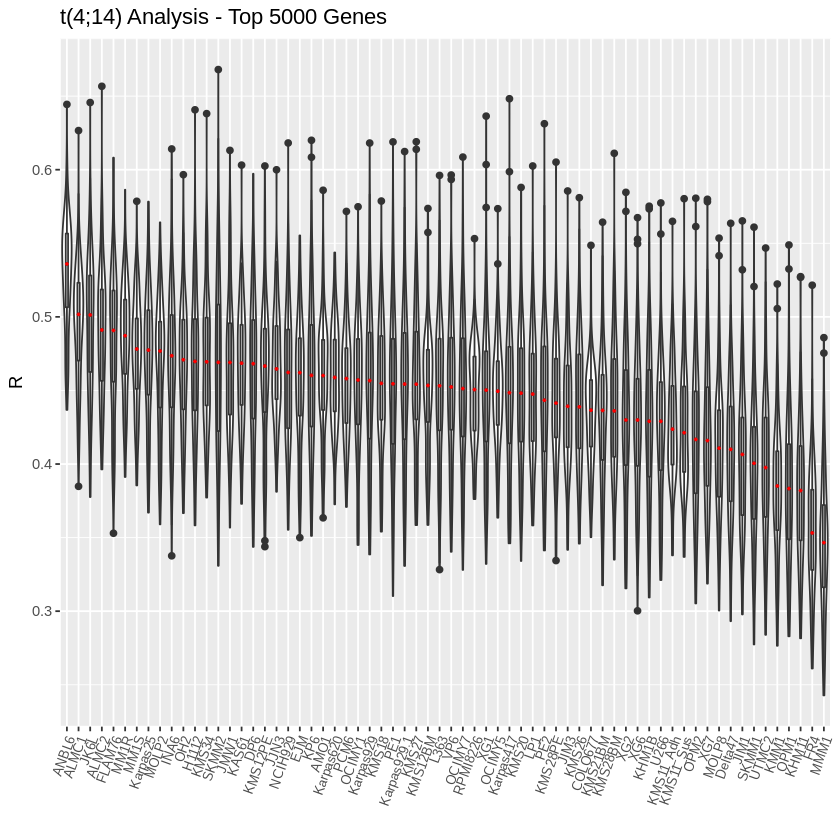

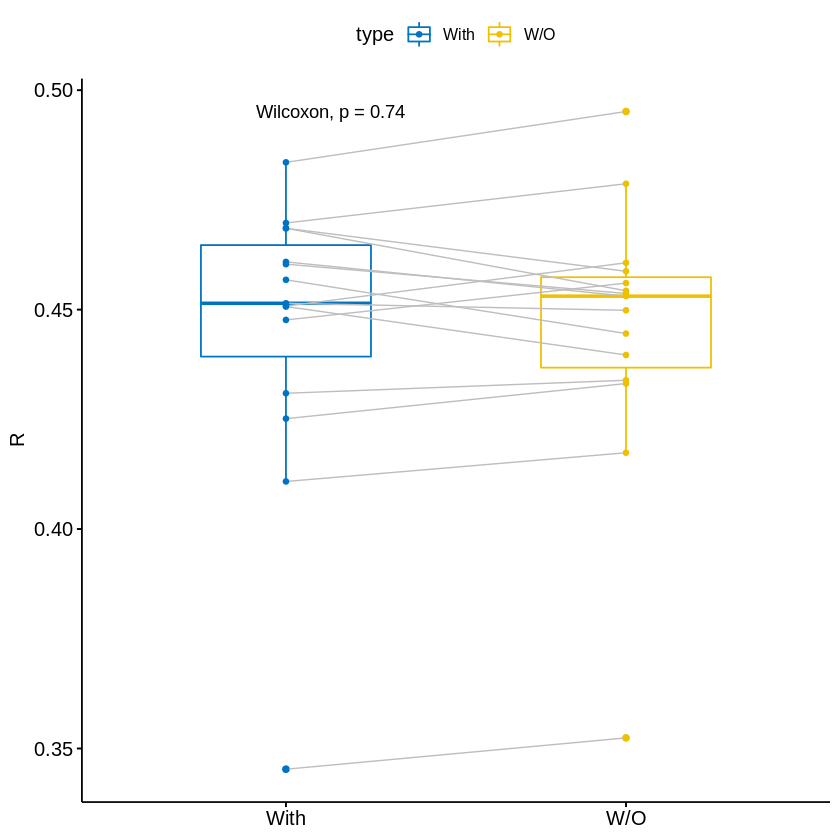

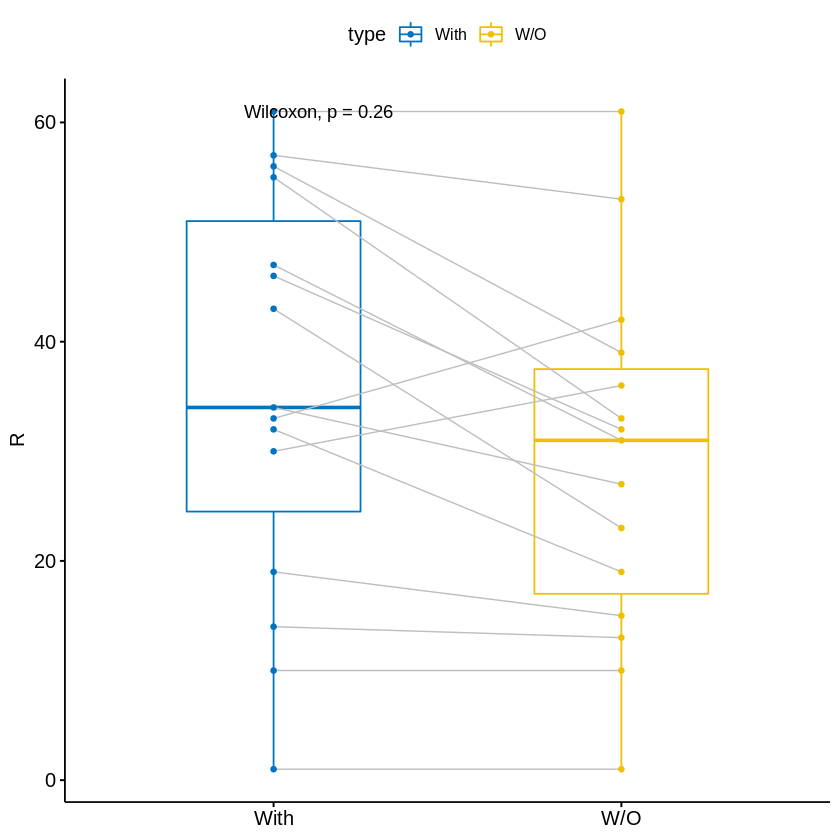

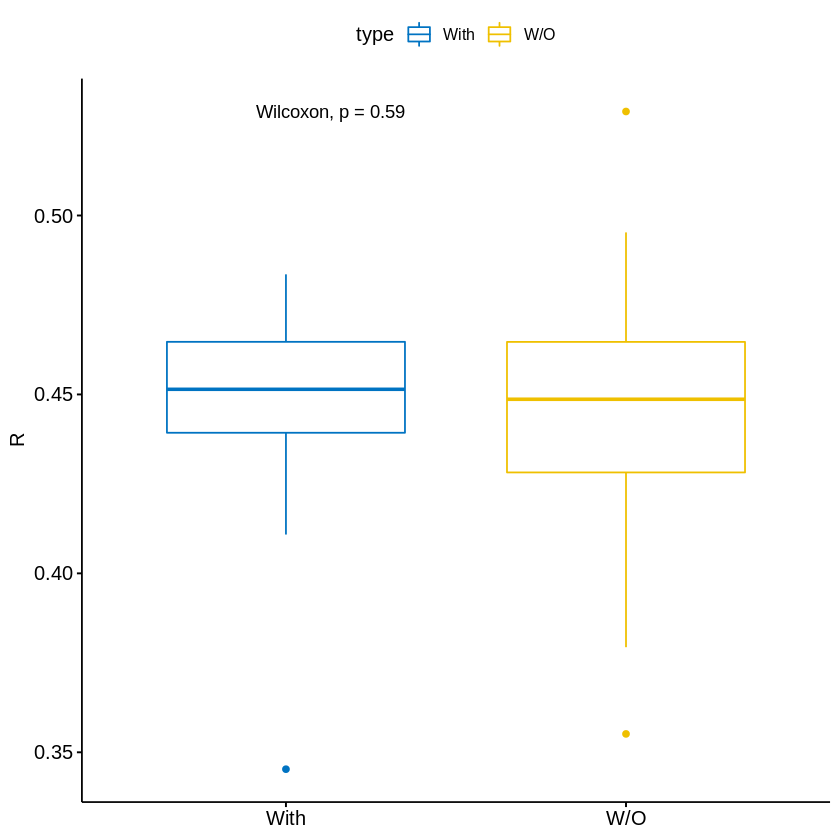

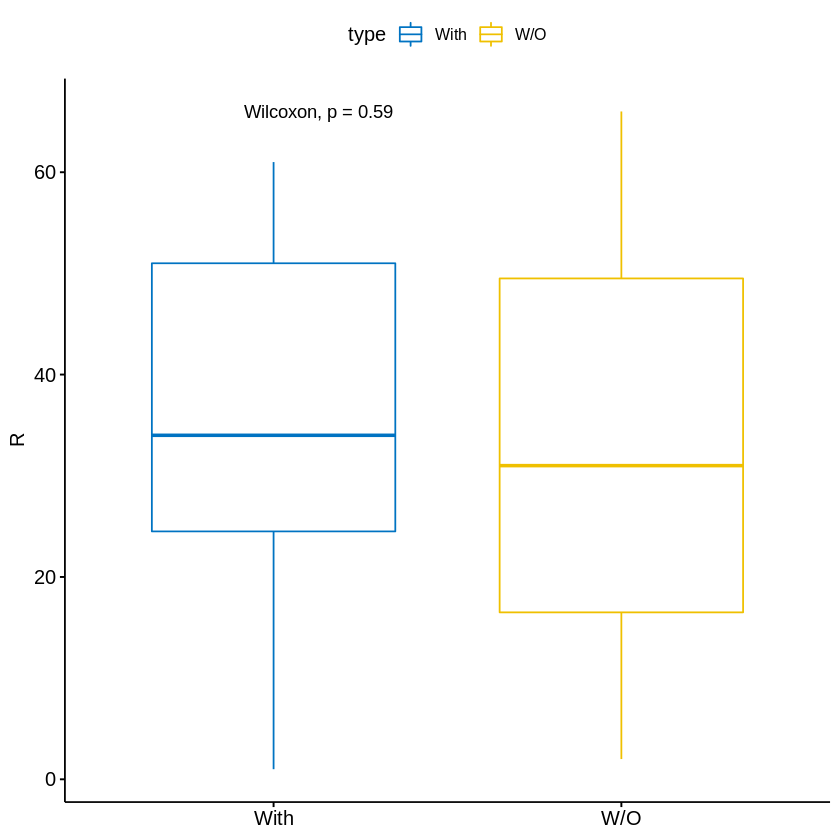

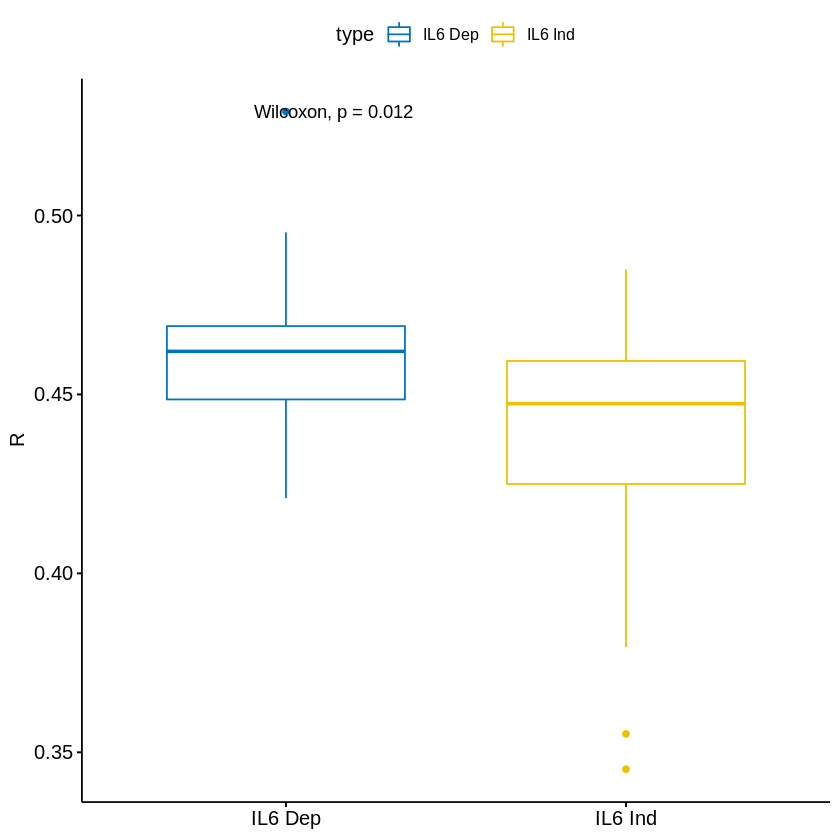

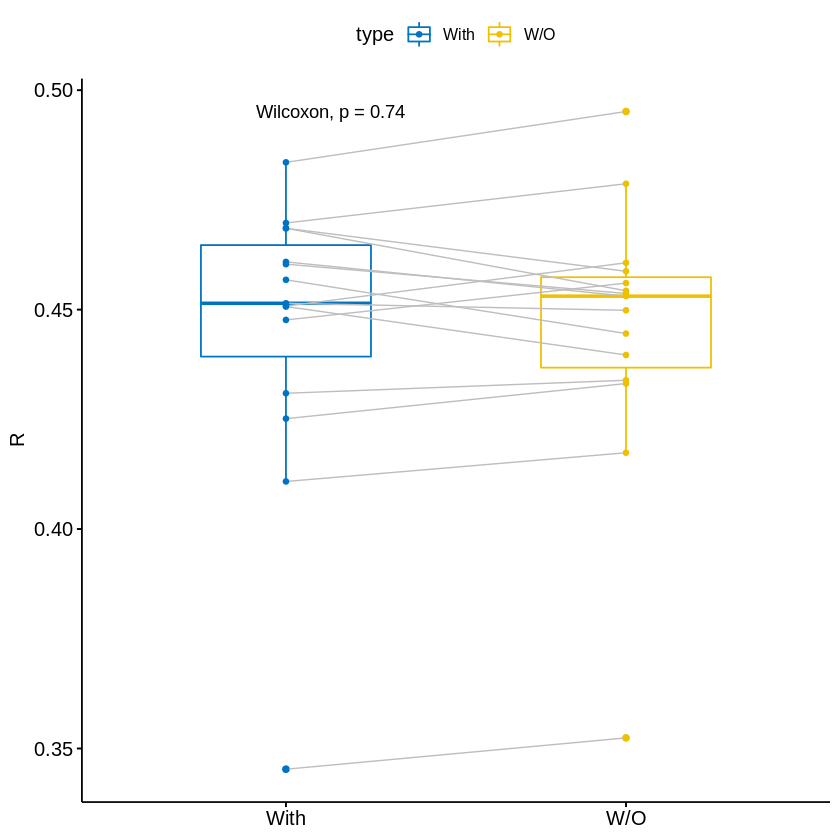

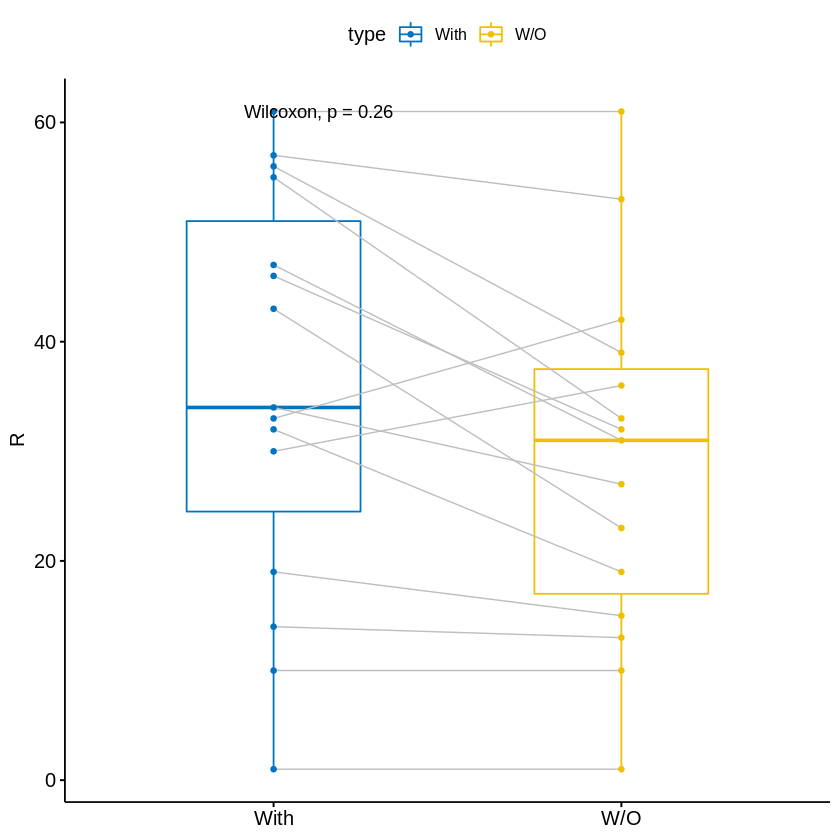

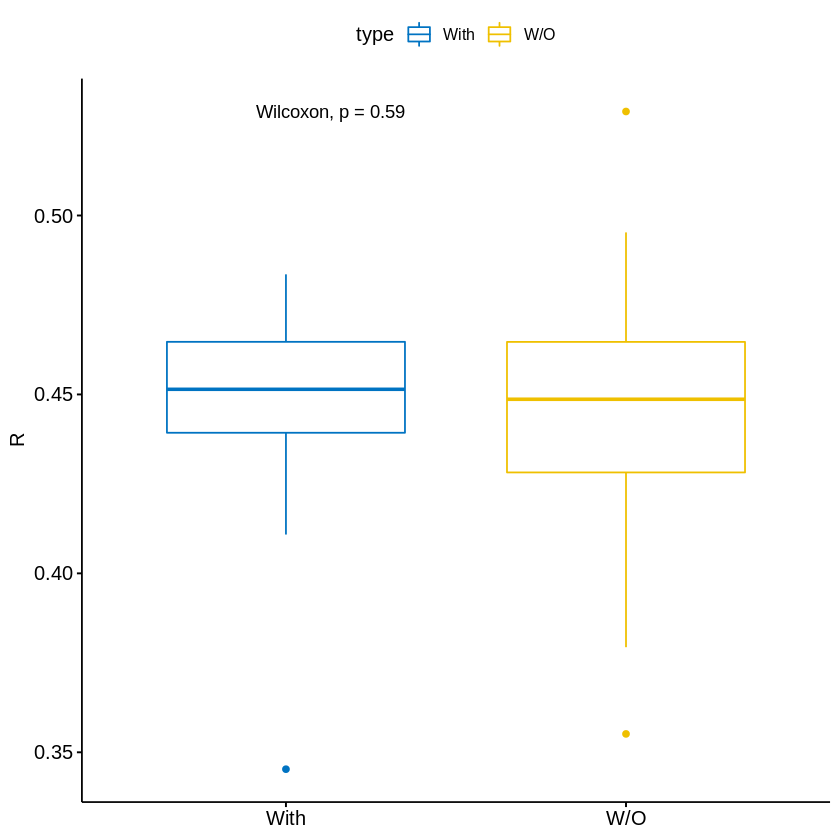

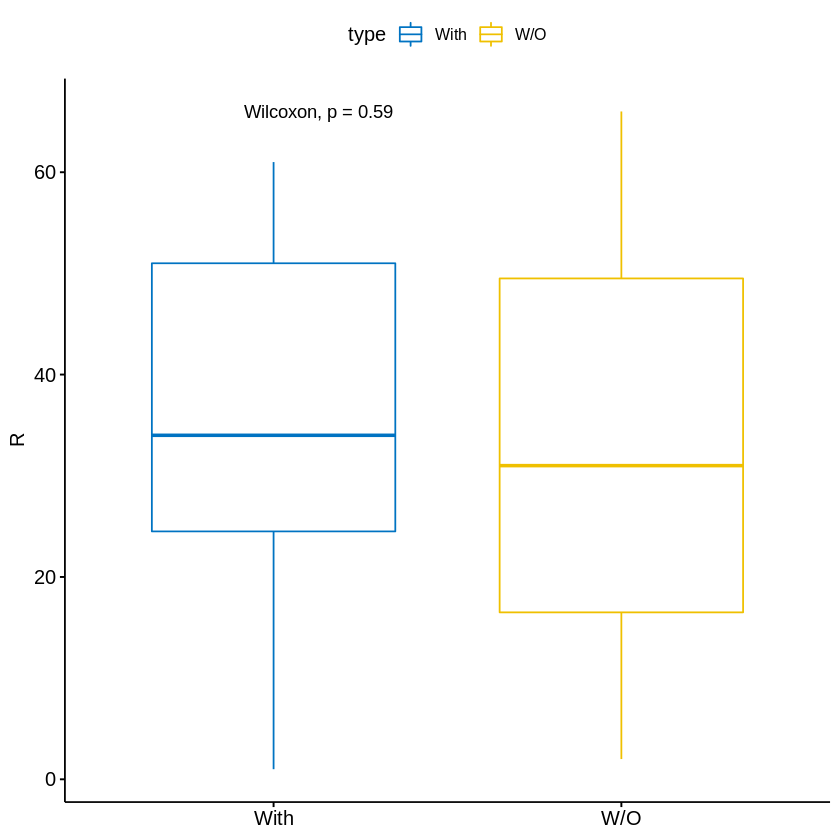

In [41]:
# extracting patients with subtype who are also newly diagnosed

keep1114 = as.logical(MM_patients_trans[,'t.11.14.'])
MM_patients_trans_1114 = MM_patient_trans_ids[keep1114]
MM_patients_trans_1114 = unique(MM_patients_trans_1114)
MM_patients_new_trans_1114 = filter(as.data.frame(MM_patients_trans_1114),
                                   str_extract(as.data.frame(MM_patients_trans_1114)[,1], "_[0-9]_") == "_1_")
keepc1114 = colnames(MM_patients) %in% MM_patients_new_trans_1114[,1]

# subsetting norm_pat to those patients with translocation, 
# then keeping genes prior analysed as top 5000 most variably expressed

norm_pat_1114 = norm_pat[,keepc1114]
norm_combined_1114 = cbind(norm_cell, norm_pat_1114)
norm_combined_1114_5 = norm_combined_1114[keepi5000, ]

# making violin plots

makeplots(norm_combined_1114_5, colnames(norm_pat_1114), 
          colnames(MM_cell_line), 't(4;14) Analysis - Top 5000 Genes')

# extracting correlates of subtype patients and non subtype patients

MM.cor.1114 = MM.cor.keats_5[keepc1114, ]
MM.cor.1114.opat = MM.cor.keats_5[!keepc1114, ]
MM.cor.1114.opat = MM.cor.1114.opat[rownames(MM.cor.1114.opat) %in% colnames(MM_patients_nd), ]

# printing out number of patients each

length(MM.cor.1114[,1])
length(MM.cor.1114.opat[,1])

# getting mean correlates, assigning type, and rank

MM.cor.1114.m = data.frame(colMeans(MM.cor.1114))
MM.cor.1114.m$type = 'With'
colnames(MM.cor.1114.m) = c('cor', 'type')
MM.cor.1114.m = (MM.cor.1114.m[order(MM.cor.1114.m$cor),])
MM.cor.1114.m$rank = rank_gen
MM.cor.1114.m = MM.cor.1114.m[order(rownames(MM.cor.1114.m)),]

MM.cor.1114.opat.m = data.frame(colMeans(MM.cor.1114.opat))
MM.cor.1114.opat.m$type = 'W/O'
colnames(MM.cor.1114.opat.m) = c('cor', 'type')
MM.cor.1114.opat.m = MM.cor.1114.opat.m[order(MM.cor.1114.opat.m$cor),]
MM.cor.1114.opat.m$rank = rank_gen
MM.cor.1114.opat.m = MM.cor.1114.opat.m[order(rownames(MM.cor.1114.opat.m)),]

# subsetting for cell lines with subtype

MM.cor.1114.m.c = MM.cor.1114.m[rownames(MM.cor.1114.m) %in% cell_names_1114,]
MM.cor.1114.opat.m.c = MM.cor.1114.opat.m[rownames(MM.cor.1114.opat.m) %in% cell_names_1114,]

# paired wise boxplots for subtype versus non subtype patients, looking at subtype cell lines

ggpaired(rbind(MM.cor.1114.m.c, MM.cor.1114.opat.m.c), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggpaired(rbind(MM.cor.1114.m.c, MM.cor.1114.opat.m.c), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving bound dataframe for faceted subplot

MM.cor.1114.bc = rbind(MM.cor.1114.m.c, MM.cor.1114.opat.m.c)

# subsetting for non subtype cell lines

MM.cor.1114.m.c2 = MM.cor.1114.m[(!(rownames(MM.cor.1114.m) %in% cell_names_1114)),]
MM.cor.1114.m.c2$type = 'W/O'

# boxplots for subtype patients, looking at subtype cell lines and non subtype cell lines

ggboxplot(rbind(MM.cor.1114.m.c, MM.cor.1114.m.c2), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggboxplot(rbind(MM.cor.1114.m.c, MM.cor.1114.m.c2), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving data frame for faceted boxplots

MM.cor.1114.bp = rbind(MM.cor.1114.m.c, MM.cor.1114.m.c2)

# subsetting for IL6 dependent and independent cell lines

MM.cor.1114.il6 = rbind(MM.cor.1114.m.c, MM.cor.1114.m.c2)
MM.cor.1114.il6d = MM.cor.1114.il6[cell_names_il6, ]
MM.cor.1114.il6d$type = 'IL6 Dep'
MM.cor.1114.il6i = MM.cor.1114.il6[!(rownames(MM.cor.1114.il6) %in% cell_names_il6),]
MM.cor.1114.il6i$type = 'IL6 Ind'

# boxplot comparing IL6 dependent and independent cell lines, looking at subtype patients

ggboxplot(rbind(MM.cor.1114.il6d, MM.cor.1114.il6i), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving data frame for faceted boxplot

MM.cor.1114.il6b = rbind(MM.cor.1114.il6d, MM.cor.1114.il6i)

# calculating top 5000 variable genes for subtype patients and repeating same analysis as aboev

keepi_1114 = apply(norm_pat_1114, 1, IQR)
keepis_1114 = sort(keepi, decreasing = TRUE)
keepi5000_1114 = keepi %in% keepis[1:5000]
norm_combined_1114_5u = norm_combined[keepi5000_1114, ]

MM.cor.1114.n = cor(norm_combined_1114_5u, method = 's')
MM.cor.1114.n = MM.cor.1114.n[colnames(MM_patients), colnames(MM_cell_line)]
MM.cor.1114 = MM.cor.1114.n[keepc1114, ]
MM.cor.1114.opat = MM.cor.1114.n[!keepc1114, ]
MM.cor.1114.opat = MM.cor.1114.opat[rownames(MM.cor.1114.opat) %in% colnames(MM_patients_nd), ]

MM.cor.1114.m = data.frame(colMeans(MM.cor.1114))
MM.cor.1114.m$type = 'With'
colnames(MM.cor.1114.m) = c('cor', 'type')
MM.cor.1114.m = (MM.cor.1114.m[order(MM.cor.1114.m$cor),])
MM.cor.1114.m$rank = rank_gen
MM.cor.1114.m = MM.cor.1114.m[order(rownames(MM.cor.1114.m)),]

MM.cor.1114.opat.m = data.frame(colMeans(MM.cor.1114.opat))
MM.cor.1114.opat.m$type = 'W/O'
colnames(MM.cor.1114.opat.m) = c('cor', 'type')
MM.cor.1114.opat.m = MM.cor.1114.opat.m[order(MM.cor.1114.opat.m$cor),]
MM.cor.1114.opat.m$rank = rank_gen
MM.cor.1114.opat.m = MM.cor.1114.opat.m[order(rownames(MM.cor.1114.opat.m)),]

MM.cor.1114.m.c = MM.cor.1114.m[rownames(MM.cor.1114.m) %in% cell_names_1114,]
MM.cor.1114.opat.m.c = MM.cor.1114.opat.m[rownames(MM.cor.1114.opat.m) %in% cell_names_1114,]

ggpaired(rbind(MM.cor.1114.m.c, MM.cor.1114.opat.m.c), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggpaired(rbind(MM.cor.1114.m.c, MM.cor.1114.opat.m.c), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

MM.cor.1114.bcu = rbind(MM.cor.1114.m.c, MM.cor.1114.opat.m.c)

MM.cor.1114.m.c2 = MM.cor.1114.m[(!(rownames(MM.cor.1114.m) %in% cell_names_1114)),]
MM.cor.1114.m.c2$type = 'W/O'

ggboxplot(rbind(MM.cor.1114.m.c, MM.cor.1114.m.c2), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggboxplot(rbind(MM.cor.1114.m.c, MM.cor.1114.m.c2), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

MM.cor.1114.bpu = rbind(MM.cor.1114.m.c, MM.cor.1114.m.c2)

In [42]:
head(norm_pat_1114)
write.csv(colnames(norm_pat_1114), '~/Downloads/proj/pat_names_1114.csv')

,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_1439_1_BM,MMRF_1261_1_BM,MMRF_2173_1_BM,MMRF_1865_1_BM,MMRF_2639_1_BM,MMRF_2140_1_BM,MMRF_1886_1_BM,MMRF_1787_1_BM,⋯,MMRF_2654_1_BM,MMRF_2201_1_BM,MMRF_1556_1_BM,MMRF_1580_1_BM,MMRF_1542_1_BM,MMRF_1773_1_BM,MMRF_1286_1_BM,MMRF_2499_1_BM,MMRF_1862_1_BM,MMRF_1539_1_BM
ENSG00000000003,5.763143,9.537185,4.754362,4.920172,5.799387,5.460889,8.495252,5.525109,5.837561,4.736791,⋯,5.280657,6.310989,5.497786,9.582117,5.344537,5.187791,9.351329,7.248405,8.996735,10.281560
ENSG00000000419,10.974725,11.195989,11.395866,10.305086,11.325985,10.809406,11.510222,11.527371,10.849299,10.950417,⋯,12.114838,11.174207,11.597835,10.891103,11.152155,12.204222,11.095107,10.816251,12.054361,10.742351
ENSG00000000457,8.420720,9.249930,9.940825,9.998962,9.356959,9.718587,8.544467,9.978753,10.596134,10.508584,⋯,8.433698,9.767087,9.886566,9.639100,9.621086,9.609677,9.900713,9.759781,8.680130,9.724021
ENSG00000000460,7.240012,8.035522,8.855463,8.306360,7.922817,7.681203,7.820131,8.202764,8.929283,8.382826,⋯,6.827088,8.762557,8.381631,8.442095,7.685254,8.020884,8.528250,8.272842,7.058878,8.616901
ENSG00000000938,8.838641,6.773748,6.512462,5.671395,5.904515,5.125722,8.704531,6.652738,6.977061,5.503130,⋯,6.521208,6.656524,8.205077,8.054737,7.787969,6.595938,5.963702,9.903204,8.163525,5.415242
ENSG00000000971,8.954700,9.660588,5.464737,10.324287,5.937542,4.818613,7.531705,6.200231,5.712202,5.422820,⋯,7.902976,6.601091,5.307206,9.614954,7.723967,4.926472,6.144039,7.791784,6.516353,4.560337


[1] 7

[1] 772

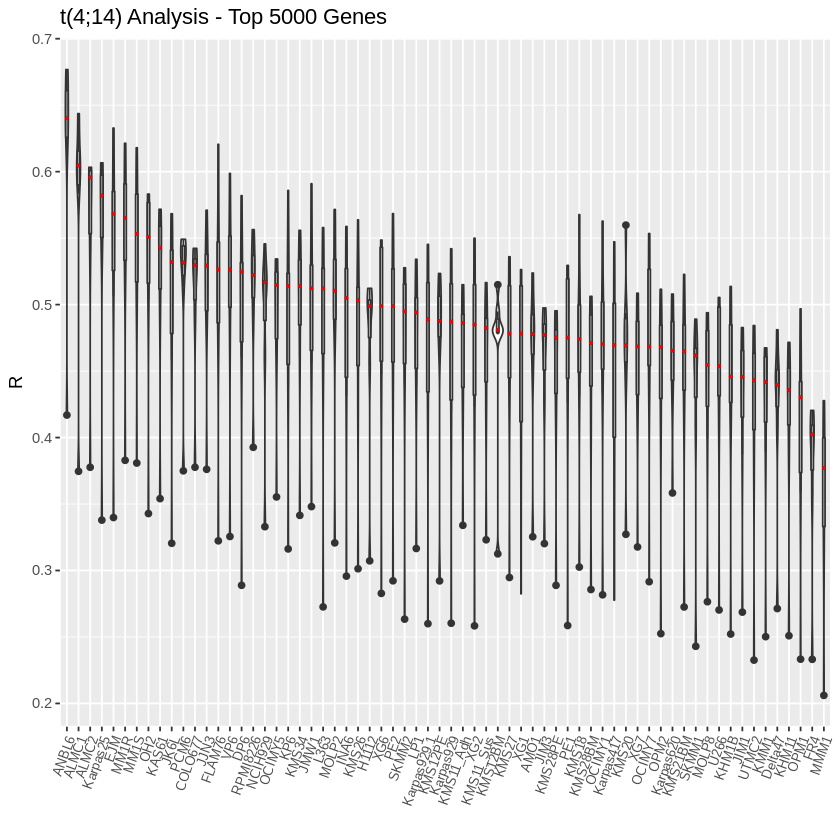

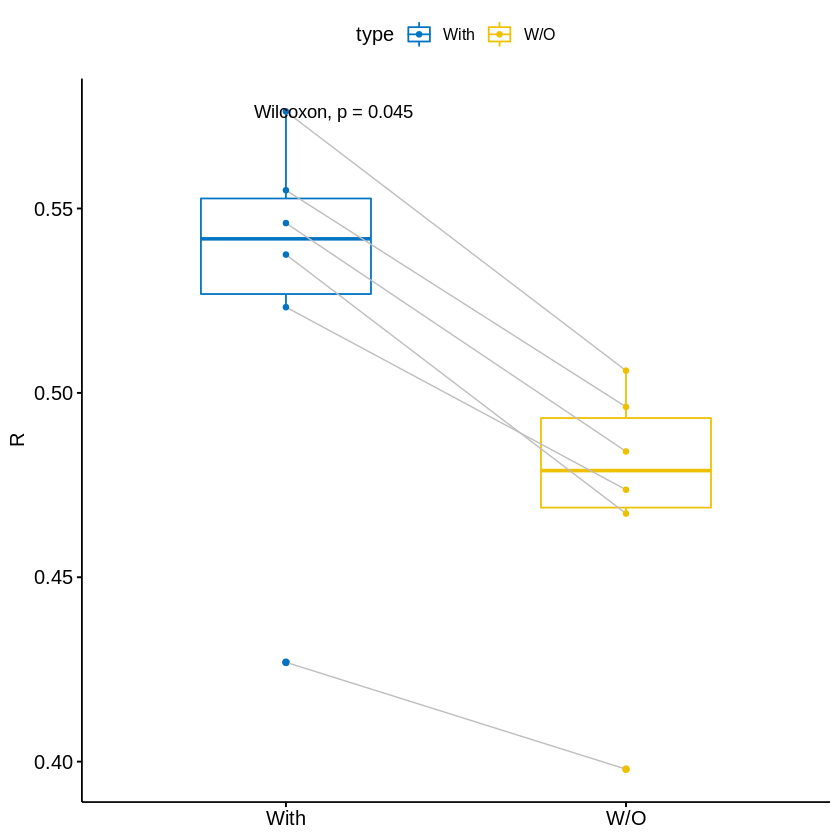

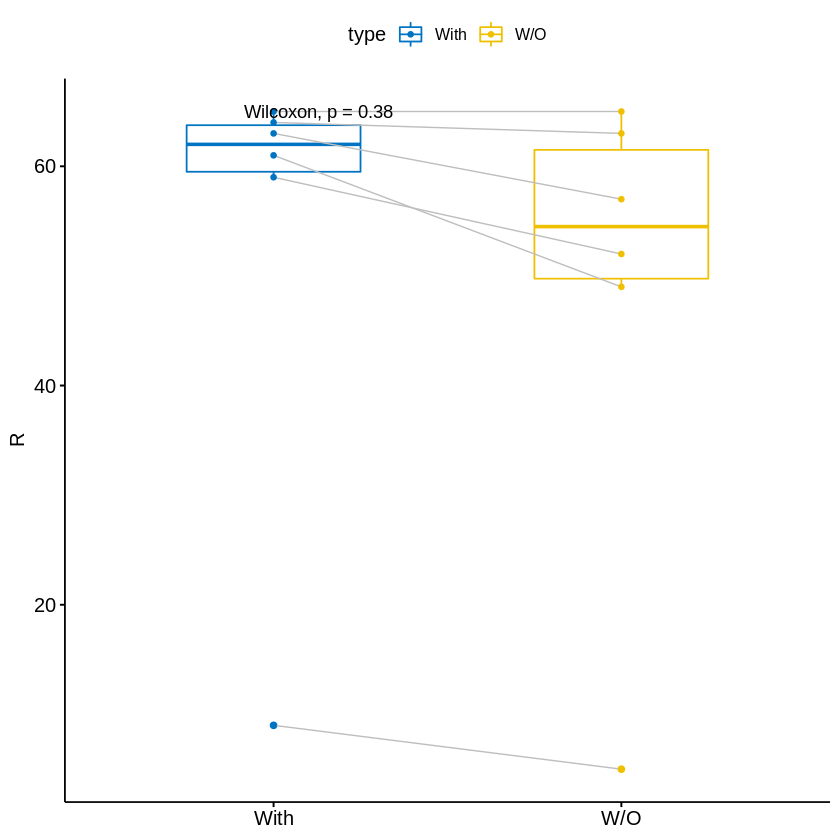

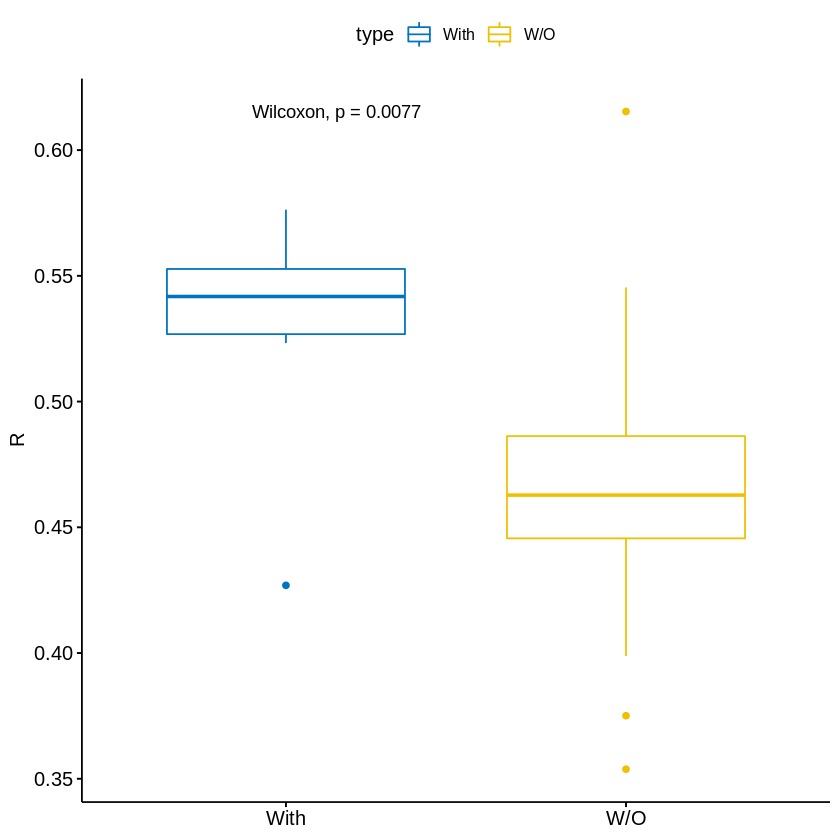

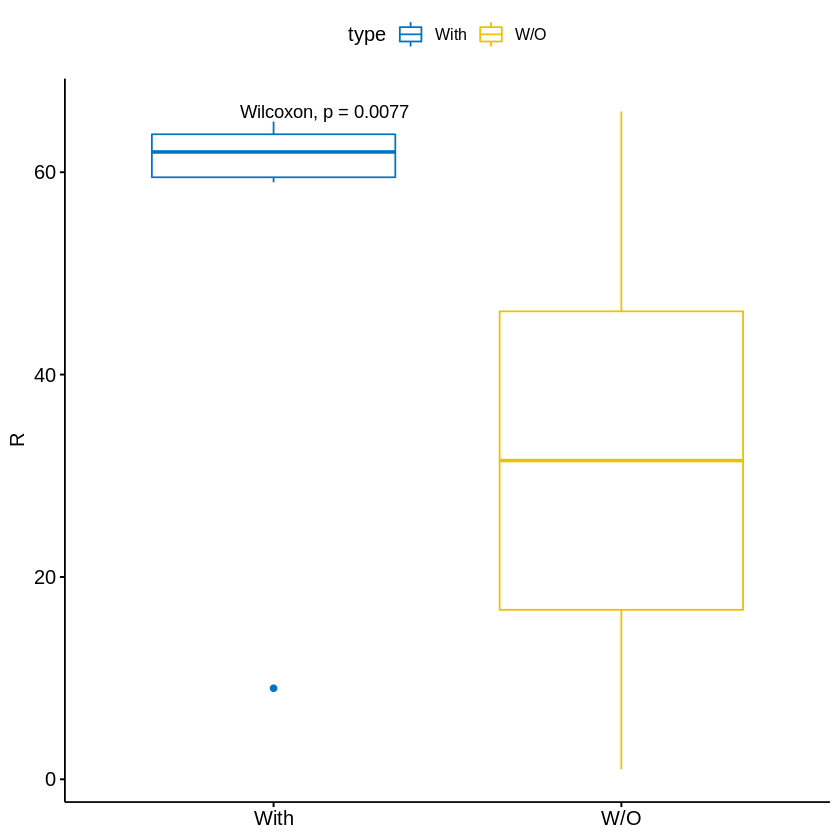

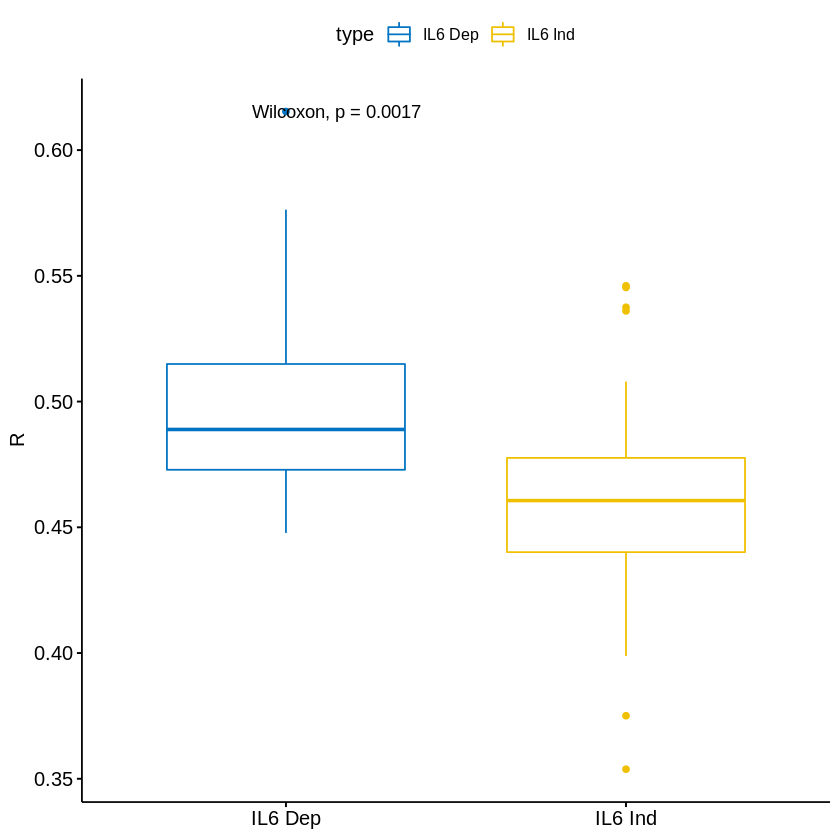

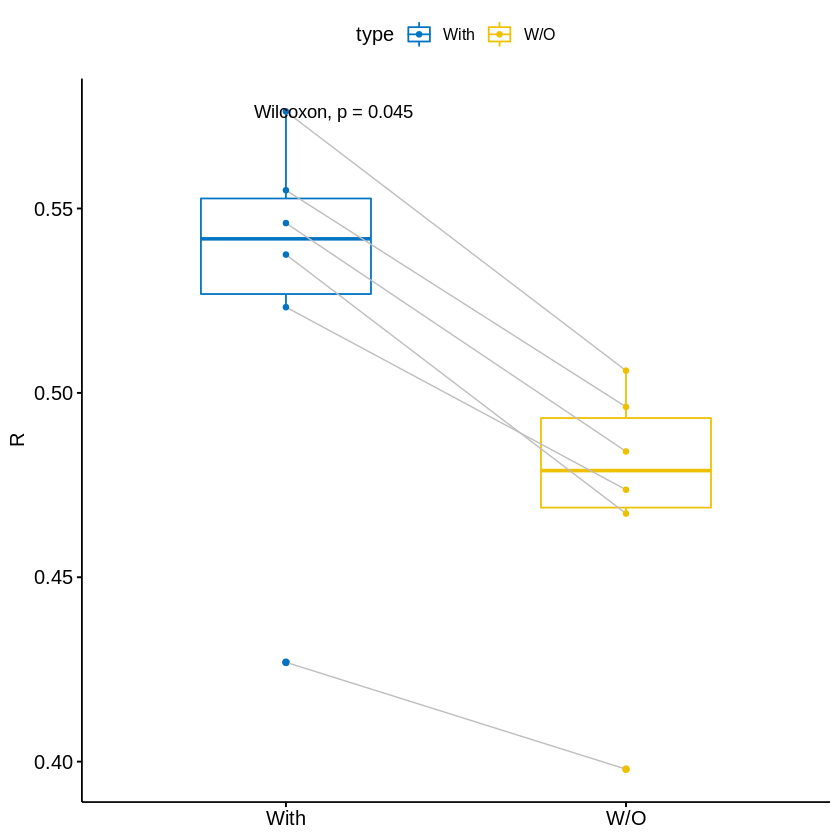

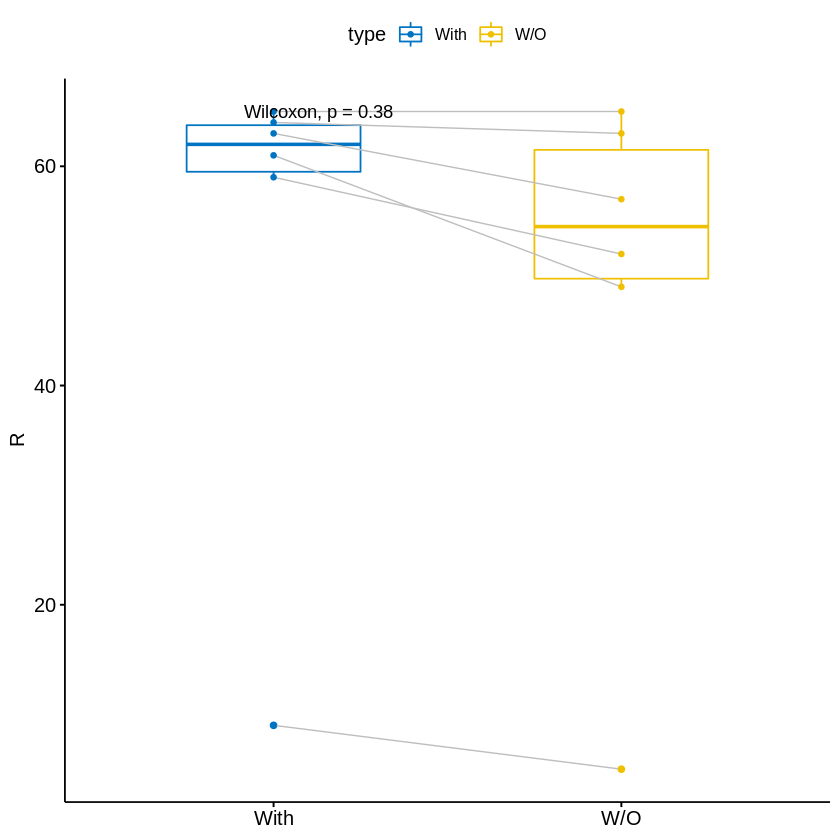

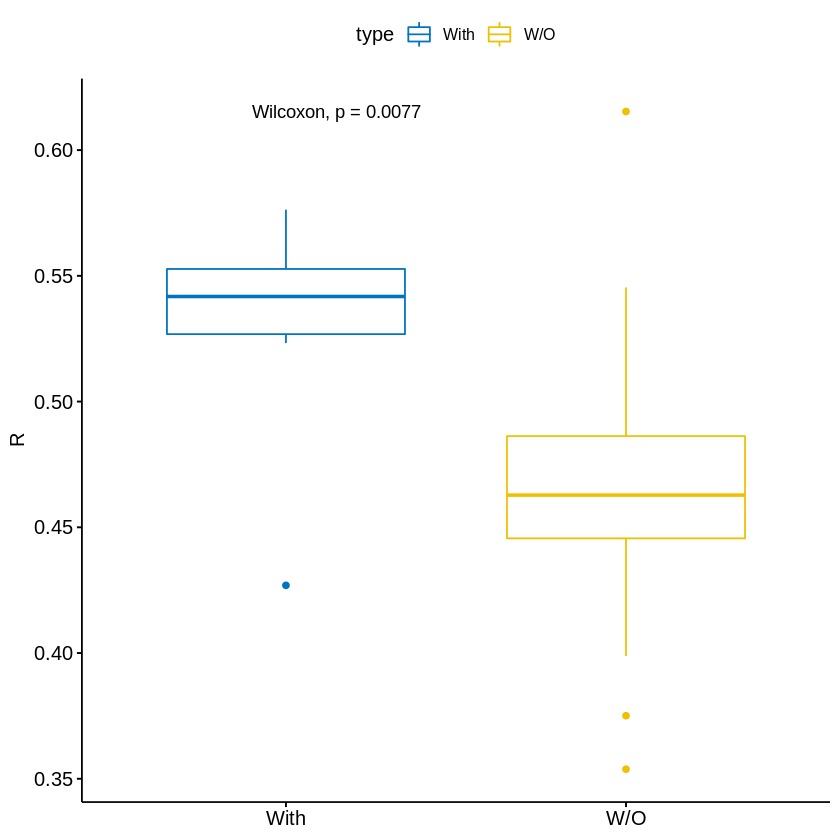

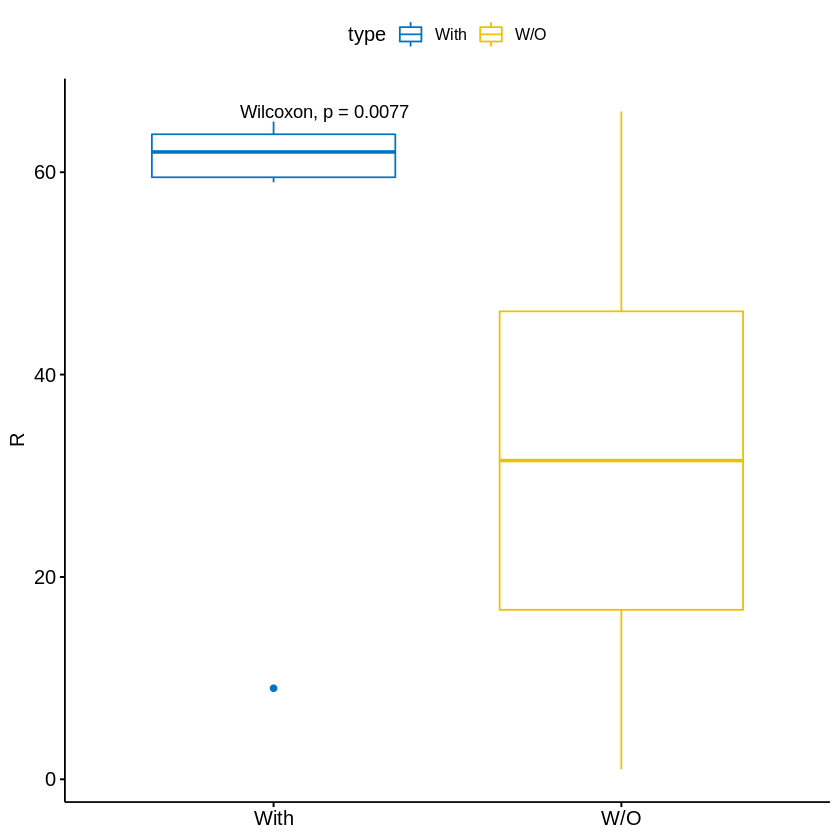

In [43]:
# extracting patients with subtype who are also newly diagnosed

keep1420 = as.logical(MM_patients_trans[,'t.14.20.'])
MM_patients_trans_1420 = MM_patient_trans_ids[keep1420]
MM_patients_trans_1420 = unique(MM_patients_trans_1420)
MM_patients_new_trans_1420 = filter(as.data.frame(MM_patients_trans_1420),
                                   str_extract(as.data.frame(MM_patients_trans_1420)[,1], "_[0-9]_") == "_1_")
keepc1420 = colnames(MM_patients) %in% MM_patients_new_trans_1420[,1]

# subsetting norm_pat to those patients with translocation, 
# then keeping genes prior analysed as top 5000 most variably expressed

norm_pat_1420 = norm_pat[,keepc1420]
norm_combined_1420 = cbind(norm_cell, norm_pat_1420)
norm_combined_1420_5 = norm_combined_1420[keepi5000, ]

# making violin plots

makeplots(norm_combined_1420_5, colnames(norm_pat_1420), 
          colnames(MM_cell_line), 't(4;14) Analysis - Top 5000 Genes')

# extracting correlates of subtype patients and non subtype patients

MM.cor.1420 = MM.cor.keats_5[keepc1420, ]
MM.cor.1420.opat = MM.cor.keats_5[!keepc1420, ]
MM.cor.1420.opat = MM.cor.1420.opat[rownames(MM.cor.1420.opat) %in% colnames(MM_patients_nd), ]

# printing out number of patients each

length(MM.cor.1420[,1])
length(MM.cor.1420.opat[,1])

# getting mean correlates, assigning type, and rank

MM.cor.1420.m = data.frame(colMeans(MM.cor.1420))
MM.cor.1420.m$type = 'With'
colnames(MM.cor.1420.m) = c('cor', 'type')
MM.cor.1420.m = (MM.cor.1420.m[order(MM.cor.1420.m$cor),])
MM.cor.1420.m$rank = rank_gen
MM.cor.1420.m = MM.cor.1420.m[order(rownames(MM.cor.1420.m)),]

MM.cor.1420.opat.m = data.frame(colMeans(MM.cor.1420.opat))
MM.cor.1420.opat.m$type = 'W/O'
colnames(MM.cor.1420.opat.m) = c('cor', 'type')
MM.cor.1420.opat.m = MM.cor.1420.opat.m[order(MM.cor.1420.opat.m$cor),]
MM.cor.1420.opat.m$rank = rank_gen
MM.cor.1420.opat.m = MM.cor.1420.opat.m[order(rownames(MM.cor.1420.opat.m)),]

# subsetting for cell lines with subtype

MM.cor.1420.m.c = MM.cor.1420.m[rownames(MM.cor.1420.m) %in% cell_names_1420,]
MM.cor.1420.opat.m.c = MM.cor.1420.opat.m[rownames(MM.cor.1420.opat.m) %in% cell_names_1420,]

# paired wise boxplots for subtype versus non subtype patients, looking at subtype cell lines

ggpaired(rbind(MM.cor.1420.m.c, MM.cor.1420.opat.m.c), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggpaired(rbind(MM.cor.1420.m.c, MM.cor.1420.opat.m.c), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving bound dataframe for faceted subplot

MM.cor.1420.bc = rbind(MM.cor.1420.m.c, MM.cor.1420.opat.m.c)

# subsetting for non subtype cell lines

MM.cor.1420.m.c2 = MM.cor.1420.m[(!(rownames(MM.cor.1420.m) %in% cell_names_1420)),]
MM.cor.1420.m.c2$type = 'W/O'

# boxplots for subtype patients, looking at subtype cell lines and non subtype cell lines

ggboxplot(rbind(MM.cor.1420.m.c, MM.cor.1420.m.c2), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggboxplot(rbind(MM.cor.1420.m.c, MM.cor.1420.m.c2), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving data frame for faceted boxplots

MM.cor.1420.bp = rbind(MM.cor.1420.m.c, MM.cor.1420.m.c2)

# subsetting for IL6 dependent and independent cell lines

MM.cor.1420.il6 = rbind(MM.cor.1420.m.c, MM.cor.1420.m.c2)
MM.cor.1420.il6d = MM.cor.1420.il6[cell_names_il6, ]
MM.cor.1420.il6d$type = 'IL6 Dep'
MM.cor.1420.il6i = MM.cor.1420.il6[!(rownames(MM.cor.1420.il6) %in% cell_names_il6),]
MM.cor.1420.il6i$type = 'IL6 Ind'

# boxplot comparing IL6 dependent and independent cell lines, looking at subtype patients

ggboxplot(rbind(MM.cor.1420.il6d, MM.cor.1420.il6i), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving data frame for faceted boxplot

MM.cor.1420.il6b = rbind(MM.cor.1420.il6d, MM.cor.1420.il6i)

# calculating top 5000 variable genes for subtype patients and repeating same analysis as aboev

keepi_1420 = apply(norm_pat_1420, 1, IQR)
keepis_1420 = sort(keepi, decreasing = TRUE)
keepi5000_1420 = keepi %in% keepis[1:5000]
norm_combined_1420_5u = norm_combined[keepi5000_1420, ]

MM.cor.1420.n = cor(norm_combined_1420_5u, method = 's')
MM.cor.1420.n = MM.cor.1420.n[colnames(MM_patients), colnames(MM_cell_line)]
MM.cor.1420 = MM.cor.1420.n[keepc1420, ]
MM.cor.1420.opat = MM.cor.1420.n[!keepc1420, ]
MM.cor.1420.opat = MM.cor.1420.opat[rownames(MM.cor.1420.opat) %in% colnames(MM_patients_nd), ]

MM.cor.1420.m = data.frame(colMeans(MM.cor.1420))
MM.cor.1420.m$type = 'With'
colnames(MM.cor.1420.m) = c('cor', 'type')
MM.cor.1420.m = (MM.cor.1420.m[order(MM.cor.1420.m$cor),])
MM.cor.1420.m$rank = rank_gen
MM.cor.1420.m = MM.cor.1420.m[order(rownames(MM.cor.1420.m)),]

MM.cor.1420.opat.m = data.frame(colMeans(MM.cor.1420.opat))
MM.cor.1420.opat.m$type = 'W/O'
colnames(MM.cor.1420.opat.m) = c('cor', 'type')
MM.cor.1420.opat.m = MM.cor.1420.opat.m[order(MM.cor.1420.opat.m$cor),]
MM.cor.1420.opat.m$rank = rank_gen
MM.cor.1420.opat.m = MM.cor.1420.opat.m[order(rownames(MM.cor.1420.opat.m)),]

MM.cor.1420.m.c = MM.cor.1420.m[rownames(MM.cor.1420.m) %in% cell_names_1420,]
MM.cor.1420.opat.m.c = MM.cor.1420.opat.m[rownames(MM.cor.1420.opat.m) %in% cell_names_1420,]

ggpaired(rbind(MM.cor.1420.m.c, MM.cor.1420.opat.m.c), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggpaired(rbind(MM.cor.1420.m.c, MM.cor.1420.opat.m.c), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

MM.cor.1420.bcu = rbind(MM.cor.1420.m.c, MM.cor.1420.opat.m.c)

MM.cor.1420.m.c2 = MM.cor.1420.m[(!(rownames(MM.cor.1420.m) %in% cell_names_1420)),]
MM.cor.1420.m.c2$type = 'W/O'

ggboxplot(rbind(MM.cor.1420.m.c, MM.cor.1420.m.c2), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggboxplot(rbind(MM.cor.1420.m.c, MM.cor.1420.m.c2), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

MM.cor.1420.bpu = rbind(MM.cor.1420.m.c, MM.cor.1420.m.c2)

In [44]:
head(norm_pat_1420)
write.csv(colnames(norm_pat_1420), '~/Downloads/proj/pat_names_1420.csv')

,MMRF_1830_1_BM,MMRF_2076_1_BM,MMRF_1461_1_BM,MMRF_1625_1_BM,MMRF_1778_1_BM,MMRF_2153_1_BM,MMRF_1832_1_BM
ENSG00000000003,4.587705,9.166366,5.225772,8.389371,4.747639,8.821674,4.768873
ENSG00000000419,10.742030,10.176535,10.707841,10.786648,10.786361,10.678542,10.360074
ENSG00000000457,10.140892,9.102334,9.441895,9.938982,10.580031,9.762320,9.651232
ENSG00000000460,7.614789,8.000591,7.730650,8.722876,9.098555,7.787593,8.341720
ENSG00000000938,5.964316,5.219539,5.532737,6.293701,4.747639,14.070308,6.424016
ENSG00000000971,4.894212,4.775857,6.883709,5.056981,7.984408,9.693814,5.284556


In [45]:
#### Cell line info ####

MM_pat_mut = read.delim("MMRF_CoMMpass_IA13a_IGV_All_Canonical_Variants.mut", stringsAsFactors = F)

cell_names_KRAS = c('COLO677', 'JIM3', 'JK6L', 
                    'JMW1', 'Karpas620', 'KHM1B', 
                    'KMS20', 'KMS28BM', 'KMS28PE', 
                    'KP6', 'MM1R', 'MM1S', 'OCIMY1', 
                    'RPMI8226', 'XG2', 'XG6', 'XG7')

cell_names_NRAS = c('Karpas417', 'Karpas929', 'KHM11', 
                    'KMM1', 'KMS21BM', 'KMS27', 
                    'L363', 'MOLP8', 'NCIH929', 
                    'OCIMY7', 'OH2', 'PE2', 'XG1')

[1] 186

[1] 618

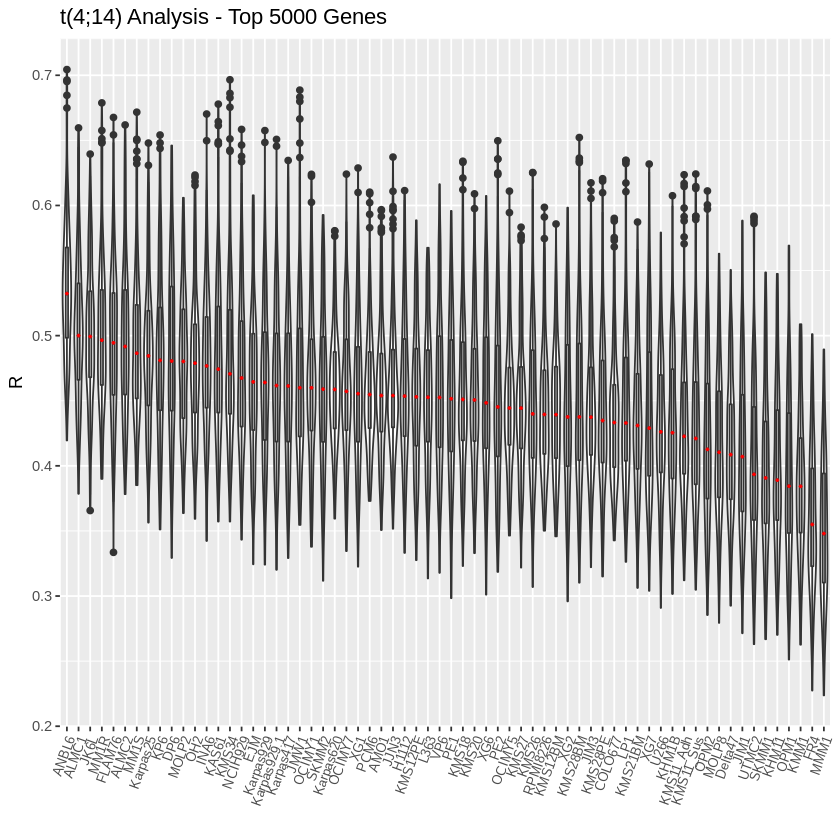

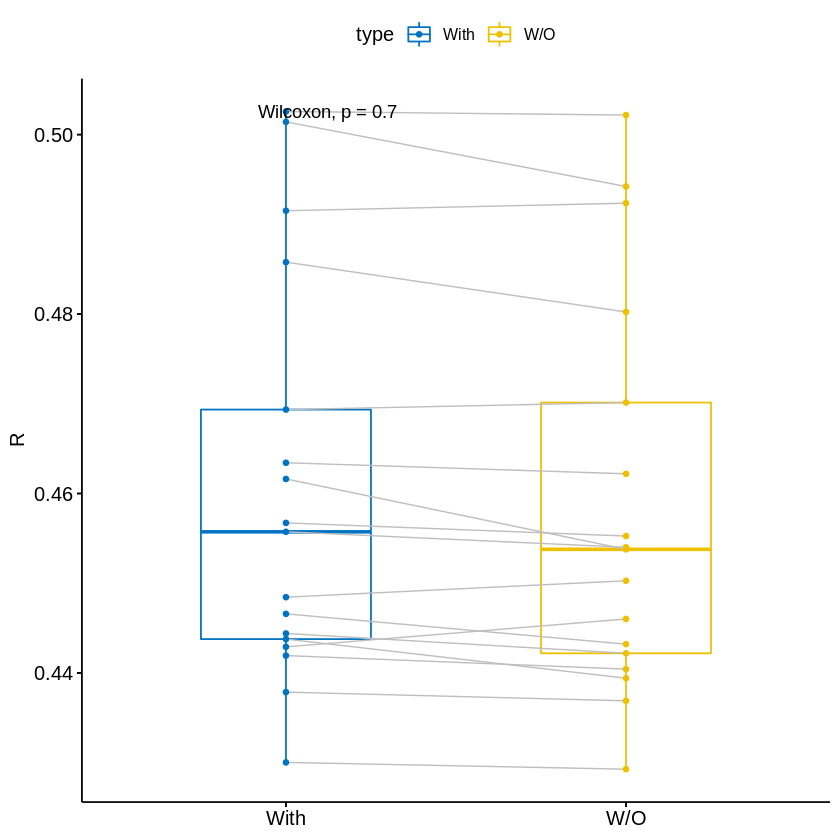

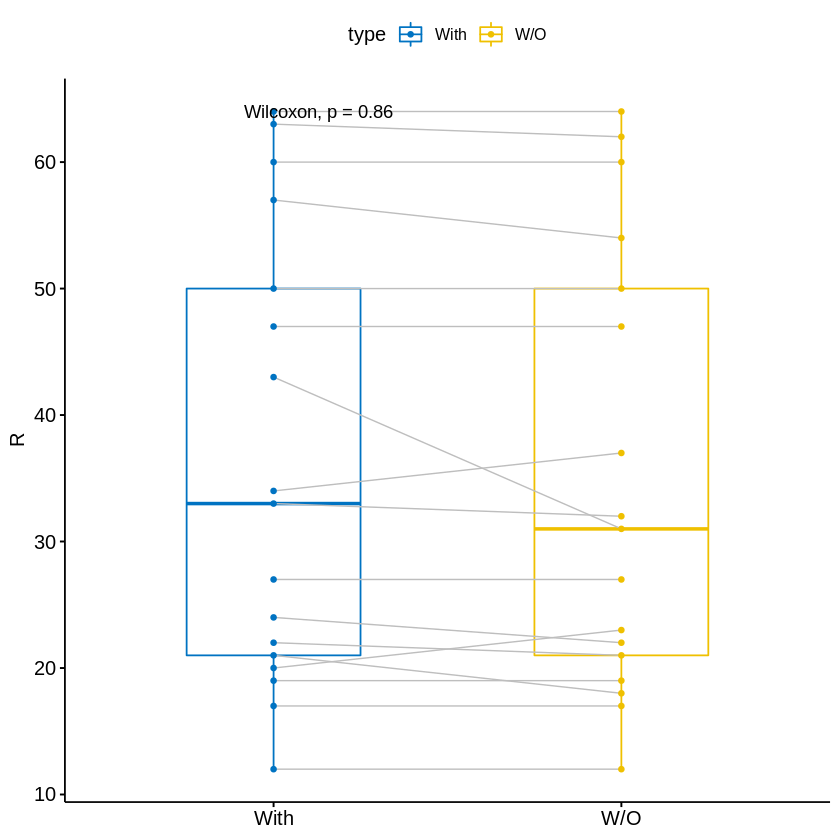

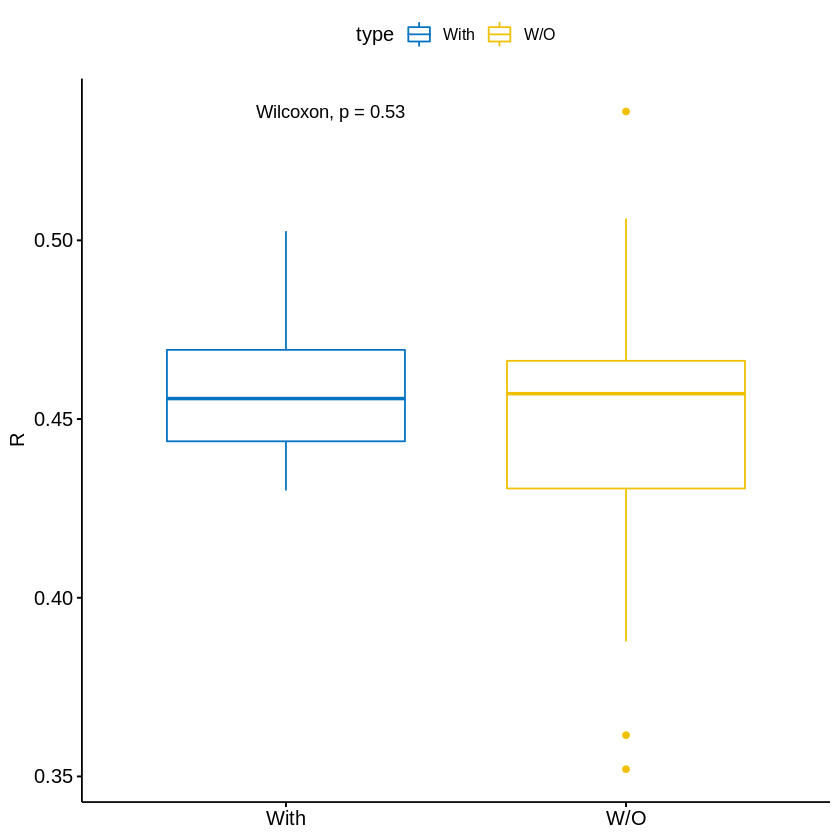

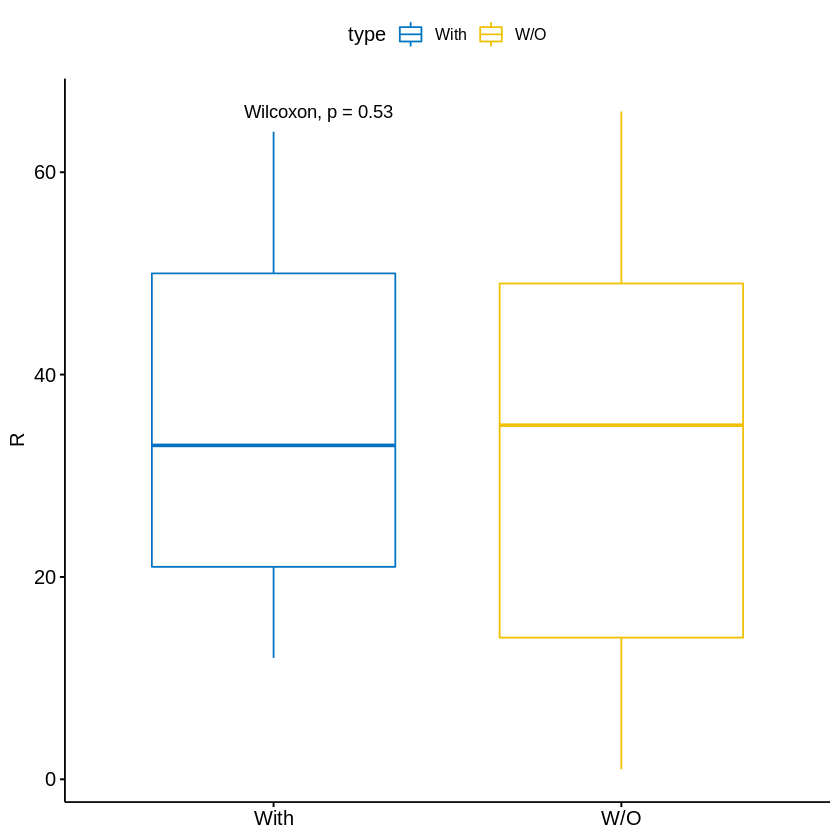

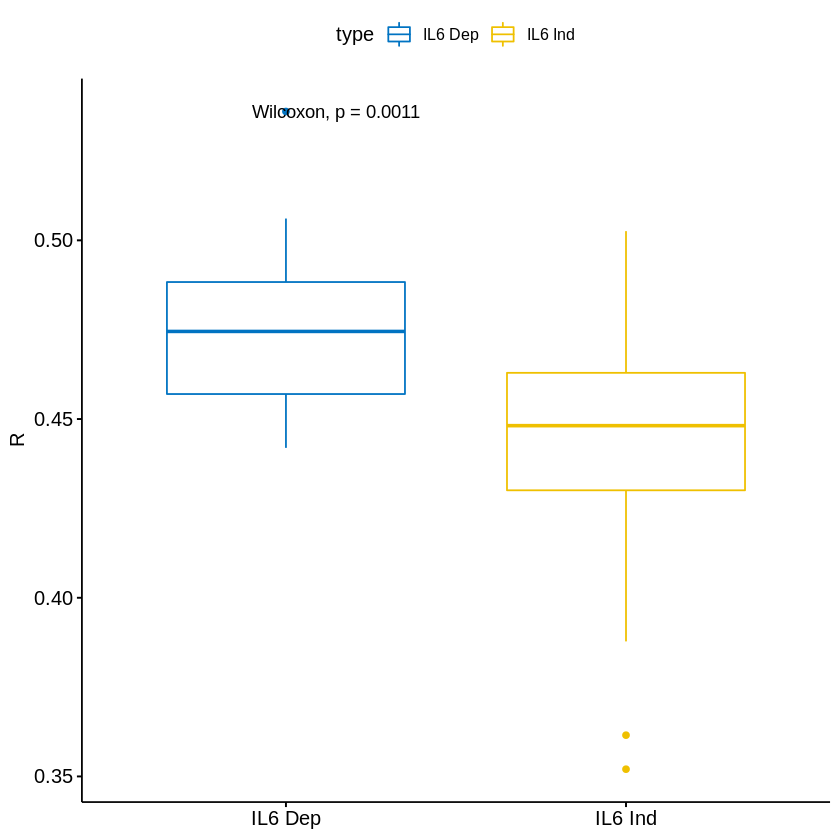

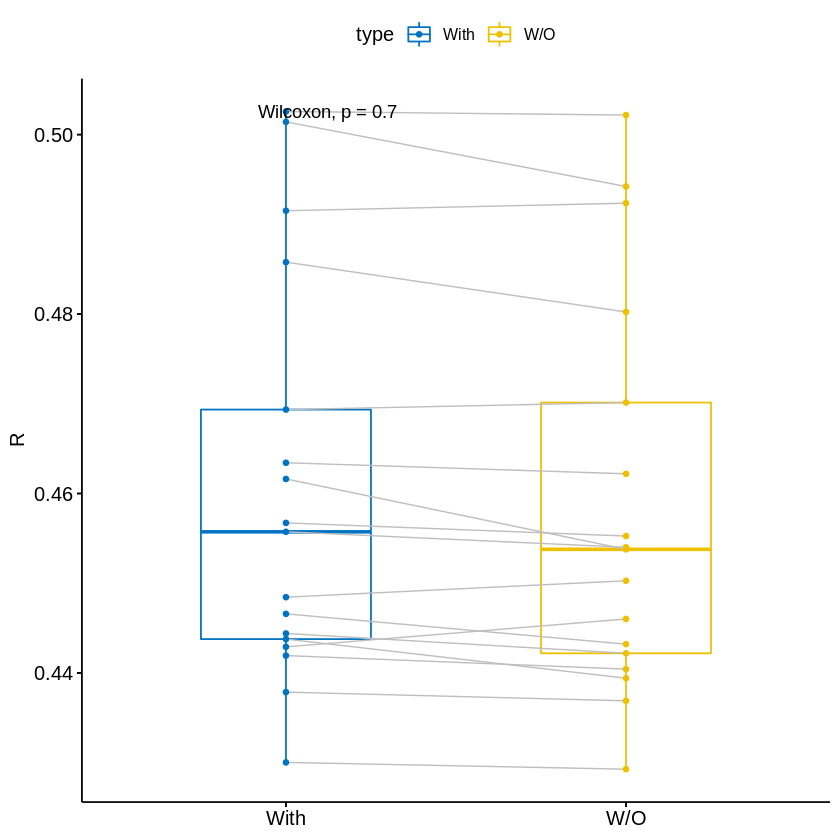

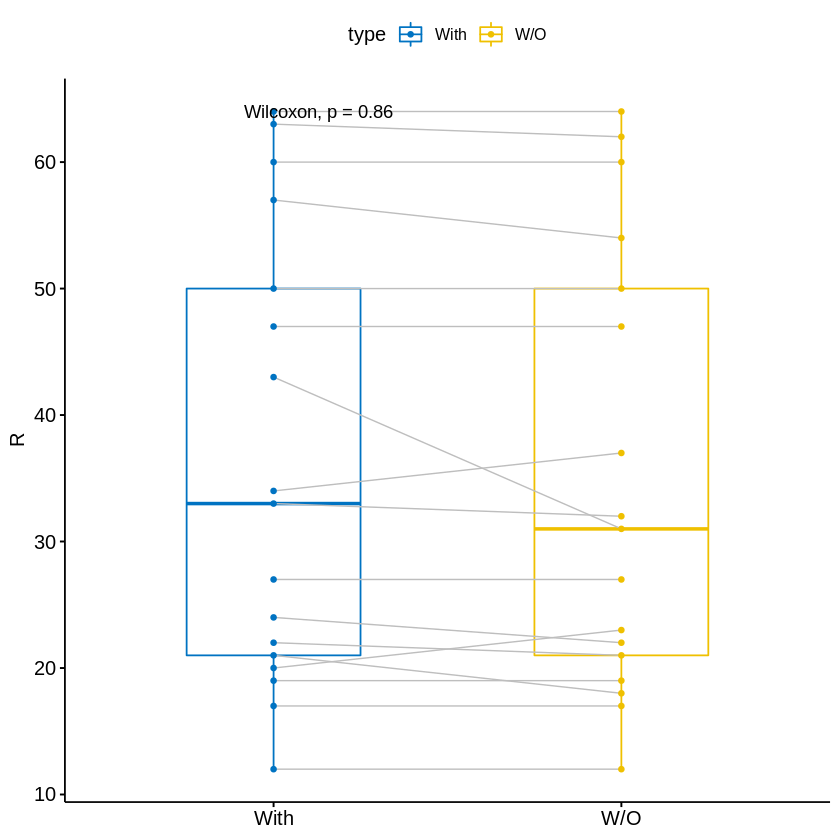

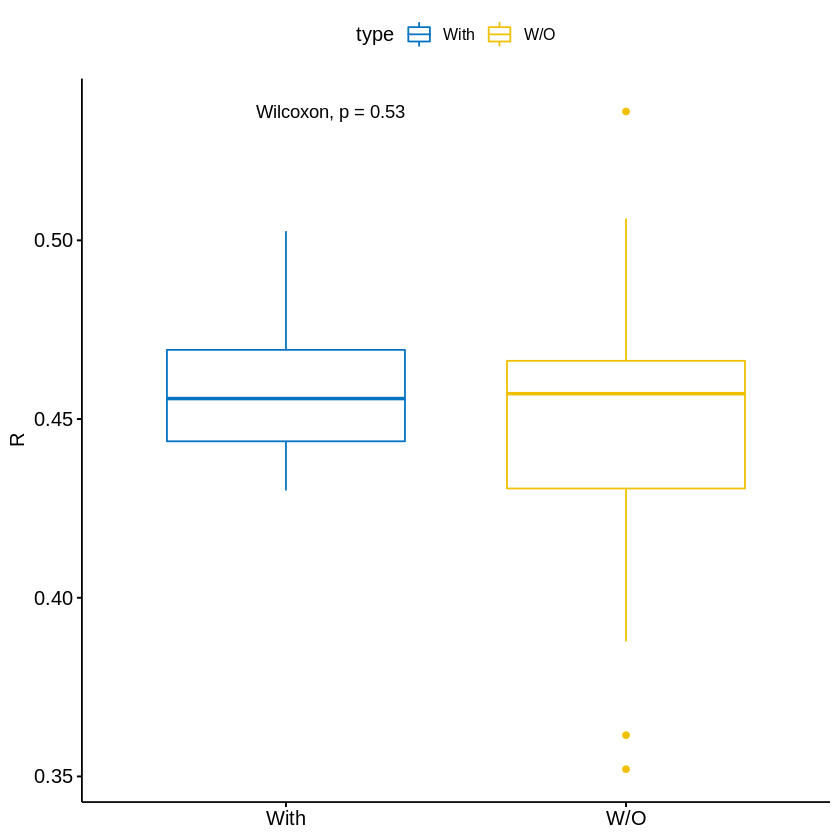

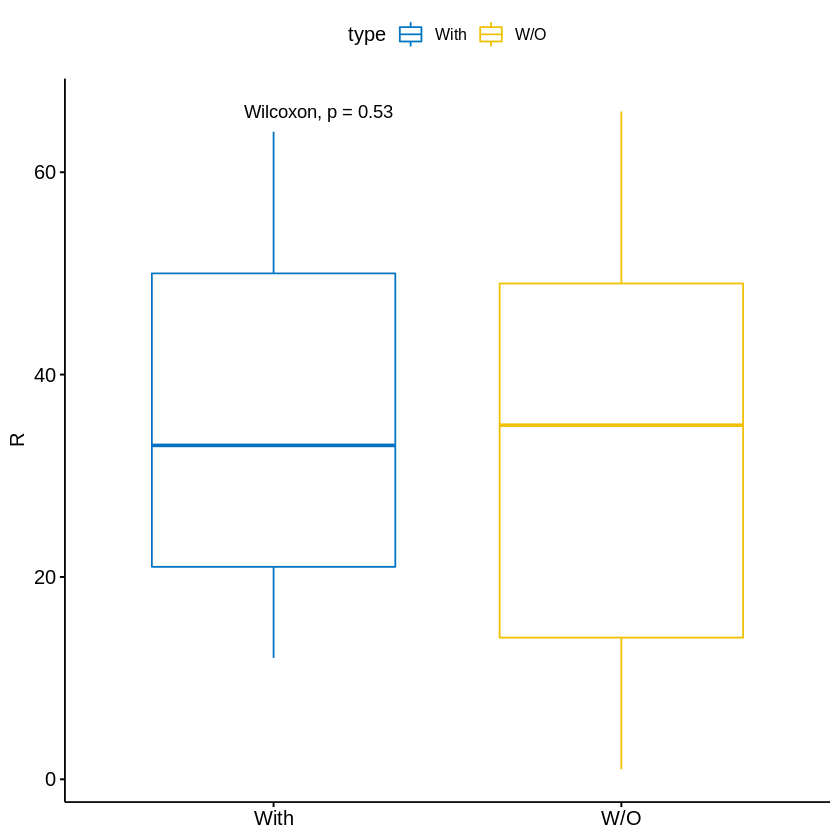

In [46]:
# extracting patients with subtype who are also newly diagnosed

KRAS_mut = filter(MM_pat_mut, GENE == "KRAS") %>%
  select(sample, EFFECT, HGVS_P, FEATURE) %>%
  filter(EFFECT == "missense_variant") %>%
  mutate(position = str_extract(HGVS_P, "[0-9]+")) %>%
  filter(position %in% c(12, 13, 61))

MM_pat_mut_KRAS = unique(KRAS_mut$sample)
keepcKRAS = colnames(MM_patients) %in% MM_pat_mut_KRAS

# subsetting norm_pat to those patients with translocation, 
# then keeping genes prior analysed as top 5000 most variably expressed

norm_pat_KRAS = norm_pat[,keepcKRAS]
norm_combined_KRAS = cbind(norm_cell, norm_pat_KRAS)
norm_combined_KRAS_5 = norm_combined_KRAS[keepi5000, ]

# making violin plots

makeplots(norm_combined_KRAS_5, colnames(norm_pat_KRAS), 
          colnames(MM_cell_line), 't(4;14) Analysis - Top 5000 Genes')

# extracting correlates of subtype patients and non subtype patients

MM.cor.KRAS = MM.cor.keats_5[keepcKRAS, ]
MM.cor.KRAS.opat = MM.cor.keats_5[!keepcKRAS, ]
MM.cor.KRAS.opat = MM.cor.KRAS.opat[rownames(MM.cor.KRAS.opat) %in% colnames(MM_patients_nd), ]

# printing out number of patients each

length(MM.cor.KRAS[,1])
length(MM.cor.KRAS.opat[,1])

# getting mean correlates, assigning type, and rank

MM.cor.KRAS.m = data.frame(colMeans(MM.cor.KRAS))
MM.cor.KRAS.m$type = 'With'
colnames(MM.cor.KRAS.m) = c('cor', 'type')
MM.cor.KRAS.m = (MM.cor.KRAS.m[order(MM.cor.KRAS.m$cor),])
MM.cor.KRAS.m$rank = rank_gen
MM.cor.KRAS.m = MM.cor.KRAS.m[order(rownames(MM.cor.KRAS.m)),]

MM.cor.KRAS.opat.m = data.frame(colMeans(MM.cor.KRAS.opat))
MM.cor.KRAS.opat.m$type = 'W/O'
colnames(MM.cor.KRAS.opat.m) = c('cor', 'type')
MM.cor.KRAS.opat.m = MM.cor.KRAS.opat.m[order(MM.cor.KRAS.opat.m$cor),]
MM.cor.KRAS.opat.m$rank = rank_gen
MM.cor.KRAS.opat.m = MM.cor.KRAS.opat.m[order(rownames(MM.cor.KRAS.opat.m)),]

# subsetting for cell lines with subtype

MM.cor.KRAS.m.c = MM.cor.KRAS.m[rownames(MM.cor.KRAS.m) %in% cell_names_KRAS,]
MM.cor.KRAS.opat.m.c = MM.cor.KRAS.opat.m[rownames(MM.cor.KRAS.opat.m) %in% cell_names_KRAS,]

# paired wise boxplots for subtype versus non subtype patients, looking at subtype cell lines

ggpaired(rbind(MM.cor.KRAS.m.c, MM.cor.KRAS.opat.m.c), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggpaired(rbind(MM.cor.KRAS.m.c, MM.cor.KRAS.opat.m.c), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving bound dataframe for faceted subplot

MM.cor.KRAS.bc = rbind(MM.cor.KRAS.m.c, MM.cor.KRAS.opat.m.c)

# subsetting for non subtype cell lines

MM.cor.KRAS.m.c2 = MM.cor.KRAS.m[(!(rownames(MM.cor.KRAS.m) %in% cell_names_KRAS)),]
MM.cor.KRAS.m.c2$type = 'W/O'

# boxplots for subtype patients, looking at subtype cell lines and non subtype cell lines

ggboxplot(rbind(MM.cor.KRAS.m.c, MM.cor.KRAS.m.c2), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggboxplot(rbind(MM.cor.KRAS.m.c, MM.cor.KRAS.m.c2), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving data frame for faceted boxplots

MM.cor.KRAS.bp = rbind(MM.cor.KRAS.m.c, MM.cor.KRAS.m.c2)

# subsetting for IL6 dependent and independent cell lines

MM.cor.KRAS.il6 = rbind(MM.cor.KRAS.m.c, MM.cor.KRAS.m.c2)
MM.cor.KRAS.il6d = MM.cor.KRAS.il6[cell_names_il6, ]
MM.cor.KRAS.il6d$type = 'IL6 Dep'
MM.cor.KRAS.il6i = MM.cor.KRAS.il6[!(rownames(MM.cor.KRAS.il6) %in% cell_names_il6),]
MM.cor.KRAS.il6i$type = 'IL6 Ind'

# boxplot comparing IL6 dependent and independent cell lines, looking at subtype patients

ggboxplot(rbind(MM.cor.KRAS.il6d, MM.cor.KRAS.il6i), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving data frame for faceted boxplot

MM.cor.KRAS.il6b = rbind(MM.cor.KRAS.il6d, MM.cor.KRAS.il6i)

# calculating top 5000 variable genes for subtype patients and repeating same analysis as aboev

keepi_KRAS = apply(norm_pat_KRAS, 1, IQR)
keepis_KRAS = sort(keepi, decreasing = TRUE)
keepi5000_KRAS = keepi %in% keepis[1:5000]
norm_combined_KRAS_5u = norm_combined[keepi5000_KRAS, ]

MM.cor.KRAS.n = cor(norm_combined_KRAS_5u, method = 's')
MM.cor.KRAS.n = MM.cor.KRAS.n[colnames(MM_patients), colnames(MM_cell_line)]
MM.cor.KRAS = MM.cor.KRAS.n[keepcKRAS, ]
MM.cor.KRAS.opat = MM.cor.KRAS.n[!keepcKRAS, ]
MM.cor.KRAS.opat = MM.cor.KRAS.opat[rownames(MM.cor.KRAS.opat) %in% colnames(MM_patients_nd), ]

MM.cor.KRAS.m = data.frame(colMeans(MM.cor.KRAS))
MM.cor.KRAS.m$type = 'With'
colnames(MM.cor.KRAS.m) = c('cor', 'type')
MM.cor.KRAS.m = (MM.cor.KRAS.m[order(MM.cor.KRAS.m$cor),])
MM.cor.KRAS.m$rank = rank_gen
MM.cor.KRAS.m = MM.cor.KRAS.m[order(rownames(MM.cor.KRAS.m)),]

MM.cor.KRAS.opat.m = data.frame(colMeans(MM.cor.KRAS.opat))
MM.cor.KRAS.opat.m$type = 'W/O'
colnames(MM.cor.KRAS.opat.m) = c('cor', 'type')
MM.cor.KRAS.opat.m = MM.cor.KRAS.opat.m[order(MM.cor.KRAS.opat.m$cor),]
MM.cor.KRAS.opat.m$rank = rank_gen
MM.cor.KRAS.opat.m = MM.cor.KRAS.opat.m[order(rownames(MM.cor.KRAS.opat.m)),]

MM.cor.KRAS.m.c = MM.cor.KRAS.m[rownames(MM.cor.KRAS.m) %in% cell_names_KRAS,]
MM.cor.KRAS.opat.m.c = MM.cor.KRAS.opat.m[rownames(MM.cor.KRAS.opat.m) %in% cell_names_KRAS,]

ggpaired(rbind(MM.cor.KRAS.m.c, MM.cor.KRAS.opat.m.c), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggpaired(rbind(MM.cor.KRAS.m.c, MM.cor.KRAS.opat.m.c), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

MM.cor.KRAS.bcu = rbind(MM.cor.KRAS.m.c, MM.cor.KRAS.opat.m.c)

MM.cor.KRAS.m.c2 = MM.cor.KRAS.m[(!(rownames(MM.cor.KRAS.m) %in% cell_names_KRAS)),]
MM.cor.KRAS.m.c2$type = 'W/O'

ggboxplot(rbind(MM.cor.KRAS.m.c, MM.cor.KRAS.m.c2), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggboxplot(rbind(MM.cor.KRAS.m.c, MM.cor.KRAS.m.c2), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

MM.cor.KRAS.bpu = rbind(MM.cor.KRAS.m.c, MM.cor.KRAS.m.c2)

[1] 178

[1] 626

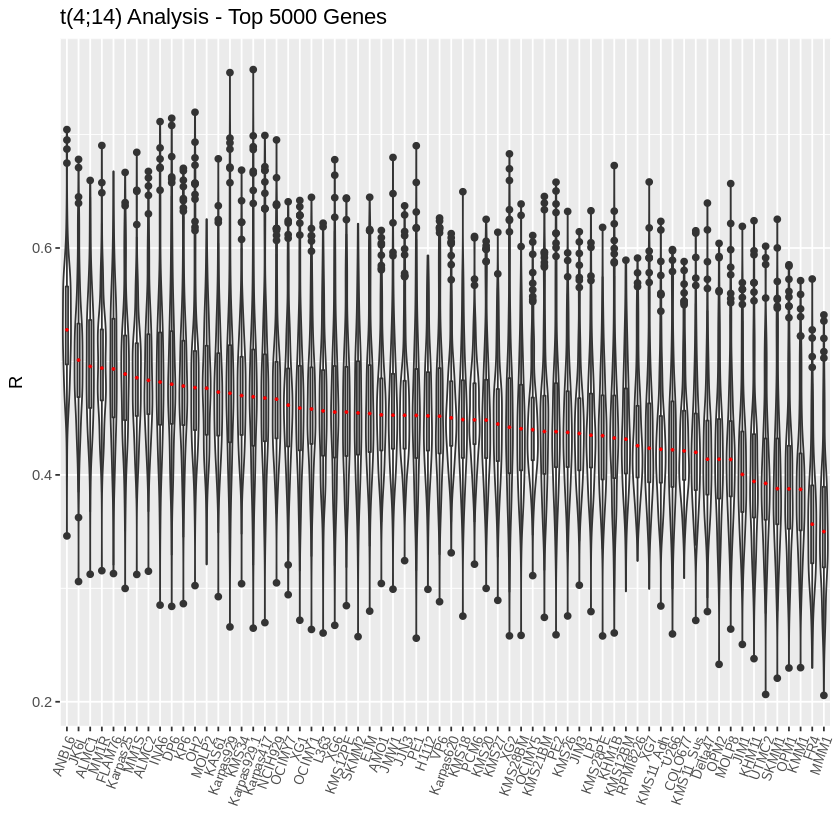

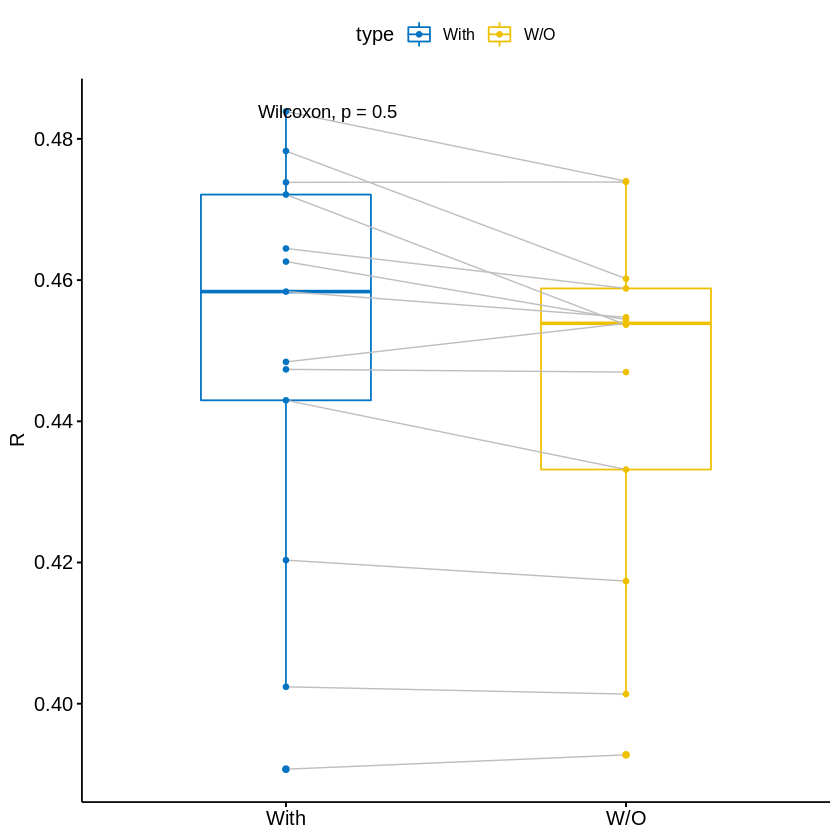

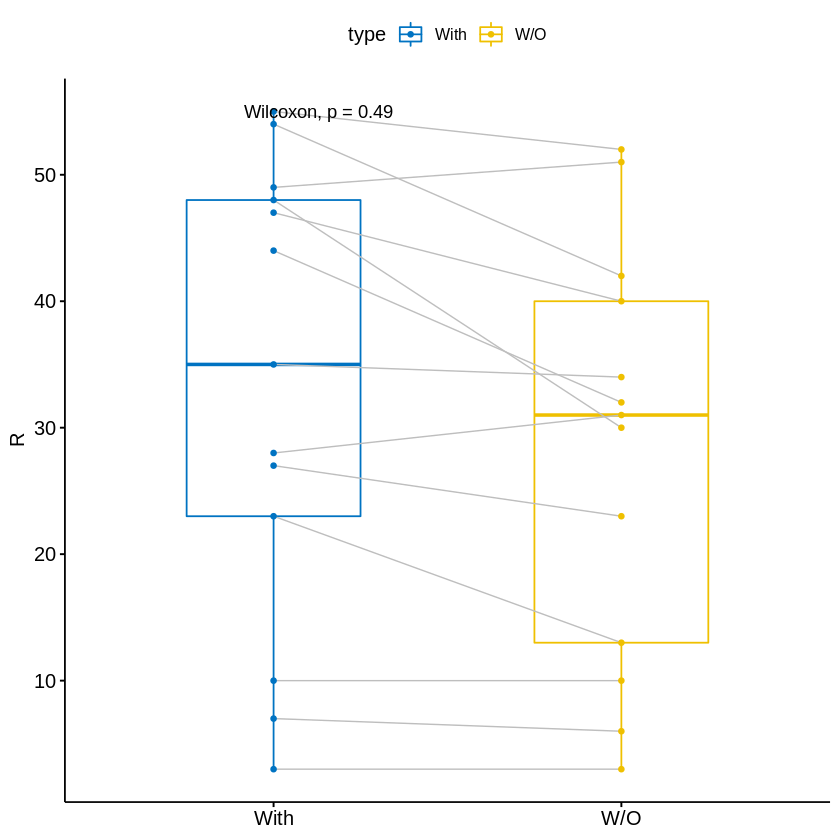

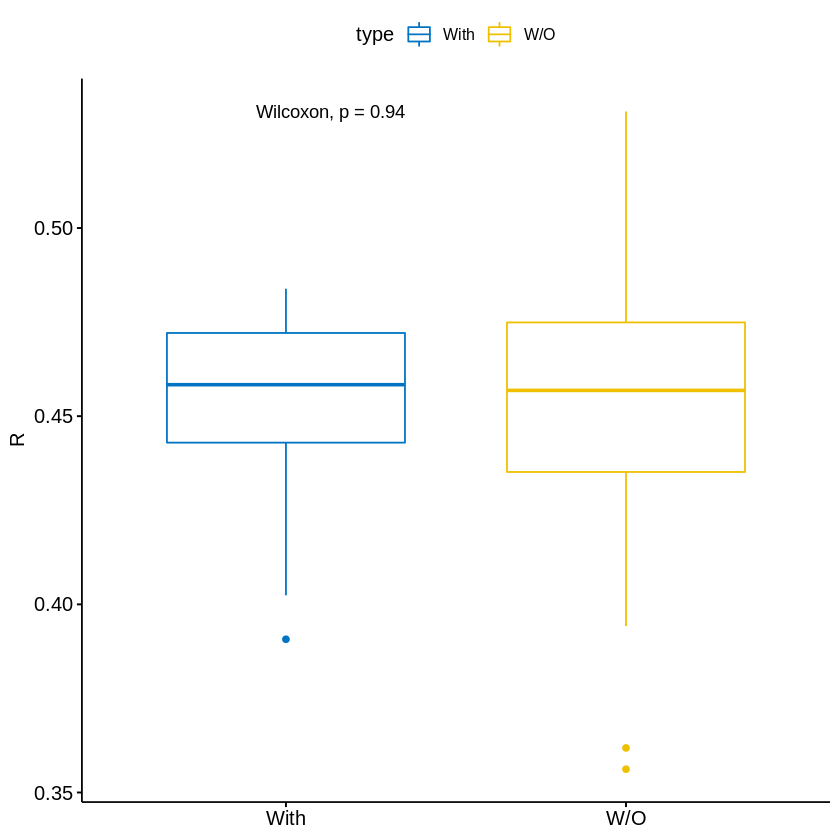

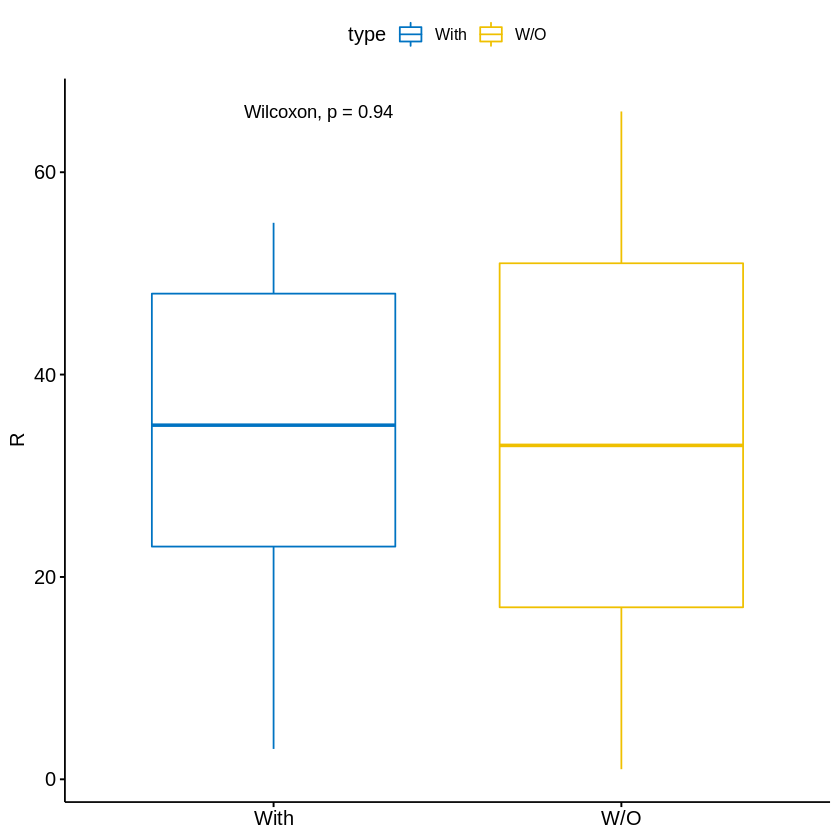

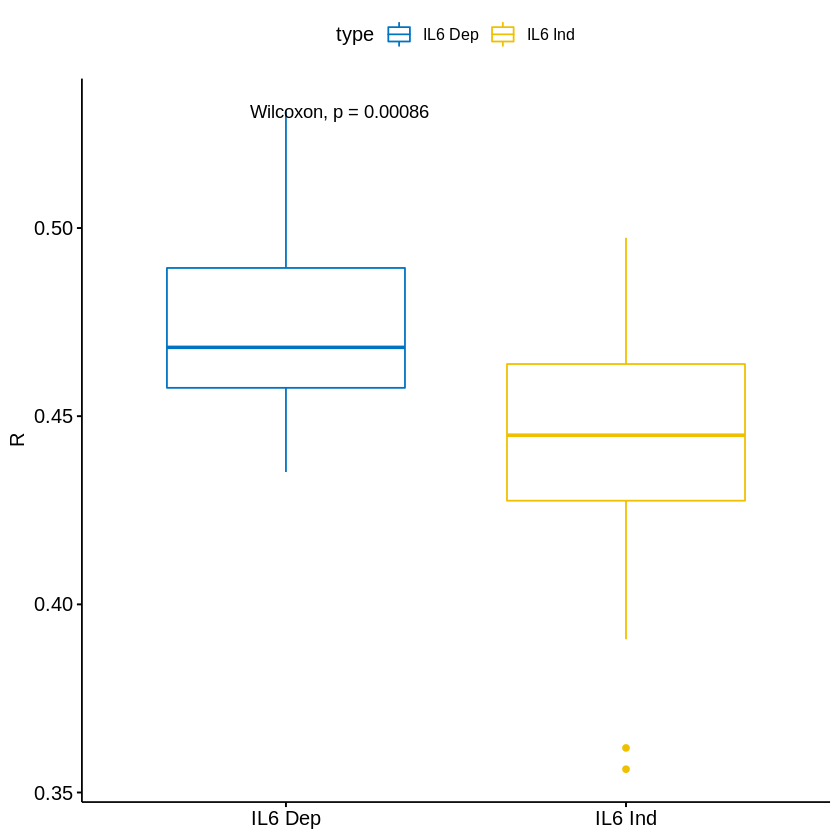

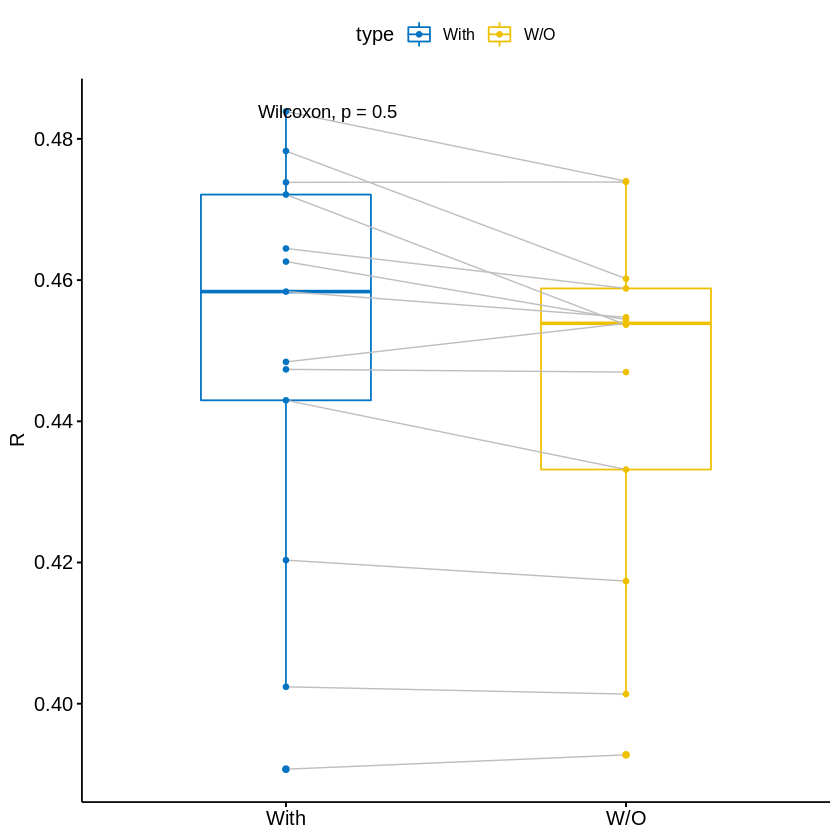

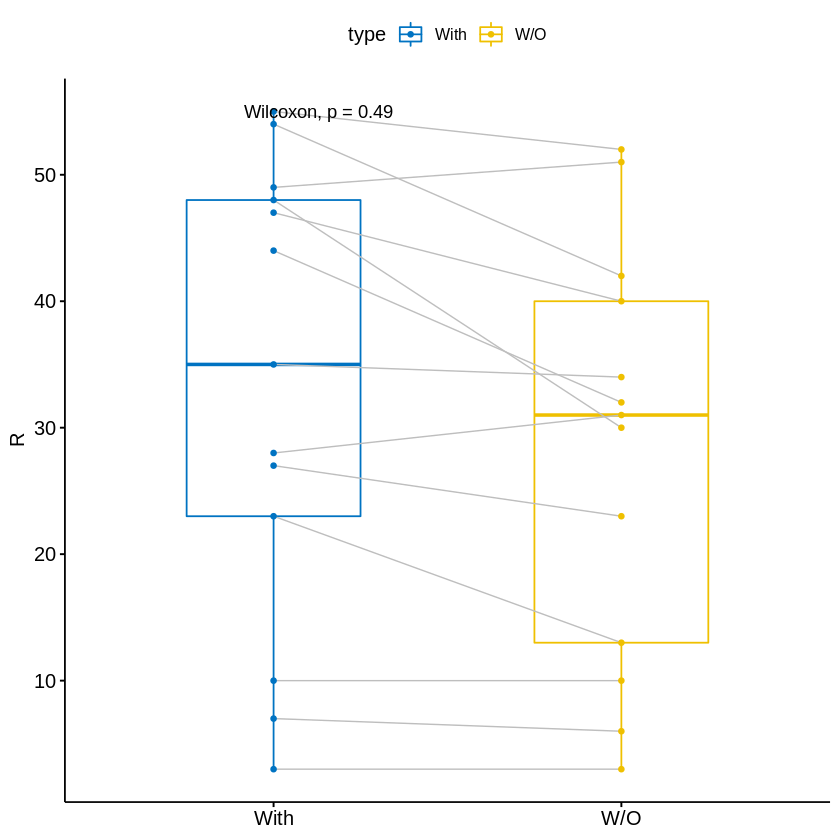

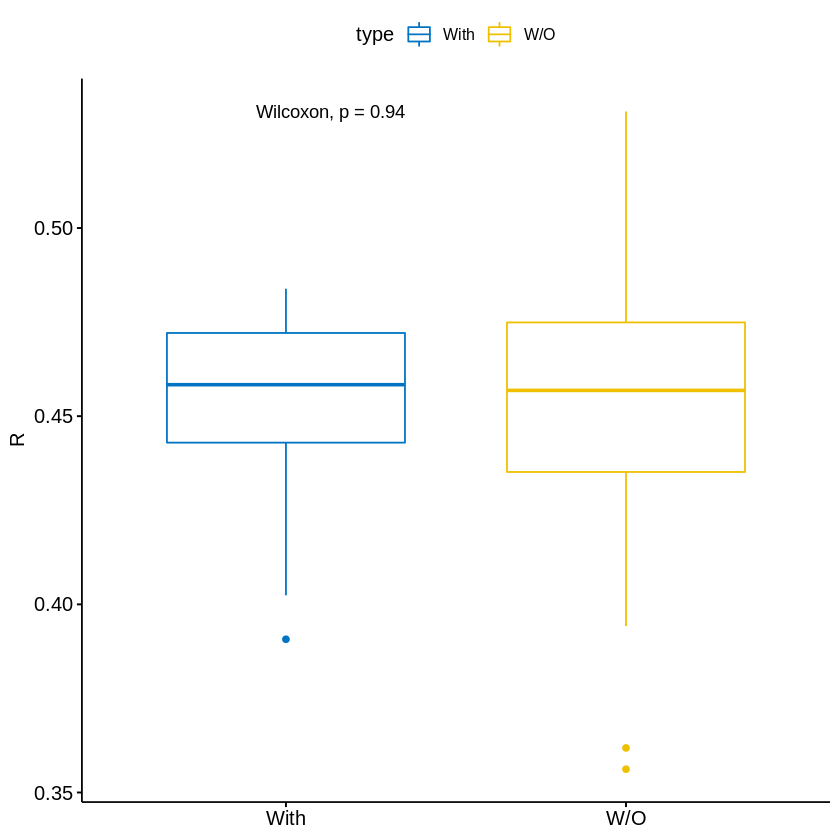

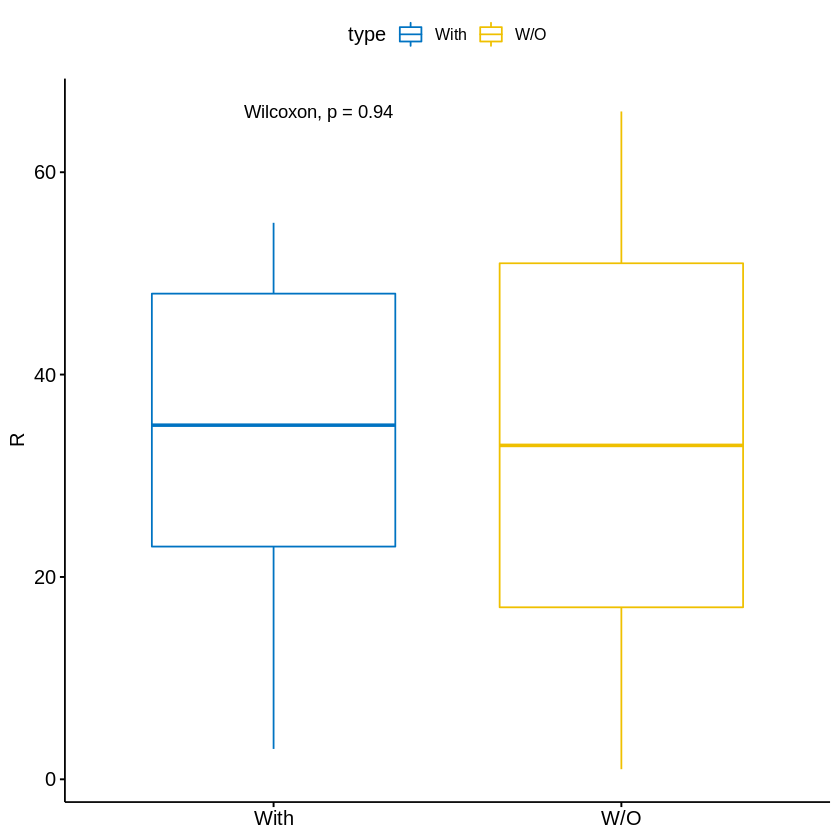

In [47]:
# extracting patients with subtype who are also newly diagnosed

NRAS_mut = filter(MM_pat_mut, GENE == "NRAS") %>%
  select(sample, EFFECT, HGVS_P, FEATURE) %>%
  filter(EFFECT == "missense_variant") %>%
  mutate(position = str_extract(HGVS_P, "[0-9]+")) %>%
  filter(position %in% c(12, 13, 61))

MM_pat_mut_NRAS = unique(NRAS_mut$sample)
keepcNRAS = colnames(MM_patients) %in% MM_pat_mut_NRAS

# subsetting norm_pat to those patients with translocation, 
# then keeping genes prior analysed as top 5000 most variably expressed

norm_pat_NRAS = norm_pat[,keepcNRAS]
norm_combined_NRAS = cbind(norm_cell, norm_pat_NRAS)
norm_combined_NRAS_5 = norm_combined_NRAS[keepi5000, ]

# making violin plots

makeplots(norm_combined_NRAS_5, colnames(norm_pat_NRAS), 
          colnames(MM_cell_line), 't(4;14) Analysis - Top 5000 Genes')

# extracting correlates of subtype patients and non subtype patients

MM.cor.NRAS = MM.cor.keats_5[keepcNRAS, ]
MM.cor.NRAS.opat = MM.cor.keats_5[!keepcNRAS, ]
MM.cor.NRAS.opat = MM.cor.NRAS.opat[rownames(MM.cor.NRAS.opat) %in% colnames(MM_patients_nd), ]

# printing out number of patients each

length(MM.cor.NRAS[,1])
length(MM.cor.NRAS.opat[,1])

# getting mean correlates, assigning type, and rank

MM.cor.NRAS.m = data.frame(colMeans(MM.cor.NRAS))
MM.cor.NRAS.m$type = 'With'
colnames(MM.cor.NRAS.m) = c('cor', 'type')
MM.cor.NRAS.m = (MM.cor.NRAS.m[order(MM.cor.NRAS.m$cor),])
MM.cor.NRAS.m$rank = rank_gen
MM.cor.NRAS.m = MM.cor.NRAS.m[order(rownames(MM.cor.NRAS.m)),]

MM.cor.NRAS.opat.m = data.frame(colMeans(MM.cor.NRAS.opat))
MM.cor.NRAS.opat.m$type = 'W/O'
colnames(MM.cor.NRAS.opat.m) = c('cor', 'type')
MM.cor.NRAS.opat.m = MM.cor.NRAS.opat.m[order(MM.cor.NRAS.opat.m$cor),]
MM.cor.NRAS.opat.m$rank = rank_gen
MM.cor.NRAS.opat.m = MM.cor.NRAS.opat.m[order(rownames(MM.cor.NRAS.opat.m)),]

# subsetting for cell lines with subtype

MM.cor.NRAS.m.c = MM.cor.NRAS.m[rownames(MM.cor.NRAS.m) %in% cell_names_NRAS,]
MM.cor.NRAS.opat.m.c = MM.cor.NRAS.opat.m[rownames(MM.cor.NRAS.opat.m) %in% cell_names_NRAS,]

# paired wise boxplots for subtype versus non subtype patients, looking at subtype cell lines

ggpaired(rbind(MM.cor.NRAS.m.c, MM.cor.NRAS.opat.m.c), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggpaired(rbind(MM.cor.NRAS.m.c, MM.cor.NRAS.opat.m.c), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving bound dataframe for faceted subplot

MM.cor.NRAS.bc = rbind(MM.cor.NRAS.m.c, MM.cor.NRAS.opat.m.c)

# subsetting for non subtype cell lines

MM.cor.NRAS.m.c2 = MM.cor.NRAS.m[(!(rownames(MM.cor.NRAS.m) %in% cell_names_NRAS)),]
MM.cor.NRAS.m.c2$type = 'W/O'

# boxplots for subtype patients, looking at subtype cell lines and non subtype cell lines

ggboxplot(rbind(MM.cor.NRAS.m.c, MM.cor.NRAS.m.c2), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggboxplot(rbind(MM.cor.NRAS.m.c, MM.cor.NRAS.m.c2), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving data frame for faceted boxplots

MM.cor.NRAS.bp = rbind(MM.cor.NRAS.m.c, MM.cor.NRAS.m.c2)

# subsetting for IL6 dependent and independent cell lines

MM.cor.NRAS.il6 = rbind(MM.cor.NRAS.m.c, MM.cor.NRAS.m.c2)
MM.cor.NRAS.il6d = MM.cor.NRAS.il6[cell_names_il6, ]
MM.cor.NRAS.il6d$type = 'IL6 Dep'
MM.cor.NRAS.il6i = MM.cor.NRAS.il6[!(rownames(MM.cor.NRAS.il6) %in% cell_names_il6),]
MM.cor.NRAS.il6i$type = 'IL6 Ind'

# boxplot comparing IL6 dependent and independent cell lines, looking at subtype patients

ggboxplot(rbind(MM.cor.NRAS.il6d, MM.cor.NRAS.il6i), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

# saving data frame for faceted boxplot

MM.cor.NRAS.il6b = rbind(MM.cor.NRAS.il6d, MM.cor.NRAS.il6i)

# calculating top 5000 variable genes for subtype patients and repeating same analysis as aboev

keepi_NRAS = apply(norm_pat_NRAS, 1, IQR)
keepis_NRAS = sort(keepi, decreasing = TRUE)
keepi5000_NRAS = keepi %in% keepis[1:5000]
norm_combined_NRAS_5u = norm_combined[keepi5000_NRAS, ]

MM.cor.NRAS.n = cor(norm_combined_NRAS_5u, method = 's')
MM.cor.NRAS.n = MM.cor.NRAS.n[colnames(MM_patients), colnames(MM_cell_line)]
MM.cor.NRAS = MM.cor.NRAS.n[keepcNRAS, ]
MM.cor.NRAS.opat = MM.cor.NRAS.n[!keepcNRAS, ]
MM.cor.NRAS.opat = MM.cor.NRAS.opat[rownames(MM.cor.NRAS.opat) %in% colnames(MM_patients_nd), ]

MM.cor.NRAS.m = data.frame(colMeans(MM.cor.NRAS))
MM.cor.NRAS.m$type = 'With'
colnames(MM.cor.NRAS.m) = c('cor', 'type')
MM.cor.NRAS.m = (MM.cor.NRAS.m[order(MM.cor.NRAS.m$cor),])
MM.cor.NRAS.m$rank = rank_gen
MM.cor.NRAS.m = MM.cor.NRAS.m[order(rownames(MM.cor.NRAS.m)),]

MM.cor.NRAS.opat.m = data.frame(colMeans(MM.cor.NRAS.opat))
MM.cor.NRAS.opat.m$type = 'W/O'
colnames(MM.cor.NRAS.opat.m) = c('cor', 'type')
MM.cor.NRAS.opat.m = MM.cor.NRAS.opat.m[order(MM.cor.NRAS.opat.m$cor),]
MM.cor.NRAS.opat.m$rank = rank_gen
MM.cor.NRAS.opat.m = MM.cor.NRAS.opat.m[order(rownames(MM.cor.NRAS.opat.m)),]

MM.cor.NRAS.m.c = MM.cor.NRAS.m[rownames(MM.cor.NRAS.m) %in% cell_names_NRAS,]
MM.cor.NRAS.opat.m.c = MM.cor.NRAS.opat.m[rownames(MM.cor.NRAS.opat.m) %in% cell_names_NRAS,]

ggpaired(rbind(MM.cor.NRAS.m.c, MM.cor.NRAS.opat.m.c), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggpaired(rbind(MM.cor.NRAS.m.c, MM.cor.NRAS.opat.m.c), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

MM.cor.NRAS.bcu = rbind(MM.cor.NRAS.m.c, MM.cor.NRAS.opat.m.c)

MM.cor.NRAS.m.c2 = MM.cor.NRAS.m[(!(rownames(MM.cor.NRAS.m) %in% cell_names_NRAS)),]
MM.cor.NRAS.m.c2$type = 'W/O'

ggboxplot(rbind(MM.cor.NRAS.m.c, MM.cor.NRAS.m.c2), x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

ggboxplot(rbind(MM.cor.NRAS.m.c, MM.cor.NRAS.m.c2), x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE) + stat_compare_means()

MM.cor.NRAS.bpu = rbind(MM.cor.NRAS.m.c, MM.cor.NRAS.m.c2)

geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?
geom_path: Each group consists of only one observation. Do you need to adjust
the group aesthetic?


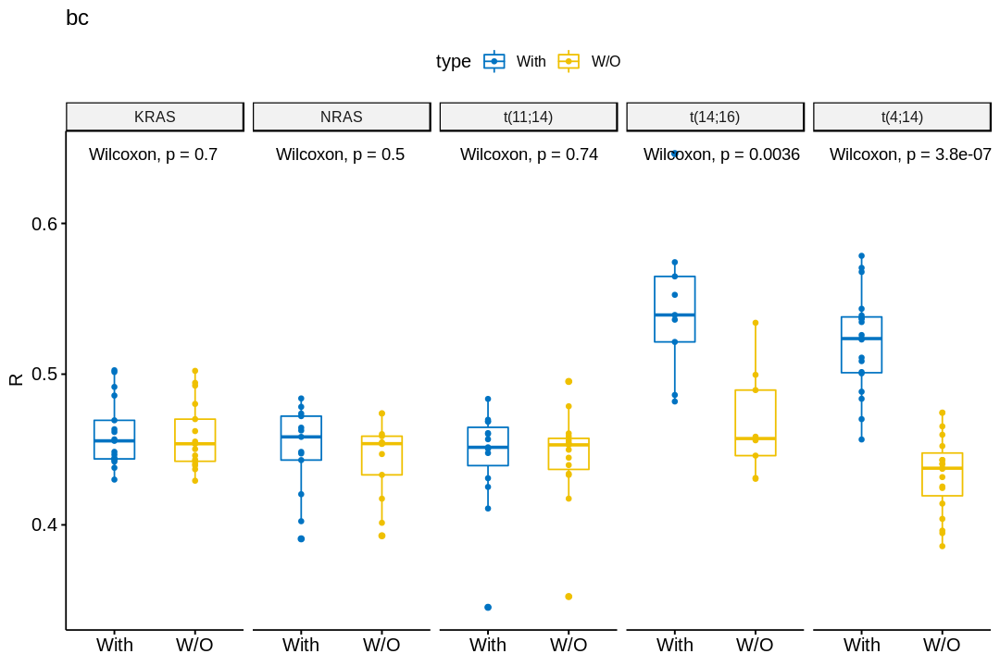

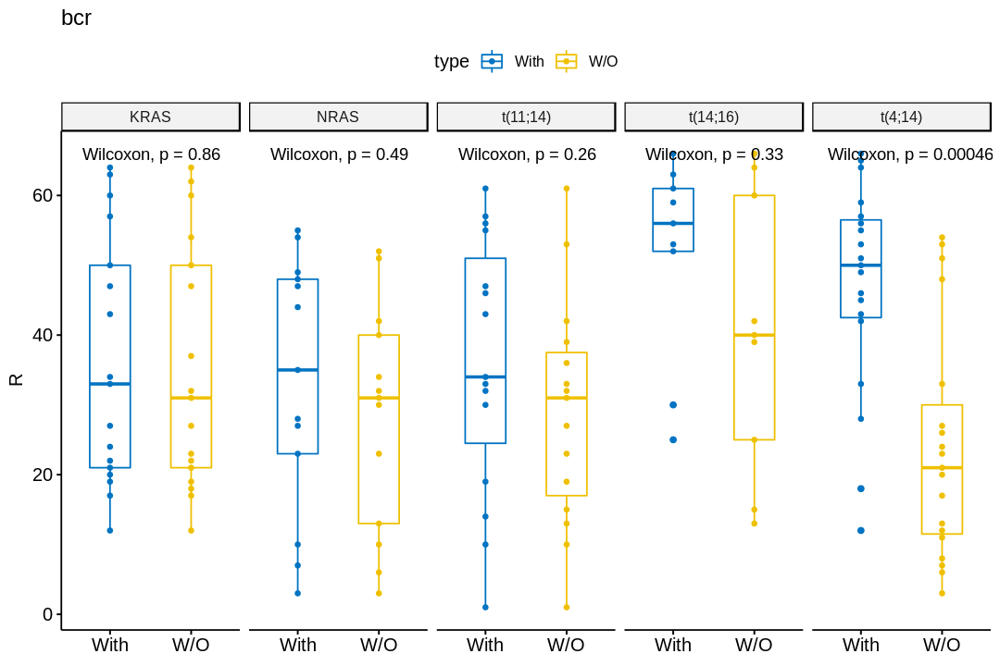

In [48]:
# assigning subtype for faceted subplot

MM.cor.414.bc$subtype = 't(4;14)'
MM.cor.1114.bc$subtype = 't(11;14)'
MM.cor.1416.bc$subtype = 't(14;16)'
MM.cor.KRAS.bc$subtype = 'KRAS'
MM.cor.NRAS.bc$subtype = 'NRAS'

# fusing dataframes by row

bc = rbind(MM.cor.414.bc, MM.cor.1114.bc)
bc = rbind(bc, MM.cor.1416.bc)
bc = rbind(bc, MM.cor.KRAS.bc)
bc = rbind(bc, MM.cor.NRAS.bc)

# paired wise faceted boxplots 

p = ggpaired(bc, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE, title = 'bc') + stat_compare_means()

p2 = ggpaired(bc, x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE, title = 'bcr') + stat_compare_means()

options(repr.plot.height = 6, repr.plot.width = 9)

facet(p, facet.by = 'subtype', nrow = 1)
facet(p2, facet.by = 'subtype', nrow = 1)

options(repr.plot.height = 7, repr.plot.width = 7)

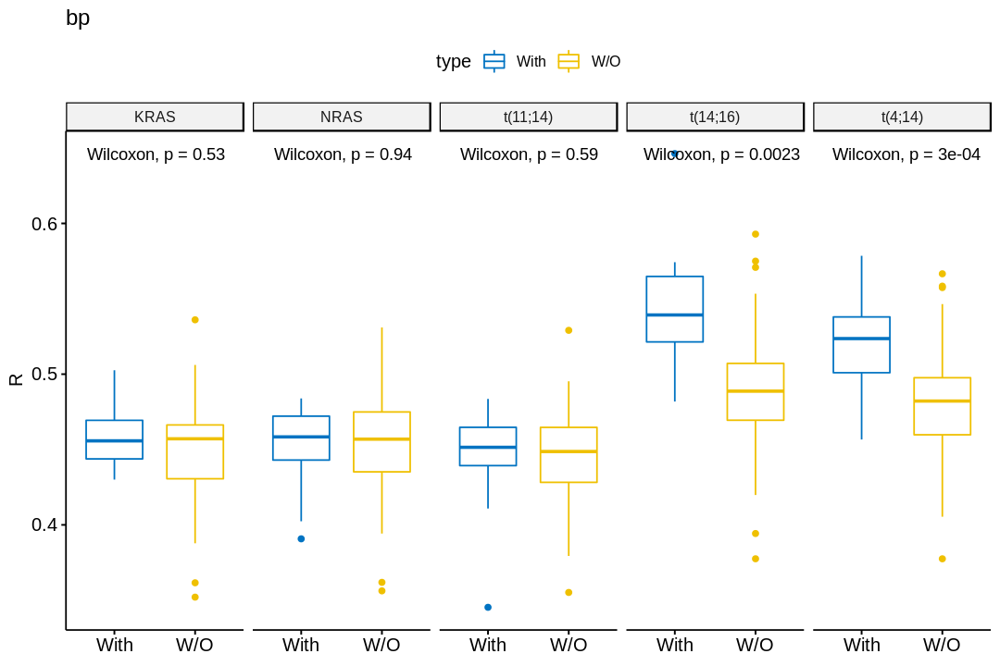

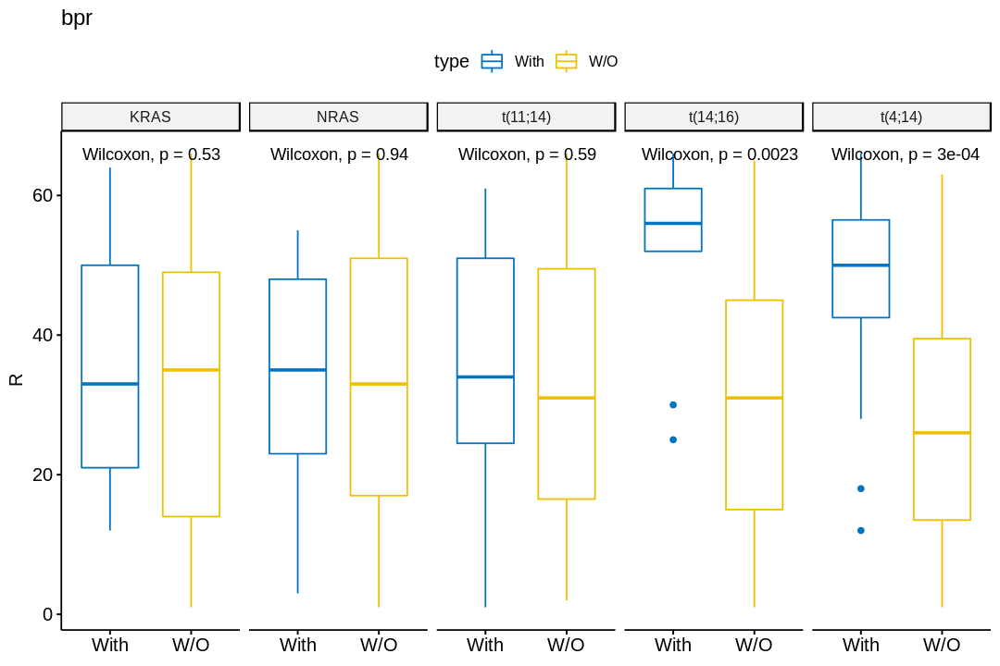

In [49]:
# same as above

MM.cor.414.bp$subtype = 't(4;14)'
MM.cor.1114.bp$subtype = 't(11;14)'
MM.cor.1416.bp$subtype = 't(14;16)'
MM.cor.KRAS.bp$subtype = 'KRAS'
MM.cor.NRAS.bp$subtype = 'NRAS'

bp = rbind(MM.cor.414.bp, MM.cor.1114.bp)
bp = rbind(bp, MM.cor.1416.bp)
bp = rbind(bp, MM.cor.KRAS.bp)
bp = rbind(bp, MM.cor.NRAS.bp)

p = ggboxplot(bp, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE, title = 'bp') + stat_compare_means()


p2 = ggboxplot(bp, x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE, title = 'bpr') + stat_compare_means()

options(repr.plot.height = 6, repr.plot.width = 9)

facet(p, facet.by = 'subtype', nrow = 1)
facet(p2, facet.by = 'subtype', nrow = 1)

options(repr.plot.height = 7, repr.plot.width = 7)

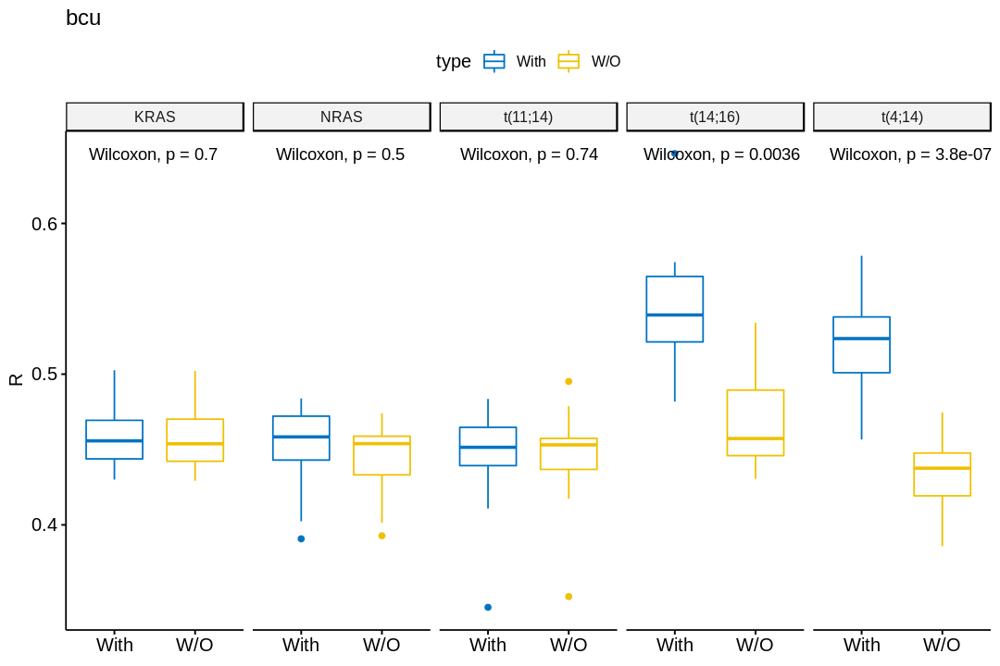

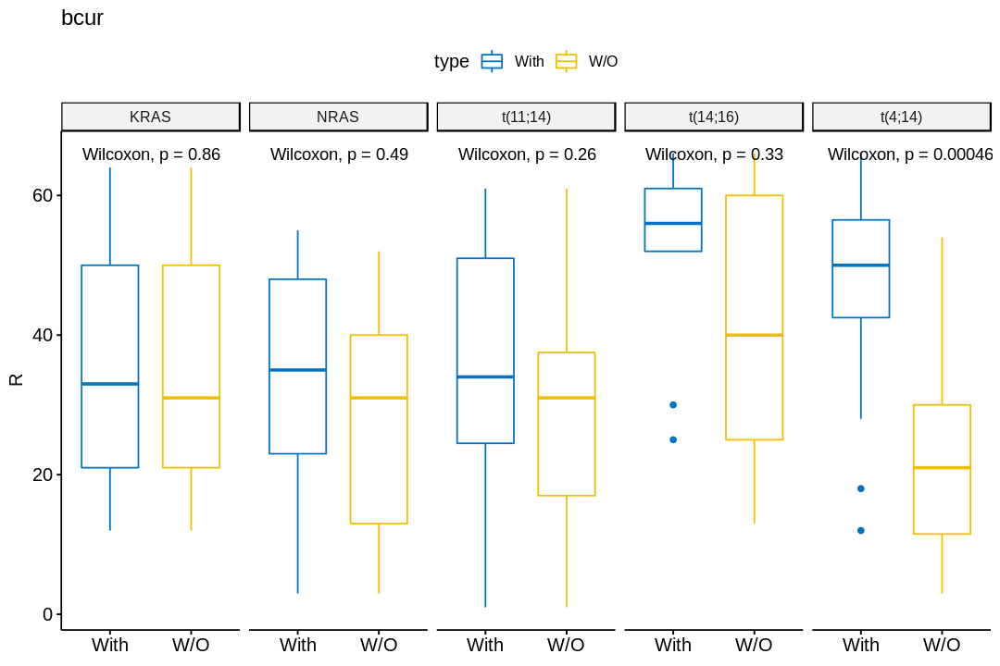

In [50]:
# same as above

MM.cor.414.bcu$subtype = 't(4;14)'
MM.cor.1114.bcu$subtype = 't(11;14)'
MM.cor.1416.bcu$subtype = 't(14;16)'
MM.cor.KRAS.bcu$subtype = 'KRAS'
MM.cor.NRAS.bcu$subtype = 'NRAS'

bcu = rbind(MM.cor.414.bcu, MM.cor.1114.bcu)
bcu = rbind(bcu, MM.cor.1416.bcu)
bcu = rbind(bcu, MM.cor.KRAS.bcu)
bcu = rbind(bcu, MM.cor.NRAS.bcu)

p = ggboxplot(bcu, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE, title = 'bcu') + stat_compare_means()


p2 = ggboxplot(bcu, x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE, title = 'bcur') + stat_compare_means()

options(repr.plot.height = 6, repr.plot.width = 9)

facet(p, facet.by = 'subtype', nrow = 1)
facet(p2, facet.by = 'subtype', nrow = 1)

options(repr.plot.height = 7, repr.plot.width = 7)

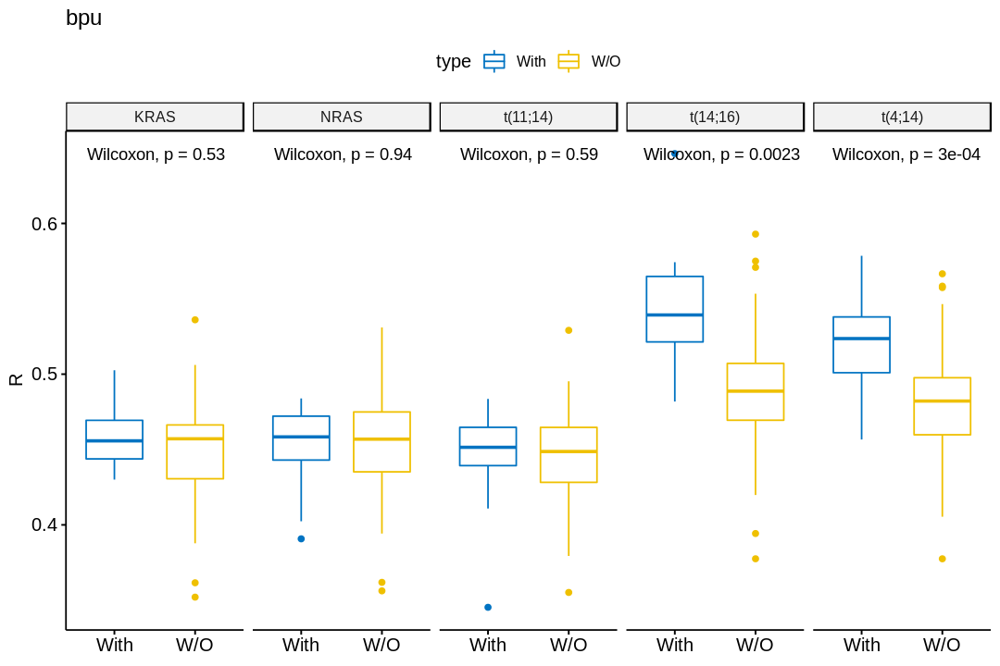

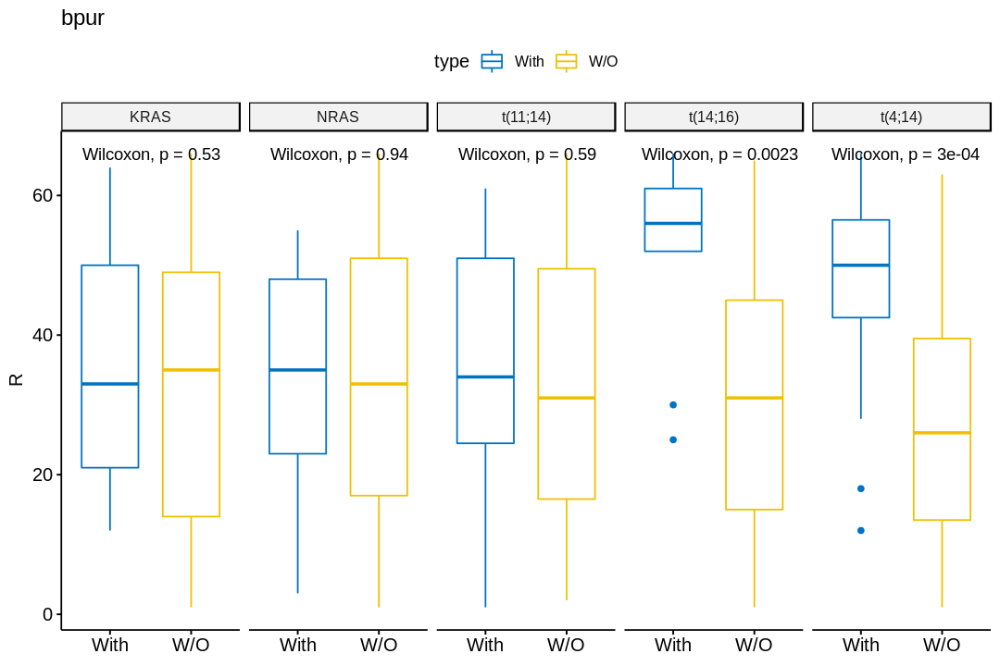

In [51]:
# same as above

MM.cor.414.bpu$subtype = 't(4;14)'
MM.cor.1114.bpu$subtype = 't(11;14)'
MM.cor.1416.bpu$subtype = 't(14;16)'
MM.cor.KRAS.bpu$subtype = 'KRAS'
MM.cor.NRAS.bpu$subtype = 'NRAS'

bpu = rbind(MM.cor.414.bpu, MM.cor.1114.bpu)
bpu = rbind(bpu, MM.cor.1416.bpu)
bpu = rbind(bpu, MM.cor.KRAS.bpu)
bpu = rbind(bpu, MM.cor.NRAS.bpu)

p = ggboxplot(bpu, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE, title = 'bpu') + stat_compare_means()


p2 = ggboxplot(bpu, x = "type", y = "rank",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE, title = 'bpur') + stat_compare_means()

options(repr.plot.height = 6, repr.plot.width = 9)

facet(p, facet.by = 'subtype', nrow = 1)
facet(p2, facet.by = 'subtype', nrow = 1)

options(repr.plot.height = 7, repr.plot.width = 7)

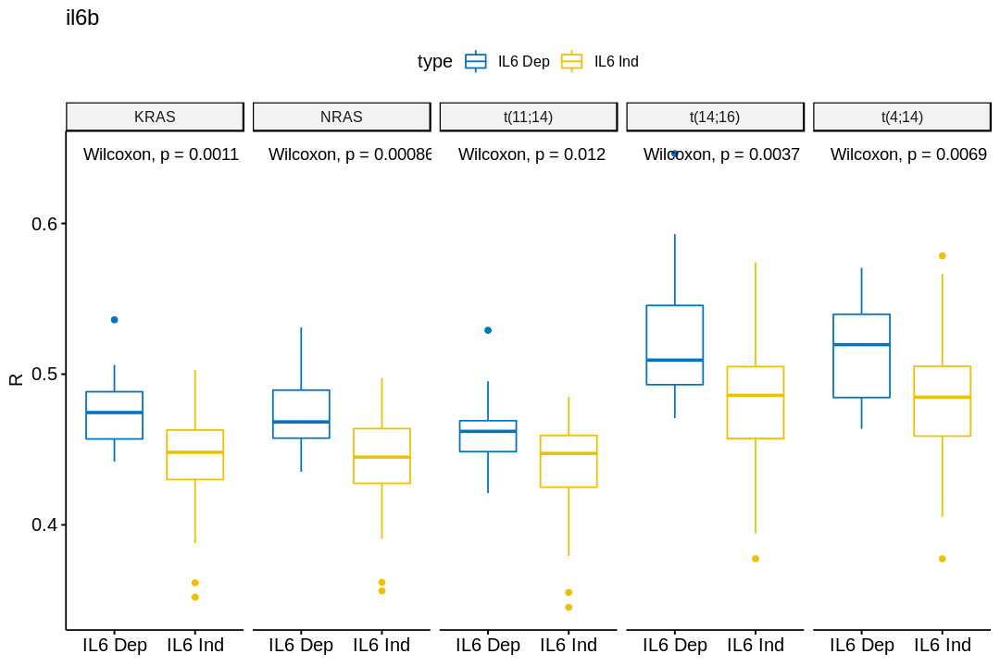

In [52]:
# same as above

MM.cor.414.il6b$subtype = 't(4;14)'
MM.cor.1114.il6b$subtype = 't(11;14)'
MM.cor.1416.il6b$subtype = 't(14;16)'
MM.cor.KRAS.il6b$subtype = 'KRAS'
MM.cor.NRAS.il6b$subtype = 'NRAS'

il6b = rbind(MM.cor.414.il6b, MM.cor.1114.il6b)
il6b = rbind(il6b, MM.cor.1416.il6b)
il6b = rbind(il6b, MM.cor.KRAS.il6b)
il6b = rbind(il6b, MM.cor.NRAS.il6b)

p = ggboxplot(il6b, x = "type", y = "cor",
         color = "type", line.color = "gray", line.size = 0.4,
         palette = "jco", ylab = 'R', xlab = FALSE, title = 'il6b') + stat_compare_means()

options(repr.plot.height = 6, repr.plot.width = 9)

facet(p, facet.by = 'subtype', nrow = 1)

options(repr.plot.height = 7, repr.plot.width = 7)

chr,start,end,sample,EFFECT,GENE,ID,REF,ALT,X1000G,⋯,CDS_POS,CDS_LEN,AA_POS,AA_LEN,DISTANCE,ERRORS,LOF_GENE,LOF_GENEID,LOF_NUMTR,LOF_PERC
<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,3348577,3348577,MMRF_1016_1_BM,missense_variant,PRDM16,rs755588843,C,T,.,⋯,3569,3831,1190,1276,0,.,.,.,.,.
1,36388198,36388198,MMRF_1016_1_BM,3_prime_UTR_variant,AGO1,rs569344016,G,GGCCT,true,⋯,-1,-1,-1,-1,3024,INFO_REALIGN_3_PRIME,.,.,.,.
1,74801685,74801685,MMRF_1016_1_BM,intron_variant,FPGT-TNNI3K,.,A,C,.,⋯,-1,-1,-1,-1,0,.,.,.,.,.
1,74801685,74801685,MMRF_1016_1_BM,intron_variant,TNNI3K,.,A,C,.,⋯,-1,-1,-1,-1,0,.,.,.,.,.
1,94466482,94466482,MMRF_1016_1_BM,missense_variant&splice_region_variant,ABCA4,.,A,G,.,⋯,6389,6822,2130,2273,0,.,.,.,.,.
1,110260494,110260494,MMRF_1016_1_BM,3_prime_UTR_variant,GSTM5,.,C,T,.,⋯,-1,-1,-1,-1,446,.,.,.,.,.


[1] 31629

[1] 945

chr,start,end,sample,EFFECT,GENE,ID,REF,ALT,X1000G,⋯,CDS_POS,CDS_LEN,AA_POS,AA_LEN,DISTANCE,ERRORS,LOF_GENE,LOF_GENEID,LOF_NUMTR,LOF_PERC
<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,3348577,3348577,MMRF_1016_1_BM,missense_variant,PRDM16,rs755588843,C,T,.,⋯,3569,3831,1190,1276,0,.,.,.,.,.
1,94466482,94466482,MMRF_1016_1_BM,missense_variant&splice_region_variant,ABCA4,.,A,G,.,⋯,6389,6822,2130,2273,0,.,.,.,.,.
1,152327653,152327653,MMRF_1016_1_BM,missense_variant,FLG2,.,C,G,.,⋯,2609,7176,870,2391,0,.,.,.,.,.
2,21364769,21364769,MMRF_1016_1_BM,missense_variant,TDRD15,.,A,T,.,⋯,4430,5805,1477,1934,0,.,.,.,.,.
2,43452290,43452290,MMRF_1016_1_BM,missense_variant,ZFP36L2,.,G,T,.,⋯,653,1485,218,494,0,.,.,.,.,.
2,43452291,43452291,MMRF_1016_1_BM,missense_variant,ZFP36L2,.,C,A,.,⋯,652,1485,218,494,0,.,.,.,.,.


[1] 15039

[1] 15039

[1] 892

ERROR while rich displaying an object: Error in sprintf(wrap, caption, header, body): 'fmt' length exceeds maximal format length 8192

Traceback:
1. FUN(X[[i]], ...)
2. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
3. tryCatchList(expr, classes, parentenv, handlers)
4. tryCatchOne(expr, names, parentenv, handlers[[1L]])
5. doTryCatch(return(expr), name, parentenv, handler)
6. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
7. repr::mime2repr[[mime]]

,PRDM16,ABCA4,FLG2,TDRD15,ZFP36L2,FSIP2,ABCA12,COL4A4,ENTPD3,CELSR3,⋯,NUDT11,FAM132A,THG1L,ZNF404,ZCCHC12,TRNAU1AP,TWIST2,RNASEH2B,TAOK2,CA5B
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MMRF_1016_1_BM,1,1,1,1,2,1,1,1,1,1,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1021_1_BM,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1029_1_BM,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1030_1_BM,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1031_1_BM,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1032_1_BM,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


IGHV2-70   IGLV3-1  IGHV1-69     IGHJ6     IGHJ5   IGKV1-5   IGKV4-1     IGHJ4 
2.8253968 1.7989418 0.4306878 0.4253968 0.4095238 0.3735450 0.3269841 0.3227513 
     KRAS  IGLV3-25      NRAS  IGHV3-33  IGHV3-30     IGLL5  IGHV3-23  IGLV4-60 
0.2814815 0.2476190 0.2306878 0.2306878 0.2264550 0.1925926 0.1925926 0.1904762 
  IGHV3-9     IGKJ5     IGKJ3     IGKJ4       TTN  IGLV3-21     IGHJ3     IGKJ2 
0.1798942 0.1661376 0.1650794 0.1566138 0.1534392 0.1396825 0.1333333 0.1269841 
 IGLV5-45  IGLV1-44   IGHV2-5      DIS3    FAM46C  IGLV2-14 
0.1238095 0.1185185 0.1089947 0.1068783 0.1058201 0.1026455

ERROR while rich displaying an object: Error in sprintf(wrap, caption, header, body): 'fmt' length exceeds maximal format length 8192

Traceback:
1. FUN(X[[i]], ...)
2. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
3. tryCatchList(expr, classes, parentenv, handlers)
4. tryCatchOne(expr, names, parentenv, handlers[[1L]])
5. doTryCatch(return(expr), name, parentenv, handler)
6. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
7. repr::mime2repr[[mime]]

,PRDM16,ABCA4,FLG2,TDRD15,ZFP36L2,FSIP2,ABCA12,COL4A4,ENTPD3,CELSR3,⋯,NUDT11,FAM132A,THG1L,ZNF404,ZCCHC12,TRNAU1AP,TWIST2,RNASEH2B,TAOK2,CA5B
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MMRF_1016_1_BM,1,1,1,1,1,1,1,1,1,1,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1021_1_BM,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1029_1_BM,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1030_1_BM,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1031_1_BM,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1032_1_BM,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


IGHV2-70   IGLV3-1     IGHJ5     IGHJ6      KRAS     IGHJ4  IGHV1-69      NRAS 
73.862434 58.730159 31.111111 29.417989 25.079365 23.597884 23.492063 21.375661 
    IGLL5   IGKV4-1     IGKJ5     IGKJ4     IGKJ3       TTN   IGKV1-5     IGKJ2 
14.920635 14.814815 13.968254 13.544974 12.698413 12.592593 10.476190 10.158730 
 IGLV3-25      DIS3     IGHJ3    FAM46C  IGLV4-60  IGHV3-30     MUC16  IGHV3-33 
 9.841270  9.735450  9.735450  9.312169  9.100529  8.783069  8.677249  8.359788 
    TRAF3      BRAF      PCLO  IGHV3-23      RYR2      FAT4 
 7.089947  6.984127  5.925926  5.925926  5.925926  5.925926

[1] 15039

Sample,X.CHROM,POS,ID,REF,ALT,QUAL,GEN....GT,DP,DP4,⋯,SNPEFF_GENE_NAME,SNPEFF_EFFECT,SNPEFF_FUNCTIONAL_CLASS,SNPEFF_AMINO_ACID_CHANGE,SNPEFF_CODON_CHANGE,SNPEFF_IMPACT,SNPEFF_TRANSCRIPT_ID,LOFSNPEFF3,NMDSNPEFF3,SNPEFF3
<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<dbl>,<chr>,<int>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
ALMC1_DJ_p27,1,3342638,,A,T,161,Heterozygous,40,"19,5,6,6",⋯,PRDM16,NON_SYNONYMOUS_CODING,MISSENSE,T1044S,Acg/Tcg,MODERATE,ENST00000441472,null,null,"EXON(MODIFIER|||||PRDM16|processed_transcript|CODING|ENST00000378389|3),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Acg/Tcg|T1044S|1256|PRDM16|protein_coding|CODING|ENST00000442529|),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Acg/Tcg|T1044S|1275|PRDM16|protein_coding|CODING|ENST00000441472|),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Acg/Tcg|T1045S|1177|PRDM16|protein_coding|CODING|ENST00000514189|),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Acg/Tcg|T1045S|1257|PRDM16|protein_coding|CODING|ENST00000378391|),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Acg/Tcg|T1045S|1276|PRDM16|protein_coding|CODING|ENST00000270722|),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Acg/Tcg|T1045S|1276|PRDM16|protein_coding|CODING|ENST00000378398|),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Acg/Tcg|T1046S|1178|PRDM16|protein_coding|CODING|ENST00000511072|),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Acg/Tcg|T853S|1084|PRDM16|protein_coding|CODING|ENST00000509860|),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Acg/Tcg|T861S|1092|PRDM16|protein_coding|CODING|ENST00000408992|),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Acg/Tcg|T861S|1092|PRDM16|protein_coding|CODING|ENST00000512462|)"
ALMC1_DJ_p27,1,18703472,,G,A,198,Heterozygous,80,"13,13,24,26",⋯,IGSF21,NON_SYNONYMOUS_CODING,MISSENSE,R427Q,cGg/cAg,MODERATE,ENST00000251296,null,null,"EXON(MODIFIER|||||IGSF21|processed_transcript|CODING|ENST00000497331|4),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|cGg/cAg|R427Q|467|IGSF21|protein_coding|CODING|ENST00000251296|)"
ALMC1_DJ_p27,1,19205806,,G,C,87,Heterozygous,22,"8,4,6,3",⋯,ALDH4A1,NON_SYNONYMOUS_CODING,MISSENSE,R250G,Cgc/Ggc,MODERATE,ENST00000538309,null,null,"EXON(MODIFIER|||||RP13-279N23.2|processed_transcript|NON_CODING|ENST00000494072|17),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Cgc/Ggc|R250G|503|ALDH4A1|protein_coding|CODING|ENST00000538309|),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Cgc/Ggc|R310G|512|ALDH4A1|protein_coding|CODING|ENST00000538839|),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Cgc/Ggc|R310G|563|ALDH4A1|protein_coding|CODING|ENST00000290597|),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Cgc/Ggc|R310G|563|ALDH4A1|protein_coding|CODING|ENST00000375341|)"
ALMC1_DJ_p27,1,28268829,,TCCCCC,TCCCCCC,103,Homozygous,15,"0,0,3,10",⋯,SMPDL3B,FRAME_SHIFT,NONE,null,null,HIGH,ENST00000373890,SMPDL3B|ENSG00000130768|8|0.25,null,"EXON(MODIFIER|||||SMPDL3B|processed_transcript|CODING|ENST00000466793|4),FRAME_SHIFT(HIGH||-/C|-37?|268|SMPDL3B|protein_coding|CODING|ENST00000373890|2),FRAME_SHIFT(HIGH||-/C|-37?|268|SMPDL3B|protein_coding|CODING|ENST00000411604|2)"
ALMC1_DJ_p27,1,35334251,,G,T,56,Heterozygous,22,"11,3,6,2",⋯,DLGAP3,NON_SYNONYMOUS_CODING,MISSENSE,Q814K,Cag/Aag,MODERATE,ENST00000235180,null,null,"NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Cag/Aag|Q814K|979|DLGAP3|protein_coding|CODING|ENST00000235180|),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|Cag/Aag|Q814K|979|DLGAP3|protein_coding|CODING|ENST00000373347|)"
ALMC1_DJ_p27,1,57207852,,T,C,207,Homozygous,29,"0,0,16,12",⋯,C1orf168,NON_SYNONYMOUS_CODING,MISSENSE,N529S,aAc/aGc,MODERATE,ENST00000343433,null,null,"EXON(MODIFIER|||||C1orf168|processed_transcript|CODING|ENST00000484327|9),NON_SYNONYMOUS_CODING(MODERATE|MISSENSE|aAc/aGc|N529S|728|C1orf168|protein_coding|CODING|ENST00000343433|)"


[1] "NON_SYNONYMOUS_CODING"             "FRAME_SHIFT"                      
 [3] "SPLICE_SITE_ACCEPTOR"              "CODON_INSERTION"                  
 [5] "CODON_CHANGE_PLUS_CODON_INSERTION" "SPLICE_SITE_DONOR"                
 [7] "CODON_CHANGE_PLUS_CODON_DELETION"  "STOP_GAINED"                      
 [9] "START_LOST"                        "CODON_DELETION"                   
[11] "STOP_LOST"                         "NON_SYNONYMOUS_START"             
[13] "TRANSCRIPT"

[1] "MISSENSE" "NONE"     "NONSENSE"

[1] 68

[1] 9004

ERROR while rich displaying an object: Error in sprintf(wrap, caption, header, body): 'fmt' length exceeds maximal format length 8192

Traceback:
1. FUN(X[[i]], ...)
2. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
3. tryCatchList(expr, classes, parentenv, handlers)
4. tryCatchOne(expr, names, parentenv, handlers[[1L]])
5. doTryCatch(return(expr), name, parentenv, handler)
6. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
7. repr::mime2repr[[mime]]

,PRDM16,IGSF21,ALDH4A1,SMPDL3B,DLGAP3,C1orf168,EVI5,BCAR3,ABCA4,DDX20,⋯,PSG6,ZNF468,NLRP9,ACSS2,SIK1,TBX1,UPK3A,MOV10L1,FAM116B,CASK
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ALMC1_DJ_p27,1,1,1,1,1,1,1,1,1,1,⋯,0,0,0,0,0,0,0,0,0,0
ALMC2_DJ_p11,0,1,0,0,0,1,0,1,0,1,⋯,0,0,0,0,0,0,0,0,0,0
AMO1_DSMZ_p8,0,0,0,0,0,1,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ANBL6_DJ2_p13,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ARD_SSC_E7_p16_TruSeqExome,0,0,0,0,1,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
CAG_SSC_G6_p17_TruSeqExome,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


AL354822.1      OLFM1    KIR2DL2 AL592183.1       TP53        TTN      MUC3A 
 100.00000   95.58824   69.11765   67.64706   55.88235   54.41176   52.94118 
      MUC6       ODF1     KCNJ12      MUC16      IGSF3       USP6   KRTAP9-1 
  47.05882   44.11765   44.11765   41.17647   38.23529   38.23529   38.23529 
     NR2E3     ZNF527     MT-ND5       KRAS    SMPDL3B     PRUNE2      CABP1 
  36.76471   32.35294   32.35294   30.88235   29.41176   29.41176   29.41176 
    CCT6P1       MUC4   KIAA2018      OBSCN      FMNL1      CMYA5      DNHD1 
  25.00000   25.00000   23.52941   23.52941   22.05882   22.05882   22.05882 
    DNAH14     DNAH10 
  22.05882   22.05882

[1] 9004

[1] "AL354822.1" "OLFM1"      "KIR2DL2"    "AL592183.1" "TP53"      
[6] "TTN"

,Cell Lines,Patients
OLFM1,95.58824,0.5291005
TP53,55.88235,4.1269841
TTN,54.41176,12.5925926
MUC3A,52.94118,0.7407407
MUC6,47.05882,0.9523810
KCNJ12,44.11765,0.4232804


,Patients,Cell Lines
KRAS,25.079365,30.882353
NRAS,21.375661,20.588235
IGLL5,14.920635,8.823529
TTN,12.592593,54.411765
DIS3,9.735450,11.764706
FAM46C,9.312169,14.705882


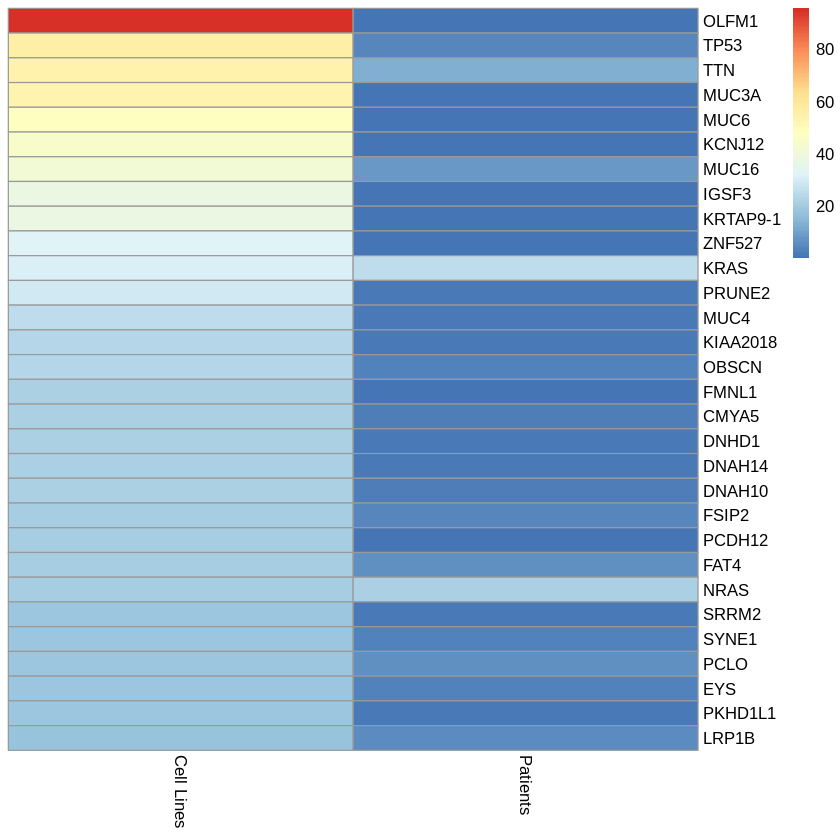

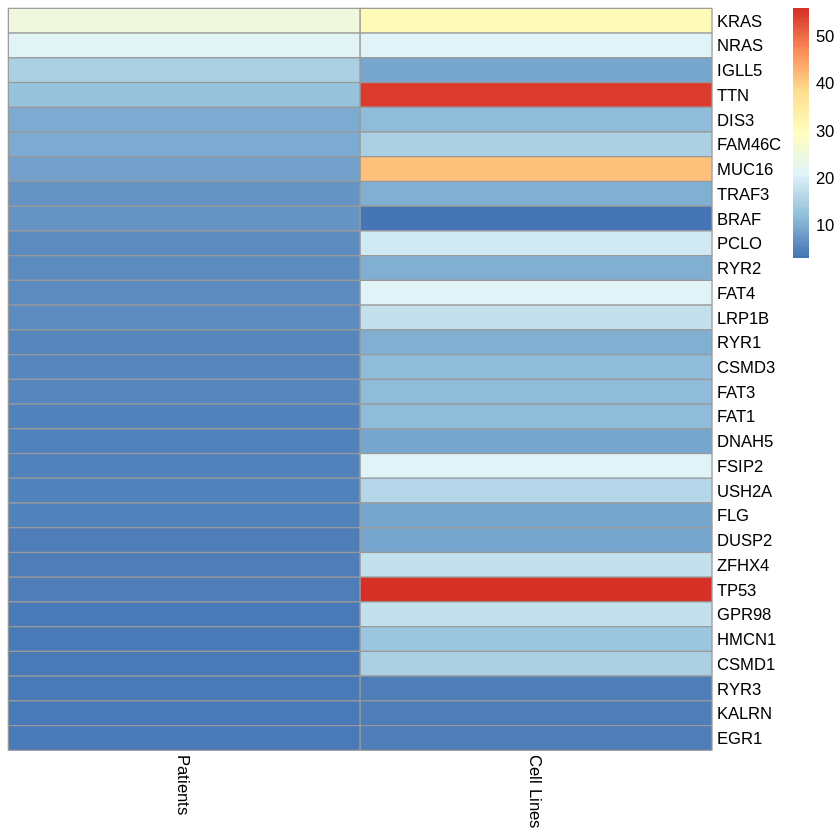

In [53]:
head(MM_pat_mut)
length(unique(MM_pat_mut$GENE))
mut2 = filter(MM_pat_mut, EFFECT %in% c("missense_variant",
                                         "frameshift_variant",
                                         "stop_gained",
                                         "start_lost",
                                         "stop_lost",
                                         "missense_variant&splice_region_variant",
                                         "frameshift_variant&splice_region_variant",
                                         "disruptive_inframe_deletion",
                                         "stop_gained&splice_region_variant",
                                         "frameshift_variant&stop_gained",
                                         "frameshift_variant&splice_acceptor_variant&splice_region_variant&intron_variant",
                                         "frameshift_variant&splice_donor_variant&splice_region_variant&intron_variant",
                                         "splice_donor_variant&disruptive_inframe_deletion&splice_region_variant&intron_variant",
                                         "stop_lost&splice_region_variant",
                                         "disruptive_inframe_insertion",
                                         "stop_gained&disruptive_inframe_deletion",
                                         "frameshift_variant&start_lost",
                                         "stop_gained&disruptive_inframe_insertion",
                                         "disruptive_inframe_deletion&splice_region_variant",
                                         "disruptive_inframe_insertion&splice_region_variant",
                                         "start_lost&splice_region_variant",
                                         "start_lost&inframe_deletion",
                                         "frameshift_variant&stop_lost",
                                         "splice_acceptor_variant&disruptive_inframe_deletion&splice_region_variant&intron_variant",
                                         "stop_lost&inframe_deletion")) %>%
   filter(str_extract(sample, "_[0-9]_") == "_1_")

length(unique(mut2$sample))
head(mut2)

length(unique(mut2$GENE))


length(unique(mut2$GENE))
length(colnames(norm_pat))
mut3 = as.data.frame(mut2$sample)
# #mut3$Effect = mut2$EFFECT
mut3$GENE = as.vector(mut2$GENE)
colnames(mut3) = c('sample', 'GENE')
# head(mut3)
# # test = 0
dftest = as.data.frame(matrix(0, ncol=15039, nrow=945))
colnames(dftest) = as.vector(unique(mut2$GENE))
rownames(dftest) = as.vector(unique(mut2$sample))
# # tail(dftest)
# # x = mut3[1,]
# # x$GENE
# m = as.data.frame(c())
# x = 's'
# y = 's'

# # test
# # length(mut3[,1])
# # tail(colnames(norm_pat))

for (row in 1:length(mut3[,1])){
    m = mut3[1,]
    mut3 = mut3[-1,]
    x = as.character(m[1,1])
    y = as.character(m[1,2])#as.character(x$sample)
#     z = x$GENE
    dftest[x, y] = dftest[x, y] + 1
}
head(dftest)

c_mean_exp_pat = colMeans(dftest)

c_mean_exp_pat_sorted = sort(c_mean_exp_pat, decreasing = TRUE)
c_mean_exp_pat_sorted[1:30]


mut3 = as.data.frame(mut2$sample)
# #mut3$Effect = mut2$EFFECT
mut3$GENE = as.vector(mut2$GENE)
colnames(mut3) = c('sample', 'GENE')
# head(mut3)
# # test = 0
dftest = as.data.frame(matrix(0, ncol=15039, nrow=945))
colnames(dftest) = as.vector(unique(mut2$GENE))
rownames(dftest) = as.vector(unique(mut2$sample))

for (row in 1:length(mut3[,1])){
    m = mut3[1,]
    mut3 = mut3[-1,]
    x = as.character(m[1,1])
    y = as.character(m[1,2])#as.character(x$sample)
#     z = x$GENE
    dftest[x, y] = 1
}
head(dftest)

c_n_mut_pat = colSums(dftest)
c_n_mut_pat_sorted = sort(c_n_mut_pat, decreasing = TRUE)
c_n_mut_pat_perc = (c_n_mut_pat_sorted/945)*100


c_n_mut_pat_perc[1:30]
length(c_n_mut_pat)


MM_cell_mut = data.frame(fread("HMCL69_Predicted_Mutations_Samtools (1).csv"))
head(MM_cell_mut)
unique(MM_cell_mut$SNPEFF_EFFECT)
unique(MM_cell_mut$SNPEFF_FUNCTIONAL_CLASS)
length(unique(MM_cell_mut$Sample))
length(unique(MM_cell_mut$SNPEFF_GENE_NAME))

dftest2 = as.data.frame(matrix(0, ncol=9004, nrow=68))
colnames(dftest2) = as.vector(unique(MM_cell_mut$SNPEFF_GENE_NAME))
rownames(dftest2) = as.vector(unique(MM_cell_mut$Sample))
# # tail(dftest)
for (row in 1:length(MM_cell_mut[,1])){
    m = MM_cell_mut[1,]
    MM_cell_mut = MM_cell_mut[-1,]
    x = as.character(m$Sample)
    y = as.character(m$SNPEFF_GENE_NAME)#as.character(x$sample)
#     z = x$GENE
    dftest2[x, y] = 1
}
head(dftest2)

c_n_mut_cell = colSums(dftest2)
c_n_mut_cell_sorted = sort(c_n_mut_cell, decreasing = TRUE)
c_n_mut_cell_perc = (c_n_mut_cell_sorted/68)*100
c_n_mut_cell_perc[1:30]
length(c_n_mut_cell)

head(names(c_n_mut_cell_perc))

cp_bool = names(c_n_mut_cell_perc) %in% names(c_n_mut_pat_perc)
pp_bool = names(c_n_mut_pat_perc) %in% names(c_n_mut_cell_perc)

cp = c_n_mut_cell_perc[cp_bool]
pp = c_n_mut_pat_perc[pp_bool]

topcp = cp[1:30]
topcp_pp = pp[names(cp[1:30])]

toppp = pp[1:30]
toppp_cp = cp[names(pp[1:30])]

topcp_bound = cbind(topcp, topcp_pp)
colnames(topcp_bound) = c('Cell Lines', 'Patients')
toppp_bound = cbind(toppp, toppp_cp)
colnames(toppp_bound) = c('Patients', 'Cell Lines')

head(topcp_bound)
head(toppp_bound)

options(repr.plot.height = 7, repr.plot.width = 7)

pheatmap(topcp_bound, cluster_rows = FALSE, cluster_cols = FALSE)
pheatmap(toppp_bound, cluster_rows = FALSE, cluster_cols = FALSE)

In [54]:
write.csv(topcp_bound, '~/Downloads/proj/topcp.csv')
write.csv(toppp_bound, '~/Downloads/proj/toppp.csv')

In [55]:
write.csv(names(cp), '~/Downloads/proj/genenames.csv')

[1] 51

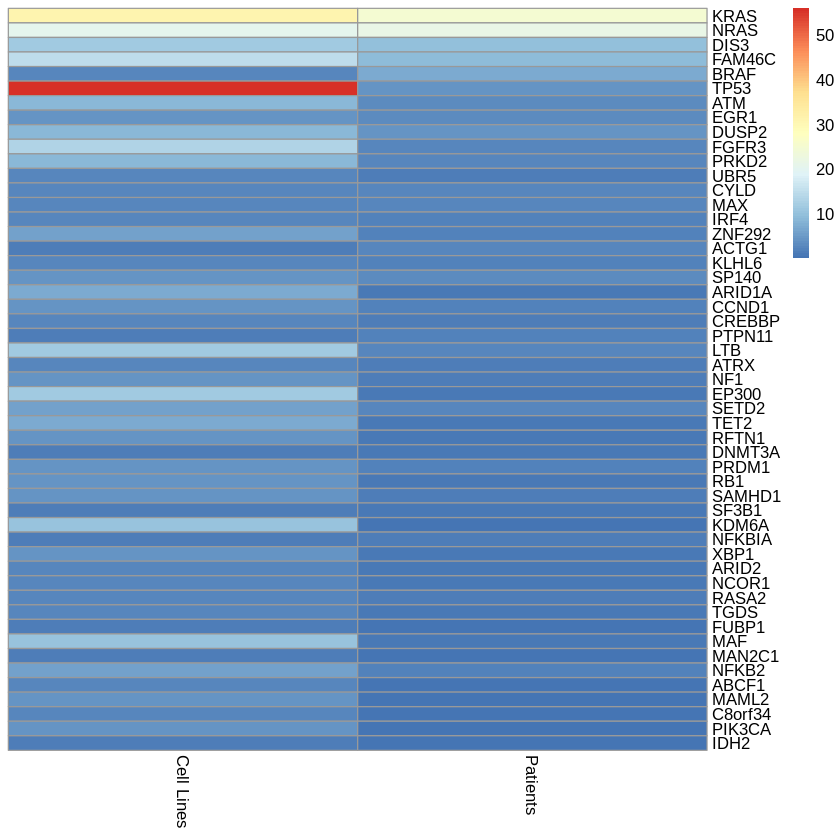

In [56]:
blood2018g = c('KRAS', 'NRAS', 'DIS3', 'FAM46C', 'BRAF', 'TP53',
              'ATM', 'EGR1', 'DUSP2', 'FGFR3', 'PRKD2', 'UBR5',
               'CYLD', 'MAX', 'IRF4', 'ZNF292', 'ACTG1', 
              'KLHL6', 'SP140', 'ARID1A', 'CCND1', 'CREBBP', 
              'PTPN11', 'LTB', 'ATRX', 'NF1', 'EP300', 'SETD2',
              'TET2', 'RFTN1', 'DNMT3A', 'PRDM1',
              'RB1', 'SAMHD1', 'SF3B1', 'KDM6A',
              'NFKBIA', 'XBP1', 'ARID2', 'NCOR1', 'RASA2',
              'TGDS', 'FUBP1', 'MAF', 'MAN2C1', 'NFKB2',
              'ABCF1', 'MAML2', 'C8orf34', 'PIK3CA', 'IDH2')

cpblood = cp[blood2018g]
ppblood = pp[blood2018g]

bloodbound = cbind(cpblood, ppblood)
colnames(bloodbound) = c('Cell Lines', 'Patients')

pheatmap(bloodbound, cluster_rows = FALSE, cluster_cols = FALSE)

length(blood2018g)

In [57]:
head(bloodbound)
write.csv(bloodbound, '~/Downloads/proj/blood.csv')

,Cell Lines,Patients
KRAS,30.882353,25.079365
NRAS,20.588235,21.375661
DIS3,11.764706,9.735450
FAM46C,14.705882,9.312169
BRAF,2.941176,6.984127
TP53,55.882353,4.126984


,KRAS,NRAS,DIS3,FAM46C,BRAF,TP53,ATM,EGR1,DUSP2,FGFR3,⋯,TGDS,FUBP1,MAF,MAN2C1,NFKB2,ABCF1,MAML2,C8orf34,PIK3CA,IDH2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MMRF_1016_1_BM,0,0,0,0,0,0,0,0,0,1,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1021_1_BM,1,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1029_1_BM,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1030_1_BM,1,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1031_1_BM,0,0,0,0,1,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1032_1_BM,1,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


[1] 68

,anot_r
,<fct>
MMRF_1016_1_BM,pat
MMRF_1021_1_BM,pat
MMRF_1029_1_BM,pat
MMRF_1030_1_BM,pat
MMRF_1031_1_BM,pat
MMRF_1032_1_BM,pat


,anot_r
,<fct>
UTMC2_p6,cell
VP6_DJ_p5,cell
XG1_p5,cell
XG2_p5,cell
XG6_p5,cell
XG7_p6,cell


[1] 1

[1] 1013

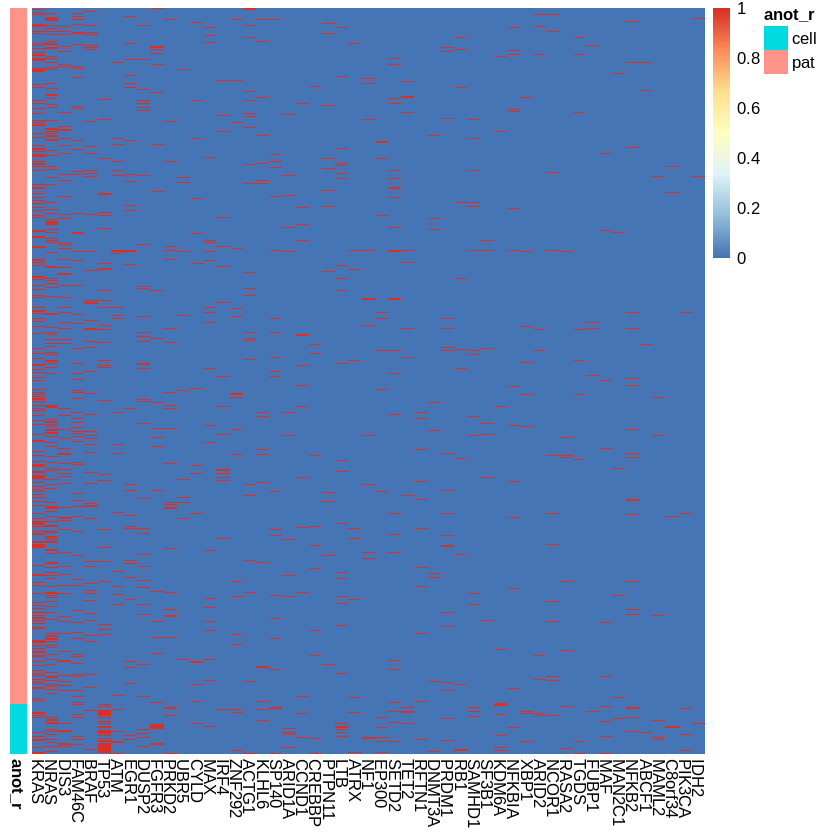

In [58]:
head(dftest[,rownames(bloodbound)])
length(dftest2[,1])

anot_pat = (rep('pat', length(dftest[,1])))

anot_cell = (rep('cell', length(dftest2[,1])))

anot_r = c(anot_pat, anot_cell)
anot_r = data.frame(anot_r)
rownames(anot_r) = rownames(((rbind(dftest[,rownames(bloodbound)], dftest2[,rownames(bloodbound)]))))


head(anot_r)
tail(anot_r)

length(anot_r)
length((rbind(dftest[,rownames(bloodbound)], dftest2[,rownames(bloodbound)]))[,1])

pheatmap((rbind(dftest[,rownames(bloodbound)], dftest2[,rownames(bloodbound)])), 
         annotation_row = anot_r, show_rownames = FALSE, cluster_rows = FALSE, cluster_cols = FALSE)

,OLFM1,TP53,TTN,MUC3A,MUC6,KCNJ12,MUC16,IGSF3,KRTAP9-1,ZNF527,⋯,FSIP2,PCDH12,FAT4,NRAS,SRRM2,SYNE1,PCLO,EYS,PKHD1L1,LRP1B
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MMRF_1016_1_BM,0,0,0,0,0,0,0,0,0,0,⋯,1,0,0,0,0,0,0,0,0,0
MMRF_1021_1_BM,0,0,1,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0
MMRF_1029_1_BM,0,0,0,0,0,0,1,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1030_1_BM,0,0,0,0,0,0,1,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1031_1_BM,0,0,0,0,0,0,1,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0
MMRF_1032_1_BM,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


[1] 68

,anot_r
,<fct>
MMRF_1016_1_BM,pat
MMRF_1021_1_BM,pat
MMRF_1029_1_BM,pat
MMRF_1030_1_BM,pat
MMRF_1031_1_BM,pat
MMRF_1032_1_BM,pat


,anot_r
,<fct>
UTMC2_p6,cell
VP6_DJ_p5,cell
XG1_p5,cell
XG2_p5,cell
XG6_p5,cell
XG7_p6,cell


[1] 1

[1] 1013

,KRAS,NRAS,IGLL5,TTN,DIS3,FAM46C,MUC16,TRAF3,BRAF,PCLO,⋯,FLG,DUSP2,ZFHX4,TP53,GPR98,HMCN1,CSMD1,RYR3,KALRN,EGR1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MMRF_1016_1_BM,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1021_1_BM,1,0,1,1,0,0,0,0,0,1,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1029_1_BM,0,0,0,0,0,0,1,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1030_1_BM,1,0,0,0,0,0,1,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0
MMRF_1031_1_BM,0,0,0,0,0,0,1,0,1,1,⋯,0,0,0,0,0,0,0,0,0,0
MMRF_1032_1_BM,1,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


[1] 68

,anot_r
,<fct>
MMRF_1016_1_BM,pat
MMRF_1021_1_BM,pat
MMRF_1029_1_BM,pat
MMRF_1030_1_BM,pat
MMRF_1031_1_BM,pat
MMRF_1032_1_BM,pat


,anot_r
,<fct>
UTMC2_p6,cell
VP6_DJ_p5,cell
XG1_p5,cell
XG2_p5,cell
XG6_p5,cell
XG7_p6,cell


[1] 1

[1] 1013

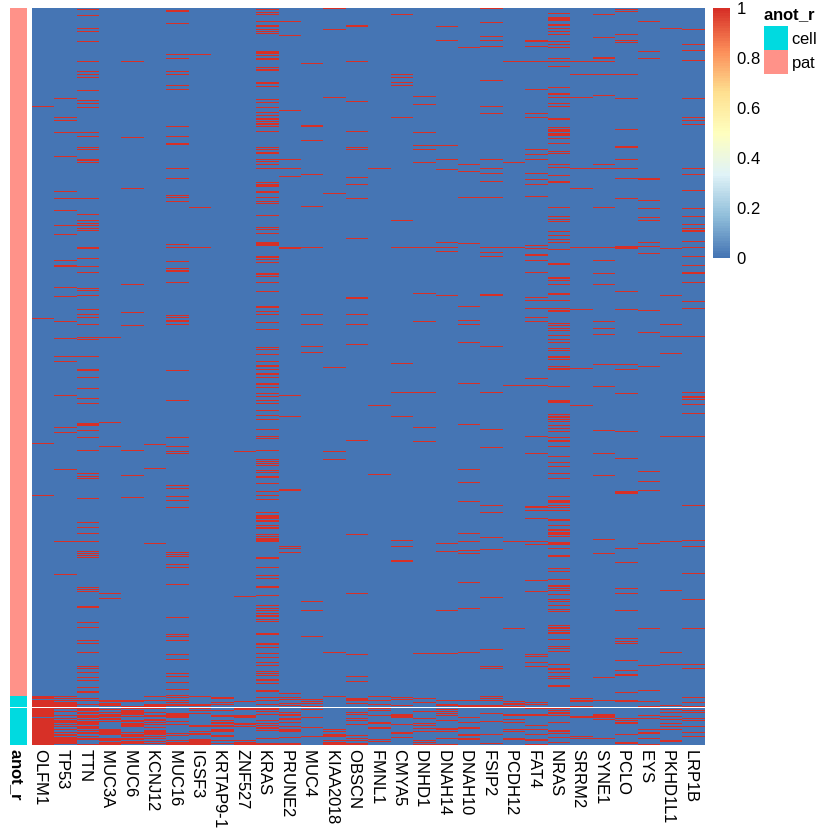

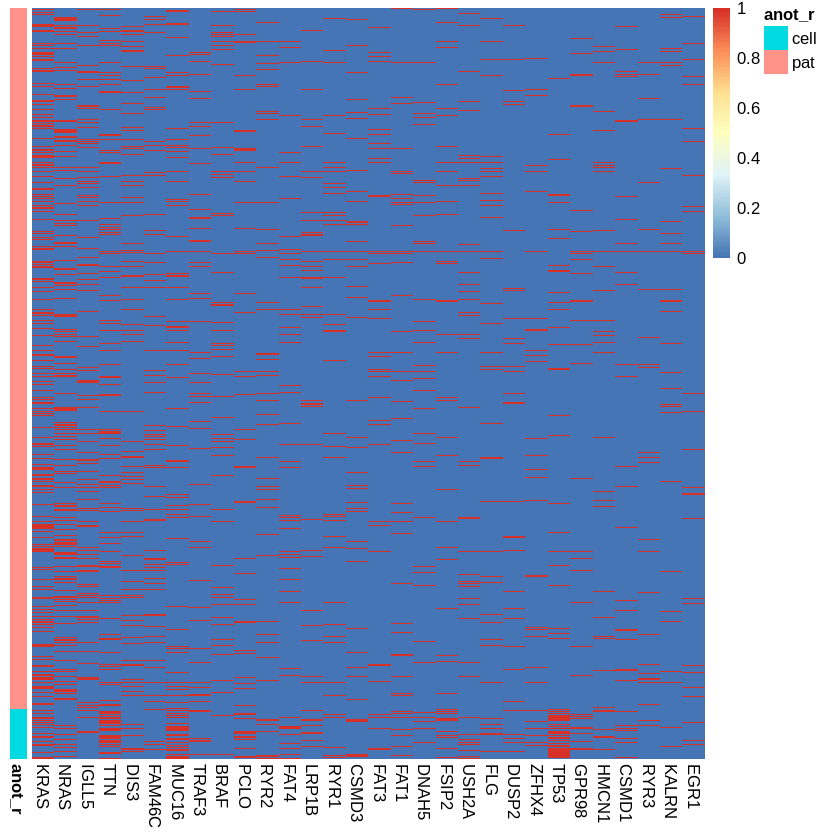

In [59]:
head(dftest[,rownames(topcp_bound)])
length(dftest2[,1])

anot_pat = (rep('pat', length(dftest[,1])))

anot_cell = (rep('cell', length(dftest2[,1])))

anot_r = c(anot_pat, anot_cell)
anot_r = data.frame(anot_r)
rownames(anot_r) = rownames(((rbind(dftest[,rownames(topcp_bound)], dftest2[,rownames(topcp_bound)]))))


head(anot_r)
tail(anot_r)

length(anot_r)
length((rbind(dftest[,rownames(topcp_bound)], dftest2[,rownames(topcp_bound)]))[,1])

pheatmap((rbind(dftest[,rownames(topcp_bound)], dftest2[,rownames(topcp_bound)])), 
         annotation_row = anot_r, show_rownames = FALSE, cluster_rows = FALSE, cluster_cols = FALSE)



head(dftest[,rownames(toppp_bound)])
length(dftest2[,1])

anot_pat = (rep('pat', length(dftest[,1])))

anot_cell = (rep('cell', length(dftest2[,1])))

anot_r = c(anot_pat, anot_cell)
anot_r = data.frame(anot_r)
rownames(anot_r) = rownames(((rbind(dftest[,rownames(toppp_bound)], dftest2[,rownames(toppp_bound)]))))


head(anot_r)
tail(anot_r)

length(anot_r)
length((rbind(dftest[,rownames(toppp_bound)], dftest2[,rownames(toppp_bound)]))[,1])

pheatmap((rbind(dftest[,rownames(toppp_bound)], dftest2[,rownames(toppp_bound)])), 
         annotation_row = anot_r, show_rownames = FALSE, cluster_rows = FALSE, cluster_cols = FALSE)

In [60]:
sum(is.na(dftest2[,rownames(toppp_bound)]))

[1] 0

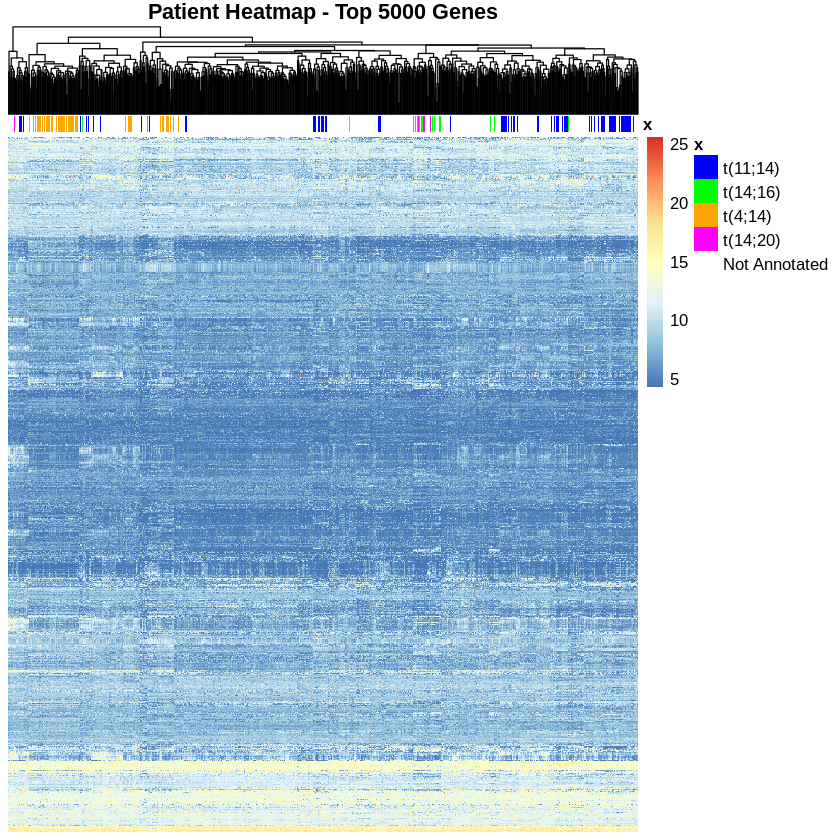

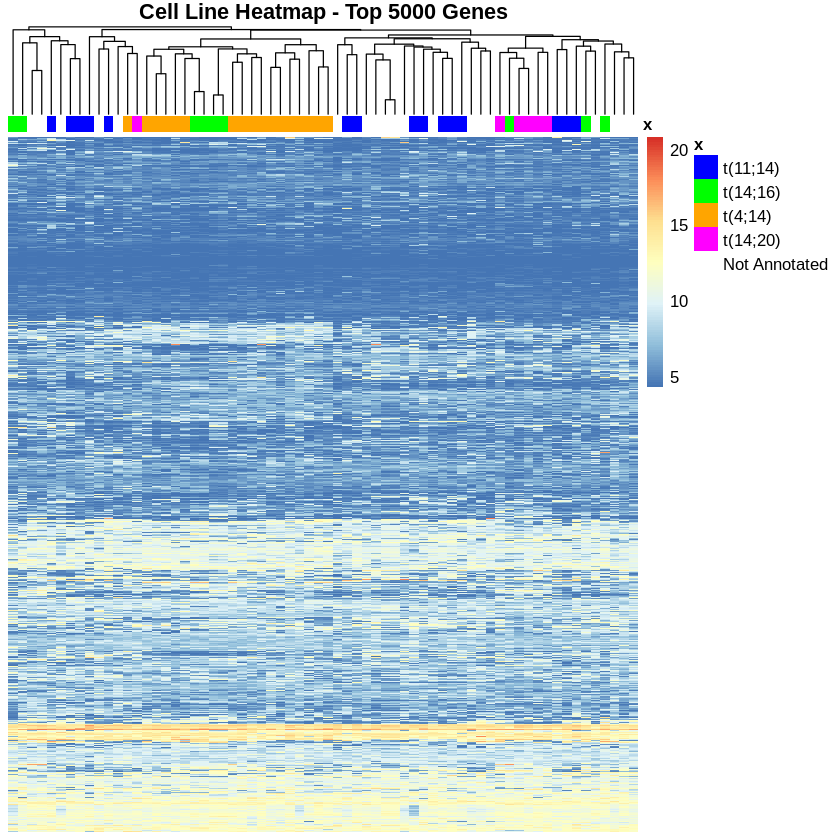

In [61]:
# making patient annotations for heatmap

x = c()

pat_names = colnames(norm_pat)

for(pat in pat_names){
    if (pat %in% colnames(norm_pat_1114)){
        x = append(x, 't(11;14)')
    }
    else if (pat %in% colnames(norm_pat_1416)){
        x = append(x, 't(14;16)')
    }
    else if (pat %in% colnames(norm_pat_414)){
        x = append(x, 't(4;14)')
    }
    else if (pat %in% colnames(norm_pat_1420)){
        x = append(x, 't(14;20)')
    }
    else{
        x = append(x, 'Not Annotated')
    }
}

x = as.data.frame(x)
rownames(x) = colnames(norm_pat)
x1 = c("blue", "green", "orange", "magenta", "white")
names(x1) = c("t(11;14)", "t(14;16)", "t(4;14)", "t(14;20)", "Not Annotated")
anoc = list(x = x1)
# subsetting top 5000 / 10000 ggenes for patient heatmap

norm_pat_hm_5000 = norm_pat[keepi5000,] 
# norm_pat_hm_10000 = norm_pat[keepi10000,] 

# generating heatmaps

pheatmap(norm_pat_hm_5000, annotation_col = x, annotation_colors = anoc, treeheight_row = 0,
         show_rownames = FALSE, show_colnames = FALSE, main = 'Patient Heatmap - Top 5000 Genes')
# pheatmap(norm_pat_hm_10000, annotation_col = x, show_rownames = FALSE, show_colnames = FALSE, main = 'Patient Heatmap - Top 10000 Genes')



cell_names = colnames(MM_cell_line)

x = c()
y = list()

for(cell in cell_names){
    if (cell %in% cell_names_1114){
        x = append(x, 't(11;14)')
        y = append(y, 2)
    }
    else if (cell %in% cell_names_1416){
        x = append(x, 't(14;16)')
        y = append(y, 3)
    }
    else if (cell %in% cell_names_414){
        x = append(x, 't(4;14)')
        y = append(y, 4)
    }
    else if (cell %in% cell_names_1420){
        x = append(x, 't(14;20)')
        y = append(y, 5)
    }
    else{
        x = append(x, 'Not Annotated')
        y = append(y, 0)
    }
}
# rownames(y) = rownames(x)
# x = c('none', 'none', 'none', 't(14;16)', 'none', 'none', 'none', 'none', 
#       't(11;14)', 'none', 't(11;14)', 't(11;14)', 't(4;14)', 't(4;14)', 't(14;16)', 'none',
#      't(4;14)', 'none', 'none', 't(11;14)', 'none', 'none', 't(4;14)', 't(4;14)', 'none', 'none',
#      't(4;14)', 't(4;14)', 't(11;14)', 't(11;14)', 't(4;14)', 'none', 't(11;14)', 't(4;14)', 't(11;14)',
#      't(4;14)', 't(4;14)', 't(4;14)', 'none', 'none', 't(4;14)', 't(14;16)', 't(14;16)', 't(11;14)', 'none', 
#       't(11;14)', 't(4;14)', 'none', 't(14;16)', 't(11;14)', 'none', 't(4;14)', 't(4;14)', 't(14;16)',
#      't(11;14)', 't(4;14)', 'none', 'none', 't(11;14)', 't(11;14)', 't(4;14)', 't(14;16)', 't(11;14)', 'none', 
#      'none', 't(4;14)')

x = as.data.frame(x)
rownames(x) = colnames(MM_cell_line)
# y = as.data.frame(y)
names(y) = rownames(x)
anc = !(x[,1] %in% 'Not Annotated')

# subsetting top 5000 / 10000 ggenes for patient heatmap

norm_cells_hm_5000 = norm_cell[keepi5000,]
# norm_cells_hm_10000 = norm_cell[keepi10000,]

# generating heatmaps

# ann_colors = list(
#     Time = c("white", "firebrick"),
#     CellType = c(CT1 = "#1B9E77", CT2 = "#D95F02"),
#     GeneClass = c(Path1 = "#7570B3", Path2 = "#E7298A", Path3 = "#66A61E")
# )

pheatmap(norm_cells_hm_5000, annotation_col = x, annotation_colors = anoc, treeheight_row = 0,
         show_rownames = FALSE, show_colnames = FALSE, main = 'Cell Line Heatmap - Top 5000 Genes')#,
#         annotation_colors = x)
# pheatmap(norm_cells_hm_10000, annotation_col = x, show_rownames = FALSE, show_colnames = FALSE, main = 'Cell Line Heatmap - Top 10000 Genes')

In [56]:
library(CMScaller)

In [57]:
subtype.info = data.frame(fread("2020-sup-tables2 (2).csv"))
colnames(subtype.info) = c("probeset", "gene_name", "chrom_map_pos", "SAM.score", "Subgroup", "adj")
head(subtype.info)
length((subtype.info[,2]))
length(unique(subtype.info[,2]))
keep_stinf = subtype.info$adj %in% "noid"
keep_stinf = !keep_stinf
sum(keep_stinf)
subtype.info = subtype.info[keep_stinf,]
length((subtype.info[,2]))
length(unique(subtype.info[,2]))
symbols = (subtype.info[,2])
test_df = as.data.frame(as.matrix(mapIds(org.Hs.eg.db, symbols, 'ENSEMBL', 'SYMBOL')))
# print(test_df)
subtype.info$gene_id = test_df[,1]
head(subtype.info)

MM_patients3 = data.frame(fread("MMRF_CoMMpass_IA13a_E74GTF_HtSeq_Gene_Counts.txt"))
rownames(MM_patients3) = MM_patients3$GENE_ID
MM_patients3 = MM_patients3[,-1]
head(MM_patients3)
keepinpat =  subtype.info$gene_id %in% rownames(MM_patients3)
subtype.info = subtype.info[keepinpat,]
length(subtype.info[,1])

templates = subtype.info[, c("gene_id", "Subgroup")]
colnames(templates) = c("probe", "class")
head(templates)
templates$class = as.factor(templates$class)
head(templates)

emat <- ematAdjust(MM_patients3, normMethod = "quantile")

probeset,gene_name,chrom_map_pos,SAM.score,Subgroup,adj,NA,NA
<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>
206640_x_at,GAGE2A,Xp11.23,8.18,PR,https://www.genecards.org/cgi-bin/carddisp.pl?gene=GAGE2A,,
202503_s_at,PCLAF,15q22.31,7.84,PR,https://www.genecards.org/cgi-bin/carddisp.pl?gene=PCLAF,,
202705_at,CCNB2,15q22.2,7.79,PR,none,,
208235_x_at,XAGE5,Xp11.4-p11.2,7.78,PR,http://asia.ensembl.org/Homo_sapiens/Search/Results?q=gage5,site=ensembl,facet_species=Human
202589_at,TYMS,18p11.32,7.40,PR,none,,
213008_at,FANCI,15q25-q26,7.39,PR,http://www.abnova.com/products/products_detail.asp?catalog_id=H00055215-P01,,


[1] 350

[1] 345

[1] 339

[1] 339

[1] 334

'select()' returned 1:many mapping between keys and columns


probeset,gene_name,chrom_map_pos,SAM.score,Subgroup,adj,NA,NA,gene_id
<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<fct>
206640_x_at,GAGE2A,Xp11.23,8.18,PR,https://www.genecards.org/cgi-bin/carddisp.pl?gene=GAGE2A,,,ENSG00000189064
202503_s_at,PCLAF,15q22.31,7.84,PR,https://www.genecards.org/cgi-bin/carddisp.pl?gene=PCLAF,,,ENSG00000166803
202705_at,CCNB2,15q22.2,7.79,PR,none,,,ENSG00000157456
208235_x_at,XAGE5,Xp11.4-p11.2,7.78,PR,http://asia.ensembl.org/Homo_sapiens/Search/Results?q=gage5,site=ensembl,facet_species=Human,ENSG00000171405
202589_at,TYMS,18p11.32,7.40,PR,none,,,ENSG00000176890
213008_at,FANCI,15q25-q26,7.39,PR,http://www.abnova.com/products/products_detail.asp?catalog_id=H00055215-P01,,,ENSG00000140525


,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2531_2_PB,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2089_2_BM,MMRF_2341_1_BM,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,17,999,85,9,801,20,12,16,4,43,⋯,2,186,102,347,128,17,11,3,18,6
ENSG00000000005,1,0,0,2,3,0,0,0,0,1,⋯,0,0,0,0,0,0,1,0,0,0
ENSG00000000419,1495,3271,2303,1234,1896,4400,2013,1745,1698,2403,⋯,2459,1269,337,3347,1049,2545,1625,1253,1905,683
ENSG00000000457,231,809,203,1208,425,2793,710,922,853,1203,⋯,734,771,327,392,90,406,857,548,808,393
ENSG00000000460,87,319,31,183,85,929,174,292,837,478,⋯,267,104,114,126,17,67,196,141,199,55
ENSG00000000938,318,105,119,190,2064,2952,12,351,498,555,⋯,46,14,303,2007,58,77,1037,11,174,22


[1] 336

probe,class
<fct>,<chr>
ENSG00000189064,PR
ENSG00000166803,PR
ENSG00000157456,PR
ENSG00000171405,PR
ENSG00000176890,PR
ENSG00000140525,PR


probe,class
<fct>,<fct>
ENSG00000189064,PR
ENSG00000166803,PR
ENSG00000157456,PR
ENSG00000171405,PR
ENSG00000176890,PR
ENSG00000140525,PR


In [58]:
head(emat)

,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2531_2_PB,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2089_2_BM,MMRF_2341_1_BM,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ENSG00000000003,-0.5034428,1.14822158,0.3905395,-0.6413293,1.2484609,-0.6956060,-0.4292927,-0.7303004,-1.09274283,-0.3099536,⋯,-1.3456373,0.6710997,0.3891932,0.9308734,0.78118740,-0.23182062,-0.8158151,-0.99170309,-0.51002479,-0.59135933
ENSG00000000005,1.0147775,-0.38015191,-0.3801519,2.8031932,2.5175375,-0.3801519,-0.3801519,-0.3801519,-0.38015191,0.6129453,⋯,-0.3801519,-0.3801519,-0.3801519,-0.3801519,-0.38015191,-0.38015191,0.4579366,-0.38015191,-0.38015191,-0.38015191
ENSG00000000419,0.1900955,0.64742854,1.6038062,-0.7485066,0.2082317,0.5179854,1.2426775,-0.2925516,-0.73646646,-0.6336518,⋯,0.7044936,-0.8936242,-4.2596791,2.3159063,0.46455438,1.97897783,-0.9234317,-0.37013588,-0.04842869,-0.08583747
ENSG00000000457,-2.2492782,-0.74178217,-2.0554042,1.6275031,-1.3108550,1.5305867,0.7235060,0.2510157,-0.01550718,-0.1429012,⋯,-0.2342664,0.3067628,-1.4816185,-1.1382169,-3.36476198,-0.92029619,-0.1869356,-0.13123242,0.13967138,0.82740797
ENSG00000000460,-0.9866237,0.03789052,-2.2470334,0.1313732,-1.4389725,1.1644884,0.4808772,0.1176022,1.90921586,0.4556302,⋯,0.4636519,-0.4419535,-0.4755841,-0.5554881,-2.61935699,-0.91616205,-0.3682853,0.07315148,0.03224686,-0.53895136
ENSG00000000938,0.7791262,-0.43427775,0.2709861,0.3595398,1.6970900,1.4602103,-1.0726750,0.4670561,0.78456054,0.5665474,⋯,-0.4755289,-1.0183725,0.7018867,1.7882717,0.03959092,-0.01929665,1.1545517,-1.08110557,0.21797933,-0.49965369


In [59]:
ntp.res = ntp(emat, templates, nPerm = 1000, distance = "cosine", 
              nCores = 4, seed = 1, verbose = getOption("verbose"), doPlot = F)

Warning message:
"templates$probe coerced to character"

In [60]:
head(ntp.res)

,prediction,d.CD-1,d.CD-2,d.HP,d.LB,d.MF,d.MS,d.PR,p.value,FDR
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MMRF_2801_1_BM,CD-2,0.6908262,0.5465200,0.7634567,0.6783510,0.7221140,0.7225645,0.7186211,0.001,0.001205405
MMRF_2718_1_BM,CD-2,0.7516948,0.5149323,0.7660811,0.7409702,0.7065890,0.6712318,0.7927205,0.001,0.001205405
MMRF_2815_1_BM,MS,0.6811238,0.6985847,0.7810429,0.7164296,0.7242870,0.5092856,0.8406275,0.001,0.001205405
MMRF_1656_1_BM,HP,0.7239950,0.7614657,0.5839229,0.7856753,0.7002590,0.6800525,0.6654461,0.001,0.001205405
MMRF_2461_1_BM,LB,0.7030658,0.7040357,0.7456526,0.6032435,0.6650468,0.7134938,0.8352665,0.001,0.001205405
MMRF_2531_2_PB,MS,0.5837003,0.7666039,0.7684238,0.6939097,0.6914182,0.5650803,0.5784883,0.001,0.001205405


In [61]:
head(ntp.res[order(ntp.res$prediction),])
emat.sorted.pred = (emat[,rownames(ntp.res[order(ntp.res$prediction),])])
head(norm_pat_hm_5000)
head(emat.sorted.pred)

,prediction,d.CD-1,d.CD-2,d.HP,d.LB,d.MF,d.MS,d.PR,p.value,FDR
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MMRF_1439_1_BM,CD-1,0.5936177,0.6819478,0.7414851,0.7864426,0.7470616,0.7570321,0.6663106,0.0010000,0.001205405
MMRF_1261_1_BM,CD-1,0.6851063,0.6968995,0.7893956,0.7158976,0.7665236,0.7773306,0.7120502,0.9090909,0.911133810
MMRF_1915_1_BM,CD-1,0.4242888,0.7337747,0.7000353,0.7636292,0.7164736,0.7299294,0.7510154,0.0010000,0.001205405
MMRF_1912_1_PB,CD-1,0.4970347,0.7495477,0.7944594,0.6862560,0.6088790,0.7015426,0.7028304,0.0010000,0.001205405
MMRF_1311_1_BM,CD-1,0.5960619,0.6079501,0.7627430,0.7493815,0.7574657,0.7609251,0.7495419,0.0010000,0.001205405
MMRF_1927_1_PB,CD-1,0.5910088,0.6674134,0.7810698,0.7599611,0.6991109,0.7360431,0.8091770,0.0010000,0.001205405


,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2531_2_PB,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2089_2_BM,MMRF_2341_1_BM,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ENSG00000000003,5.763143,9.537185,7.395753,5.308595,9.830803,5.274120,5.550078,5.500219,4.872554,5.880590,⋯,4.724323,7.872087,7.279442,8.892504,8.268661,5.786579,5.238299,4.906192,5.573125,5.539938
ENSG00000000460,7.240012,8.035522,6.362907,7.950493,7.004830,8.922297,8.080643,8.263642,9.527754,8.376546,⋯,8.168128,7.194023,7.405635,7.612022,6.115524,6.992802,7.613518,7.733282,7.793913,7.505658
ENSG00000000938,8.838641,6.773748,7.792299,7.996890,11.158836,10.511120,5.550078,8.499929,8.827716,8.569701,⋯,6.266877,5.502307,8.612095,11.326184,7.314219,7.142771,9.780425,5.457562,7.633019,6.535104
ENSG00000000971,8.954700,9.660588,9.272141,7.626551,8.452307,12.823135,5.732564,8.006766,9.272567,5.736415,⋯,5.392960,5.023380,6.038515,7.534880,6.621261,5.826595,10.599142,11.058560,6.433822,5.876621
ENSG00000001561,6.735481,9.058747,11.109926,10.226422,11.425949,10.829653,11.196998,10.521174,9.730328,10.225806,⋯,12.204722,9.798182,7.611145,10.935838,8.829046,10.531100,10.341254,10.757729,10.380698,10.913626
ENSG00000002586,12.092732,11.470504,9.508805,6.080540,9.100283,12.402861,5.889026,10.882736,5.741471,11.143600,⋯,6.041618,6.413483,7.000104,9.279818,8.572020,14.222973,7.211198,6.001932,6.240530,8.344365


,MMRF_1439_1_BM,MMRF_1261_1_BM,MMRF_1915_1_BM,MMRF_1912_1_PB,MMRF_1311_1_BM,MMRF_1927_1_PB,MMRF_2572_1_BM,MMRF_2478_1_BM,MMRF_1777_1_BM,MMRF_1540_1_BM,⋯,MMRF_1932_1_BM,MMRF_2195_1_BM,MMRF_1720_1_BM,MMRF_2268_1_BM,MMRF_2490_1_BM,MMRF_2272_1_BM,MMRF_2488_1_BM,MMRF_1876_1_BM,MMRF_2613_2_BM,MMRF_1274_1_BM
ENSG00000000003,-1.2156488,-0.9989080,-1.3608057,-2.3147800,-0.80168639,-2.3147800,-1.3143198,0.13781327,0.3003799,-0.4972654,⋯,0.4722824,-0.62264830,-0.2822935,0.8105194,-2.3147800,0.2425854,-2.31478001,0.88357849,0.4925591,-0.55834127
ENSG00000000005,-0.3801519,-0.3801519,-0.3801519,-0.3801519,-0.38015191,-0.3801519,-0.3801519,-0.38015191,-0.3801519,-0.3801519,⋯,-0.3801519,-0.38015191,-0.3801519,5.9997432,-0.3801519,-0.3801519,-0.38015191,-0.38015191,3.8607325,-0.38015191
ENSG00000000419,1.2450553,-1.1397351,1.3159738,0.9996856,-0.32758584,-0.1677141,0.3300209,1.01346358,0.9200341,0.7600687,⋯,-2.5573467,-0.51237428,-0.3023535,1.0241956,0.6274732,0.0478648,-0.05858697,0.16232403,-0.3250782,-0.64250606
ENSG00000000457,0.6344137,0.7429179,-1.4998771,0.6860753,0.24537526,0.2170222,-0.9778926,-0.41386051,-0.2066534,0.2514468,⋯,0.3492114,-0.09852521,-0.1765833,-1.6680847,2.1895445,0.3861700,0.52175108,0.43400289,-0.3666911,0.74179536
ENSG00000000460,1.2115963,0.5860784,-0.2431745,0.1278346,0.11341531,-0.1556981,-1.8641225,0.04450442,-1.0642464,0.7459996,⋯,0.8091261,0.24866334,0.3804302,0.1871664,1.8860406,1.1597980,-0.07117233,-0.07343737,-0.3210750,0.13200124
ENSG00000000938,-0.2549232,-0.9191035,-0.7038565,1.1551052,0.07233446,1.0596760,-0.5685713,1.23872278,0.2688481,-0.8615615,⋯,0.1322705,1.58700302,-0.5954748,2.9393756,-0.4873965,0.9040851,1.83118141,-0.54548481,2.1873636,0.02835018


In [62]:
x = c()

pat_names = colnames(emat.sorted.pred)

for(pat in pat_names){
    if (pat %in% colnames(norm_pat_1114)){
        x = append(x, 't(11;14)')
    }
    else if (pat %in% colnames(norm_pat_1416)){
        x = append(x, 't(14;16)')
    }
    else if (pat %in% colnames(norm_pat_414)){
        x = append(x, 't(4;14)')
    }
    else if (pat %in% colnames(norm_pat_1420)){
        x = append(x, 't(14;20)')
    }
    else{
        x = append(x, 'Not Annotated')
    }
}

x = as.data.frame(x)
rownames(x) = colnames(emat.sorted.pred)
x1 = c("blue", "green", "orange", "magenta", "white")
names(x1) = c("t(11;14)", "t(14;16)", "t(4;14)", "t(14;20)", "Not Annotated")
pred1 = c("blue", "green", "orange", "magenta", "yellow", "cyan", "olivedrab3")
names(pred1) = c("CD-1", "MF", "MS", "HP", "LB", "CD-2", "PR")
temp1 = c("blue", "green", "orange", "magenta", "yellow", "cyan", "olivedrab3")
names(temp1) = c("CD-1", "MF", "MS", "HP", "LB", "CD-2", "PR")
anoc = list(x = x1, prediction = pred1, templates = temp1)

head(x)

# pheatmap(norm_pat_hm_5000, annotation_col = x, annotation_colors = anoc, treeheight_row = 0,
#          show_rownames = FALSE, show_colnames = FALSE, main = 'Patient Heatmap - Top 5000 Genes')

,x
,<fct>
MMRF_1439_1_BM,t(11;14)
MMRF_1261_1_BM,t(11;14)
MMRF_1915_1_BM,t(11;14)
MMRF_1912_1_PB,t(14;16)
MMRF_1311_1_BM,Not Annotated
MMRF_1927_1_PB,Not Annotated


In [63]:
head(emat.sorted.pred)
ntp.res.sorted = (ntp.res[order(ntp.res$prediction),])
head(ntp.res.sorted)
x$prediction = ntp.res.sorted$prediction
head(x)

,MMRF_1439_1_BM,MMRF_1261_1_BM,MMRF_1915_1_BM,MMRF_1912_1_PB,MMRF_1311_1_BM,MMRF_1927_1_PB,MMRF_2572_1_BM,MMRF_2478_1_BM,MMRF_1777_1_BM,MMRF_1540_1_BM,⋯,MMRF_1932_1_BM,MMRF_2195_1_BM,MMRF_1720_1_BM,MMRF_2268_1_BM,MMRF_2490_1_BM,MMRF_2272_1_BM,MMRF_2488_1_BM,MMRF_1876_1_BM,MMRF_2613_2_BM,MMRF_1274_1_BM
ENSG00000000003,-1.2156488,-0.9989080,-1.3608057,-2.3147800,-0.80168639,-2.3147800,-1.3143198,0.13781327,0.3003799,-0.4972654,⋯,0.4722824,-0.62264830,-0.2822935,0.8105194,-2.3147800,0.2425854,-2.31478001,0.88357849,0.4925591,-0.55834127
ENSG00000000005,-0.3801519,-0.3801519,-0.3801519,-0.3801519,-0.38015191,-0.3801519,-0.3801519,-0.38015191,-0.3801519,-0.3801519,⋯,-0.3801519,-0.38015191,-0.3801519,5.9997432,-0.3801519,-0.3801519,-0.38015191,-0.38015191,3.8607325,-0.38015191
ENSG00000000419,1.2450553,-1.1397351,1.3159738,0.9996856,-0.32758584,-0.1677141,0.3300209,1.01346358,0.9200341,0.7600687,⋯,-2.5573467,-0.51237428,-0.3023535,1.0241956,0.6274732,0.0478648,-0.05858697,0.16232403,-0.3250782,-0.64250606
ENSG00000000457,0.6344137,0.7429179,-1.4998771,0.6860753,0.24537526,0.2170222,-0.9778926,-0.41386051,-0.2066534,0.2514468,⋯,0.3492114,-0.09852521,-0.1765833,-1.6680847,2.1895445,0.3861700,0.52175108,0.43400289,-0.3666911,0.74179536
ENSG00000000460,1.2115963,0.5860784,-0.2431745,0.1278346,0.11341531,-0.1556981,-1.8641225,0.04450442,-1.0642464,0.7459996,⋯,0.8091261,0.24866334,0.3804302,0.1871664,1.8860406,1.1597980,-0.07117233,-0.07343737,-0.3210750,0.13200124
ENSG00000000938,-0.2549232,-0.9191035,-0.7038565,1.1551052,0.07233446,1.0596760,-0.5685713,1.23872278,0.2688481,-0.8615615,⋯,0.1322705,1.58700302,-0.5954748,2.9393756,-0.4873965,0.9040851,1.83118141,-0.54548481,2.1873636,0.02835018


,prediction,d.CD-1,d.CD-2,d.HP,d.LB,d.MF,d.MS,d.PR,p.value,FDR
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MMRF_1439_1_BM,CD-1,0.5936177,0.6819478,0.7414851,0.7864426,0.7470616,0.7570321,0.6663106,0.0010000,0.001205405
MMRF_1261_1_BM,CD-1,0.6851063,0.6968995,0.7893956,0.7158976,0.7665236,0.7773306,0.7120502,0.9090909,0.911133810
MMRF_1915_1_BM,CD-1,0.4242888,0.7337747,0.7000353,0.7636292,0.7164736,0.7299294,0.7510154,0.0010000,0.001205405
MMRF_1912_1_PB,CD-1,0.4970347,0.7495477,0.7944594,0.6862560,0.6088790,0.7015426,0.7028304,0.0010000,0.001205405
MMRF_1311_1_BM,CD-1,0.5960619,0.6079501,0.7627430,0.7493815,0.7574657,0.7609251,0.7495419,0.0010000,0.001205405
MMRF_1927_1_PB,CD-1,0.5910088,0.6674134,0.7810698,0.7599611,0.6991109,0.7360431,0.8091770,0.0010000,0.001205405


,x,prediction
,<fct>,<fct>
MMRF_1439_1_BM,t(11;14),CD-1
MMRF_1261_1_BM,t(11;14),CD-1
MMRF_1915_1_BM,t(11;14),CD-1
MMRF_1912_1_PB,t(14;16),CD-1
MMRF_1311_1_BM,Not Annotated,CD-1
MMRF_1927_1_PB,Not Annotated,CD-1


In [64]:
tt = (c(1:30))
tt2 = c(1:length(tt))
head(tt2)
tail(tt2)

[1] 1 2 3 4 5 6

[1] 25 26 27 28 29 30

In [65]:
head(emat.sorted.pred)
ntp.res.sorted = (ntp.res[order(ntp.res$prediction),])
head(ntp.res.sorted)
x$prediction = ntp.res.sorted$prediction
head(x)

,MMRF_1439_1_BM,MMRF_1261_1_BM,MMRF_1915_1_BM,MMRF_1912_1_PB,MMRF_1311_1_BM,MMRF_1927_1_PB,MMRF_2572_1_BM,MMRF_2478_1_BM,MMRF_1777_1_BM,MMRF_1540_1_BM,⋯,MMRF_1932_1_BM,MMRF_2195_1_BM,MMRF_1720_1_BM,MMRF_2268_1_BM,MMRF_2490_1_BM,MMRF_2272_1_BM,MMRF_2488_1_BM,MMRF_1876_1_BM,MMRF_2613_2_BM,MMRF_1274_1_BM
ENSG00000000003,-1.2156488,-0.9989080,-1.3608057,-2.3147800,-0.80168639,-2.3147800,-1.3143198,0.13781327,0.3003799,-0.4972654,⋯,0.4722824,-0.62264830,-0.2822935,0.8105194,-2.3147800,0.2425854,-2.31478001,0.88357849,0.4925591,-0.55834127
ENSG00000000005,-0.3801519,-0.3801519,-0.3801519,-0.3801519,-0.38015191,-0.3801519,-0.3801519,-0.38015191,-0.3801519,-0.3801519,⋯,-0.3801519,-0.38015191,-0.3801519,5.9997432,-0.3801519,-0.3801519,-0.38015191,-0.38015191,3.8607325,-0.38015191
ENSG00000000419,1.2450553,-1.1397351,1.3159738,0.9996856,-0.32758584,-0.1677141,0.3300209,1.01346358,0.9200341,0.7600687,⋯,-2.5573467,-0.51237428,-0.3023535,1.0241956,0.6274732,0.0478648,-0.05858697,0.16232403,-0.3250782,-0.64250606
ENSG00000000457,0.6344137,0.7429179,-1.4998771,0.6860753,0.24537526,0.2170222,-0.9778926,-0.41386051,-0.2066534,0.2514468,⋯,0.3492114,-0.09852521,-0.1765833,-1.6680847,2.1895445,0.3861700,0.52175108,0.43400289,-0.3666911,0.74179536
ENSG00000000460,1.2115963,0.5860784,-0.2431745,0.1278346,0.11341531,-0.1556981,-1.8641225,0.04450442,-1.0642464,0.7459996,⋯,0.8091261,0.24866334,0.3804302,0.1871664,1.8860406,1.1597980,-0.07117233,-0.07343737,-0.3210750,0.13200124
ENSG00000000938,-0.2549232,-0.9191035,-0.7038565,1.1551052,0.07233446,1.0596760,-0.5685713,1.23872278,0.2688481,-0.8615615,⋯,0.1322705,1.58700302,-0.5954748,2.9393756,-0.4873965,0.9040851,1.83118141,-0.54548481,2.1873636,0.02835018


,prediction,d.CD-1,d.CD-2,d.HP,d.LB,d.MF,d.MS,d.PR,p.value,FDR
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MMRF_1439_1_BM,CD-1,0.5936177,0.6819478,0.7414851,0.7864426,0.7470616,0.7570321,0.6663106,0.0010000,0.001205405
MMRF_1261_1_BM,CD-1,0.6851063,0.6968995,0.7893956,0.7158976,0.7665236,0.7773306,0.7120502,0.9090909,0.911133810
MMRF_1915_1_BM,CD-1,0.4242888,0.7337747,0.7000353,0.7636292,0.7164736,0.7299294,0.7510154,0.0010000,0.001205405
MMRF_1912_1_PB,CD-1,0.4970347,0.7495477,0.7944594,0.6862560,0.6088790,0.7015426,0.7028304,0.0010000,0.001205405
MMRF_1311_1_BM,CD-1,0.5960619,0.6079501,0.7627430,0.7493815,0.7574657,0.7609251,0.7495419,0.0010000,0.001205405
MMRF_1927_1_PB,CD-1,0.5910088,0.6674134,0.7810698,0.7599611,0.6991109,0.7360431,0.8091770,0.0010000,0.001205405


,x,prediction
,<fct>,<fct>
MMRF_1439_1_BM,t(11;14),CD-1
MMRF_1261_1_BM,t(11;14),CD-1
MMRF_1915_1_BM,t(11;14),CD-1
MMRF_1912_1_PB,t(14;16),CD-1
MMRF_1311_1_BM,Not Annotated,CD-1
MMRF_1927_1_PB,Not Annotated,CD-1


In [66]:
head(templates)
emat.sorted.pred.probe = (emat.sorted.pred[as.vector(templates$probe),])
head(emat.sorted.pred.probe)

probe,class
<fct>,<fct>
ENSG00000189064,PR
ENSG00000166803,PR
ENSG00000157456,PR
ENSG00000171405,PR
ENSG00000176890,PR
ENSG00000140525,PR


,MMRF_1439_1_BM,MMRF_1261_1_BM,MMRF_1915_1_BM,MMRF_1912_1_PB,MMRF_1311_1_BM,MMRF_1927_1_PB,MMRF_2572_1_BM,MMRF_2478_1_BM,MMRF_1777_1_BM,MMRF_1540_1_BM,⋯,MMRF_1932_1_BM,MMRF_2195_1_BM,MMRF_1720_1_BM,MMRF_2268_1_BM,MMRF_2490_1_BM,MMRF_2272_1_BM,MMRF_2488_1_BM,MMRF_1876_1_BM,MMRF_2613_2_BM,MMRF_1274_1_BM
ENSG00000189064,-0.2176409,-0.2176409,-0.21764091,-0.217640914,-0.2176409,-0.2176409,-0.2176409,-0.21764091,-0.2176409,-0.21764091,⋯,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,0.92397479
ENSG00000166803,0.2056835,-0.7295879,-0.58673375,-0.173280251,-0.5717339,-1.6530968,-1.1617919,-0.67511578,-0.7786266,0.04389958,⋯,1.3566594,1.0145873,1.7320265,2.3385940,1.2881153,1.5026215,0.2816385,0.6562009,1.6854956,-0.05659286
ENSG00000157456,0.1382886,-0.4862561,-0.22517935,-0.007112978,-0.4865282,-0.6309515,-0.7897960,-0.61333163,-0.7727676,0.20419596,⋯,1.4996043,0.9473851,1.2497116,1.5998246,1.4072134,1.9179188,0.3138781,0.7030275,1.5198941,0.42177968
ENSG00000171405,0.1964092,1.8900709,-1.18324658,0.653721496,1.4866459,-1.1832466,1.0914537,-1.18324658,0.9587586,0.47868186,⋯,0.1768863,0.1613075,0.6400720,0.4120203,-1.1832466,0.3174022,0.0122575,2.1845039,0.2444654,1.49317914
ENSG00000176890,0.6459539,0.5565372,0.03194584,-0.191486972,-0.1614895,-0.5068251,-0.8200461,0.06288063,-0.7757856,-0.31379113,⋯,1.9266594,0.9265698,0.5548298,1.2730697,2.4735497,1.5669982,0.3484681,0.4070545,1.4540304,0.86693450
ENSG00000140525,1.1249676,-0.6461525,-0.61709498,-1.163852377,-0.2699204,-2.0844765,-1.1686618,-0.52128960,-0.9349491,0.61311833,⋯,2.1993071,0.7634876,1.1718060,-0.4455884,1.5108320,2.0318382,0.0716659,0.0530234,1.5929417,0.29131799


In [67]:
rownames(templates) = c(1:length(templates[,1]))
rownames(emat.sorted.pred.probe) = c(1:length(templates[,1]))
length(templates[,1])
length(rownames(emat.sorted.pred.probe))
length(unique(rownames(templates)))
length(unique(rownames(emat.sorted.pred.probe)))
tail(templates)
tail(emat.sorted.pred.probe)
templates = as.data.frame(templates[,-1])
head(templates)
colnames(templates) = "templates"

[1] 336

[1] 336

[1] 336

[1] 336

,probe,class
,<fct>,<fct>
331,ENSG00000089220,MF
332,ENSG00000159363,MF
333,ENSG00000128383,MF
334,ENSG00000100994,MF
335,ENSG00000043462,MF
336,ENSG00000145423,MF


,MMRF_1439_1_BM,MMRF_1261_1_BM,MMRF_1915_1_BM,MMRF_1912_1_PB,MMRF_1311_1_BM,MMRF_1927_1_PB,MMRF_2572_1_BM,MMRF_2478_1_BM,MMRF_1777_1_BM,MMRF_1540_1_BM,⋯,MMRF_1932_1_BM,MMRF_2195_1_BM,MMRF_1720_1_BM,MMRF_2268_1_BM,MMRF_2490_1_BM,MMRF_2272_1_BM,MMRF_2488_1_BM,MMRF_1876_1_BM,MMRF_2613_2_BM,MMRF_1274_1_BM
331,-0.1731495,-0.10489440,0.84971881,3.4405923,0.06230916,0.4221641,0.57305712,0.1148822,0.2202162,0.03897002,⋯,-0.9819148,0.1395711,-0.4403558,-1.026244,-2.1691331,-1.5361579,-1.23519063,-0.03753716,0.53904349,-0.6546769
332,0.4634378,-0.06333086,-0.52291650,-0.1539577,0.18464957,0.9130868,-0.28973602,1.2049367,-0.1007392,-0.06746794,⋯,0.3150931,0.7863963,-0.3165168,-1.510662,0.1308540,0.3550469,-0.08226964,-0.41622576,-0.01073453,-1.3088110
333,-1.4051885,-0.99702178,0.09104976,1.1962022,-0.43122482,0.6760066,-0.91341663,1.1402392,-0.5387677,-0.38815154,⋯,-0.3103804,1.5724489,-0.1413018,3.492272,-1.0586451,0.9586292,1.65616907,-1.31320160,2.04408101,0.2399780
334,1.2898771,1.92875266,0.01703346,1.3609656,0.02804490,-0.3077030,-0.08541588,0.2823836,-0.4565163,-1.11764816,⋯,-0.7285585,0.2871094,-0.5356274,-1.394742,-0.8707340,-0.4142391,0.76233036,-0.07961043,-0.63589436,1.7300985
335,-1.0055668,-0.88714478,0.28092824,0.7407465,-0.80335761,-0.1307040,-2.15312760,0.9973865,0.3757515,-0.56289447,⋯,0.6732700,0.3517110,-1.5381708,1.979874,-2.2747808,1.2129623,0.60707119,0.36215068,1.41216762,-0.5083008
336,1.0189379,0.39212651,-0.05563110,1.3104235,-0.54078981,1.8754715,-0.54078981,1.0300635,-0.5407898,0.12923535,⋯,-0.5407898,-0.5407898,-0.5407898,1.083360,-0.5407898,1.2339816,1.08324130,-0.06012934,-0.54078981,-0.5407898


"templates[, -1]"
<fct>
PR
PR
PR
PR
PR
PR


In [68]:
tail(templates)
head(x)
tail(emat.sorted.pred.probe)

,templates
,<fct>
331,MF
332,MF
333,MF
334,MF
335,MF
336,MF


,x,prediction
,<fct>,<fct>
MMRF_1439_1_BM,t(11;14),CD-1
MMRF_1261_1_BM,t(11;14),CD-1
MMRF_1915_1_BM,t(11;14),CD-1
MMRF_1912_1_PB,t(14;16),CD-1
MMRF_1311_1_BM,Not Annotated,CD-1
MMRF_1927_1_PB,Not Annotated,CD-1


,MMRF_1439_1_BM,MMRF_1261_1_BM,MMRF_1915_1_BM,MMRF_1912_1_PB,MMRF_1311_1_BM,MMRF_1927_1_PB,MMRF_2572_1_BM,MMRF_2478_1_BM,MMRF_1777_1_BM,MMRF_1540_1_BM,⋯,MMRF_1932_1_BM,MMRF_2195_1_BM,MMRF_1720_1_BM,MMRF_2268_1_BM,MMRF_2490_1_BM,MMRF_2272_1_BM,MMRF_2488_1_BM,MMRF_1876_1_BM,MMRF_2613_2_BM,MMRF_1274_1_BM
331,-0.1731495,-0.10489440,0.84971881,3.4405923,0.06230916,0.4221641,0.57305712,0.1148822,0.2202162,0.03897002,⋯,-0.9819148,0.1395711,-0.4403558,-1.026244,-2.1691331,-1.5361579,-1.23519063,-0.03753716,0.53904349,-0.6546769
332,0.4634378,-0.06333086,-0.52291650,-0.1539577,0.18464957,0.9130868,-0.28973602,1.2049367,-0.1007392,-0.06746794,⋯,0.3150931,0.7863963,-0.3165168,-1.510662,0.1308540,0.3550469,-0.08226964,-0.41622576,-0.01073453,-1.3088110
333,-1.4051885,-0.99702178,0.09104976,1.1962022,-0.43122482,0.6760066,-0.91341663,1.1402392,-0.5387677,-0.38815154,⋯,-0.3103804,1.5724489,-0.1413018,3.492272,-1.0586451,0.9586292,1.65616907,-1.31320160,2.04408101,0.2399780
334,1.2898771,1.92875266,0.01703346,1.3609656,0.02804490,-0.3077030,-0.08541588,0.2823836,-0.4565163,-1.11764816,⋯,-0.7285585,0.2871094,-0.5356274,-1.394742,-0.8707340,-0.4142391,0.76233036,-0.07961043,-0.63589436,1.7300985
335,-1.0055668,-0.88714478,0.28092824,0.7407465,-0.80335761,-0.1307040,-2.15312760,0.9973865,0.3757515,-0.56289447,⋯,0.6732700,0.3517110,-1.5381708,1.979874,-2.2747808,1.2129623,0.60707119,0.36215068,1.41216762,-0.5083008
336,1.0189379,0.39212651,-0.05563110,1.3104235,-0.54078981,1.8754715,-0.54078981,1.0300635,-0.5407898,0.12923535,⋯,-0.5407898,-0.5407898,-0.5407898,1.083360,-0.5407898,1.2339816,1.08324130,-0.06012934,-0.54078981,-0.5407898


In [69]:
min((emat.sorted.pred.probe[,1]))
max((emat.sorted.pred.probe[,1]))
head(emat.sorted.pred.probe * 10)


[1] NaN

[1] NaN

MMRF_1439_1_BM,MMRF_1261_1_BM,MMRF_1915_1_BM,MMRF_1912_1_PB,MMRF_1311_1_BM,MMRF_1927_1_PB,MMRF_2572_1_BM,MMRF_2478_1_BM,MMRF_1777_1_BM,MMRF_1540_1_BM,⋯,MMRF_1932_1_BM,MMRF_2195_1_BM,MMRF_1720_1_BM,MMRF_2268_1_BM,MMRF_2490_1_BM,MMRF_2272_1_BM,MMRF_2488_1_BM,MMRF_1876_1_BM,MMRF_2613_2_BM,MMRF_1274_1_BM
-2.176409,-2.176409,-2.1764091,-2.17640914,-2.176409,-2.176409,-2.176409,-2.1764091,-2.176409,-2.1764091,⋯,-2.176409,-2.176409,-2.176409,-2.176409,-2.176409,-2.176409,-2.176409,-2.176409,-2.176409,9.2397479
2.056835,-7.295879,-5.8673375,-1.73280251,-5.717339,-16.530968,-11.617919,-6.7511578,-7.786266,0.4389958,⋯,13.566594,10.145873,17.320265,23.385940,12.881153,15.026215,2.816385,6.562009,16.854956,-0.5659286
1.382886,-4.862561,-2.2517935,-0.07112978,-4.865282,-6.309515,-7.897960,-6.1333163,-7.727676,2.0419596,⋯,14.996043,9.473851,12.497116,15.998246,14.072134,19.179188,3.138781,7.030275,15.198941,4.2177968
1.964092,18.900709,-11.8324658,6.53721496,14.866459,-11.832466,10.914537,-11.8324658,9.587586,4.7868186,⋯,1.768863,1.613075,6.400720,4.120203,-11.832466,3.174022,0.122575,21.845039,2.444654,14.9317914
6.459539,5.565372,0.3194584,-1.91486972,-1.614895,-5.068251,-8.200461,0.6288063,-7.757856,-3.1379113,⋯,19.266594,9.265698,5.548298,12.730697,24.735497,15.669982,3.484681,4.070545,14.540304,8.6693450
11.249676,-6.461525,-6.1709498,-11.63852377,-2.699204,-20.844765,-11.686618,-5.2128960,-9.349491,6.1311833,⋯,21.993071,7.634876,11.718060,-4.455884,15.108320,20.318382,0.716659,0.530234,15.929417,2.9131799


In [70]:
library(RColorBrewer)

In [71]:
head(emat.sorted.pred.probe)
head(apply(emat.sorted.pred.probe, 2, function(x) ifelse(x < 0, -3, x)))

MMRF_1439_1_BM,MMRF_1261_1_BM,MMRF_1915_1_BM,MMRF_1912_1_PB,MMRF_1311_1_BM,MMRF_1927_1_PB,MMRF_2572_1_BM,MMRF_2478_1_BM,MMRF_1777_1_BM,MMRF_1540_1_BM,⋯,MMRF_1932_1_BM,MMRF_2195_1_BM,MMRF_1720_1_BM,MMRF_2268_1_BM,MMRF_2490_1_BM,MMRF_2272_1_BM,MMRF_2488_1_BM,MMRF_1876_1_BM,MMRF_2613_2_BM,MMRF_1274_1_BM
-0.2176409,-0.2176409,-0.21764091,-0.217640914,-0.2176409,-0.2176409,-0.2176409,-0.21764091,-0.2176409,-0.21764091,⋯,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,0.92397479
0.2056835,-0.7295879,-0.58673375,-0.173280251,-0.5717339,-1.6530968,-1.1617919,-0.67511578,-0.7786266,0.04389958,⋯,1.3566594,1.0145873,1.7320265,2.3385940,1.2881153,1.5026215,0.2816385,0.6562009,1.6854956,-0.05659286
0.1382886,-0.4862561,-0.22517935,-0.007112978,-0.4865282,-0.6309515,-0.7897960,-0.61333163,-0.7727676,0.20419596,⋯,1.4996043,0.9473851,1.2497116,1.5998246,1.4072134,1.9179188,0.3138781,0.7030275,1.5198941,0.42177968
0.1964092,1.8900709,-1.18324658,0.653721496,1.4866459,-1.1832466,1.0914537,-1.18324658,0.9587586,0.47868186,⋯,0.1768863,0.1613075,0.6400720,0.4120203,-1.1832466,0.3174022,0.0122575,2.1845039,0.2444654,1.49317914
0.6459539,0.5565372,0.03194584,-0.191486972,-0.1614895,-0.5068251,-0.8200461,0.06288063,-0.7757856,-0.31379113,⋯,1.9266594,0.9265698,0.5548298,1.2730697,2.4735497,1.5669982,0.3484681,0.4070545,1.4540304,0.86693450
1.1249676,-0.6461525,-0.61709498,-1.163852377,-0.2699204,-2.0844765,-1.1686618,-0.52128960,-0.9349491,0.61311833,⋯,2.1993071,0.7634876,1.1718060,-0.4455884,1.5108320,2.0318382,0.0716659,0.0530234,1.5929417,0.29131799


MMRF_1439_1_BM,MMRF_1261_1_BM,MMRF_1915_1_BM,MMRF_1912_1_PB,MMRF_1311_1_BM,MMRF_1927_1_PB,MMRF_2572_1_BM,MMRF_2478_1_BM,MMRF_1777_1_BM,MMRF_1540_1_BM,⋯,MMRF_1932_1_BM,MMRF_2195_1_BM,MMRF_1720_1_BM,MMRF_2268_1_BM,MMRF_2490_1_BM,MMRF_2272_1_BM,MMRF_2488_1_BM,MMRF_1876_1_BM,MMRF_2613_2_BM,MMRF_1274_1_BM
-3.0000000,-3.0000000,-3.00000000,-3.0000000,-3.000000,-3,-3.000000,-3.00000000,-3.0000000,-3.00000000,⋯,-3.0000000,-3.0000000,-3.0000000,-3.0000000,-3.000000,-3.0000000,-3.0000000,-3.0000000,-3.0000000,0.9239748
0.2056835,-3.0000000,-3.00000000,-3.0000000,-3.000000,-3,-3.000000,-3.00000000,-3.0000000,0.04389958,⋯,1.3566594,1.0145873,1.7320265,2.3385940,1.288115,1.5026215,0.2816385,0.6562009,1.6854956,-3.0000000
0.1382886,-3.0000000,-3.00000000,-3.0000000,-3.000000,-3,-3.000000,-3.00000000,-3.0000000,0.20419596,⋯,1.4996043,0.9473851,1.2497116,1.5998246,1.407213,1.9179188,0.3138781,0.7030275,1.5198941,0.4217797
0.1964092,1.8900709,-3.00000000,0.6537215,1.486646,-3,1.091454,-3.00000000,0.9587586,0.47868186,⋯,0.1768863,0.1613075,0.6400720,0.4120203,-3.000000,0.3174022,0.0122575,2.1845039,0.2444654,1.4931791
0.6459539,0.5565372,0.03194584,-3.0000000,-3.000000,-3,-3.000000,0.06288063,-3.0000000,-3.00000000,⋯,1.9266594,0.9265698,0.5548298,1.2730697,2.473550,1.5669982,0.3484681,0.4070545,1.4540304,0.8669345
1.1249676,-3.0000000,-3.00000000,-3.0000000,-3.000000,-3,-3.000000,-3.00000000,-3.0000000,0.61311833,⋯,2.1993071,0.7634876,1.1718060,-3.0000000,1.510832,2.0318382,0.0716659,0.0530234,1.5929417,0.2913180


In [72]:
# pheatmap(apply(emat.sorted.pred.probe, 2, function(x) ifelse(x < -1, -1, x)), annotation_col = x,
#          annotation_row = templates, annotation_colors = anoc, treeheight_row = 0,
#          cluster_rows = FALSE, cluster_cols = FALSE, 
# #          color = colorRampPalette(rev(brewer.pal(n = 7, name = "RdBu")))(100),
#          show_rownames = FALSE, show_colnames = FALSE, main = 'Patient Heatmap - Top 5000 Genes')

In [73]:
emat_hm = apply(emat.sorted.pred.probe, 2, function(x) ifelse(x < -1, -1, x))
head(emat_hm)
emat_hm = apply(emat_hm, 2, function(x) ifelse(x > 1, 1, x))
head(emat_hm)

MMRF_1439_1_BM,MMRF_1261_1_BM,MMRF_1915_1_BM,MMRF_1912_1_PB,MMRF_1311_1_BM,MMRF_1927_1_PB,MMRF_2572_1_BM,MMRF_2478_1_BM,MMRF_1777_1_BM,MMRF_1540_1_BM,⋯,MMRF_1932_1_BM,MMRF_2195_1_BM,MMRF_1720_1_BM,MMRF_2268_1_BM,MMRF_2490_1_BM,MMRF_2272_1_BM,MMRF_2488_1_BM,MMRF_1876_1_BM,MMRF_2613_2_BM,MMRF_1274_1_BM
-0.2176409,-0.2176409,-0.21764091,-0.217640914,-0.2176409,-0.2176409,-0.2176409,-0.21764091,-0.2176409,-0.21764091,⋯,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,0.92397479
0.2056835,-0.7295879,-0.58673375,-0.173280251,-0.5717339,-1.0000000,-1.0000000,-0.67511578,-0.7786266,0.04389958,⋯,1.3566594,1.0145873,1.7320265,2.3385940,1.2881153,1.5026215,0.2816385,0.6562009,1.6854956,-0.05659286
0.1382886,-0.4862561,-0.22517935,-0.007112978,-0.4865282,-0.6309515,-0.7897960,-0.61333163,-0.7727676,0.20419596,⋯,1.4996043,0.9473851,1.2497116,1.5998246,1.4072134,1.9179188,0.3138781,0.7030275,1.5198941,0.42177968
0.1964092,1.8900709,-1.00000000,0.653721496,1.4866459,-1.0000000,1.0914537,-1.00000000,0.9587586,0.47868186,⋯,0.1768863,0.1613075,0.6400720,0.4120203,-1.0000000,0.3174022,0.0122575,2.1845039,0.2444654,1.49317914
0.6459539,0.5565372,0.03194584,-0.191486972,-0.1614895,-0.5068251,-0.8200461,0.06288063,-0.7757856,-0.31379113,⋯,1.9266594,0.9265698,0.5548298,1.2730697,2.4735497,1.5669982,0.3484681,0.4070545,1.4540304,0.86693450
1.1249676,-0.6461525,-0.61709498,-1.000000000,-0.2699204,-1.0000000,-1.0000000,-0.52128960,-0.9349491,0.61311833,⋯,2.1993071,0.7634876,1.1718060,-0.4455884,1.5108320,2.0318382,0.0716659,0.0530234,1.5929417,0.29131799


MMRF_1439_1_BM,MMRF_1261_1_BM,MMRF_1915_1_BM,MMRF_1912_1_PB,MMRF_1311_1_BM,MMRF_1927_1_PB,MMRF_2572_1_BM,MMRF_2478_1_BM,MMRF_1777_1_BM,MMRF_1540_1_BM,⋯,MMRF_1932_1_BM,MMRF_2195_1_BM,MMRF_1720_1_BM,MMRF_2268_1_BM,MMRF_2490_1_BM,MMRF_2272_1_BM,MMRF_2488_1_BM,MMRF_1876_1_BM,MMRF_2613_2_BM,MMRF_1274_1_BM
-0.2176409,-0.2176409,-0.21764091,-0.217640914,-0.2176409,-0.2176409,-0.2176409,-0.21764091,-0.2176409,-0.21764091,⋯,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,-0.2176409,0.92397479
0.2056835,-0.7295879,-0.58673375,-0.173280251,-0.5717339,-1.0000000,-1.0000000,-0.67511578,-0.7786266,0.04389958,⋯,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,1.0000000,0.2816385,0.6562009,1.0000000,-0.05659286
0.1382886,-0.4862561,-0.22517935,-0.007112978,-0.4865282,-0.6309515,-0.7897960,-0.61333163,-0.7727676,0.20419596,⋯,1.0000000,0.9473851,1.0000000,1.0000000,1.0000000,1.0000000,0.3138781,0.7030275,1.0000000,0.42177968
0.1964092,1.0000000,-1.00000000,0.653721496,1.0000000,-1.0000000,1.0000000,-1.00000000,0.9587586,0.47868186,⋯,0.1768863,0.1613075,0.6400720,0.4120203,-1.0000000,0.3174022,0.0122575,1.0000000,0.2444654,1.00000000
0.6459539,0.5565372,0.03194584,-0.191486972,-0.1614895,-0.5068251,-0.8200461,0.06288063,-0.7757856,-0.31379113,⋯,1.0000000,0.9265698,0.5548298,1.0000000,1.0000000,1.0000000,0.3484681,0.4070545,1.0000000,0.86693450
1.0000000,-0.6461525,-0.61709498,-1.000000000,-0.2699204,-1.0000000,-1.0000000,-0.52128960,-0.9349491,0.61311833,⋯,1.0000000,0.7634876,1.0000000,-0.4455884,1.0000000,1.0000000,0.0716659,0.0530234,1.0000000,0.29131799


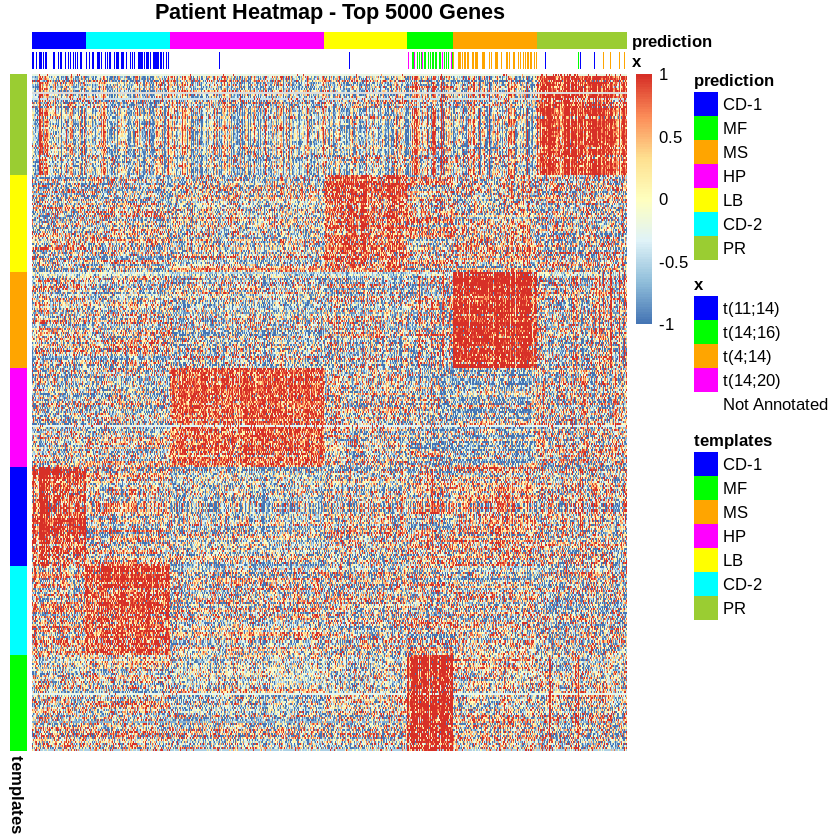

In [74]:
pheatmap(emat_hm, annotation_col = x,
         annotation_row = templates, annotation_colors = anoc, treeheight_row = 0,
         cluster_rows = FALSE, cluster_cols = FALSE,
#          color = colorRampPalette(rev(brewer.pal(n = 7, name = "RdBu")))(100),
         show_rownames = FALSE, show_colnames = FALSE, main = 'Patient Heatmap - Top 5000 Genes')

In [75]:
# pheatmap(emat.sorted.pred.probe, annotation_col = x,
#          annotation_row = templates, annotation_colors = anoc, treeheight_row = 0,
#          cluster_rows = FALSE, cluster_cols = FALSE, 
#          color = colorRampPalette(rev(brewer.pal(n = 7, name = "Dark2")))(100),
#          show_rownames = FALSE, show_colnames = FALSE, main = 'Patient Heatmap - Top 5000 Genes')

In [76]:

MM_cell_line3 = data.frame(fread("HMCL66_HTSeq_GENE_Counts_v3.txt"))
rownames(MM_cell_line3) = MM_cell_line3$Sample
MM_cell_line3 = MM_cell_line3[,-1]
MM_cell_line3 = MM_cell_line3[,-1]
head(MM_cell_line3)

keep_cell_st = (subtype.info$gene_id %in% rownames(MM_cell_line3))
subtype.info = subtype.info[keep_cell_st, ]
head(subtype.info)

templates2 = subtype.info[, c("gene_id", "Subgroup")]
colnames(templates2) = c("probe", "class")
head(templates2)
templates2$class = as.factor(templates2$class)
head(templates2)

emat2 <- ematAdjust(MM_cell_line3, normMethod = "quantile")
ntp.res2 = ntp(emat2, templates2, nPerm = 1000, distance = "cosine", nCores = 4, seed = 1, verbose = getOption("verbose"), doPlot = F)

,ALMC1,ALMC2,AMO1,ANBL6,COLO677,Delta47,DP6,EJM,FLAM76,FR4,⋯,RPMI8226,SKMM1,SKMM2,U266,UTMC2,VP6,XG1,XG2,XG6,XG7
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000000003,2,0,100,2,0,0,2,88,4,0,⋯,2,0,0,0,0,0,0,0,2,114
ENSG00000000005,1,0,0,0,1,0,0,0,0,0,⋯,0,1,0,0,0,0,0,0,0,0
ENSG00000000419,3949,4134,4795,8278,2262,2587,3607,2450,1388,3308,⋯,2694,1247,3263,3044,3108,4538,7336,4430,9279,13828
ENSG00000000457,1597,1513,2412,1988,1530,926,1415,573,1013,1232,⋯,665,994,497,1611,1603,1375,1426,893,1540,1660
ENSG00000000460,3072,1488,2193,4091,3208,1170,3614,1618,1507,1491,⋯,1472,1517,1346,2068,3128,1850,2522,2320,793,689
ENSG00000000938,0,22,701,5,2,4,89,4,2,2271,⋯,0,125,777,50,1890,2315,1514,5,3776,847


probeset,gene_name,chrom_map_pos,SAM.score,Subgroup,adj,NA,NA,gene_id
<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<fct>
206640_x_at,GAGE2A,Xp11.23,8.18,PR,https://www.genecards.org/cgi-bin/carddisp.pl?gene=GAGE2A,,,ENSG00000189064
202503_s_at,PCLAF,15q22.31,7.84,PR,https://www.genecards.org/cgi-bin/carddisp.pl?gene=PCLAF,,,ENSG00000166803
202705_at,CCNB2,15q22.2,7.79,PR,none,,,ENSG00000157456
208235_x_at,XAGE5,Xp11.4-p11.2,7.78,PR,http://asia.ensembl.org/Homo_sapiens/Search/Results?q=gage5,site=ensembl,facet_species=Human,ENSG00000171405
202589_at,TYMS,18p11.32,7.40,PR,none,,,ENSG00000176890
213008_at,FANCI,15q25-q26,7.39,PR,http://www.abnova.com/products/products_detail.asp?catalog_id=H00055215-P01,,,ENSG00000140525


probe,class
<fct>,<chr>
ENSG00000189064,PR
ENSG00000166803,PR
ENSG00000157456,PR
ENSG00000171405,PR
ENSG00000176890,PR
ENSG00000140525,PR


probe,class
<fct>,<fct>
ENSG00000189064,PR
ENSG00000166803,PR
ENSG00000157456,PR
ENSG00000171405,PR
ENSG00000176890,PR
ENSG00000140525,PR


Warning message:
"templates$probe coerced to character"

In [77]:
head(ntp.res2[order(ntp.res2$prediction),])
emat2.sorted.pred = (emat2[,rownames(ntp.res2[order(ntp.res2$prediction),])])
head(norm_cells_hm_5000)
head(emat2.sorted.pred)

,prediction,d.CD-1,d.CD-2,d.HP,d.LB,d.MF,d.MS,d.PR,p.value,FDR
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AMO1,CD-1,0.6635691,0.7068951,0.7354622,0.6993445,0.7450515,0.7734640,0.7590806,0.206793207,0.252747253
H1112,CD-1,0.6554005,0.7005262,0.7222138,0.7316195,0.7677329,0.7575194,0.6806594,0.070929071,0.093626374
JIM3,CD-1,0.6354265,0.7240170,0.7831840,0.7245860,0.7282915,0.6718468,0.7517927,0.003996004,0.006133401
JK6L,CD-1,0.6160265,0.7018889,0.7117817,0.7313307,0.7622507,0.7731473,0.6929603,0.001998002,0.003663004
KHM1B,CD-1,0.6643170,0.7425004,0.7067465,0.7645551,0.8114908,0.7895053,0.6812105,0.104895105,0.133136095
KMS12PE,CD-1,0.6853072,0.7075995,0.7172175,0.7256031,0.7723925,0.7947737,0.7118015,0.667332667,0.746507730


,ALMC1,ALMC2,AMO1,ANBL6,COLO677,Delta47,DP6,EJM,FLAM76,FR4,⋯,RPMI8226,SKMM1,SKMM2,U266,UTMC2,VP6,XG1,XG2,XG6,XG7
ENSG00000000003,4.631856,4.277689,6.557266,4.591941,4.277689,4.277689,4.633535,6.757867,4.854794,4.277689,⋯,4.707500,4.277689,4.277689,4.277689,4.277689,4.277689,4.277689,4.277689,4.628974,6.456153
ENSG00000000460,10.847890,9.645371,10.388723,10.913249,10.800240,9.887231,11.091261,10.429430,10.256753,10.615107,⋯,10.360803,10.367704,10.104580,10.385818,10.599902,9.880745,10.441824,10.134136,8.954919,8.491219
ENSG00000000938,4.277689,5.352556,8.827179,4.773110,4.618533,4.851261,6.447215,4.869862,4.687115,11.209973,⋯,4.277689,7.148103,9.347799,6.008208,9.896101,10.192478,9.731689,4.776205,11.116661,8.761160
ENSG00000000971,5.099227,7.152011,5.479271,5.277847,5.282185,5.083673,8.794912,5.289701,5.750034,4.744915,⋯,7.084740,5.339650,6.334592,4.643934,6.922797,5.655105,6.618223,8.390881,7.857338,7.031385
ENSG00000001561,11.299764,11.117408,10.699169,9.186855,8.748253,10.206546,11.290563,9.731783,10.226765,9.290325,⋯,9.783393,10.305428,10.430979,11.531337,11.357433,10.947580,10.925903,10.254524,10.855164,12.000486
ENSG00000002586,9.380980,6.053948,7.358972,5.070450,10.986954,4.565888,6.487835,4.791415,11.911219,4.744915,⋯,12.954815,4.277689,8.841481,4.643934,8.574893,4.600919,9.941437,4.593916,4.773268,8.531988


,AMO1,H1112,JIM3,JK6L,KHM1B,KMS12PE,KMS20,KMS27,PE1,SKMM1,⋯,XG7,DP6,INA6,Karpas929,Karpas929.1,MMM1,OPM1,OPM2,XG1,XG2
ENSG00000000003,1.79460978,0.7793254,-0.1351991,1.83154774,-0.7379034,-0.7379034,-0.737903427,-0.73790343,-0.7379034,-0.737903427,⋯,1.5921273,0.08063246,0.78225404,-0.7379034,-0.09063765,-0.2598268,0.6818082,0.05096775,-0.737903427,-0.7379034
ENSG00000000005,-0.22950006,-0.2295001,-0.2295001,-0.22950006,-0.2295001,-0.2295001,-0.229500065,-0.22950006,-0.2295001,2.757174085,⋯,-0.2295001,-0.22950006,-0.22950006,-0.2295001,-0.22950006,-0.2295001,-0.2295001,-0.22950006,-0.229500065,-0.2295001
ENSG00000000419,0.27471012,-0.2100660,1.4884327,-0.02688621,1.0483923,-0.6748398,-0.058846518,0.44400057,-0.7955573,-2.161743195,⋯,2.3431279,-0.49578183,-0.09551091,-1.1127635,-1.35082472,-0.4424045,0.9954262,1.90764214,1.067917347,-0.6672896
ENSG00000000457,1.50271382,0.6607379,3.4798783,0.80449026,1.1235393,-1.0129768,1.296233921,0.23952712,-0.5348205,-0.139378130,⋯,-0.3147106,-0.20343669,-0.13001944,0.7797032,0.80322651,-1.3313009,0.2678839,1.03954526,-0.355759034,-1.9614010
ENSG00000000460,0.04624468,0.1432934,1.4472587,0.11442742,-0.4386660,0.9261902,-0.003463576,0.87756495,-1.7058221,-0.001595275,⋯,-2.9597266,0.92567692,0.11049594,1.3876324,1.53682052,-0.3386747,0.7685637,1.27566006,0.009747056,-0.4581485
ENSG00000000938,1.04042192,-1.0796174,0.1950022,-0.19845257,0.7416684,0.1691541,-0.349903991,0.02993349,-0.6210731,0.346180755,⋯,0.9811751,0.14748265,0.82041234,1.4380554,1.48582559,-1.0796174,1.2489845,1.55985961,1.289165313,-0.8528982


In [78]:
x = c()

cell_names = colnames(emat2.sorted.pred)

for(pat in cell_names){
    if (pat %in% (cell_names_1114)){
        x = append(x, 't(11;14)')
    }
    else if (pat %in% (cell_names_1416)){
        x = append(x, 't(14;16)')
    }
    else if (pat %in% (cell_names_414)){
        x = append(x, 't(4;14)')
    }
    else if (pat %in% (cell_names_1420)){
        x = append(x, 't(14;20)')
    }
    else{
        x = append(x, 'Not Annotated')
    }
}

# x = as.data.frame(x)
# rownames(x) = colnames(emat2.sorted.pred)
# x1 = c("blue", "green", "orange", "magenta", "white")
# names(x1) = c("t(11;14)", "t(14;16)", "t(4;14)", "t(14;20)", "Not Annotated")
# anoc = list(x = x1)

x = as.data.frame(x)
rownames(x) = colnames(emat2.sorted.pred)
x1 = c("blue", "green", "orange", "magenta", "white")
names(x1) = c("t(11;14)", "t(14;16)", "t(4;14)", "t(14;20)", "Not Annotated")
pred1 = c("blue", "green", "orange", "magenta", "yellow", "cyan", "olivedrab3")
names(pred1) = c("CD-1", "MF", "MS", "HP", "LB", "CD-2", "PR")
temp1 = c("blue", "green", "orange", "magenta", "yellow", "cyan", "olivedrab3")
names(temp1) = c("CD-1", "MF", "MS", "HP", "LB", "CD-2", "PR")
anoc = list(x = x1, prediction = pred1, templates = temp1)


head(x)

# pheatmap(norm_pat_hm_5000, annotation_col = x, annotation_colors = anoc, treeheight_row = 0,
#          show_rownames = FALSE, show_colnames = FALSE, main = 'Patient Heatmap - Top 5000 Genes')

,x
,<fct>
AMO1,Not Annotated
H1112,t(11;14)
JIM3,t(4;14)
JK6L,Not Annotated
KHM1B,Not Annotated
KMS12PE,t(11;14)


In [79]:
head(emat2.sorted.pred)
ntp.res2.sorted = (ntp.res2[order(ntp.res2$prediction),])
head(ntp.res2.sorted)
x$prediction = ntp.res2.sorted$prediction
head(x)

,AMO1,H1112,JIM3,JK6L,KHM1B,KMS12PE,KMS20,KMS27,PE1,SKMM1,⋯,XG7,DP6,INA6,Karpas929,Karpas929.1,MMM1,OPM1,OPM2,XG1,XG2
ENSG00000000003,1.79460978,0.7793254,-0.1351991,1.83154774,-0.7379034,-0.7379034,-0.737903427,-0.73790343,-0.7379034,-0.737903427,⋯,1.5921273,0.08063246,0.78225404,-0.7379034,-0.09063765,-0.2598268,0.6818082,0.05096775,-0.737903427,-0.7379034
ENSG00000000005,-0.22950006,-0.2295001,-0.2295001,-0.22950006,-0.2295001,-0.2295001,-0.229500065,-0.22950006,-0.2295001,2.757174085,⋯,-0.2295001,-0.22950006,-0.22950006,-0.2295001,-0.22950006,-0.2295001,-0.2295001,-0.22950006,-0.229500065,-0.2295001
ENSG00000000419,0.27471012,-0.2100660,1.4884327,-0.02688621,1.0483923,-0.6748398,-0.058846518,0.44400057,-0.7955573,-2.161743195,⋯,2.3431279,-0.49578183,-0.09551091,-1.1127635,-1.35082472,-0.4424045,0.9954262,1.90764214,1.067917347,-0.6672896
ENSG00000000457,1.50271382,0.6607379,3.4798783,0.80449026,1.1235393,-1.0129768,1.296233921,0.23952712,-0.5348205,-0.139378130,⋯,-0.3147106,-0.20343669,-0.13001944,0.7797032,0.80322651,-1.3313009,0.2678839,1.03954526,-0.355759034,-1.9614010
ENSG00000000460,0.04624468,0.1432934,1.4472587,0.11442742,-0.4386660,0.9261902,-0.003463576,0.87756495,-1.7058221,-0.001595275,⋯,-2.9597266,0.92567692,0.11049594,1.3876324,1.53682052,-0.3386747,0.7685637,1.27566006,0.009747056,-0.4581485
ENSG00000000938,1.04042192,-1.0796174,0.1950022,-0.19845257,0.7416684,0.1691541,-0.349903991,0.02993349,-0.6210731,0.346180755,⋯,0.9811751,0.14748265,0.82041234,1.4380554,1.48582559,-1.0796174,1.2489845,1.55985961,1.289165313,-0.8528982


,prediction,d.CD-1,d.CD-2,d.HP,d.LB,d.MF,d.MS,d.PR,p.value,FDR
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AMO1,CD-1,0.6635691,0.7068951,0.7354622,0.6993445,0.7450515,0.7734640,0.7590806,0.206793207,0.252747253
H1112,CD-1,0.6554005,0.7005262,0.7222138,0.7316195,0.7677329,0.7575194,0.6806594,0.070929071,0.093626374
JIM3,CD-1,0.6354265,0.7240170,0.7831840,0.7245860,0.7282915,0.6718468,0.7517927,0.003996004,0.006133401
JK6L,CD-1,0.6160265,0.7018889,0.7117817,0.7313307,0.7622507,0.7731473,0.6929603,0.001998002,0.003663004
KHM1B,CD-1,0.6643170,0.7425004,0.7067465,0.7645551,0.8114908,0.7895053,0.6812105,0.104895105,0.133136095
KMS12PE,CD-1,0.6853072,0.7075995,0.7172175,0.7256031,0.7723925,0.7947737,0.7118015,0.667332667,0.746507730


,x,prediction
,<fct>,<fct>
AMO1,Not Annotated,CD-1
H1112,t(11;14),CD-1
JIM3,t(4;14),CD-1
JK6L,Not Annotated,CD-1
KHM1B,Not Annotated,CD-1
KMS12PE,t(11;14),CD-1


In [80]:
head(templates2)
emat2.sorted.pred.probe = (emat2.sorted.pred[as.vector(templates2$probe),])
head(emat2.sorted.pred.probe)

probe,class
<fct>,<fct>
ENSG00000189064,PR
ENSG00000166803,PR
ENSG00000157456,PR
ENSG00000171405,PR
ENSG00000176890,PR
ENSG00000140525,PR


,AMO1,H1112,JIM3,JK6L,KHM1B,KMS12PE,KMS20,KMS27,PE1,SKMM1,⋯,XG7,DP6,INA6,Karpas929,Karpas929.1,MMM1,OPM1,OPM2,XG1,XG2
ENSG00000189064,0.41803819,-0.4648122,-1.3031804,-0.8931977,0.6046140,-0.4196062,-0.07113072,-0.46235570,-0.5827265,-0.6470358,⋯,-0.12832655,0.94690034,0.2215137,1.3068606,1.1387087,1.44270696,1.6108559,0.3480402,0.1200052,1.1634538
ENSG00000166803,-1.10410169,-1.0641237,0.1075233,0.1574098,-0.3604467,0.4686846,-1.40153367,-0.61081118,-0.8416981,0.8005856,⋯,-1.89612708,0.28492300,0.9056995,1.6629378,1.5145262,1.13789195,0.8438194,0.6054927,-0.3118696,0.9056995
ENSG00000157456,-0.75900860,-0.2321104,-0.6435907,-0.6353293,1.0197892,0.7672194,-0.40143486,0.02274204,-0.8146865,0.3426386,⋯,-3.51541054,0.26457440,0.5342840,0.8439699,0.8439699,-0.04475714,0.9903841,0.0284816,0.5146756,0.8265851
ENSG00000171405,-0.74328608,-0.7432861,-0.7432861,-0.2566834,1.7527536,-0.7432861,-0.74328608,-0.74328608,-0.7432861,1.1472771,⋯,0.01151274,1.26079277,-0.7432861,1.1881245,1.4002544,2.13364504,1.2404040,-0.7432861,1.0045679,-0.7432861
ENSG00000176890,0.05008938,1.3655629,-1.0677563,0.4896308,-0.3841506,0.9990746,-0.57114850,0.14332048,-0.3055063,0.1022058,⋯,-1.26993936,0.07830973,-0.2994973,1.3104127,1.3385270,1.97147082,0.7256950,-0.1523960,0.4531058,1.0325884
ENSG00000140525,-0.66474547,1.1579602,-0.3878622,0.6793637,-0.3912632,0.4927125,0.01831934,0.21225388,-0.7481571,-0.2447936,⋯,-1.46247546,-0.19203173,0.3601065,0.9160486,1.0615451,0.66518383,0.7171101,-0.2015802,0.8135270,0.8630574


In [81]:
rownames(templates2) = c(1:length(templates2[,1]))
rownames(emat2.sorted.pred.probe) = c(1:length(templates2[,1]))
length(templates2[,1])
length(rownames(emat2.sorted.pred.probe))
length(unique(rownames(templates2)))
length(unique(rownames(emat2.sorted.pred.probe)))
tail(templates2)
tail(emat2.sorted.pred.probe)
templates2 = as.data.frame(templates2[,-1])
colnames(templates2) = "templates"
head(templates2)

[1] 335

[1] 335

[1] 335

[1] 335

,probe,class
,<fct>,<fct>
330,ENSG00000089220,MF
331,ENSG00000159363,MF
332,ENSG00000128383,MF
333,ENSG00000100994,MF
334,ENSG00000043462,MF
335,ENSG00000145423,MF


,AMO1,H1112,JIM3,JK6L,KHM1B,KMS12PE,KMS20,KMS27,PE1,SKMM1,⋯,XG7,DP6,INA6,Karpas929,Karpas929.1,MMM1,OPM1,OPM2,XG1,XG2
330,-0.6831586,0.70942350,-0.0008825243,0.6372275,-1.8009692,0.6744545,0.07201852,-0.33718847,0.1658239,1.75108687,⋯,-0.2887823,0.06853751,-0.4812051,0.07201852,-0.20990020,0.6797803,0.05718315,-1.4649167,-1.1049087,0.4285768
331,-0.1408078,0.19738697,-0.0959357545,-1.0766335,-0.8561372,0.7281197,0.63688386,-0.07013912,0.1266577,1.00194739,⋯,0.4230833,-0.31246762,-0.8396009,-0.41647202,-0.28515389,1.1589053,-0.10670424,-0.7853758,-0.9692979,-1.1772354
332,0.2271047,1.01829960,1.2861709649,0.0472254,0.6427130,0.2749887,0.43996862,0.26754763,-1.0904457,-1.27641019,⋯,1.1059239,0.45142046,-1.6707344,-0.86512161,0.58962657,-1.6511043,-0.16529045,0.9273903,0.7322200,0.3775353
333,-0.1198983,-0.23327806,0.1548780881,-0.4768641,-0.5540942,-0.5402955,0.26753699,-0.15195548,-0.7919360,0.38367838,⋯,1.9717983,-0.33093801,-0.9840769,-2.47352659,-2.48933663,-0.9475170,-1.21278469,0.6204422,-0.3688554,-1.7581757
334,0.9097149,-1.21235386,0.2206367347,0.4131091,0.7240498,-0.1942326,0.98325272,-0.68295787,-1.1081644,0.01856558,⋯,0.2519824,0.62552752,0.1828233,0.26157001,0.13760902,-0.5941271,-0.88615565,-1.0651942,-0.1158244,0.7753483
335,-0.7464872,0.06660297,-0.7464872387,0.1070755,-0.7464872,-0.7464872,-0.29213918,-0.74648724,0.3608758,-0.74648724,⋯,-0.5856189,0.08650787,0.2880316,-0.74648724,-0.08778769,0.4160128,-0.37793562,-0.7464872,-0.7464872,-0.7464872


templates
<fct>
PR
PR
PR
PR
PR
PR


In [82]:
head(x[cell_names_1114, ])

,x,prediction
,<fct>,<fct>
FLAM76,t(11;14),HP
H1112,t(11;14),CD-1
INA6,t(11;14),PR
Karpas620,t(11;14),CD-2
KMS12BM,t(11;14),CD-2
KMS12PE,t(11;14),CD-1


In [83]:
emat2_hm = apply(emat2.sorted.pred.probe, 2, function(x) ifelse(x < -1, -1, x))
head(emat2_hm)
emat2_hm = apply(emat2_hm, 2, function(x) ifelse(x > 1, 1, x))
head(emat2_hm)

AMO1,H1112,JIM3,JK6L,KHM1B,KMS12PE,KMS20,KMS27,PE1,SKMM1,⋯,XG7,DP6,INA6,Karpas929,Karpas929.1,MMM1,OPM1,OPM2,XG1,XG2
0.41803819,-0.4648122,-1.0000000,-0.8931977,0.6046140,-0.4196062,-0.07113072,-0.46235570,-0.5827265,-0.6470358,⋯,-0.12832655,0.94690034,0.2215137,1.3068606,1.1387087,1.44270696,1.6108559,0.3480402,0.1200052,1.1634538
-1.00000000,-1.0000000,0.1075233,0.1574098,-0.3604467,0.4686846,-1.00000000,-0.61081118,-0.8416981,0.8005856,⋯,-1.00000000,0.28492300,0.9056995,1.6629378,1.5145262,1.13789195,0.8438194,0.6054927,-0.3118696,0.9056995
-0.75900860,-0.2321104,-0.6435907,-0.6353293,1.0197892,0.7672194,-0.40143486,0.02274204,-0.8146865,0.3426386,⋯,-1.00000000,0.26457440,0.5342840,0.8439699,0.8439699,-0.04475714,0.9903841,0.0284816,0.5146756,0.8265851
-0.74328608,-0.7432861,-0.7432861,-0.2566834,1.7527536,-0.7432861,-0.74328608,-0.74328608,-0.7432861,1.1472771,⋯,0.01151274,1.26079277,-0.7432861,1.1881245,1.4002544,2.13364504,1.2404040,-0.7432861,1.0045679,-0.7432861
0.05008938,1.3655629,-1.0000000,0.4896308,-0.3841506,0.9990746,-0.57114850,0.14332048,-0.3055063,0.1022058,⋯,-1.00000000,0.07830973,-0.2994973,1.3104127,1.3385270,1.97147082,0.7256950,-0.1523960,0.4531058,1.0325884
-0.66474547,1.1579602,-0.3878622,0.6793637,-0.3912632,0.4927125,0.01831934,0.21225388,-0.7481571,-0.2447936,⋯,-1.00000000,-0.19203173,0.3601065,0.9160486,1.0615451,0.66518383,0.7171101,-0.2015802,0.8135270,0.8630574


AMO1,H1112,JIM3,JK6L,KHM1B,KMS12PE,KMS20,KMS27,PE1,SKMM1,⋯,XG7,DP6,INA6,Karpas929,Karpas929.1,MMM1,OPM1,OPM2,XG1,XG2
0.41803819,-0.4648122,-1.0000000,-0.8931977,0.6046140,-0.4196062,-0.07113072,-0.46235570,-0.5827265,-0.6470358,⋯,-0.12832655,0.94690034,0.2215137,1.0000000,1.0000000,1.00000000,1.0000000,0.3480402,0.1200052,1.0000000
-1.00000000,-1.0000000,0.1075233,0.1574098,-0.3604467,0.4686846,-1.00000000,-0.61081118,-0.8416981,0.8005856,⋯,-1.00000000,0.28492300,0.9056995,1.0000000,1.0000000,1.00000000,0.8438194,0.6054927,-0.3118696,0.9056995
-0.75900860,-0.2321104,-0.6435907,-0.6353293,1.0000000,0.7672194,-0.40143486,0.02274204,-0.8146865,0.3426386,⋯,-1.00000000,0.26457440,0.5342840,0.8439699,0.8439699,-0.04475714,0.9903841,0.0284816,0.5146756,0.8265851
-0.74328608,-0.7432861,-0.7432861,-0.2566834,1.0000000,-0.7432861,-0.74328608,-0.74328608,-0.7432861,1.0000000,⋯,0.01151274,1.00000000,-0.7432861,1.0000000,1.0000000,1.00000000,1.0000000,-0.7432861,1.0000000,-0.7432861
0.05008938,1.0000000,-1.0000000,0.4896308,-0.3841506,0.9990746,-0.57114850,0.14332048,-0.3055063,0.1022058,⋯,-1.00000000,0.07830973,-0.2994973,1.0000000,1.0000000,1.00000000,0.7256950,-0.1523960,0.4531058,1.0000000
-0.66474547,1.0000000,-0.3878622,0.6793637,-0.3912632,0.4927125,0.01831934,0.21225388,-0.7481571,-0.2447936,⋯,-1.00000000,-0.19203173,0.3601065,0.9160486,1.0000000,0.66518383,0.7171101,-0.2015802,0.8135270,0.8630574


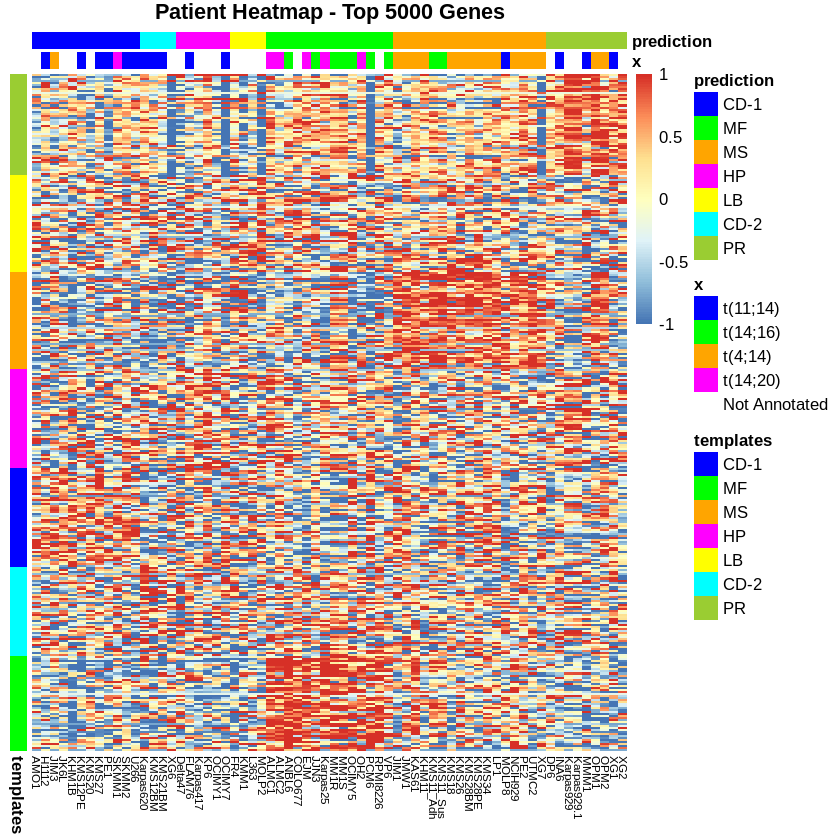

In [84]:
# pheatmap(apply(emat2.sorted.pred.probe, 2, function(x) ifelse(x < -1, -1, x)), annotation_col = x,
pheatmap(emat2_hm, annotation_col = x,
         annotation_row = templates2, annotation_colors = anoc, treeheight_row = 0,
         cluster_rows = FALSE, cluster_cols = FALSE, fontsize_col = 7, 
#          color = colorRampPalette(rev(brewer.pal(n = 7, name = "RdBu")))(100),
         show_rownames = FALSE, show_colnames = TRUE, main = 'Patient Heatmap - Top 5000 Genes')

In [ ]:
is.nan.data.frame <- function(x)
do.call(cbind, lapply(x, is.nan))

emat2_hm[is.nan(emat2_hm)] <- 0
head(emat2_hm)

In [96]:
head(norm_pat)
length(norm_pat[,1])

,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2531_2_PB,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2089_2_BM,MMRF_2341_1_BM,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ENSG00000000003,5.763143,9.537185,7.395753,5.308595,9.830803,5.274120,5.550078,5.500219,4.872554,5.880590,⋯,4.724323,7.872087,7.279442,8.892504,8.268661,5.786579,5.238299,4.906192,5.573125,5.539938
ENSG00000000419,10.974725,11.195989,11.818120,10.507028,11.038501,11.074396,11.418836,10.688833,10.510092,10.569849,⋯,11.193842,10.433799,8.751681,12.055311,11.140925,11.779415,10.405654,10.644307,10.820096,10.844967
ENSG00000000457,8.420720,9.249930,8.461872,10.477123,8.968302,10.433395,9.951931,9.797906,9.553685,9.607254,⋯,9.503770,9.740347,8.712015,9.055347,7.830135,9.211329,9.518367,9.494629,9.623449,10.069578
ENSG00000000460,7.240012,8.035522,6.362907,7.950493,7.004830,8.922297,8.080643,8.263642,9.527754,8.376546,⋯,8.168128,7.194023,7.405635,7.612022,6.115524,6.992802,7.613518,7.733282,7.793913,7.505658
ENSG00000000938,8.838641,6.773748,7.792299,7.996890,11.158836,10.511120,5.550078,8.499929,8.827716,8.569701,⋯,6.266877,5.502307,8.612095,11.326184,7.314219,7.142771,9.780425,5.457562,7.633019,6.535104
ENSG00000000971,8.954700,9.660588,9.272141,7.626551,8.452307,12.823135,5.732564,8.006766,9.272567,5.736415,⋯,5.392960,5.023380,6.038515,7.534880,6.621261,5.826595,10.599142,11.058560,6.433822,5.876621


[1] 22677

In [98]:
head(emat.sorted.pred)
length(emat.sorted.pred[,1])

,MMRF_1439_1_BM,MMRF_1261_1_BM,MMRF_1915_1_BM,MMRF_1912_1_PB,MMRF_1311_1_BM,MMRF_1927_1_PB,MMRF_2572_1_BM,MMRF_2478_1_BM,MMRF_1777_1_BM,MMRF_1540_1_BM,⋯,MMRF_1932_1_BM,MMRF_2195_1_BM,MMRF_1720_1_BM,MMRF_2268_1_BM,MMRF_2490_1_BM,MMRF_2272_1_BM,MMRF_2488_1_BM,MMRF_1876_1_BM,MMRF_2613_2_BM,MMRF_1274_1_BM
ENSG00000000003,-1.2156488,-0.9989080,-1.3608057,-2.3147800,-0.80168639,-2.3147800,-1.3143198,0.13781327,0.3003799,-0.4972654,⋯,0.4722824,-0.62264830,-0.2822935,0.8105194,-2.3147800,0.2425854,-2.31478001,0.88357849,0.4925591,-0.55834127
ENSG00000000005,-0.3801519,-0.3801519,-0.3801519,-0.3801519,-0.38015191,-0.3801519,-0.3801519,-0.38015191,-0.3801519,-0.3801519,⋯,-0.3801519,-0.38015191,-0.3801519,5.9997432,-0.3801519,-0.3801519,-0.38015191,-0.38015191,3.8607325,-0.38015191
ENSG00000000419,1.2450553,-1.1397351,1.3159738,0.9996856,-0.32758584,-0.1677141,0.3300209,1.01346358,0.9200341,0.7600687,⋯,-2.5573467,-0.51237428,-0.3023535,1.0241956,0.6274732,0.0478648,-0.05858697,0.16232403,-0.3250782,-0.64250606
ENSG00000000457,0.6344137,0.7429179,-1.4998771,0.6860753,0.24537526,0.2170222,-0.9778926,-0.41386051,-0.2066534,0.2514468,⋯,0.3492114,-0.09852521,-0.1765833,-1.6680847,2.1895445,0.3861700,0.52175108,0.43400289,-0.3666911,0.74179536
ENSG00000000460,1.2115963,0.5860784,-0.2431745,0.1278346,0.11341531,-0.1556981,-1.8641225,0.04450442,-1.0642464,0.7459996,⋯,0.8091261,0.24866334,0.3804302,0.1871664,1.8860406,1.1597980,-0.07117233,-0.07343737,-0.3210750,0.13200124
ENSG00000000938,-0.2549232,-0.9191035,-0.7038565,1.1551052,0.07233446,1.0596760,-0.5685713,1.23872278,0.2688481,-0.8615615,⋯,0.1322705,1.58700302,-0.5954748,2.9393756,-0.4873965,0.9040851,1.83118141,-0.54548481,2.1873636,0.02835018


[1] 57997

In [106]:
head(emat)
head(emat2)
max(emat.sorted.pred.probe)

,MMRF_2801_1_BM,MMRF_2718_1_BM,MMRF_2815_1_BM,MMRF_1656_1_BM,MMRF_2461_1_BM,MMRF_2531_2_PB,MMRF_2057_1_BM,MMRF_1910_1_BM,MMRF_2089_2_BM,MMRF_2341_1_BM,⋯,MMRF_2379_1_BM,MMRF_1474_1_BM,MMRF_1641_1_BM,MMRF_1978_2_BM,MMRF_2795_1_BM,MMRF_2316_1_BM,MMRF_2606_2_BM,MMRF_2440_1_BM,MMRF_2731_1_BM,MMRF_1355_1_BM
ENSG00000000003,-0.5034428,1.14822158,0.3905395,-0.6413293,1.2484609,-0.6956060,-0.4292927,-0.7303004,-1.09274283,-0.3099536,⋯,-1.3456373,0.6710997,0.3891932,0.9308734,0.78118740,-0.23182062,-0.8158151,-0.99170309,-0.51002479,-0.59135933
ENSG00000000005,1.0147775,-0.38015191,-0.3801519,2.8031932,2.5175375,-0.3801519,-0.3801519,-0.3801519,-0.38015191,0.6129453,⋯,-0.3801519,-0.3801519,-0.3801519,-0.3801519,-0.38015191,-0.38015191,0.4579366,-0.38015191,-0.38015191,-0.38015191
ENSG00000000419,0.1900955,0.64742854,1.6038062,-0.7485066,0.2082317,0.5179854,1.2426775,-0.2925516,-0.73646646,-0.6336518,⋯,0.7044936,-0.8936242,-4.2596791,2.3159063,0.46455438,1.97897783,-0.9234317,-0.37013588,-0.04842869,-0.08583747
ENSG00000000457,-2.2492782,-0.74178217,-2.0554042,1.6275031,-1.3108550,1.5305867,0.7235060,0.2510157,-0.01550718,-0.1429012,⋯,-0.2342664,0.3067628,-1.4816185,-1.1382169,-3.36476198,-0.92029619,-0.1869356,-0.13123242,0.13967138,0.82740797
ENSG00000000460,-0.9866237,0.03789052,-2.2470334,0.1313732,-1.4389725,1.1644884,0.4808772,0.1176022,1.90921586,0.4556302,⋯,0.4636519,-0.4419535,-0.4755841,-0.5554881,-2.61935699,-0.91616205,-0.3682853,0.07315148,0.03224686,-0.53895136
ENSG00000000938,0.7791262,-0.43427775,0.2709861,0.3595398,1.6970900,1.4602103,-1.0726750,0.4670561,0.78456054,0.5665474,⋯,-0.4755289,-1.0183725,0.7018867,1.7882717,0.03959092,-0.01929665,1.1545517,-1.08110557,0.21797933,-0.49965369


,ALMC1,ALMC2,AMO1,ANBL6,COLO677,Delta47,DP6,EJM,FLAM76,FR4,⋯,RPMI8226,SKMM1,SKMM2,U266,UTMC2,VP6,XG1,XG2,XG6,XG7
ENSG00000000003,0.2911876,-0.7379034,1.79460978,0.1979129,-0.73790343,-0.7379034,0.08063246,1.87504352,0.2999695,-0.7379034,⋯,0.3097392,-0.737903427,-0.73790343,-0.737903427,-0.7379034,-0.7379034,-0.737903427,-0.7379034,0.07502715,1.5921273
ENSG00000000005,5.2559933,-0.2295001,-0.22950006,-0.2295001,1.21204706,-0.2295001,-0.22950006,-0.22950006,-0.2295001,-0.2295001,⋯,-0.2295001,2.757174085,-0.22950006,-0.229500065,-0.2295001,-0.2295001,-0.229500065,-0.2295001,-0.22950006,-0.2295001
ENSG00000000419,-0.3014022,-0.4810764,0.27471012,0.8722382,-1.81750788,-0.5589938,-0.49578183,-0.65749825,-2.0643898,0.8335132,⋯,-0.3459506,-2.161743195,-0.01615286,-0.719871807,-1.3694174,-0.3449091,1.067917347,-0.6672896,1.91463885,2.3431279
ENSG00000000457,0.2740832,-0.3958476,1.50271382,0.1483617,-0.08671068,-0.6493719,-0.20343669,-1.79802431,-0.1944698,1.0742767,⋯,-1.2923574,-0.139378130,-2.12089692,0.468931141,-0.4680139,-0.8994055,-0.355759034,-1.9614010,0.17381190,-0.3147106
ENSG00000000460,0.5867564,-1.1145508,0.04624468,0.6495202,0.53599500,-0.7612914,0.92567692,-0.01830538,-0.1728749,0.3253043,⋯,-0.1209065,-0.001595275,-0.39708824,-0.002678005,0.2452013,-0.8400927,0.009747056,-0.4581485,-2.14848053,-2.9597266
ENSG00000000938,-2.0516007,-0.4299289,1.04042192,-0.8323253,-1.41584601,-0.9594826,0.14748265,-0.90819741,-1.4158460,1.7189373,⋯,-2.0516007,0.346180755,1.18736140,-0.025008017,1.3220262,1.3993866,1.289165313,-0.8528982,1.69035115,0.9811751


[1] NaN

In [86]:
head(x)

,x,prediction
,<fct>,<fct>
AMO1,Not Annotated,CD-1
H1112,t(11;14),CD-1
JIM3,t(4;14),CD-1
JK6L,Not Annotated,CD-1
KHM1B,Not Annotated,CD-1
KMS12PE,t(11;14),CD-1


In [ ]:
# pheatmap(emat2.sorted.pred.probe, annotation_col = x,
# # pheatmap(emat2.sorted.pred.probe, annotation_col = x,
#          annotation_row = templates2, annotation_colors = anoc, treeheight_row = 0,
#          cluster_rows = FALSE, cluster_cols = FALSE, fontsize_col = 7,
#          color = colorRampPalette(rev(brewer.pal(n = 7, name = "Dark2")))(100),
#          show_rownames = FALSE, show_colnames = TRUE, main = 'Patient Heatmap - Top 5000 Genes')

In [ ]:
# library(CMScaller)
# subtype.info = data.frame(fread("2020-sup-tables2 (2).csv"))
# colnames(subtype.info) = c("probeset", "gene_name", "chrom_map_pos", "SAM.score", "Subgroup", "adj")
# head(subtype.info)
# length((subtype.info[,2]))
# length(unique(subtype.info[,2]))
# keep_stinf = subtype.info$adj %in% "noid"
# keep_stinf = !keep_stinf
# sum(keep_stinf)
# subtype.info = subtype.info[keep_stinf,]
# length((subtype.info[,2]))
# length(unique(subtype.info[,2]))
# symbols = (subtype.info[,2])
# test_df = as.data.frame(as.matrix(mapIds(org.Hs.eg.db, symbols, 'ENSEMBL', 'SYMBOL')))
# # print(test_df)
# subtype.info$gene_id = test_df[,1]
# head(subtype.info)

# MM_patients3 = data.frame(fread("MMRF_CoMMpass_IA13a_E74GTF_HtSeq_Gene_Counts.txt"))
# rownames(MM_patients3) = MM_patients3$GENE_ID
# MM_patients3 = MM_patients3[,-1]
# head(MM_patients3)
# keepinpat =  subtype.info$gene_id %in% rownames(MM_patients3)
# subtype.info = subtype.info[keepinpat,]
# length(subtype.info[,1])


# templates = subtype.info[, c("gene_id", "Subgroup")]
# colnames(templates) = c("probe", "class")
# head(templates)
# templates$class = as.factor(templates$class)
# head(templates)


# emat <- ematAdjust(MM_patients3, normMethod = "quantile")
# ntp.res = ntp(emat, templates, nPerm = 1000, distance = "cosine", nCores = 4, seed = 1, verbose = getOption("verbose"), doPlot = T)
# ntp.res


# MM_cell_line3 = data.frame(fread("HMCL66_HTSeq_GENE_Counts_v3.txt"))
# rownames(MM_cell_line3) = MM_cell_line3$Sample
# MM_cell_line3 = MM_cell_line3[,-1]
# MM_cell_line3 = MM_cell_line3[,-1]
# head(MM_cell_line3)

# keep_cell_st = (subtype.info$gene_id %in% rownames(MM_cell_line3))
# subtype.info = subtype.info[keep_cell_st, ]
# head(subtype.info)

# templates2 = subtype.info[, c("gene_id", "Subgroup")]
# colnames(templates2) = c("probe", "class")
# head(templates2)
# templates2$class = as.factor(templates2$class)
# head(templates2)

# emat2 <- ematAdjust(MM_cell_line3, normMethod = "quantile")
# ntp.res2 = ntp(emat2, templates2, nPerm = 1000, distance = "cosine", nCores = 4, seed = 1, verbose = getOption("verbose"), doPlot = T)
# ntp.res2

In [ ]:
combined_annot = data.frame(colnames(MM_combined.filtered))
head(combined_annot)

combined_annot$type = "Patient"
combined_annot$type[1:ncol(norm_cell)] = "Cell_Line"
tail(combined_annot)
rn = combined_annot[,1]
combined_annot = combined_annot[-1]
rownames(combined_annot) = rn


set = newSeqExpressionSet(as.matrix(MM_combined.filtered), 
                          phenoData = combined_annot)


x <- as.factor(combined_annot$type)
design <- model.matrix(~x, data=pData(set))
y <- DGEList(counts=counts(set), group=x)
y <- calcNormFactors(y, method="upperquartile")
y <- estimateGLMCommonDisp(y, design)
y <- estimateGLMTagwiseDisp(y, design)
fit <- glmFit(y, design)
lrt <- glmLRT(fit, coef=2)
top <- topTags(lrt, n=nrow(set))$table
head(top)

# topb = top$logFC >= 2 | top$logFC <= -2
# top2 = top[topb,]
# topb = top$PValue <= 0.01
# top2 = top[topb,]

gene_ranks = top[,'logFC']
head(gene_ranks)
tail(gene_ranks)


gene_info = as.data.frame(gene_info)
rownames(gene_info) = gene_info$ensembl_ids
head(gene_info)
gene_info$ensembl_ids = NULL
head(gene_info)



gr_symb = gene_info[rownames(top),]
names(gene_ranks) = gr_symb
hmgs = gmtPathways('h.all.v6.2.symbols_2.gmt')




fgseaRes <- fgsea(pathways = hmgs, 
                  stats = gene_ranks,
                  nperm=10000)



topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=50), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=50), pathway]
topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
              gseaParam = 0.5)



topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=10), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=10), pathway]
# topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathwaysUp], gene_ranks, fgseaRes, 
              gseaParam = 0.5)
plotGseaTable(hmgs[topPathwaysDown], gene_ranks, fgseaRes, 
              gseaParam = 0.5)
# plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
#               gseaParam = 0.5)

In [ ]:
# min(top$PValue)
# max(top$PValue)

# topb = top$logFC >= 2 | top$logFC <= -2
# top2 = top[topb,]
# topb = top$FDR <= 0.01
# top2 = top[topb,]

# max(top2$PValue)
# min(top2$PValue)

In [ ]:
# 0.00793426340800131

topb = top$logFC >= 2 | top$logFC <= -2
top2 = top[topb,]
topb = top2$FDR <= 0.05
top2 = top2[topb,]

gene_ranks = top2[,'logFC']

gr_symb = gene_info[rownames(top2),]
names(gene_ranks) = gr_symb
hmgs = gmtPathways('h.all.v6.2.symbols_2.gmt')

fgseaRes <- fgsea(pathways = hmgs, 
                  stats = gene_ranks,
                  nperm=10000)

topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=50), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=50), pathway]
topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
              gseaParam = 0.5)

topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=10), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=10), pathway]
# topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathwaysUp], gene_ranks, fgseaRes, 
              gseaParam = 0.5)
plotGseaTable(hmgs[topPathwaysDown], gene_ranks, fgseaRes, 
              gseaParam = 0.5)
# plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
#               gseaParam = 0.5)

In [ ]:
# 0.00793426340800131

topb = top$logFC >= 1.5 | top$logFC <= -1.5
top3 = top[topb,]
topb = top3$FDR <= 0.05
top3 = top3[topb,]

gene_ranks = top3[,'logFC']

gr_symb = gene_info[rownames(top3),]
names(gene_ranks) = gr_symb
hmgs = gmtPathways('h.all.v6.2.symbols_2.gmt')

fgseaRes <- fgsea(pathways = hmgs, 
                  stats = gene_ranks,
                  nperm=10000)

topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=50), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=50), pathway]
topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
              gseaParam = 0.5)

topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=10), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=10), pathway]
# topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathwaysUp], gene_ranks, fgseaRes, 
              gseaParam = 0.5)
plotGseaTable(hmgs[topPathwaysDown], gene_ranks, fgseaRes, 
              gseaParam = 0.5)
# plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
#               gseaParam = 0.5)

In [ ]:
# 0.00793426340800131

topb = top$logFC >= 2 | top$logFC <= -2
top4 = top[topb,]
topb = top4$FDR <= 0.01
top4 = top4[topb,]

gene_ranks = top4[,'logFC']

gr_symb = gene_info[rownames(top4),]
names(gene_ranks) = gr_symb
hmgs = gmtPathways('h.all.v6.2.symbols_2.gmt')

fgseaRes <- fgsea(pathways = hmgs, 
                  stats = gene_ranks,
                  nperm=10000)

topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=50), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=50), pathway]
topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
              gseaParam = 0.5)

topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=10), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=10), pathway]
# topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathwaysUp], gene_ranks, fgseaRes, 
              gseaParam = 0.5)
plotGseaTable(hmgs[topPathwaysDown], gene_ranks, fgseaRes, 
              gseaParam = 0.5)
# plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
#               gseaParam = 0.5)

In [ ]:
# 0.00793426340800131

topb = top$logFC >= 1.5 | top$logFC <= -1.5
top5 = top[topb,]
topb = top5$FDR <= 0.01
top5 = top5[topb,]

gene_ranks = top5[,'logFC']

gr_symb = gene_info[rownames(top5),]
names(gene_ranks) = gr_symb
hmgs = gmtPathways('h.all.v6.2.symbols_2.gmt')

fgseaRes <- fgsea(pathways = hmgs, 
                  stats = gene_ranks,
                  nperm=10000)

topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=50), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=50), pathway]
topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
              gseaParam = 0.5)

topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=10), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=10), pathway]
# topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathwaysUp], gene_ranks, fgseaRes, 
              gseaParam = 0.5)
plotGseaTable(hmgs[topPathwaysDown], gene_ranks, fgseaRes, 
              gseaParam = 0.5)
# plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
#               gseaParam = 0.5)

In [3]:
# 0.00793426340800131

topb = top$logFC >= 1 | top$logFC <= -1
top6 = top[topb,]
topb = top6$FDR <= 0.01
top6 = top6[topb,]

gene_ranks = top6[,'logFC']

gr_symb = gene_info[rownames(top6),]
names(gene_ranks) = gr_symb
hmgs = gmtPathways('h.all.v6.2.symbols_2.gmt')

fgseaRes <- fgsea(pathways = hmgs, 
                  stats = gene_ranks,
                  nperm=10000)

topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=50), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=50), pathway]
topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
              gseaParam = 0.5)

topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=10), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=10), pathway]
# topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathwaysUp], gene_ranks, fgseaRes, 
              gseaParam = 0.5)
plotGseaTable(hmgs[topPathwaysDown], gene_ranks, fgseaRes, 
              gseaParam = 0.5)
# plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
#               gseaParam = 0.5)

ERROR: Error in eval(expr, envir, enclos): object 'top' not found


In [ ]:
# 0.00793426340800131

topb = top$logFC >= 1 | top$logFC <= -1
top7 = top[topb,]
topb = top7$FDR <= 0.05
top7 = top7[topb,]

gene_ranks = top7[,'logFC']

gr_symb = gene_info[rownames(top7),]
names(gene_ranks) = gr_symb
hmgs = gmtPathways('h.all.v6.2.symbols_2.gmt')

fgseaRes <- fgsea(pathways = hmgs, 
                  stats = gene_ranks,
                  nperm=10000)

topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=50), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=50), pathway]
topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
              gseaParam = 0.5)

topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=10), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=10), pathway]
# topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(hmgs[topPathwaysUp], gene_ranks, fgseaRes, 
              gseaParam = 0.5)
plotGseaTable(hmgs[topPathwaysDown], gene_ranks, fgseaRes, 
              gseaParam = 0.5)
# plotGseaTable(hmgs[topPathways], gene_ranks, fgseaRes, 
#               gseaParam = 0.5)

In [ ]:
head(top7)
max(top7$PValue)

In [ ]:
10^-100

In [ ]:
5E-324
te = c(0, 0, 1)
te = replace(te, te == 0, 5E-324)
head(te)

In [ ]:
head(top)
pvaled = replace(top$PValue, top$PValue == 0, 5E-324)
neglogpval = (log(pvaled)*-1)
logFC = top$logFC
vol = as.data.frame(cbind(logFC, neglogpval))
max(logFC)
min(logFC)
voltop = head(vol)
voltop
voltopnames = gene_info[rownames(top),]
plot(vol, pch=19)
text(voltop[1,], labels = voltopnames[1], adj = 0)
# text(voltop[2,], labels = voltopnames[2], adj = 0)
# text(voltop[3,], labels = voltopnames[3], adj = 1)
# tw = top[,-2]
# tw = tw[,-2]
# tw = tw[,-3]
# tw$names = gene_info[rownames(tw),]
# write.csv(tw, '~/Downloads/proj/twrawrle.csv')

In [ ]:
rownames(vol) = rownames(top)
vol$names = gene_info[rownames(top),]
head(vol)
volf3 = str_extract(vol$names, '[A-Z]{1,3}')
head(volf3)
volIGL = (volf3 == 'IGL')
volIGH = (volf3 == 'IGH')
volIGK = (volf3 == 'IGK')
vol = vol[,-3]
plot(vol, pch=19, cex = 0.7)
points(vol[volIGL,], pch=19, col = 'red', cex = 0.7)
points(vol[volIGH,], pch=19, col = 'green', cex = 0.7)
points(vol[volIGK,], pch=19, col = 'blue', cex = 0.7)
# MM_patients_new = filter(MM_patient_ids, str_extract(MM_patient_ids[,1], "_[0-9]_") == "_1_")

In [ ]:
padj = p.adjust(top$PValue, method = 'fdr')
head(padj)
neglogpadjval = (log(padj)*-1)
head(neglogpadjval)
# logFC = top$logFC
# head(top)
# neglogpval = (log(top$PValue)*-1)
logFC = top$logFC
vol = as.data.frame(cbind(logFC, neglogpadjval))
max(logFC)
min(logFC)
voltop = head(vol)
voltop
voltopnames = c('RPL17-C18orf32', 'DNAAF4', 'FOSB', 'PYURF', 'AL354740.1', 'CORO7-PAM16')
plot(vol, pch=19)
text(voltop[1,], labels = voltopnames[1], adj = 0)
text(voltop[2,], labels = voltopnames[2], adj = 0)
text(voltop[3,], labels = voltopnames[3], adj = 1)
# tw = top[,-2]
# tw = tw[,-2]
# tw = tw[,-3]
# tw$names = gene_info[rownames(tw),]
# write.csv(tw, '~/Downloads/proj/tw.csv')

In [ ]:
# top_bool = padj < 0.05
# top_pcut = top[top_bool,]
# gr_symb2 = gene_info[rownames(top_pcut),]
gr_symb3 = gene_info[rownames(top),]
top_pcut_upbool = top4$logFC > 0
top_pcut_dobool = !top_pcut_upbool
top_pcut_up = top4[top_pcut_upbool,]
top_pcut_do = top4[top_pcut_dobool,]
gr_symb_up = gene_info[rownames(top_pcut_up),]
gr_symb_do = gene_info[rownames(top_pcut_do),]

ego <- enrichGO(gene          = gr_symb_up,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "ALL",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)
# head(summary(ego))

ego2 <- enrichGO(gene          = gr_symb_do,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "ALL",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)

dotplot(ego, showCategory=10, font.size = 5)
dotplot(ego2, showCategory=10, font.size = 5)

goterms = rownames(summary(ego))
head(goterms)

ego_BP <- enrichGO(gene          = gr_symb_up,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "BP",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)
# head(summary(ego))

ego_MF <- enrichGO(gene          = gr_symb_up,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "MF",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)

ego_CC <- enrichGO(gene          = gr_symb_up,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "CC",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)


ego2_BP <- enrichGO(gene          = gr_symb_do,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "BP",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)

ego2_MF <- enrichGO(gene          = gr_symb_do,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "MF",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)

ego2_CC <- enrichGO(gene          = gr_symb_do,
                universe      = gr_symb3,
                OrgDb         = org.Hs.eg.db,
                keyType       = 'SYMBOL',
                ont           = "CC",
                pAdjustMethod = "BH",
                pvalueCutoff  = 0.01,
                qvalueCutoff  = 0.05)

ego_BP = simplify(ego_BP, cutoff=0.6)#, by="p.adjust", select_fun=min)
ego_MF = simplify(ego_MF, cutoff=0.6)
ego_CC = simplify(ego_CC, cutoff=0.6)
ego2_BP = simplify(ego2_BP, cutoff=0.6)
ego2_MF = simplify(ego2_MF, cutoff=0.6)
ego2_CC = simplify(ego2_CC, cutoff=0.6)


dotplot(ego_BP, showCategory=10, font.size = 5)
dotplot(ego_MF, showCategory=10, font.size = 5)
dotplot(ego_CC, showCategory=10, font.size = 5)
dotplot(ego2_BP, showCategory=10, font.size = 5)
dotplot(ego2_MF, showCategory=10, font.size = 5)
dotplot(ego2_CC, showCategory=10, font.size = 5)

In [ ]:
options(repr.plot.width = 9, repr.plot.height = 9)

dotplot(ego, showCategory=10, font.size = 7, title = 'Patients (All)')

options(repr.plot.width = 9, repr.plot.height = 9)
dotplot(ego2, showCategory=10, font.size = 12, title = 'Cell Lines (All)')


dotplot(ego_BP, showCategory=10, font.size = 12, title = 'Patients (Biological Processes)')
dotplot(ego_MF, showCategory=10, font.size = 12, title = 'Patients (Molecular Function)')
dotplot(ego_CC, showCategory=10, font.size = 12, title = 'Patients (Cellular Components)')
dotplot(ego2_BP, showCategory=10, font.size = 12, title = 'Cell Lines (Biological Processes)')
dotplot(ego2_MF, showCategory=10, font.size = 12, title = 'Cell Lines (Molecular Function)')
dotplot(ego2_CC, showCategory=10, font.size = 12, title = 'Cell Lines (Cellular Components)')

In [ ]:
library(CMScaller)

In [4]:
subtype.info = data.frame(fread("2020-sup-tables2 (2).csv"))
colnames(subtype.info) = c("probeset", "gene_name", "chrom_map_pos", "SAM.score", "Subgroup", "adj")
head(subtype.info)
length((subtype.info[,2]))
length(unique(subtype.info[,2]))
keep_stinf = subtype.info$adj %in% "noid"
keep_stinf = !keep_stinf
sum(keep_stinf)
subtype.info = subtype.info[keep_stinf,]
length((subtype.info[,2]))
length(unique(subtype.info[,2]))
symbols = (subtype.info[,2])
test_df = as.data.frame(as.matrix(mapIds(org.Hs.eg.db, symbols, 'ENSEMBL', 'SYMBOL')))
# print(test_df)
subtype.info$gene_id = test_df[,1]
head(subtype.info)


ERROR: Error in fread("2020-sup-tables2 (2).csv"): could not find function "fread"


In [ ]:
MM_patients3 = data.frame(fread("MMRF_CoMMpass_IA13a_E74GTF_HtSeq_Gene_Counts.txt"))
rownames(MM_patients3) = MM_patients3$GENE_ID
MM_patients3 = MM_patients3[,-1]
head(MM_patients3)
keepinpat =  subtype.info$gene_id %in% rownames(MM_patients3)
subtype.info = subtype.info[keepinpat,]
length(subtype.info[,1])

In [ ]:
templates = subtype.info[, c("gene_id", "Subgroup")]
colnames(templates) = c("probe", "class")
head(templates)
templates$class = as.factor(templates$class)
head(templates)

In [ ]:


# #setup template containing info about which genes are overexpressed in each subtype: first column = gene, second column = molecular subtype

# templates = subtype.info[, c("gene_id", "molecular_subtype")]
# colnames(templates) = c("probe", "class")
# templates$class = as.factor(templates$class)

# #load in gene expression file with columns = samples and rows = genes

# gene.expr = readRDS("gene_expression.rds")
# rownames(gene.expr) = gene.expr$gene_id
# gene.expr$gene_id = NULL
emat <- ematAdjust(MM_patients3, normMethod = "quantile")
ntp.res = ntp(emat, templates, nPerm = 1000, distance = "cosine", nCores = 4, seed = 1, verbose = getOption("verbose"), doPlot = T)
ntp.res

In [5]:
head(ntp.res)


ERROR: Error in head(ntp.res): object 'ntp.res' not found


In [ ]:
write.csv(ntp.res, '~/Downloads/proj/ntp_res.csv')

In [ ]:
MM_cell_line3 = data.frame(fread("HMCL66_HTSeq_GENE_Counts_v3.txt"))
rownames(MM_cell_line3) = MM_cell_line3$Sample
MM_cell_line3 = MM_cell_line3[,-1]
MM_cell_line3 = MM_cell_line3[,-1]
head(MM_cell_line3)

In [ ]:
keep_cell_st = (subtype.info$gene_id %in% rownames(MM_cell_line3))
subtype.info = subtype.info[keep_cell_st, ]
head(subtype.info)

In [6]:
templates2 = subtype.info[, c("gene_id", "Subgroup")]
colnames(templates2) = c("probe", "class")
head(templates2)
templates2$class = as.factor(templates2$class)
head(templates2)

ERROR: Error in eval(expr, envir, enclos): object 'subtype.info' not found


In [ ]:
emat2 <- ematAdjust(MM_cell_line3, normMethod = "quantile")
ntp.res2 = ntp(emat2, templates2, nPerm = 1000, distance = "cosine", nCores = 4, seed = 1, verbose = getOption("verbose"), doPlot = T)
ntp.res2

In [ ]:
write.csv(ntp.res2, '~/Downloads/proj/ntp_res_cell.csv')

In [7]:
head(MM.cor.1114)
head(MM_patients3)
# tail((sort(apply(emat[,rownames(MM.cor.1114)], 1, mean)), decreasing = TRUE))#mean(emat[,rownames(MM.cor.1114)]))
head(templates)

emat.1114 = emat[,rownames(MM.cor.1114)]
head(emat.1114)
emat.1114.mg = apply(emat.1114, 1, mean)
head(emat.1114.mg)
emat.1114.mg  = sort(emat.1114.mg, decreasing = TRUE)
head(emat.1114.mg)
length(emat.1114.mg)
length(emat.1114.mg[1:50])
head(emat.1114.mg[1:50])
head(names(emat.1114.mg[1:50]))
emat.1114.mg.t = names(emat.1114.mg[1:50])
head(emat.1114.mg.t)
emat.1114.mg.t = (as.data.frame(emat.1114.mg.t))
emat.1114.mg.t$class = 't(11;14)'
colnames(emat.1114.mg.t) = c('probe', 'class')
head(emat.1114.mg.t)

ERROR: Error in head(MM.cor.1114): object 'MM.cor.1114' not found


In [ ]:
emat.414 = emat[,rownames(MM.cor.414)]
emat.414.mg = apply(emat.414, 1, mean)
emat.414.mg  = sort(emat.414.mg, decreasing = TRUE)
emat.414.mg.t = names(emat.414.mg[1:50])
emat.414.mg.t = (as.data.frame(emat.414.mg.t))
emat.414.mg.t$class = 't(4;14)'
colnames(emat.414.mg.t) = c('probe', 'class')

In [ ]:
emat.1416 = emat[,rownames(MM.cor.1416)]
emat.1416.mg = apply(emat.1416, 1, mean)
emat.1416.mg  = sort(emat.1416.mg, decreasing = TRUE)
emat.1416.mg.t = names(emat.1416.mg[1:50])
emat.1416.mg.t = (as.data.frame(emat.1416.mg.t))
emat.1416.mg.t$class = 't(14;16)'
colnames(emat.1416.mg.t) = c('probe', 'class')

In [ ]:
emat.1420 = emat[,rownames(MM.cor.1420)]
emat.1420.mg = apply(emat.1420, 1, mean)
emat.1420.mg  = sort(emat.1420.mg, decreasing = TRUE)
emat.1420.mg.t = names(emat.1420.mg[1:50])
emat.1420.mg.t = (as.data.frame(emat.1420.mg.t))
emat.1420.mg.t$class = 't(14;20)'
colnames(emat.1420.mg.t) = c('probe', 'class')

In [8]:
tail(templates)
templates5 = (rbind(templates, emat.1114.mg.t))
tail(templates)
templates5 = rbind(templates5, emat.414.mg.t)
tail(templates)
templates5 = rbind(templates5, emat.1416.mg.t)
tail(templates)
templates5 = rbind(templates5, emat.1420.mg.t)
tail(templates)
ntp.res = ntp(emat, templates5, nPerm = 1000, distance = "cosine", nCores = 4, seed = 1, verbose = getOption("verbose"), doPlot = T)
ntp.res
write.csv(ntp.res, '~/Downloads/proj/ntp_res_patplustrans.csv')

ERROR: Error in tail(templates): object 'templates' not found


In [ ]:
# ntp.res = ntp(emat2, templates, nPerm = 1000, distance = "cosine", nCores = 4, seed = 1, verbose = getOption("verbose"), doPlot = T)
# ntp.res

In [ ]:
head(templates)
head(emat2)
length(unique(templates$probe))
sum((unique(templates$probe) %in% rownames(emat2)))
templates3 = templates[templates$probe %in% rownames(emat2),]
length(templates3[,1])

In [ ]:

# ntp.res = ntp(emat2, templates3, nPerm = 1000, distance = "cosine", nCores = 4, seed = 1, verbose = getOption("verbose"), doPlot = T)
# ntp.res

In [ ]:
# (cell_names_1416)
# ntp.res[ntp.res$prediction %in% 't(14;16)',]


In [9]:
# cell_names_1420
# ntp.res[ntp.res$prediction %in% 't(14;20)',]
# tail(templates3)

In [10]:
templates4 = templates3[!(templates3$class %in% 't(14;20)'),]
tail(templates4)

ERROR: Error in eval(expr, envir, enclos): object 'templates3' not found


In [ ]:
tail(templates4)

In [ ]:
templates6 = (rbind(templates, emat.1114.mg.t))
tail(templates)
templates6 = rbind(templates6, emat.414.mg.t)
tail(templates)
templates6 = rbind(templates6, emat.1416.mg.t)
tail(templates)
# templates5 = rbind(templates5, emat.1420.mg.t)

In [11]:

ntp.res = ntp(emat2, templates6, nPerm = 1000, distance = "cosine", nCores = 4, seed = 1, verbose = getOption("verbose"), doPlot = T)
ntp.res
write.csv(ntp.res, '~/Downloads/proj/ntp_res_cellplustrans.csv')

ERROR: Error in ntp(emat2, templates6, nPerm = 1000, distance = "cosine", nCores = 4, : could not find function "ntp"


In [ ]:
# head((emat.414.mg.t['1',]))
# head(emat.414.mg.t)

In [ ]:
cell_names_1114
cell_names_414
cell_names_1416
cell_names_1420
# write .csv files of predicted translocations
head(ntp.res[ntp.res$prediction %in% 't(4;14)', ])

In [ ]:
write.csv(ntp.res[ntp.res$prediction %in% 't(11;14)', ], '~/Downloads/proj/ntp_res_cellplustrans.1114pred.csv')
write.csv(ntp.res[ntp.res$prediction %in% 't(4;14)', ], '~/Downloads/proj/ntp_res_cellplustrans.414pred.csv')
write.csv(ntp.res[ntp.res$prediction %in% 't(14;16)', ], '~/Downloads/proj/ntp_res_cellplustrans.1416pred.csv')

In [12]:
(ntp.res[cell_names_1114,])
write.csv(ntp.res[cell_names_1114,], '~/Downloads/proj/ntp_res_cellplustrans.1114.csv')
write.csv(ntp.res[cell_names_414,], '~/Downloads/proj/ntp_res_cellplustrans.414.csv')
write.csv(ntp.res[cell_names_1416,], '~/Downloads/proj/ntp_res_cellplustrans.1416.csv')
# write.csv(ntp.res[cell_names_1114,], '~/Downloads/proj/ntp_res_cellplustrans.1114.csv')

ERROR: Error in eval(expr, envir, enclos): object 'ntp.res' not found


In [ ]:
ntp.res.patplustrans = (read.csv('ntp_res_patplustrans.csv'))
length(ntp.res.patplustrans[ntp.res.patplustrans$prediction %in% 't(11;14)', 1])
length(rownames(MM.cor.1114))
head(MM.cor.1114)
sum(ntp.res.patplustrans$X %in% rownames(MM.cor.1114))

In [ ]:
ntp.res.patplustrans = (read.csv('ntp_res_patplustrans.csv'))
length(ntp.res.patplustrans[ntp.res.patplustrans$prediction %in% 't(4;14)', 1])
length(rownames(MM.cor.414))
head(MM.cor.414)
sum(ntp.res.patplustrans$X %in% rownames(MM.cor.414) )

# 414(122) > 1114(109) > 1416(49) > 1420(7)

#real 1114 > 1416 > 1420 > 414
#cell real

In [13]:
ntp.res.patplustrans = (read.csv('ntp_res_patplustrans.csv'))
length(ntp.res.patplustrans[ntp.res.patplustrans$prediction %in% 't(14;16)', 1])
length(rownames(MM.cor.1416))
head(MM.cor.1416)
sum(ntp.res.patplustrans$X %in% rownames(MM.cor.1416))

Warning message in file(file, "rt"):
“cannot open file 'ntp_res_patplustrans.csv': No such file or directory”

ERROR: Error in file(file, "rt"): cannot open the connection


In [ ]:
ntp.res.patplustrans = (read.csv('ntp_res_patplustrans.csv'))
length(ntp.res.patplustrans[ntp.res.patplustrans$prediction %in% 't(14;20)', 1])
length(rownames(MM.cor.1420))
head(MM.cor.1420)
sum(ntp.res.patplustrans$X %in% rownames(MM.cor.1420))

In [ ]:
ntp.res.patplustrans[ntp.res.patplustrans$prediction %in% 't(14;20)',]


In [ ]:
head(norm_pat_hm_5000)
head(ntp.res.patplustrans)
head(ntp.res)

In [14]:
ntp.res.pat.hm = ntp.res.patplustrans$X %in% colnames(norm_pat_hm_5000)
length(ntp.res.pat.hm)
sum(ntp.res.pat.hm)
head(x)

ERROR: Error in ntp.res.patplustrans$X %in% colnames(norm_pat_hm_5000): object 'ntp.res.patplustrans' not found


In [ ]:
unique(ntp.res.patplustrans$prediction)


In [ ]:
length(as.vector(ntp.res.patplustrans$prediction))

In [ ]:
length(rownames(norm_pat_hm_5000))

In [15]:
typeof(x)

ERROR: Error in typeof(x): object 'x' not found


In [ ]:
# x1 = c("blue", "green", "orange", "magenta", "white")
# names(x1) = c("t(11;14)", "t(14;16)", "t(4;14)", "t(14;20)", "CD-1", "CD-2", "MF", "MS", "PR", "LB", "HP")
# anoc = list(x = x1)
x = as.data.frame(ntp.res.patplustrans$prediction)
rownames(x) = colnames(norm_pat_hm_5000)

pheatmap(norm_pat_hm_5000, annotation_col = x, #annotation_colors = anoc, 
         treeheight_row = 0,
         show_rownames = FALSE, show_colnames = FALSE, main = 'Cell Line Heatmap - Top 5000 Genes')#,
#         annotation_colors = x)
# pheatmap(norm_cells_hm_10000, annotation_col = x, show_rownames = FALSE, show_colnames = FALSE, main = 'Cell Line Heatmap - Top 10000 Genes')

In [ ]:

head(ntp.res)
head(norm_cells_hm_5000)
length(rownames(ntp.res) %in% colnames(norm_cells_hm_5000))
sum(rownames(ntp.res) %in% colnames(norm_cells_hm_5000))
x = as.data.frame(ntp.res$prediction)
rownames(x) = colnames(norm_cells_hm_5000)

pheatmap(norm_cells_hm_5000, annotation_col = x, #annotation_colors = anoc, 
         treeheight_row = 0,
         show_rownames = FALSE, show_colnames = FALSE, main = 'Cell Line Heatmap - Top 5000 Genes')#,

In [16]:
head(emat)
head(emat2)
head(ntp.res)
head(ntp.res.patplustrans)
head(templates)

ERROR: Error in head(emat): object 'emat' not found
